# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000. 100000.
 100000. 100000. 100000. 10000

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S

config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_s

config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_s

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 

Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998, 'dP': 0}, 'j': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}, 'k': {'R': 100000.00000000001, 'S': 10000, 'W': 10000, 'P': 0.09999999999999998}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09999999999999998
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75680.49 110000.00 136842.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -516.7224883127003
H_agent r out =  85333.9508865508
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11878.131151047526 from reserve 101000.00000000001

delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
**********
Q ADDED INTO POOL: 67 to existing amount 21318.034470392442
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 127090.57 110000.00 136777.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6589.093893391103
H_agent r out =  127090.56558768

0 130000.00 180000.00 160000.00  -5938.327997161882

delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62539.70 110000.00 134683.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  49629.72784281901
**********
Q ADDED INTO POOL: 1407 to existing amount 34185.486427848584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5938.327997161882 from reserve 108213.72784281905
**********6175.394375983416H_chosen_agent 
delta_Ri =  -5103.481515041086
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154448.57 110000.00 131908.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  146705.4262302974
**********
Q ADDED INTO POOL: 1550 to existing amount 36372.42400877929
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6175.394375983416 fro

delta_Ri =  5574.712265563768
H_agent r out =  166755.44366960763
**********
Q ADDED INTO POOL: 1916 to existing amount 40781.03031653869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5574.712265563768 from reserve 94462.5563303924
**********
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32773.61 110000.00 128883.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   26676.872675465536
**********
Q ADDED INTO POOL: 701 to existing amount 38749.00773226393
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2165.199524775958 from reserve 91087.87267546557
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177658.80 110000.00 126310.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38565.40 110000.00 129347.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36218.35 110000.00 127799.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3312.201111301306
H_agent r out =  38565.398701983126
**********
Q ADDED INTO POOL: 866 to existing amount 37046.07724608319
**********


delta_Ri = H_chosen_agentdelta_Ri =  2956.0168481917613
H_agent r out =  187382.1539582683
**********
Q ADDED INTO POOL: 1038 to existing amount 39632.34434060402
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2956.0168481917613 from reserve 86973.84604173171
**********
  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190338.17 110000.00 122167.00 170000.00

 H_agent r out = **********
POOL RESERVE ONE REMOVING ASSET i in amount -528.896105336343 from reserve 100195.36803283583
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9081.67 110000.00 120664.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =   H_chosen_agent 180250.23499963825
**********
Q ADDED INTO POOL: 735 to existing amount 44483.28487280679
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33109.26 110000.00 127896.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 2944.2857259507346
delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1762.3875494142296 from reserve 84249.76500036182
********** -696.134900187477

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182012.62 110000.00 121346.00 170000.00 15


  **********delta_Ri =  -3219.9713797229974
H_agent r out =  18214.31057758614
**********
Q ADDED INTO POOL: 1251 to existing amount 44393.2115383834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3219.9713797229974 from reserve 90764.31057758616
**********

POOL RESERVE ONE REMOVING ASSET i in amount 2760.4209146629732 from reserve 89242.01107570954
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16361.26 110000.00 119256.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
-2835.5213085894184H_chosen_agentH_chosen_agentdelta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1076.97 110000.00 114586.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179382.41 110000.00 124275.00 170000.0

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205428.62 110000.00 116161.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183042.83 110000.00 122912.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =  -1723.2387090418088
H_agent r out =  8215.686301467442
**********
Q ADDED INTO POOL: 795 to existing amount 47644.96310711468
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1723.2387090418088 from reserve 82802.68630146747
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1151.80 110000.00 116929.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1552.93559939722
H_agent

 Q ADDED INTO POOL: 745 to existing amount 42317.03677364792   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14973.42 110000.00 106667.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2095.468900744006
H_agent r out =  -14973.422038143433
**********
Q ADDED INTO POOL: 1435 to existing amount 51604.17241967952
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2095.468900744006 from reserve 63070.577961856565
**********
-2708.689738468537 
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199965.88 110000.00 112321.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   1484.5952851203137
**********
Q ADDED INTO POOL: 1379 to existing amount 49335.376596163864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2708.689738468537 from reserve 79162

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222277.10 110000.00 107974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -702.8094237727422
H_agent r out =  -9425.086707664057
**********
Q ADDED INTO POOL: 436 to existing amount 53768.89357998179
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 702.8094237727422 from reserve 71047.91329233597
**********
2482.533967775699

**********
Q ADDED INTO POOL: 729 to existing amount 50963.438248071034
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1418.3389228290196 from reserve 81263.53396777573
**********
H_chosen_agentdelta_Ri = H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10470.01 110000.00 110956.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -909.

 delta_Ri = H_chosen_agent -3062.6881682588662865.720836131347
H_agent r out =  219215.35971803457
**********
Q ADDED INTO POOL: 2281 to existing amount 57007.5276822604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2865.720836131347 from reserve 61675.64028196549
**********

delta_Ri =  951.4981834677637
H_agent r out =  229103.21416304194
**********
Q ADDED INTO POOL: 649 to existing amount 51581.83946099036
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 951.4981834677637 from reserve 61822.785836958064
**********
 

H_agent r out =  -19298.96109552415
**********
Q ADDED INTO POOL: 2317 to existing amount 57654.84749263952
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3062.688168258866 from reserve 65162.03890447586
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4812.10 110000.00 108536.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j      

H_agent r out =  231669.2521633425
**********
Q ADDED INTO POOL: 1049 to existing amount 51730.09561173981
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1513.9460239895634 from reserve 61594.74783665751
**********
********** 

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 831.1434240200997 from reserve 67142.4888793511 
1131.6380044293167

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213354.90 110000.00 110142.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  3205.387427826733
H_agent r out = H_agent r out =  225333.2416354827
**********
Q ADDED INTO POOL: 1015 to existing amount 60520.51386184623
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1131.6380044293167 from reserve 57364.75836451736
**********
 213354.90267867094
**********
Q ADDED INTO POOL: 1628 to existing amount 46519.03821015486
**********
**********
POO

 -3282.1502834097405
H_agent r out =  -23245.478432291307
**********
Q ADDED INTO POOL: 1776 to existing amount 48540.09463275302
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3282.1502834097405 from reserve 73523.52156770877
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219904.27 110000.00 106787.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235143.29 110000.00 99489.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 739 to existing amount 53351.44779895016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1285.5687578208217 from reserve 76841.58278755138
**********
-1624.8281133720047 
delta_Ri = 1611.6467963799653
H_chosen_agent 154673.0
H_agent r out =  -30755.29242

H_chosen_agentH_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14888.18 110000.00 102885.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2294.952340478298
H_agent r out =  -14888.181808941812
**********
Q ADDED INTO POOL: 1254 to existing amount 51981.94814840298
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2294.952340478298 from reserve 79371.81819105822
**********
H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22063.06 110000.00 104711.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2360.2729957496367
H_agent r out =  -22063.059459419263
**********
Q ADDED INTO POOL: 1292 to existing amount 46336.20742273858
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2360.2729957496367 fro

********************
Q ADDED INTO POOL: 1140 to existing amount 51823.92749395036
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1292.3158353912256 from reserve 48320.43469699079
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 243876.11 110000.00 92987.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********90
POOL RESERVE ONE REMOVING ASSET i in amount 1658.1143733333215 from reserve 63829.03319306594
**********

delta_Ri =  540.4092203033744
H_agent r out =  243876.1058769892
**********
Q ADDED INTO POOL: 487 to existing amount 46977.704299721154
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 540.4092203033744 from reserve 41516.15989777531
**********
 H_chosen_agent delta_Ri = delta W   9199.974296960983   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236224.43 110000.00 83617.00 170000.00 150000.00 0.00 120000.00  

H_chosen_agent H_chosen_agent-31528.241517907503   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 88255.44 110000.00 138870.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8635.06126194002
H_agent r out =  88255.44445334401
**********
Q ADDED INTO POOL: 1014 to existing amount 26227.451548806894
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8635.06126194002 from reserve 143875.44445334404
**********

Q ADDED INTO POOL: 1439 to existing amount 51223.503292185436
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2040.331352015389 from reserve 59883.7584820925
**********
delta_Ri =  
delta_Ri =  -6792.223428903
H_agent r out =  90810

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76498.16 110000.00 136960.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71642.24 110000.00 136265.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_chosen_agent  delta_Ri =  -4044.5009069747916
H_agent r out =  76498.16154785483
**********
Q ADDED INTO POOL: 725 to existing amount 23040.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4044.5009069747916 from reserve 76498.16154785485
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33568.57 110000.00 97494.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -65

H_agent r out =  58340.24784769602
**********
Q ADDED INTO POOL: 1239 to existing amount 39016.605672086676
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4575.655127892999 from reserve 112008.24784769604
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 131667.92 110000.00 135639.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3172.307160645935
H_agent r out =  50169.667224720695
**********
Q ADDED INTO POOL: 840 to existing amount 38466.49005129918
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3172.307160645935 from reserve 110856.6672247207
**********
 
delta_Ri =  7998.3825889516775
H_agent r out =  131667.92316229365
**********
Q ADDED INTO POOL: 1516 to existing amount 32439.17118285667
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000

8694.721449619828    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35943.73 110000.00 127586.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4682.982601687909
H_agent r out =  35943.72843706197
**********
Q ADDED INTO POOL: 1553 to existing amount 41535.35703050259
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4682.982601687909 from reserve 100111.72843706196
**********

H_agent r out =  148803.600854889
**********
Q ADDED INTO POOL: 2202 to existing amount 35720.976930970704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8694.721449619828 from reserve 109067.39914511103
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45527.27 110000.00 129683.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3945.412473287108
H_agent r 

0 130000.00 180000.00 160000.00  
delta_Ri =  -1551.9850295776166
H_agent r out =  H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166392.41 110000.00 127375.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1393.9214847294274
H_agent r out =  166392.4086193304
**********
Q ADDED INTO POOL: 449 to existing amount 39844.021221337585
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1393.9214847294274 from reserve 93870.5913806696
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167889.22 110000.00 127103.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123881.35 110000.00 137094.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

0 130000.00 180000.00 160000.00  
delta_Ri =  3404.1512062986567
H_agent r out =  171134.51060732387
**********
Q ADDED INTO POOL: 1140 to existing amount 40129.913944470296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3404.1512062986567 from reserve 92955.48939267614
**********

delta_Ri =  -1844.2318697091414
H_agent r out =  31148.85545018304
**********
Q ADDED INTO POOL: 650 to existing amount 43511.96369444263
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1844.2318697091414 from reserve 97071.85545018305
**********
H_chosen_agentH_chosen_agentH_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25011.26 110000.00 128271.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147149.46 110000.00 133006.00 170000.00 150000.00 0.00 1

POOL RESERVE ONE REMOVING ASSET i in amount 2594.8141209529695 from reserve 81800.10938154855H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184281.18 110000.00 120996.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2189.6797378701904

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   334.49 110000.00 113574.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1111.0698509911726
H_agent r out =  334.4872920701605
**********
Q ADDED INTO POOL: 549 to existing amount 49228.67354038608
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1111.0698509911726 from reserve 80611.48729207013
**********
H_chosen_agent H_agent r out =  19949.153777383133
**********
Q ADDED INTO POOL: 633 to existing amount 39360.141694273065
**********
**********
POOL RE

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6482.13 110000.00 119150.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11368.27 110000.00 117006.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1045.414965251145 from reserve 79525.70215777567
**********
delta_Ri =  -1782.2085504332827
delta_Ri =   -30.259244035888894
H_agent r out =  11368.269919321812
**********
Q ADDED INTO POOL: 13 to existing amount 47390.85626015354
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162546.21 110000.00 129366.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1072.4794122585076
H_agent r out =  

 H_agent r out = 4221.083700238628
**********
Q ADDED INTO POOL: 727 to existing amount 42549.98669823256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1850.320179728226 from reserve 84833.08370023864
**********
Q ADDED INTO POOL: 514 to existing amount 43035.66464533803 H_chosen_agent
delta_Ri = 
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1406.821289450974 from reserve 91393.23464316495
**********
 6995.834623138997H_chosen_agent
**********
Q ADDED INTO POOL: 921 to existing amount 49372.85626015354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1885.8454264530153 from reserve 82692.83462313902
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191124.21 110000.00 117801.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-1450.1880667521061   m  r_i_out    r_i_in         h       q_i   

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197336.62 110000.00 115018.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  598.3950475355823
H_agent r out =  197336.61905977534
**********
Q ADDED INTO POOL: 290 to existing amount 46684.976091582896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 598.3950475355823 from reserve 76231.38094022474
**********

 delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200814.66 110000.00 112730.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6494.85 110000.00 113708.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13716.19 110000.00 110180.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15135.79 110000.00 113736.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183760.07 110000.00 123158.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  -2031.4621439901846
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205549.70 110000.00 110606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 H_chosen_agent

delta

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24231.10 110000.00 108099.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209328.76 110000.00 108277.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209160.48 110000.00 108039.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1180.1641163341496
H_agent r out =  209328.75717295744
**********
Q ADDED INTO POOL: 782 to existing amount 52680.974977217345
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18428.99 110000.00 107597.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

0 130000.00 180000.00 160000.00  
H_chosen_agent
H_chosen_agentdelta_Ri =  -1230.799657697456
H_agent r out =  -29670.26523108956
**********
Q ADDED INTO POOL: 959 to existing amount 59145.536717943214
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1230.799657697456 from reserve 64457.73476891043
**********
  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194732.61 110000.00 119155.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1943.1278384069005

delta_Ri =  1244.3791760300467
H_agent r out =  194732.6099770059
**********
Q ADDED INTO POOL: 488 to existing amount 41538.61447151315
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1244.3791760300467 from reserve 81517.39002299408
**********
 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27324.32 110000.00 105895.00 170000.00 150000.00 0

H_chosen_agentQ ADDED INTO POOL: 1384 to existing amount 51854.89227302497
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2143.2505833898495 from reserve 66754.75207611186
**********
delta_Ri = H_chosen_agentH_chosen_agent    -2022.8106378910686
H_agent r out =  -33360.34131184014
**********
Q ADDED INTO POOL: 1614 to existing amount 59384.43620463187
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2022.8106378910686 from reserve 64168.658688159856
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25771.27 110000.00 102964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194824.36 110000.00 119103.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri = delta_Ri =  4570.016685078102


H_chosen_agent 
delta_Ri =  -1926.927554844705
H_agent r out =  -7874.482820568232
**********
Q ADDED INTO POOL: 1347 to existing amount 55343.24656633497
********************   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222266.77 110000.00 99578.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1586.478206872917
H_agent r out =  222266.7651823227

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202637.38 110000.00 115987.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1460.922888045892 from reserve 63187.940970509764
**********

delta_Ri =  1863.1177208964946
H_agent r out =  202637.37958864737
**********
Q ADDED INTO POOL: 817 to existing amount 43205.2750375893
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1863.1177208

0 130000.00 180000.00 160000.00   
delta_Ri =  -311.92687891762927
H_agent r out =  -39646.1166408138
**********
Q ADDED INTO POOL: 281 to existing amount 55211.951529019185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 311.92687891762927 from reserve 50407.88335918625
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32952.29 110000.00 97532.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL REMOVE LIQUIDITY Timestep === **********
H_chosen_agent
 delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39958.04 110000.00 96241.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12784.38 110000.00 104051.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.

-6668.300859836399delta_Ri =  -1023.1665906426899
H_agent r out =  -36060.33567323637
**********
Q ADDED INTO POOL: 941 to existing amount 59920.99226442631
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1023.1665906426899 from reserve 55431.66432676366
**********
-785.689528721208
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226269.96 110000.00 96387.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1594 to existing amount 44145.99785813925
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3371.759067420413 from reserve 75223.45315968741
**********

H_agent r out = 
delta_Ri =  2038.3735024148734
H_agent r out =  226269.9614488441
**********
Q ADDED INTO POOL: 1659 to existing amount 46711.37011501139
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2038.3735024148734 from reserve 46929.44893815111
**********
H_agent r out = 

POOL REMOVE LIQUIDITY Timestep === delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -48513.31 110000.00 86852.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
  
delta_Ri =  -344.95833229278077
H_agent r out =  -48513.30728868532
**********
Q ADDED INTO POOL: 467 to existing amount 52424.224086515875
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 344.95833229278077 from reserve 31579.880361586456
**********
H_chosen_agent90-1134.6700670257842
delta_Ri =  delta W  10818.471896810037 delta S  4775
POOL REMOVE LIQUIDITY share fraction of pool = 0.17334078841445688
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2064137848030976
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20641378480309758
154775.0

H_chosen_agent H_agent r out =  -37718.7403216097
**********
Q ADDED INTO POOL: 889 to existing amount 49465.41639118865
**********
**********
POOL RESERVE 

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75750.83 110000.00 136918.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5905.315135216957
H_agent r out =  75750.82619571307
**********
Q ADDED INTO POOL: 1022 to existing amount 22674.5771302005
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5905.315135216957 from reserve 78693.82619571309
**********
 delta_Ri = 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -44000.14 110000.00 87132.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31821.90 110000.00 128067.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
d

H_chosen_agent 

H_chosen_agentdelta_Ri =  H_agent r out = **********     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226550.35 110000.00 103640.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   25402.88723262707
**********
Q ADDED INTO POOL: 866 to existing amount 38567.20564281683
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2704.1442315370887 from reserve 91059.88723262708
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53277.71 110000.00 132451.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  745.5646520311948
H_agent r out =  97905.64779207055
**********
Q ADDED INTO POOL: -75 to existing amount 20052.095189128508
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -745.5646520311948 from reserve 99460.64779207057
**********

delta_Ri =  -2095.5970143536965
H


delta_Ri =  -1383.413917073667
H_agent r out =  20703.917265592445
**********
Q ADDED INTO POOL: 487 to existing amount 40087.29769309599
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1383.413917073667 from reserve 86420.91726559245
**********
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59622.62 110000.00 133989.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3692.6542764632704
H_agent r out =  59622.62038689335
**********
Q ADDED INTO POOL: 795 to existing amount 34786.9047356481
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3692.6542764632704 from reserve 117641.62038689337
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36994.38 110000.00 128020.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5792.543564625627 from reserve 106288.83752828205
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33400.63 110000.00 83932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2320.286736756332 from reserve 78283.27199227815delta_Ri =  -3078.114969125429
H_agent r out =  55929.96611043008
**********
Q ADDED INTO POOL: 704 to existing amount 35581.9047356481
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3078.114969125429 from reserve 113948.96611043009
**********



delta_Ri =  -875.5604760575837
H_agent r out = H_chosen_agent**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10245.99 110000.00 120449.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 5127.003719248066 from reserve 106022.0395994365
**********

delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232509.16 110000.00 99595.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1933.8509087129034
H_agent r out =  35316.399156597516
**********
Q ADDED INTO POOL: 541 to existing amount 36401.0532783898
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1933.8509087129034 from reserve 95692.39915659754
**********

delta_Ri =  1922.1477183585357
H_agent r out =  232509.15829489575
**********
Q ADDED INTO POOL: 1249 to existing amount 41503.37985301979
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1922.1477183585357 from reserve 50175.33972961391
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 5129.159673091779 from reserve 11310


**********
H_chosen_agent 
delta_Ri =  -1916.3751027672376
H_agent r out =  1638.49512153952
**********
Q ADDED INTO POOL: 1001 to existing amount 46456.734288811655
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23165.43 110000.00 123447.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  **********H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 2423.8513358424384 from reserve 82304.9839154567
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15016.13 110000.00 122589.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3712.0683038894585
H_agent r out =  23165.427488131307
**********
Q ADDED INTO POOL: 1415 to existing amount 42774.20951084317
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28467.76 110000.00 1253

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17353.03 110000.00 121331.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15419.23 110000.00 120349.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  503.58198104047483
H_agent r out =  15419.230165749705
**********
Q ADDED INTO POOL: -219 to existing amount 45585.79839240536
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -503.58198104047483 from reserve 81478.23016574973
**********delta_Ri =  -1344.2771172168623
H_agent r out =  -3262.7668059728217
**********
Q ADDED INTO POOL: 762 to existing amount 48063.6673549056
**********delta_Ri =  

delta_Ri =  -2354.9792795355143-2480.5976046291307
H_agent r out =  -286.5109562492239
**********
   m   r_i_out   

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5225.52 110000.00 110222.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -3356.3142994100585
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12270.67 110000.00 108701.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -290.0911855649645

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3707.96 110000.00 114618.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1363.4521626043015
H_agent r out =  -3707.959589069731
**********
Q ADDED INTO POOL: 692 to existing amount 45430.66582885115
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1363.4521626043015 from re


H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17442.91 110000.00 105310.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1730.7322940381762
H_agent r out =  -17442.91382253739
**********
Q ADDED INTO POOL: 1244 to existing amount 52676.33389446341
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11395.71 110000.00 107087.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -711.7088873728495
H_agent r out =  -11395.709308860853
**********
Q ADDED INTO POOL: 354 to existing amount 47294.24271844564
**********H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 1730.7322940381762 from reserve 60592.086177462596
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 711.7088873728495 from reserve 75756.29069113913
**********
H_chos

0 130000.00 180000.00 160000.00   3117.767113237772
delta_Ri =  -1898.9569078650304
H_agent r out =  -12251.264175557992
**********
Q ADDED INTO POOL: 1219 to existing amount 53469.80160163004
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1898.9569078650304 from reserve 69826.73582444199
**********

H_agent r out =  216584.39667187355
**********
Q ADDED INTO POOL: 1756 to existing amount 49766.9635267286
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3117.767113237772 from reserve 73414.60332812635
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14150.22 110000.00 105094.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18037.37 110000.00 103605.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8152.87 110000.00 108400.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-1501.960481574615
H_agent r out =  -21970.97561151194
**********
Q ADDED INTO POOL: 909 to existing amount 48568.947232265644
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1501.960481574615 from reserve 64779.0243884881
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173583.82 110000.00 127383.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  -2929.0329513664146H_chosen_agent 
H_agent r out =  -8152.866190809031
**********
Q ADDED INTO POOL: 1898 to existing amount 52603.781861587275
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2929.0329513664146 from reserve 67810.13380919097
**********
 
   m   

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225059.02 110000.00 100789.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2338.6238338862972
H_agent r out =  225059.0156057126
**********
Q ADDED INTO POOL: 1247 to existing amount 48886.78727201479
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2338.6238338862972 from reserve 75029.98439428728
**********
 -1077.4158181433213H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27793.89 110000.00 100956.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1798.252730420987
H_agent r out =  11164.508510305834
**********
Q ADDED INTO POOL: 761 to existing amount 42919.426804840565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1798.252730420987 from reserve

154750.0 -15006.007159748087
**********
Q ADDED INTO POOL: 1104 to existing amount 52756.743175002426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1710.968270281362 from reserve 67467.99284025191
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -12541.167859747937
H_agent r out =  90594.1715773951
**********
Q ADDED INTO POOL: 1671 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12541.167859747937 from reserve 90594.17157739511
**********
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22852765052508786H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78053.00 110000.00 137329.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16000

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19430.25 110000.00 101022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2995.131142116328
H_agent r out =  -19430.253011186192
**********
Q ADDED INTO POOL: 1875 to existing amount 51822.355773215975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2995.131142116328 from reserve 68914.74698881381
**********
H_chosen_agent

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38944.23 110000.00 85394.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_agent r out =  69950.56734228037
**********
Q ADDED INTO POOL: 1585 to existing amount 24081.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7334.655007233671 from reserve 69950.56734228038
**********
H_chosen_agent H_chosen_agent2359.8224293315075
H_agent

154894.0H_chosen_agent
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43146.78 110000.00 79985.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1268.7444086697228
H_agent r out =  -43146.78499185545
**********
Q ADDED INTO POOL: 1860 to existing amount 57951.0902577671
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1268.7444086697228 from reserve 33607.24962467397
**********
  H_chosen_agent154973.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203056.74 110000.00 115610.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80209.54 110000.00 137565.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out  

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1378.3040285795655 from reserve 65642.16063148229
POOL RESERVE ONE REMOVING ASSET i in amount 2399.1925414386383 from reserve 65959.39632781234**********

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34728.27 110000.00 89840.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1361.832973648727
H_agent r out =  -34728.27286995279
**********
Q ADDED INTO POOL: 886 to existing amount 44691.362476199945
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124333.66 110000.00 136971.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  13496.015604332277
H_chosen_agent **********H_agent r out =  124333.6568902939
**********
Q ADDED INTO POOL: 2493 to existing amount 22601.609725104943
**********
H_chose

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58913.92 110000.00 133315.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138747.98 110000.00 134270.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4759.655113323038
H_agent r out =  138747.97944996983
**********
Q ADDED INTO POOL: 1030 to existing amount 35205.5712833769
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4759.655113323038 from reserve 120567.02055003017
**********
addliq - Sq delta Sq 7312.759945881184
addliq - Sq delta S 7312.759945881184
POOL ADD LIQUIDITY Timestep ===  10 delta W  8348.649656649428
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10848.16 110000.00 111075.00 170

H_agent r out = 
**********
Q ADDED INTO POOL: 1728 to existing amount 36166.72361699661
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7253.323833734458 from reserve 116104.62734939002
**********
delta_Ri =  -8326.692405384076
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115428.03 110000.00 138228.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8535.280265456031
H_agent r out =  115428.0325720476
**********
Q ADDED INTO POOL: 1229 to existing amount 21512.87789712813
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8535.280265456031 from reserve 86559.96742795242
**********
49369.410599505936H_agent r out = H_chosen_agent
**********
Q ADDED INTO POOL: 1042 to existing amount 38828.10199521203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3680.6458892345677 from reserve 105725.41059950594
********** 
    m   r_i_out    r_i_i

0 130000.00 180000.00 160000.00  7936.612179217203H_chosen_agent
addliq - Sq delta S 7936.612179217203
POOL ADD LIQUIDITY Timestep ===  10 delta W  9379.783897827618 1575.8805041407004
H_agent r out =  218405.86709149147
**********
Q ADDED INTO POOL: 1256 to existing amount 53594.32063553689
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1575.8805041407004 from reserve 56127.132908508705
**********

 
H_agent r out =  45688.76471027137
**********
Q ADDED INTO POOL: 553 to existing amount 38561.242567403715
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2024.9742402284596 from reserve 106724.76471027137
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21425.02 110000.00 105513.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148471.06 110000.00 131665.00 170000.00 150000.0

0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 2007 to existing amount 50610.51855159603
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2849.59058095814 from reserve 60232.033536154086
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36221.81 110000.00 127099.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4778.628062263459
H_chosen_agent H_chosen_agent 
delta_Ri = delta_Ri =  1601.2550082734072
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159066.78 110000.00 128597.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18111.24 110000.00 120762.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri 

**********H_chosen_agent delta_Ri =  -3988.1234174447673

H_chosen_agent H_agent r out =  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -763.2503244373013 from reserve 93285.18558729676
**********
H_agent r out =  31210.545706760426
**********
Q ADDED INTO POOL: 1232 to existing amount 38295.05161041023
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229313.44 110000.00 97024.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
********************26666.246147341662   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30086.45 110000.00 100065.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150776.72 110000.00 131880.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 

********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1289.3279050930373 from reserve 93928.11497190094

Q ADDED INTO POOL: 1438 to existing amount 43164.02696473689
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3809.8928530016915 from reserve 91973.86747071383
H_chosen_agent H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 716.3316092778865 from reserve 53635.099566476616
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32311.95 110000.00 98535.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -496.83662400693055
H_agent r out =  -32311.94778528096
**********
Q ADDED INTO POOL: 352 to existing amount 43291.90772663876
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 496.83662400693055 from reserve 47525.66609729791
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q  

POOL REMOVE LIQUIDITY Timestep ===  90 delta W 
delta_Ri =  -2241.2364411919198
H_agent r out =  15113.763693312821
**********
Q ADDED INTO POOL: 817 to existing amount 42915.086982041816
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2241.2364411919198 from reserve 92706.76369331284
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1815.4883287783987 from reserve 79435.64560581713

**********
POOL RESERVE ONE REMOVING ASSET i in amount 86.4373622971858 from reserve 78911.1322814929
**********
**********
H_chosen_agent H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191160.40 110000.00 118871.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4278.053487735347
H_agent r out =  191160.40077690873
**********
Q ADDED INTO POOL: 1853 to existing amount 45408.59458164395
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4440

H_chosen_agent delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183846.58 110000.00 121633.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -296.35949491899834
H_agent r out =  183846.5786443565
**********
Q ADDED INTO POOL: -119 to existing amount 43671.81132837882
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -296.35949491899834 from reserve 83594.42135564351
**********
H_chosen_agent 2630.863499980665H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.000000

**********H_agent r out = H_chosen_agentH_chosen_agent  66732.13407739376
**********
Q ADDED INTO POOL: 1321 to existing amount 31128.51107996133
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7469.778213852244 from reserve 127036.13407739377
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2617.78 110000.00 113401.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11174.79 110000.00 106801.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1986.9790609647825
H_agent r out =  -11174.789903386496
**********
Q ADDED INTO POOL: 1163 to existing amount 53766.692399594984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1986.9790609647825 from reserve 76175.2100966135
**********
 

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207593.66 110000.00 108594.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6835.00 110000.00 110494.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1738.0539675771759
H_agent r out =  -6834.9964248679125
**********
Q ADDED INTO POOL: 806 to existing amount 47195.4146551434
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1738.0539675771759 from reserve 82106.0035751321
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42167.01 110000.00 128414.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h   

H_chosen_agent H_agent r out =  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207408.36 110000.00 110101.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3310.046067760758
H_agent r out =  207408.36481392517
**********
Q ADDED INTO POOL: 1816 to existing amount 48462.106543220616
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213586.70 110000.00 104765.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1638.6953032365057
H_agent r out =  213586.69943947098
**********
Q ADDED INTO POOL: 1102 to existing amount 56130.22029553402
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1638.6953032365057 from reserve 70090.30056052901
********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3310.046067760758 from reserve 73078.6

 Q ADDED INTO POOL: 972 to existing amount 52638.2703963474
**********
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25796.37 110000.00 97631.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1039.248078574365
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216917.24 110000.00 104771.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -25796.368273077547   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216811.38 110000.00 102545.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1248.2267949035204
H_agent r out =  216811.3791747567
**********
Q ADDED INTO POOL: 859 to existing amount 56776.51430467626
**********
**********
POOL RESERVE ONE RE

230452.94793325893H_agent r out = delta_Ri = **********H_chosen_agent
Q ADDED INTO POOL: 185 to existing amount 46303.075596066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 302.3138531901107 from reserve 59534.38831943211
**********
H_chosen_agent  
  **********
Q ADDED INTO POOL: -453 to existing amount 56142.824353139025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -648.9166910754324 from reserve 65508.052066740966
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28196.95 110000.00 96141.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1475.5611107404434**********
222784.75744374478delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 947.2445495854795 from reserve 84400.81204428026
**********
H_chosen_agentH_chosen_agent 

**********
Q ADDED INTO POOL: 1055 to existing amount 52767.4018259417
**********
**********
POOL RESERVE ON

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227570.78 110000.00 97899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1960.387581134637
H_agent r out =  227570.77712894164
**********
Q ADDED INTO POOL: 1357 to existing amount 53470.406028701575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1960.387581134637 from reserve 64578.222871058424
**********
 230579.05928835177
**********
Q ADDED INTO POOL: 1488 to existing amount 55667.28148473005
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2094.4600258232963 from reserve 66187.94071164813
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -396.10 110000.00 116847.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 1955.

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2205.083698719886 from reserve 53297.41622885455
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235137.38 110000.00 94163.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1631.4234367123768
H_agent r out =  235137.37813820882
**********
Q ADDED INTO POOL: 1221 to existing amount 47146.07792957193
H_chosen_agent delta_Ri =  -296.9000966498721
H_agent r out =  16170.854896608771
**********
Q ADDED INTO POOL: 166 to existing amount 54706.31926776281
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26107.96 110000.00 96346.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1470.0702632381608
H_agent r out =  -26107.955951835145
H_chosen_agent**********
POOL RESERVE ONE REMO

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242965.42 110000.00 87467.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
delta_Ri =  -2942.6359090779406
H_agent r out =  10705.09512098859
**********
Q ADDED INTO POOL: 1752 to existing amount 55559.334977549064
**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239088.16 110000.00 89186.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j

-1071.8066723865304 **********H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 137407.88 110000.00 134466.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out = 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -541.15 110000.00 106086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = -22138.205266051893POOL RESERVE ONE REMOVING ASSET i in amount 3001.8432284296928 from reserve 84871.11699385157
**********
 Q ADDED INTO POOL: 741 to existing amount 52724.2295366829

**********
H_chosen_agentdelta_Ri =  -2715.863343116997
H_agent r out =  -541.1511628511109
**********
Q ADDED INTO POOL: 1977 to existing amount 60323.044005763724
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2715.863343116997 from reserve 71058.84883714891
**********
H_chosen_agent4925.686

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25320.55 110000.00 102290.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1408.9322371069336
H_agent r out =  -25320.548490992096
**********
Q ADDED INTO POOL: 1070 to existing amount 54618.92423865201
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1408.9322371069336 from reserve 60321.45150900792
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3470.22 110000.00 103950.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40630.25 110000.00 83149.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -793.5126125374833
H_agent r out =  -3470.22366083507

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27988.92 110000.00 123963.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  -2574.7860456533917
H_agent r out =  27988.921519394906
**********
-532.5418631954865
H_agent r out =  -44395.32980939243
**********
Q ADDED INTO POOL: 663 to existing amount 55106.957710758965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 532.5418631954865 from reserve 36606.85848441264
**********
Q ADDED INTO POOL: 952 to existing amount 42387.530185501324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2574.7860456533917 from reserve 90361.92151939489
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61324.83 110000.00 133986.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  3558.4028412931766
H_agent r out =  153678

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118156.84 110000.00 137973.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  10244.28186462089
-1878.6563283755063
H_agent r out =  39590.82229939433
**********
Q ADDED INTO POOL: 773 to existing amount 48682.44080078079
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1878.6563283755063 from reserve 95325.82229939435
**********

H_agent r out =  118156.83917131316
**********
Q ADDED INTO POOL: 1489 to existing amount 21439.314826930327
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10244.28186462089 from reserve 86634.16082868687
**********
H_agent r out =  -8065.947564588896
**********
Q ADDED INTO POOL: 1088 to existing amount 62347.79675352091
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1397.373214334887 from reserve 68226.05243541111
**********
de

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167688.91 110000.00 125115.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11849.20 110000.00 97673.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35975.33 110000.00 125185.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
246.10128815946237
H_chosen_agent
delta_Ri =  -3953.4906744350114
H_agent r out =  35975.331512570665    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145109.93 110000.00 133107.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

Q ADDED INTO POOL: 1157 to existing amount 46855.83059648217
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2411.267777950852 from reserve 79441.51822061748
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33910.62 110000.00 95628.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34893.78 110000.00 126629.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4710.190655103837
H_agent r out =  34893.77975538735
**********
Q ADDED INTO POOL: 1734 to existing amount 42181.90283617927
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4710.190655103837 from reserve 92479.77975538737
**********
 H_chosen_agent
-14690.127775184608
**********
Q ADDED INTO POOL: 1726 to existing amount 64721.87267645606
**********
****

Q ADDED INTO POOL: 1303 to existing amount 64869.89212637251 **********H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1517.4624867513264 from reserve 64982.008445338295
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11007.93 110000.00 114455.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19272.30 110000.00 118123.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -537.7270379913497
H_agent r out =  19272.297901658683
**********
Q ADDED INTO POOL: 261 to existing amount 52155.732269826105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 537.7270379913497 from reserve 87229.29790165869
**********

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -3

0 130000.00 180000.00 160000.00  
delta_Ri =  -2795.888896859245
H_agent r out =  9966.67989221156
**********
Q ADDED INTO POOL: 1299 to existing amount 49867.308558905264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2795.888896859245 from reserve 87768.6798922116
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183574.66 110000.00 118283.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2677.4585743303955
H_agent r out =  183574.65890746657
**********
Q ADDED INTO POOL: 1373 to existing amount 51065.228213107046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2677.4585743303955 from reserve 82498.34109253346
**********
 delta_Ri = H_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176788.15 110000.00 123069.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

 H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190776.77 110000.00 114405.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20521.44 110000.00 120943.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -938.7954351282053
H_agent r out =  20521.441966118462
**********
 -2549.618363203961
H_agent r out =  13851.3336106314
**********
Q ADDED INTO POOL: 1170 to existing amount 50652.250987115134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2549.618363203961 from reserve 90377.33361063141
**********

delta_Ri =  -571.2337343894616
H_agent r out =  -5454.438512326267
**********
Q ADDED INTO POOL: 372 to existing amount 53481.06902577893
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 571.233734

 -1169.2798614694382POOL RESERVE ONE REMOVING ASSET i in amount 1363.4334769706059 from reserve 74343.32775328425
195614.6207345617
**********
Q ADDED INTO POOL: 1154 to existing amount 56528.673526618884
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1765.035353367377 from reserve 72775.37926543836
**********
H_chosen_agent delta_Ri =  -1189.8683907376915

H_chosen_agent**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40087.70 110000.00 130108.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4443.462460803343
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7389.11 110000.00 106363.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -25729.499107234806
**********
Q ADDED INTO POOL: 1167 to existing amount 57752.18605640752
**********
*****

delta_Ri = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14668.70 110000.00 102145.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  31.0543675781425
H_agent r out =  192358.9085642362
**********
Q ADDED INTO POOL: 16 to existing amount 48864.08009532784
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 31.0543675781425 from reserve 75459.0914357638
**********
H_chosen_agentdelta_Ri =   -921.9189931480477
H_agent r out =  -30225.07054886686
**********
Q ADDED INTO POOL: 1090 to existing amount 62470.18605640752
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 921.9189931480477 from reserve 45034.43542100849
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4437.80 110000.00 106572.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3111.38

0 130000.00 180000.00 160000.00  
delta_Ri =  -1381.0034707184777
H_agent r out =  -2128.646159895437
**********
Q ADDED INTO POOL: 725 to existing amount 53621.69896479409
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1381.0034707184777 from reserve 84064.35384010457
**********
Q ADDED INTO POOL: 85 to existing amount 54359.75871637353 -1607.1138447837325H_chosen_agentH_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27345.67 110000.00 126409.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202392.90 110000.00 107379.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1491.621262240749
H_agent r out =  202392.90316951252
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 126.4412989955057

H_agent r out =  209998.04376184568
**********
Q ADDED INTO POOL: 631 to existing amount 54866.57353533538
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1047.238304259604 from reserve 75414.95623815438
**********

H_chosen_agentH_chosen_agent H_chosen_agent delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -285.78 110000.00 110186.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1943.1498649585997
H_agent r out =  -25975.7844117509
**********
Q ADDED INTO POOL: 1499 to existing amount 46728.49993521596
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1943.1498649585997 from reserve 49731.55889689636
**********

delta_Ri =  -2250.340727424548
H_agent r out =  18804.962009004168
**********
Q ADDED INTO POOL: 815 to existing amount 40134.38630534831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2250.340727424548 from reserve 85600.9

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22619.20 110000.00 95150.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217343.67 110000.00 97864.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  delta_Ri =  -2296.9528704217273
H_agent r out =  -7429.867294579493
**********
Q ADDED INTO POOL: 1475 to existing amount 52946.09554962414
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2296.9528704217273 from reserve 69427.13270542053
**********
-2171.333983522825   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64766.45 110000.00 135134.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h 

**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4202.84 110000.00 117480.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 834.9063068662592 from reserve 63808.592780210005H_chosen_agent 


delta_Ri =  -2144.4142547725846
H_agent r out =  4202.841585489306
**********
Q ADDED INTO POOL: 1025 to existing amount 44573.35017351029
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2144.4142547725846 from reserve 74653.84158548928
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68500.05 110000.00 135676.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6340.798381993938Q ADDED INTO POOL: 361 to existing amount 54614.09592404223 
**********H_chosen_agentH_agent r out = 
H_chosen_agent    m  r_i_out    r_i_in   

H_chosen_agent  
-20384.305402110112H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 714.9177145043002 from reserve 53835.96465637191
H_chosen_agent 

**********
delta_Ri =  9610.398966302788
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1015 to existing amount 19900.743804199785
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58273.79 110000.00 133288.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1682 to existing amount 37142.70696868049
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6058.646334616749 from reserve 101924.23253014474
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j

delta_Ri = 
 H_agent r out =  226417.4693618038
**********
Q ADDED INTO POOL: 956 to existing amount 64364.94831022207
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1076.2711124557843 from reserve 62197.53063819625
**********
 H_chosen_agent -1936.4490472243567
H_agent r out =  36544.5097081276
**********
Q ADDED INTO POOL: 610 to existing amount 39288.46767676552
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1936.4490472243567 from reserve 94307.5097081276
**********
 H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31593.72 110000.00 88206.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109610.40 110000.00 138985.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in      

H_chosen_agentdelta_Ri =   delta_Ri = H_chosen_agent 
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221253.16 110000.00 96294.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  
-1908.5759516487178
H_agent r out =  -24658.942915733212
**********
Q ADDED INTO POOL: 1527 to existing amount 47947.992678294075
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1908.5759516487178 from reserve 49521.13823467172
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10201.29 110000.00 109968.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1329.7067857328625H_chosen_agent 9581.789599912574
H_agent r out =  122217.07929607603
**********
Q ADDED INTO POOL: 1375 to existing amount 28339.005607468745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9581.

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40017.93 110000.00 127347.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2287.4290178244905
H_agent r out =  -19577.64575684363
**********
Q ADDED INTO POOL: 1780 to existing amount 53866.622844583246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2287.4290178244905 from reserve 58916.354243156355
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230326.20 110000.00 86848.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1701.0485932403506
H_agent r out =  230326.20026671403
**********
Q ADDED INTO POOL: 1574 to existing amount 54117.13183465888
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1701.0485932403506 from reserve 49223.6924849716
**********

H_chosen_agentdelta_Ri =  -24

 delta_Ri = H_chosen_agent delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
1455.216464367943-10026.259476680778
H_agent r out =  90594.1715773951
**********
Q ADDED INTO POOL: 1310 to existing amount 21000.0

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10026.259476680778 from reserve 90594.17157739511
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36017.90 110000.00 125887.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2565.0519079630503
H_agent r out =  36017.90454088759
**********
Q ADDED INTO POOL: 970 to existing amount 45640.24222026516
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2565.0519079630503 from reserve 96032.9045408876
*****

delta_Ri =  H_chosen_agent-1314.0885709177414H_chosen_agent
H_agent r out =  27846.151840323997
**********
Q ADDED INTO POOL: 577 to existing amount 48549.42786889469
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1314.0885709177414 from reserve 88713.15184032402
**********
   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7738.35 110000.00 116561.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27403.26 110000.00 97349.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67032.67 110000.00 135436.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5836.050

0 130000.00 180000.00 160000.00   H_agent r out =  24905.39357675166H_chosen_agent  H_chosen_agent 
**********
Q ADDED INTO POOL: 1005 to existing amount 47934.459164643355
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2343.9456114580466 from reserve 90112.3935767517
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165238.94 110000.00 129381.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  903.4810702118127
H_agent r out =  165238.94053921354
**********
Q ADDED INTO POOL: 219 to existing amount 34432.38962885213
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 903.4810702118127 from reserve 101568.05946078646
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58077.15 110000.00 133507.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta

 H_chosen_agent POOL REMOVE LIQUIDITY Timestep === H_agent r out = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53190.26 110000.00 132110.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   230030.13716053526
**********
Q ADDED INTO POOL: 1487 to existing amount 45438.95094140886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2107.8198428146684 from reserve 52113.37041361442
**********
 
delta_Ri =  -7608.657705065144
H_agent r out =  53190.2609028849
**********
Q ADDED INTO POOL: 2047 to existing amount 37963.66139607203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7608.657705065144 from reserve 111974.26090288493
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176141.82 110000.00 126407.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90   m

 -5488.938306906461
 
delta_Ri =  4216.745799096068
H_agent r out =  185898.89179810465
**********
Q ADDED INTO POOL: 1519 to existing amount 39226.17009414848
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4216.745799096068 from reserve 84819.10820189535
**********
delta_Ri =  -5040.039935077077
H_agent r out = H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180764.37 110000.00 125031.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  40378.24778168386H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19737.26 110000.00 119283.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 **********
Q ADDED INTO POOL: 1611 to existing amount 40794.36358332012
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5040.039935077077 from reserve 10172

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount -43.7920217367051 from reserve 77606.16186457161    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10680.01 110000.00 105453.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agent
delta_Ri =  -827.6209103705704
H_agent r out =  -10680.005562812219
**********
Q ADDED INTO POOL: 588 to existing amount 53907.198399690154
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 827.6209103705704 from reserve 62382.994437187794
**********
   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32203.97 110000.00 125932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31792.90 110000.00 125712.00 170000.00 150000.00 0.00 120000.00   

     r_j

 addliq - Sq delta Sq-2443.1317921740615H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 79570.99 110000.00 137590.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   7991.497756018429
addliq - Sq delta S
delta_Ri =  -7699.235078807439
H_agent r out =  79570.99010198085
**********
Q ADDED INTO POOL: 1244 to existing amount 22258.57763097934
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7699.235078807439 from reserve 80828.99010198086
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25939.65 110000.00 123581.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  
delta_Ri =  -1430.4684807988144
H_agent r out =  25939.647188656316
**********
Q ADDED INTO POOL: 550 to existing amount 44417.21163510947
**********
**********
POOL RESE

   delta_Ri = 
delta_Ri = delta_Ri =   -4601.325640821875
H_agent r out =  60845.347749893604
**********
Q ADDED INTO POOL: 1176 to existing amount 25468.14668221546
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4601.325640821875 from reserve 63542.34774989362
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202179.65 110000.00 116824.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18068.98 110000.00 120403.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1188.3751540997791
H_agent r out =  204282.67318011684
**********
Q ADDED INTO POOL: 550 to existing amount 43374.77519281474
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1188.3751540997791 from reserve 73164.32681988322
**********
   m   r_i_out 


**********
Q ADDED INTO POOL: 334 to existing amount 45947.422695257854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 802.2786070477656 from reserve 87219.07688885737
**********


delta_Ri = Q ADDED INTO POOL: 1634 to existing amount 34485.00568124705 
**********
H_chosen_agent384.1850234908855 
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24294.93 110000.00 94337.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 7259.5157887189225 from reserve 116301.32099881968
**********
H_chosen_agentH_chosen_agentH_agent r out =  213551.7099542404
**********
Q ADDED INTO POOL: 225 to existing amount 47705.25038726074
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 384.1850234908855 from reserve 64725.290045759684
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15626.80 1100

H_chosen_agent delta_Ri =  -1781.221997290774
H_agent r out =  -30829.279653524067
**********
Q ADDED INTO POOL: 1973 to existing amount 64286.250555915394
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1781.221997290774 from reserve 50278.72034647594
H_chosen_agent**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33167.61 110000.00 125075.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40299.43 110000.00 128774.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2310.9488186433528
H_agent r out =  40299.430719107644   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5173.54 110000.00 114356.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21158.40 110000.00 119898.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -35157.14078076089
**********
Q ADDED INTO POOL: 948 to existing amount 51110.92700166291
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 950.5524089638468 from reserve 41888.97438660956
**********

delta_Ri =  -3272.188065046811
H_agent r out =  21158.39563839153
**********
Q ADDED INTO POOL: 1574 to existing amount 50318.59447108046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3272.188065046811 from reserve 86115.39563839155
**********
H_chosen_agentH_chosen_agentdelta_Ri =  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36107.69 110000.00 82034.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_R

154748.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14056.81 110000.00 116515.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent -1714.4787932401694
H_agent r out =  14056.806270062492
**********
Q ADDED INTO POOL: 843 to existing amount 50996.75116068411
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1714.4787932401694 from reserve 84581.80627006252
**********
8768.526837467807H_chosen_agent 154700.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20445.94 110000.00 121942.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3088.35 110000.00 110245.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000

H_chosen_agent  
POOL ADD LIQUIDITY Timestep === 228755.41614250847
**********  
POOL RESERVE ONE REMOVING ASSET i in amount 1981.6953856906891 from reserve 78785.90913398136
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9491.92 110000.00 114241.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri =  -975.8913722306759
H_agent r out =  -13671.601765943544
**********
Q ADDED INTO POOL: 696 to existing amount 56932.103417932834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 975.8913722306759 from reserve 66897.39823405653
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229970.18 110000.00 102284.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2146.232239534048
H_agent r out =  229970.17665745292
**********
Q ADDED INTO POOL: 1205 to ex

154878.0delta_Ri =  -7806.063837387918
H_agent r out =  90810.09681082064
**********
Q ADDED INTO POOL: 1001 to existing amount 20877.908736052712
********** 

**********
POOL RESERVE ONE REMOVING ASSET i in amount 7806.063837387918 from reserve 91828.09681082066
**********
-932.4438195865497delta_Ri = 
H_agent r out =  6849.010407713889
**********
Q ADDED INTO POOL: 457 to existing amount 47141.16870458235
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 932.4438195865497 from reserve 76799.0104077139
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83004.03 110000.00 137999.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent  H_chosen_agent -2169.6580553778626
H_agent r out =  -14780.50710393868
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5916.57 110000.00 115228.00 170000.00 15000

H_agent r out =  3115.6617585068902
**********
Q ADDED INTO POOL: 453 to existing amount 49043.16870458235
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 837.0873653826347 from reserve 73065.66175850689
**********

delta_Ri = H_agent r out = **********H_chosen_agentH_chosen_agent 126351.77090715195
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68610.76 110000.00 135647.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
8218.341358752923
H_agent r out =  112891.98037703417
**********
Q ADDED INTO POOL: 1140 to existing amount 21320.29216441948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8218.341358752923 from reserve 87948.01962296585
**********


Q ADDED INTO POOL: 1392 to existing amount 25907.077790021427
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11221.918883401813 from reserve 137344.22909284805
**********
delta_Ri = 

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22335.59 110000.00 96876.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1603.7827876082522
H_agent r out =  -2567.5813772052534

********** 239410.77462330472
**********
Q ADDED INTO POOL: 877 to existing amount 42875.80218186055
**********
H_chosen_agentH_chosen_agent  
Q ADDED INTO POOL: 969 to existing amount 50990.49714631319
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1603.7827876082522 from reserve 69613.41862279475
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5004.17 110000.00 105897.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq **********
POOL RESERVE ONE REMOVING ASSET i in amount 1139.03527085112 from reserve 43705.868192505004
**********
H_chosen_agent

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8765.97 110000.00 106685.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-881.0162052566155
H_agent r out =  -33361.20842591523
**********
Q ADDED INTO POOL: 763 to existing amount 50522.50638855586
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 881.0162052566155 from reserve 47408.16365628544
**********

delta_Ri =  -1667.866459964862
H_agent r out =  -8765.965707790981
**********
Q ADDED INTO POOL: 1117 to existing amount 53107.70238197896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1667.866459964862 from reserve 66218.03429220902
**********
186328.04071389197H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10753.97 110000.00 101665.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent   H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17357.26 110000.00 100234.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12121.83 110000.00 100619.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -973.5271175

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 125096.91 110000.00 136770.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent 2221.5327978140685
H_agent r out =  193492.32386246705
**********
Q ADDED INTO POOL: 808 to existing amount 37738.93042104418
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2221.5327978140685 from reserve 78195.67613753292
 3413.344526111206
H_agent r out =  155473.22498474809
**********
Q ADDED INTO POOL: 841 to existing amount 35212.31093553482
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3413.344526111206 from reserve 105261.77501525191
**********
  -1869.2717695797626
H_agent r out =  -20331.931547801956
**********
Q ADDED INTO POOL: 1485 to existing amount 56818.649388140766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1869.2717695797626 from reserve 61026.06845219804
**********
H_cho

0 130000.00 180000.00 160000.00  -3454.296536431279**********
H_agent r out = 
 H_chosen_agent36562.783437778104 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165082.16 110000.00 128507.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1293.5540695986967
H_agent r out =  -23435.539527329987
**********
Q ADDED INTO POOL: 943 to existing amount 55126.08154836299
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1293.5540695986967 from reserve 63343.460472670005
**********


H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 4508.623697740352 from reserve 70020.07349771867H_chosen_agent 

**********H_chosen_agent **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203357.95 110000.00 119704.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2811.159963831658

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26559.10 110000.00 93206.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1127.618299463156
H_agent r out =  -26559.104966330804
**********
Q ADDED INTO POOL: 908 to existing amount 57474.08154836299
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1127.618299463156 from reserve 60219.895033669185
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1559.9023634578446 from reserve 86953.23693995144
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210796.28 110000.00 115972.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2989.7439916892745
H_agent r out =  210796.27997235247
**********
Q ADDED INTO POOL: 1628 to existing amount 43627.24063645338
**********
   m  

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6047.86 110000.00 111005.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166205.74 110000.00 124665.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219259.72 110000.00 111131.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  753.7871954324937
H_agent r out =  219259.7233014619
**********
Q ADDED INTO POOL: 486 to existing amount 47139.93557463129
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 753.7871954324937 from reserve 58278.27669853806
**********
 -1072.083723376763
H_agent r out =  6047.861761992721

-7311.489227052485 9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
Q ADDED INTO POOL: 2138 to existing amount 19702.153452067254    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173207.10 110000.00 121618.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1208.5978780549501
H_agent r out =  173207.09989333112
**********
Q ADDED INTO POOL: 566 to existing amount 50018.88653718053
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1208.5978780549501 from reserve 86541.90010666885
**********


H_chosen_agent H_chosen_agent**********H_agent r out =  66162.16202373135
**********
Q ADDED INTO POOL: 1454 to existing amount 33618.955064388
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amoun

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52597.03 110000.00 132391.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta S 7388.333825292007
POOL ADD LIQUIDITY Timestep ===  10 delta W  8451.870267675657
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 122696.13 110000.00 137214.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227226.76 110000.00 105653.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2715.9598325324073
H_agent r out =  -205.64926448179767
**********
Q ADDED INTO POOL: 1866 to existing amount 56495.16442196679

H_chosen_agent
delta_Ri =  -2888.3826686927114
H_agent r out =  52597.0274087662
******

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3200.70 110000.00 110533.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2162.3630613336477
H_agent r out =  -3200.6961204971044
**********
Q ADDED INTO POOL: 1090 to existing amount 48381.9771857648
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2162.3630613336477 from reserve 78513.30387950288
**********
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229672.48 110000.00 103873.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  655.4646436101833
H_agent r out =  229672.47747754763
6484.268927188432
H_agent r out = **********H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181651.90 110000.00 117416.00 170000.00 150000.00 0.00 120000.00   

     r

delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2364.333042182314 from reserve 75351.20725230807
**********
 2318.1377042668073
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10320.13 110000.00 106801.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -942.4601195318728
H_agent r out =  -10320.125789874228
**********
Q ADDED INTO POOL: 541 to existing amount 51299.17026639488
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 942.4601195318728 from reserve 72986.87421012575
**********
  158580.32882417485538.6642778156347
H_agent r out =  231421.28419432824
**********
Q ADDED INTO POOL: 369 to existing amount 48323.62411647641
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 538.6642778156347 from reserve 56427.71580567169
**********

**********
Q ADDED INTO POOL: 680 to existing amount 38486.9

0 130000.00 180000.00 160000.00   -2018.4401545456037
H_agent r out =  10661.669693238588
**********
Q ADDED INTO POOL: 967 to existing amount 46931.059251976665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2018.4401545456037 from reserve 78495.66969323857
**********


 delta_Ri =  -3029.9345808175376
H_agent r out =  -17865.207177478944
**********
Q ADDED INTO POOL: 2286 to existing amount 58573.498946801636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3029.9345808175376 from reserve 67785.79282252109
**********
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171787.61 110000.00 125501.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192574.97 110000.00 112083.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

0 130000.00 180000.00 160000.00   9512.836775766953 delta S  4780
 
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4761.59 110000.00 115501.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = POOL REMOVE LIQUIDITY share fraction of pool = 0.19337501922555853H_chosen_agent
delta_Ri =  -425.7476543062319
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21803.13 110000.00 125095.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -882.8660720520775
H_agent r out =  -24707.02571294002
**********
Q ADDED INTO POOL: 739 to existing amount 51992.602577045625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 882.8660720520775 from reserve 51144.46348359161
**********


 4761.586139134016
**********
Q ADDED INTO POOL: 235 to existing amount 49906.059251976665
******

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1889.9720441344582 from reserve 75589.70519812111H_chosen_agent 
 14866.411089310786   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28457.98 110000.00 84969.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -308.2915243648609
H_agent r out =  -28457.976650042117
**********
Q ADDED INTO POOL: 297 to existing amount 55326.602577045625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 308.2915243648609 from reserve 47393.51254648951
**********
delta_Ri =  -1380.354086081762
H_agent r out =  -21008.044823258504
**********

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4335.84 110000.00 115266.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** **********   m   r_i_out    r_i_in        h   

**********
delta_Ri =  1876.6868756553401
H_agent r out =  236103.95042376744
**********
Q ADDED INTO POOL: 1226 to existing amount 41291.39649417368
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1876.6868756553401 from reserve 49550.99112809571
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3447.30 110000.00 114820.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
 delta_Ri = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89799.90 110000.00 138932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206492.81 110000.00 103597.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

0 130000.00 180000.00 160000.00   
delta_Ri =  -9783.773390361865
H_agent r out =  88019.52050582135
**********
Q ADDED INTO POOL: 1377 to existing amount 21245.903930072443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9783.773390361865 from reserve 88754.52050582136
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61559.46 110000.00 134167.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = delta_Ri =  -2678.159945196368
H_agent r out =  H_chosen_agent199786.14923855147   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -520.73 110000.00 112700.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -997.7884540925671
H_agent r out =  -520.7342492089463
**********
Q ADDED INTO POOL: 572 to existing amount 50539.01988720381
**********
**********
PO

H_chosen_agent
delta_Ri =  -1414.0198777876547
H_agent r out =  430.1877936653782
**********
Q ADDED INTO POOL: 514 to existing amount 40927.871011326824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1414.0198777876547 from reserve 86058.18779366539
**********
 addliq - Sq delta Sq 9190.382107138033
addliq - Sq delta S 9190.382107138033
POOL ADD LIQUIDITY Timestep ===  10 delta W  11567.383516002017
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30409.97 110000.00 93480.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent  H_chosen_agentaddliq - Sq delta Sq   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7504.03 110000.00 108346.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -983.83 1100

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31759.76 110000.00 92493.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_chosen_agentdelta_Ri =    -2102.4778792624866
H_agent r out =  -31759.761068138672
**********
Q ADDED INTO POOL: 1486 to existing amount 45892.07410282469
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2102.4778792624866 from reserve 53070.46446941407
**********
H_chosen_agent-2107.0692471706675
H_agent r out =  51301.53116756682
**********
Q ADDED INTO POOL: 624 to existing amount 40889.80669690288
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2107.0692471706675 from reserve 105759.53116756683
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10358.18 110000.00 113906.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600

0 130000.00 180000.00 160000.00  H_chosen_agent**********
H_chosen_agent
 H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13329.99 110000.00 104100.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1091.4166100904358
H_agent r out =  -13329.986402577706
**********
Q ADDED INTO POOL: 831 to existing amount 56614.818726372
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1091.4166100904358 from reserve 61994.013597422294
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207387.44 110000.00 109338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 218160.02 110000.00 94705.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3212.5494898328343 from reserve 102765.82594280023
**********
 H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 218723.33 110000.00 94208.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  754.7477396949819
H_agent r out =  218723.33312775075
**********
Q ADDED INTO POOL: 680 to existing amount 65497.8237302197
**********
**********H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32794.85 110000.00 125347.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  212298.8233376913
**********
Q ADDED INTO POOL: 1347 to existing amount 50155.93248222711
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2282.74340922559 from reserve 70109.17666230876
**********
H_chosen_agent    m   r_i_out    r_i_in 

delta_Ri = **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28769.29 110000.00 123862.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2028.2775671257682
H_agent r out =  28769.2874484557
**********
Q ADDED INTO POOL: 788 to existing amount 45305.55219309819
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2028.2775671257682 from reserve 92286.28744845573
**********
 1302.5220125555197
H_agent r out =  220291.79872600647
**********
Q ADDED INTO POOL: 1200 to existing amount 55441.52094483889
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1302.5220125555197 from reserve 50509.80238439023
**********

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26741.01 110000.00 123074.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delt

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21051.56 110000.00 122095.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentdelta_Ri =  974.5049006058807
 delta_Ri = 
H_agent r out =  223064.07115353795
**********
Q ADDED INTO POOL: 903 to existing amount 55703.87284288115
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 974.5049006058807 from reserve 50210.52995685875
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221244.96 110000.00 101184.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1441.5539121757995
 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 589.51770283825 from reserve 69673.19460501618
**********
H_agent r out =  221244.95793701563
**********
Q ADDED INTO POOL: 1015 to existing amount 54054.85104367276
**********
***



delta_Ri = 
H_chosen_agent delta_Ri = H_chosen_agent  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25414.32 110000.00 94101.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2561.6430552223183********** -2788.056119854368
H_agent r out =  17902.221843058323
**********
Q ADDED INTO POOL: 1256 to existing amount 47852.56892678229
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2788.056119854368 from reserve 85974.22184305835
**********

POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17140.48 110000.00 119247.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

delta_Ri = delta_Ri =  -1955.7089985930106
H_agent r out =  69153.11754990499
**********
Q ADDED INTO POOL: 402 to existing amount 24112.870446602443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1955.7089985930106 from reserve 70498.117549905
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10797.52 110000.00 116394.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2939.8803817246503
H_agent r out =  10797.518837656695
**********
Q ADDED INTO POOL: 1411 to existing amount 48226.80051138135
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2939.8803817246503 from reserve 82869.51883765672
**********
POOL RESERVE ONE REMOVING ASSET i in amount -131.47903012575654 from reserve 83674.36954888472155087.0
-1166.5066467711233
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67197.41 1100

 H_agent r out = 10675.791525000315
H_agent r out =  109297.05215419501
**********
Q ADDED INTO POOL: 1323 to existing amount 20624.169087463193
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10675.791525000315 from reserve 93896.947845805
**********
  -990.5715083786845
**********
Q ADDED INTO POOL: 1041 to existing amount 52579.48125026212
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1771.885642070197 from reserve 74438.42849162135
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 122600.26 110000.00 137636.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7508.3448341662115H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232761.88 110000.00 93338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  5172.685438980444
H_agent r out =  119972.84367919533
**********
Q ADDED INTO POOL: 704 to existing amount 28071.579668123497
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5172.685438980444 from reserve 137043.15632080467
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23329.43 110000.00 124894.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
delta_Ri =  -2964.327217096041
H_agent r out = delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8141.05 110000.00 105756.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   23329.434056409464
**********
 
Q ADDED INTO POOL: 1001 to existing amount 40816.579524463996
**********
**********delta_Ri =  -1805.2859631965282
H_agent r out =  -8141.04926

-842.2503243835467H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12855.70 110000.00 102416.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -542.3864911755468
H_agent r out =  -12855.702386329298
**********
Q ADDED INTO POOL: 415 to existing amount 59030.01551973518
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 542.3864911755468 from reserve 64689.297613670744
H_chosen_agent
H_chosen_agent  **********H_chosen_agent
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159781.82 110000.00 131115.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5863.572004450056
H_agent r out =  159781.82205648287
**********
Q ADDED INTO POOL: 1419 to existing amount 33855.71102587763
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

POOL RESERVE ONE REMOVING ASSET i in amount 50.37919220908089 from reserve 89683.67387702232
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1248.9688814662757 from reserve 61872.878833742834
**********
H_chosen_agentH_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174344.14 110000.00 127272.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-283.6672179267064     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161420.89 110000.00 130085.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

H_chosen_agent H_agent r out =  -12491.20103657394
**********
Q ADDED INTO POOL: 184 to existing amount 55770.970885912415

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30027.84 110000.00 124240.00 170000.00 150000.00 0.00 120000.00   

     

H_chosen_agent
 delta_Ri = H_chosen_agent Q ADDED INTO POOL: 1434 to existing amount 42960.47308476356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3678.019522868069 from reserve 87091.14908001959
**********
-1929.0630440792004Q ADDED INTO POOL: 752 to existing amount 32637.438240095507
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4134.990336164135 from reserve 128701.21337711591
**********

H_agent r out =  -21529.821603929977
********** 
Q ADDED INTO POOL: 1854 to existing amount 64184.0249077901
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1929.0630440792004 from reserve 58566.17839607008
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174832.40 110000.00 126290.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19988.02 110000.00 98272.00 170000

0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agentdelta_Ri =  -3392.226940499669
H_agent r out =  5940.12955715148
**********
Q ADDED INTO POOL: 1276 to existing amount 42407.063684856155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3392.226940499669 from reserve 88504.12955715152
**********

   -1076.1745813415926   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184281.27 110000.00 124023.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  22019.875132630907
**********
Q ADDED INTO POOL: 485 to existing amount 47905.676658710545
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1076.1745813415926 from reserve 85286.87513263093
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25034.65 110000.00 91602.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1600


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191393.58 110000.00 121327.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191379.33 110000.00 120692.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2814.3262606821754
H_agent r out =  191379.33069973497
**********
Q ADDED INTO POOL: 1072 to existing amount 40153.91244912822
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2814.3262606821754 from reserve 81630.66930026506

**********
**********
delta_Ri =  3205.9463695376776
H_agent r out =  191393.5804209677
**********
Q ADDED INTO POOL: 1363 to existing amount 41783.328810127954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3205.9463695376776 from reserve 77585.4195790323
**********
Q ADDED INTO

H_chosen_agent
H_chosen_agentH_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31930.00 110000.00 84679.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -653.9626260627068
H_agent r out =  -31930.00333372932
**********H_chosen_agent194599.52679050536
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8935.74 110000.00 114233.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197171.92 110000.00 118397.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

0 130000.00 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207516.82 110000.00 113515.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1558.2230828756974
H_agent r out =  207516.81774463353
**********
Q ADDED INTO POOL: 819 to existing amount 45588.13155900114
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1558.2230828756974 from reserve 69098.1822553664
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 131380.79 110000.00 135682.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7155.2004802483

delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 929.3904615785825 from reserve 82327.06575627245
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21390.38 110000.00 107996.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
-2637.5854883533566
H_agent r out =  75523.07701478712
**********
Q ADDED INTO POOL: 433 to existing amount 22589.03477456953
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2637.5854883533566 from reserve 79112.07701478714
**********
delta_Ri = delta_Ri =  -1931.4231451204273
H_agent r out =  -21390.382418135356
**********
Q ADDED INTO POOL: 908 to existing amount 46324.321241418584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1931.4231451204273 from reserve 78612.6175818647
**********
********** 
H_chosen_agent 2178.572907898594
H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11810.89 110000.00 100181.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -131.97 110000.00 114374.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60017.57 110000.00 134286.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -6947.628900178195
H_agent r out =  60017.56848760345
**********
Q ADDED INTO POOL: 1454 to existing amount 33291.36234274808
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6947.628900178195 from reserve 116004.56848760348
**********

H_chosen_agentdelta_Ri =  -1694.388739184652
H_ag

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7378.42 110000.00 110211.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -1950.6319490395515
H_agent r out =  -7378.4165513556945
**********
Q ADDED INTO POOL: 1246 to existing amount 52498.21192730536
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1950.6319490395515 from reserve 68693.58344864428
 212012.57076463327
**********
Q ADDED INTO POOL: 782 to existing amount 47236.05890037929
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1363.2390435579082 from reserve 66132.42923536671
**********
 
H_chosen_agent********** 
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213375.81 110000.00 110133.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1778.4220745694

H_chosen_agent2574.227648688296 78708.96574793474H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225098.95 110000.00 102606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215804.15 110000.00 108698.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 810 to existing amount 22236.667241444466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5137.276285307134 from reserve 80905.96574793475
**********
H_chosen_agent
H_chosen_agent
  H_agent r out = 
delta_Ri =  122.26484855807642
H_agent r out =  225098.95257304187
**********
Q ADDED INTO POOL: 86 to existing amount 51529.36021023654
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 122.26484855807642 from reserve 59152.0474269581
********

0 130000.00 180000.00 160000.00  


H_chosen_agentdelta_Ri =  -1758.2887243291882
H_agent r out =  -22569.962822409427
**********delta_Ri = delta_Ri = H_chosen_agent -493.0303233409282
H_agent r out = ********** -13747.46465407847
**********
Q ADDED INTO POOL: 315 to existing amount 53022.54236455972
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 493.0303233409282 from reserve 67884.5353459215
**********
 

H_chosen_agent   Q ADDED INTO POOL: 1533 to existing amount 62309.47425879666Q ADDED INTO POOL: 1635 to existing amount 47527.9035307611851510.9511818584451
H_agent r out =  228986.2198549838
**********
Q ADDED INTO POOL: 1246 to existing amount 54441.36021023654
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1510.9511818584451 from reserve 55264.78014501618
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181119.34 110000.00 121580.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

**********POOL RESERVE ONE REMOVING ASSET i in amount 6619.997953657294 from reserve 109333.64513480519H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231569.21 110000.00 97617.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 


delta_Ri =  1278.9060529146743
H_agent r out =  231569.20568041314
**********
Q ADDED INTO POOL: 992 to existing amount 53193.777888086704
 154965.0
**********H_chosen_agent**********
H_chosen_agent 28286.902969897706    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15864.40 110000.00 104761.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


**********delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27943.92 110000.00 126559.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

POOL REMOVE LIQUIDITY share fraction of pool = 0.18707680383858422H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190494.89 110000.00 117513.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2026.0921915210338 from reserve 60919.372884294906
**********
H_chosen_agent

 POOL REMOVE LIQUIDITY share fraction of reserve = 0.22908212954452517
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22908212954452517
154899.0H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9203.71815703757
H_agent r out =  109297.05215419501
**********
Q ADDED INTO POOL: 1183 to existing amount 20879.73435232745
**********
delta_Ri =  -465.811996988155
H_agent r ou

delta_Ri =  2385.9611525186997
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21250.17 110000.00 123593.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   201198.58330021438
**********
Q ADDED INTO POOL: 1237 to existing amount 48026.94855798782
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2385.9611525186997 from reserve 75487.41669978561
**********


delta_Ri =  -3443.0676790539824
H_agent r out =  21250.165066327747
**********
Q ADDED INTO POOL: 1261 to existing amount 40943.674662757025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3443.0676790539824 from reserve 86868.16506632777
**********
 H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239487.32 110000.00 92886.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri 


4882
POOL REMOVE LIQUIDITY share fraction of pool = 0.18624226690060297
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2272324733326438
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2272324733326438
154882.0
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206631.77 110000.00 109763.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  389.29538007951635
H_agent r out =  206631.77194258923
**********
Q ADDED INTO POOL: 217 to existing amount 49898.19389700389
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 389.29538007951635 from reserve 71927.22805741071
**********
delta_Ri =  H_chosen_agent  -603.9991519851765   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64143.66 110000.00 135028.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2524.5116266027

0 130000.00 180000.00 160000.00  H_chosen_agent

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207999.84 110000.00 108991.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1830.0721350706212
H_agent r out =  207999.84107975467
**********
Q ADDED INTO POOL: 1005 to existing amount 49246.987985322
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1830.0721350706212 from reserve 73113.15892024526
**********
Q ADDED INTO POOL: 416 to existing amount 52396.031211478155delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61913.68 110000.00 134566.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7312.430542055729
H_agent r out =  61913.67979207789
**********
Q ADDED INTO POOL: 1601 to existing amount 34477.75142227544
**********
*********

H_chosen_agent1530.697910255702H_chosen_agent 
H_agent r out =  210643.52038521887
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81203.48 110000.00 137779.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -11634.344137221706
H_agent r out =  81203.47779332817
**********
Q ADDED INTO POOL: 1917 to existing amount 22181.950076093388
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11634.344137221706 from reserve 81463.47779332819
**********
Q ADDED INTO POOL: 859 to existing amount 49741.589691991605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1530.697910255702 from reserve 72195.47961478108
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7661.09 110000.00 114837.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri = 

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14576.45 110000.00 112206.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  




delta_Ri =  -1657.3046488153266
H_agent r out =  -14576.453371999009
**********
Q ADDED INTO POOL: 691 to existing amount 45828.13064299753
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1657.3046488153266 from reserve 87732.546628001
**********
delta_Ri = 
POOL RESERVE ONE REMOVING ASSET i in amount 3536.3670274921146 from reserve 112189.4574013507
**********
 delta_Ri =  -1410.3890460445862H_agent r out = 214018.704456017H_agent r out =  
 H_chosen_agent 100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
H_chosen_agentH_chosen_agent  
-4506.1584407206465H_agent 

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22123.91 110000.00 105166.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1161.1296653062604
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50724.75 110000.00 131770.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -22123.906055651052
**********
Q ADDED INTO POOL: 640 to existing amount 48093.52013988475
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1161.1296653062604 from reserve 69923.09394434895
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20894.92 110000.00 109502.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i

-24628.0534632282
**********
Q ADDED INTO POOL: 456 to existing amount 49500.52013988475
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 772.0556607240588 from reserve 67418.9465367718
**********
Q ADDED INTO POOL: 685 to existing amount 34842.41737284796delta_Ri = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2632.998222767202 from reserve 97747.21065544918
**********
delta_Ri =  H_chosen_agent  -1508.1802684865831H_chosen_agent -939.5516007094079H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25400.11 110000.00 103303.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -27296.75580978057
**********
Q ADDED INTO POOL: 463 to existing amount 40772.328111752
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 939.5516007094079 from reserve 63447.613308523825
**********
   m   r_i_out    r_i_in        

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31317.55 110000.00 99672.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1287.3182948628873
H_agent r out =  -31317.547443105832
**********
Q ADDED INTO POOL: 829 to existing amount 51091.902232756314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1287.3182948628873 from reserve 64713.45255689415delta_Ri =  4188.396158960495
H_agent r out =  145159.3662627618
**********
Q ADDED INTO POOL: 1117 to existing amount 38059.232646035365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4188.396158960495 from reserve 108857.6337372382
**********
H_chosen_agent
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149347.76 110000.00 131310.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_o

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229097.70 110000.00 95963.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2160.483468753478
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24918.12 110000.00 124633.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2833.1973320296493
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8945.81 110000.00 117178.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3268.230603132266
H_agent r out =  8945.808352365382
**********
Q ADDED INTO POOL: 1677 to existing amount 47844.08479183549
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3268.230603132266 from reserve 77331.80835236536
delta_Ri =    m   r_i_out    r

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1659.667312901873 from reserve 70389.42156938932
**********
H_chosen_agent
delta_Ri =  -6730.8173369098095
H_agent r out =  90810.09681082064
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167883.37 110000.00 125548.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3216.9361363083895
H_agent r out =  167883.36502069476
**********
Q ADDED INTO POOL: 1200 to existing amount 43205.658614762186
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3216.9361363083895 from reserve 91865.63497930525
**********
 **********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_

 178617.97033810228
**********
Q ADDED INTO POOL: 1344 to existing amount 47606.53313778944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2807.7248369852314 from reserve 81079.02966189774
**********
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205808.07 110000.00 118349.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent 5070
delta_Ri =  2528.9812508345626
H_agent r out =  
POOL REMOVE LIQUIDITY share fraction of pool = 0.18507095955567146
POOL REMOVE LIQUIDITY share fraction of reserve = 0.23024916991902344
POOL REMOVE LIQUIDITY weight fraction of pool = 0.23024916991902342
155070.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2408.54 110000.00 110795.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -79.79449632977573
H_agent r 

H_chosen_agentdelta_Ri =  H_chosen_agent delta_Ri =  1669.4479964745597
H_agent r out =  208337.04890018655
**********
Q ADDED INTO POOL: 632 to existing amount 40006.03122484192
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1669.4479964745597 from reserve 80723.95109981352
**********
  2925.028390782606H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28348.53 110000.00 98607.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  183340.19386019348
**********
Q ADDED INTO POOL: 1584 to existing amount 49922.53313778944
**********-2977.623870129487
H_agent r out =  56758.97034136841
**********
Q ADDED INTO POOL: 808 to existing amount 39548.57141054616
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2977.623870129487 from reserve 112052.9703413684
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_

 191330.03923006172
**********
Q ADDED INTO POOL: 1282 to existing amount 52342.53749370598
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2120.5665686881975 from reserve 71958.9607699383
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 125024.10 110000.00 136814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2711.305358407264
H_agent r out =  125024.10080666635
**********
Q ADDED INTO POOL: 440 to existing amount 22530.04760524513
**********H_chosen_agent

 H_chosen_agentdelta_Ri =  **********H_chosen_agent -4320.099445801213
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10463.95 110000.00 105958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1599.095248025709
H_agent r out =  -10463.95

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17845.20 110000.00 101057.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1993.1981904177849
H_agent r out =  -17845.198997876305
**********
Q ADDED INTO POOL: 1529 to existing amount 56567.31432504308
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1993.1981904177849 from reserve 62934.80100212367
**********
 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34692.27 110000.00 125905.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222240.84 110000.00 112376.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3024.9840182988514
H_agent r out =  34692.268

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143742.82 110000.00 133170.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 829.38177477568 from reserve 59912.0804610165
**********
 delta_Ri = 26307.9412777017
**********
Q ADDED INTO POOL: 993 to existing amount 47884.566631835136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2228.7273937889304 from reserve 87468.94127770168
**********

delta_Ri =  4842.793334328008
H_agent r out =  143742.8221677694
**********
Q ADDED INTO POOL: 1170 to existing amount 35983.11786287165
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4842.793334328008 from reserve 111726.1778322306
**********
H_chosen_agent  -1818.2845669499939
H_agent r out =  35150.50165894502
**********
Q ADDED INTO POOL: 471 to existing amount 34894.00043943597
**********
**********
POOL RESERVE ONE REMOVING ASS

********** delta_Ri =  -1640.591339155229
H_agent r out =  -6726.408013632305
**********
Q ADDED INTO POOL: 1206 to existing amount 56415.073805046544
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1640.591339155229 from reserve 64300.59198636774
**********
 delta_Ri = 1915.2739221526977
H_agent r out =  230670.6299232646
**********
Q ADDED INTO POOL: 775 to existing amount 33387.06543023042
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1915.2739221526977 from reserve 59428.058523530715
**********
 -1211.971612601297
Q ADDED INTO POOL: 1151 to existing amount 58161.4907702751
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1478.6213492338964 from reserve 63222.63160811634
**********
-4667.711180226656

H_agent r out =  -19001.02690944055
**********
Q ADDED INTO POOL: 546 to existing amount 45463.708327203465
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1211.971612601297 from reserve 79562.97309055943
********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157832.41 110000.00 129521.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

H_chosen_agent
H_agent r out =  -27271.84534943019
**********
Q ADDED INTO POOL: 766 to existing amount 50068.632745669966 **********H_chosen_agent


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208483.97 110000.00 102488.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1627.292967933078
H_agent r out =  208483.97031469588
**********
delta_Ri = ********** Q ADDED INTO POOL: 1466 to existing amount 61700.28184535536 4265.378481040012
H_agent r out =  157832.41241605152
**********
Q ADDED INTO POOL: 1198 to existing amount 38027.95948697083
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4265.378481040012 from reserve 103502.58758394854
*******

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent**********
 
delta_Ri =  -3097.7393950196856
H_agent r out =  14981.27594344745
**********
Q ADDED INTO POOL: 1590 to existing amount 50382.17573173261
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3097.7393950196856 from reserve 82091.27594344746
**********
H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31127.76 110000.00 89718.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentQ ADDED INTO POOL: 1023 to existing amount 63166.28184535536
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1082.535314574768 from reserve 57257.73671737107
**********
    m  r_i_out    r_i_in         h       q

0 130000.00 180000.00 160000.00  
delta_Ri =  -849.8599824350857
H_agent r out =  -17522.51134342067
**********
Q ADDED INTO POOL: 692 to existing amount 59005.43255804013
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 849.8599824350857 from reserve 60786.48865657938
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175824.69 110000.00 124009.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_agent r out =  115330.54023989884
**********
Q ADDED INTO POOL: 473 to existing amount 21600.804431968667
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3395.963538336142 from reserve 85907.45976010118
**********
delta_Ri =  -777.0133639421714
H_agent r out =  6867.212284454437
**********
Q ADDED INTO POOL: 475 to existing amount 54761.72816861366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 777.0133639421714 from reserve 74087

0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2771.93 110000.00 110196.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1179.2041777318814
H_agent r out =  214660.82717089847
**********

delta_Ri =  -703.8096923383007
H_agent r out = Q ADDED INTO POOL: 1126 to existing amount 63391.59612718057
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1179.2041777318814 from reserve 57001.17282910156
**********

 delta_Ri =  -2056.186967744308
H_agent r out =  2771.9294273357905
**********
Q ADDED INTO POOL: 1405 to existing amount 56826.53142643005
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2056.186967744308 from reserve 70830.92942733578
**********
-24927.502172930515
H_chosen_agentH_chosen_agent  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59767.83 110000.00 133797.00 170000.0

********** 

H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 3758.893834304843 from reserve 107183.05025076737
**********
H_chosen_agent3778.4905570905235H_chosen_agent
H_agent r out =  142957.02623805395
********** 
Q ADDED INTO POOL: 1044 to existing amount 39478.578433541974
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3778.4905570905235 from reserve 109994.97376194608   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48638.16 110000.00 130781.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 3589.18278217926 from reserve 70384.00450837743
**********
 

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26535.89 110000.00 87851.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********delta_Ri =    m  r_i_out    r_i_in         

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27612.43 110000.00 86783.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1353.5572695805022
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52545.33 110000.00 133727.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3852.83 110000.00 113800.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1024.1748837337661
H_agent r out =  -3852.826637726399
**********
Q ADDED INTO POOL: 481 to existing amount 43617.000884921545
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1024.1748837337661 from reserve 72684.17336227364
**********
H_chosen_agent    m

 **********

Q ADDED INTO POOL: 1153 to existing amount 47021.000884921545
-822.370541969362**********
Q ADDED INTO POOL: 682 to existing amount 41901.2183884201
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1903.7158320057356 from reserve 90726.13663706333
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1988.5810548753325 from reserve 66021.42178597911
**********
H_agent r out =  -29603.11407975464
**********
Q ADDED INTO POOL: 748 to existing amount 51851.137492688336
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32758.18 110000.00 125274.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3560.114822638089
H_agent r out =  32758.18096001577
**********
Q ADDED INTO POOL: 1423 to existing amount 45034.071028934384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3560.114822638089 from reserve 9

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27327.44 110000.00 123072.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -1159.7309329216357
H_agent r out =  -31438.396091898976
**********
Q ADDED INTO POOL: 998 to existing amount 50593.57970669218
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1159.7309329216357 from reserve 47985.69435935298
**********
delta_Ri =  delta_Ri =   H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32598.13 110000.00 82246.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -13434.75 110000.00 97392.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chose

Q ADDED INTO POOL: 1167 to existing amount 43655.152206474486 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3236.1341050829715 from reserve 96196.2103259827
**********
-19689.00739246579
**********
Q ADDED INTO POOL: 383 to existing amount 48946.71866716265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 610.9114021715094 from reserve 62792.99260753424
**********

delta_Ri =  2183.973273178126
H_agent r out =  225293.59833524472
**********
Q ADDED INTO POOL: 1650 to existing amount 47679.89708896143   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17386.16 110000.00 93681.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -883.6963963989342
H_agent r out =  -17386.15865850135
**********
Q ADDED INTO POOL: 851 to existing amount 66072.64790196024
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 883.6963963989342 from reserve 59231.841

H_agent r out =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181532.26 110000.00 120095.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   125949.82683809033
**********
Q ADDED INTO POOL: 1159 to existing amount 28889.9466246959
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7554.648027884467 from reserve 129398.17316190968
**********


delta_Ri =  -503.866461297738
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228712.90 110000.00 85289.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent delta_Ri =  788.1529129897908
H_agent r out =  181532.26404928902
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9272.40 110000.00 115065.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

0 130000.00 180000.00 160000.00  H_chosen_agent  
 -5895.363400091018
H_agent r out =  72249.93432487613
**********
Q ADDED INTO POOL: 1109 to existing amount 23189.48319724289
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5895.363400091018 from reserve 75606.93432487614
**********
2129.251205913217   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1509.60 110000.00 119625.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2091.2364190212993
H_agent r out =  1509.6021555958323
**********
Q ADDED INTO POOL: 803 to existing amount 40415.66413078276
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2091.2364190212993 from reserve 80652.60215559589
**********
delta_Ri =  -1753.320738684882
H_agent r out =  3830.3004466594166
**********
Q ADDED INTO POOL: 820 to existing amount 48304.371054949945
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amo

H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1214.2185336800014 from reserve 53364.856029917035
**********
154955.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10868.349400694706 delta S  4955
POOL REMOVE LIQUIDITY share fraction of pool = 0.1908555946320691
POOL REMOVE LIQUIDITY share fraction of reserve = 0.23151039118273986
POOL REMOVE LIQUIDITY weight fraction of pool = 0.23151039118273986
 154955.0
H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 361.51965122975787 from reserve 82359.30442146919
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9358.74 110000.00 105373.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -705.8827406685299
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29222.26 110000.00 80974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j   

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8782.05 110000.00 115562.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********

delta_Ri = delta_Ri =  2600.8376810274817
H_agent r out =  167109.3402244574
**********
Q ADDED INTO POOL: 656 to existing amount 34514.83151869906
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2600.8376810274817 from reserve 99420.65977554263
**********

POOL RESERVE ONE REMOVING ASSET i in amount 6309.276057381023 from reserve 112129.20087959056
**********
H_chosen_agent H_chosen_agent  -2801.6576709360506
H_agent r out =  -8782.053655073203
**********
Q ADDED INTO POOL: 1234 to existing amount 42419.06882877265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2801.6576709360506 from reserve 75544.94634492687
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50196.92 110000.00 131522.00 17

POOL ADD LIQUIDITY Timestep ===  10 delta W  8232.169581073675

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80188.86 110000.00 137747.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8755.303994284028
H_agent r out =  80188.85908611873
**********
Q ADDED INTO POOL: 1358 to existing amount 21970.30585155831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8755.303994284028 from reserve 82808.85908611874
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 182210.07 110000.00 124808.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21007.00 110000.00 98488.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

0 130000.00 180000.00 160000.00   

H_chosen_agentdelta_Ri =  -6713.494953687858
H_agent r out =  90810.09681082064
**********
delta_Ri =  H_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186560.14 110000.00 123341.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  Q ADDED INTO POOL: 837 to existing amount 20791.482795792377 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63504.18 110000.00 134853.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3959.2173703829153
H_agent r out =  219258.26081202357
**********
Q ADDED INTO POOL: 1993 to existing amount 49431.97434470511
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3959.2173703829153 from reserve 81898.7391879764
**********
**********848.4193408903461

   m   r_i_out    r_i_in         h       q_i    

H_chosen_agent H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19063.27 110000.00 122022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2005.275323350759
H_agent r out =  19063.27204820255
**********
Q ADDED INTO POOL: 740 to existing amount 42449.93678166812
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25410.71 110000.00 107221.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2324.332448031459   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190890.55 110000.00 121751.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2492.0154358585855
H_agent r out =  190890.5472528757
**********
Q ADDED INTO POOL: 959 to existing amount 40187.012088



H_chosen_agentH_chosen_agent  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30200.31 110000.00 92652.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1740.1322988176016
H_agent r out =  -30200.314617922413
**********
Q ADDED INTO POOL: 1141 to existing amount 46053.512218705386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1740.1322988176016 from reserve 56879.19627572658
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14577.27 110000.00 120361.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
 -1820.7686838709394delta_Ri =  -5045.759720872595
H_agent r out =  58909.0656051055
**********
Q ADDED INTO POOL: 1210 to existing amount 36437.60992973173
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5045.759720872595 from r

addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -15129.751927177655
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1439 to existing amount 19307.53850463569
**********
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46182.55 110000.00 131195.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7624.505411014498
H_agent r out =  46182.55277017423
********************6065.630777547476POOL RESERVE ONE REMOVING ASSET i in amount 15129.751927177655 from reserve 107407.00000000001
Q ADDED INTO POOL: 1132 to existing amount 43905.65017841948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2778.8979051848623 from reserve 86236.61570282333
*********

delta_Ri =  H_chosen_agent
**********     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41367.25 110000.00 98120.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
3001.3284635316013 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58938.72 110000.00 135181.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8656.20564382197
H_agent r out =  58938.72321361608
**********
Q ADDED INTO POOL: 1395 to existing amount 28853.57207280528
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8656.20564382197 from reserve 122767.72321361607
**********
delta_Ri = **********H_chosen_agent64.78872770006907H_agent r out =  207222.6678668872
**********
Q ADDED INTO POOL: 1368 to existing amount 42689.96675727353
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3001.3284635316013 from re

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43997.55 110000.00 96336.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********
POOL RESERVE ONE REMOVING ASSET i in amount 2541.364503077812 from reserve 84919.98100880452
**********


delta_Ri = **********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20948.52 110000.00 121486.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -991.3360806317086
H_agent r out =  20948.523456317038
**********
Q ADDED INTO POOL: 439 to existing amount 46564.360820411224
-2809.7558356956874
H_chosen_agent delta_Ri =  **********H_agent r out =  45205.69398941961
**********
Q ADDED INTO POOL: 625 to existing amount 33072.671276285415
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2809.7558356956874 from reserve 106604.69398941961
**********
   

H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4193.58 110000.00 117602.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12913.90 110000.00 117762.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1481.619593066732
H_agent r out =  12913.901129473812
**********
Q ADDED INTO POOL: 754 to existing amount 49049.71818403303
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1481.619593066732 from reserve 78359.90112947382
**********

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217412.48 110000.00 110193.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m  r_i_

H_chosen_agent addliq - Sq delta Sq 5961.112096651158
addliq - Sq delta S 5961.112096651159
POOL ADD LIQUIDITY Timestep ===  10 delta W  6317.898942377932
H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29910.84 110000.00 129569.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -5571.312597578444
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118840.30 110000.00 137932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agentdelta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7740.34 110000.00 119135.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   29910.838576176582H_chosen_agent
**********
Q ADDED INTO POOL: 1386 to existing amount 33476.88749377

Q ADDED INTO POOL: 1472 to existing amount 49651.38842339243
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2634.5482279776666 from reserve 73866.40830020262
**********
 H_agent r out =  H_chosen_agent -9051.984236316583
**********
Q ADDED INTO POOL: 1144 to existing amount 49978.30432086434
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10784.45 110000.00 124061.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 231045.01 110000.00 102882.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 1856.3548365227416 from reserve 66174.01576368345
**********

delta_Ri =  190.57748316528117
H_agent r out =  231045.01019056543
**********
Q ADDED INTO POOL: 111 to existing amount 

Q ADDED INTO POOL: 1948 to existing amount 45373.79539099381 H_chosen_agent -1714.433068617962   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29766.31 110000.00 98472.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14541.39 110000.00 109265.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3618.8865182726922 from reserve 69649.58549630606
**********

**********H_chosen_agentdelta_Ri = -997.3405973712775
H_agent r out = 
  Q ADDED INTO POOL: 848 to existing amount 39025.84855520672 -2714.682876537256
H_agent r out = -29766.307832994633
 -14541.39057717335
**********
Q ADDED INTO POOL: 1525 to existing amount 47935.28710021439
**********
**********
POOL RESERVE ONE REMOVING ASSET i i

********** 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19326.88 110000.00 103923.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2955.307821716568
H_agent r out =  -19326.8754514987
**********
Q ADDED INTO POOL: 1964 to existing amount 51203.75203806445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2955.307821716568 from reserve 64079.124548501335
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22282.18 110000.00 101959.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52112.22 110000.00 132516.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5225.606023107849
H_agent r out =  52112.22229421947

0 130000.00 180000.00 160000.00  H_chosen_agent **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19014.21 110000.00 111550.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1941.1630091243358
H_agent r out =  -19014.21223397004
**********
Q ADDED INTO POOL: 1068 to existing amount 45063.835541305634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1941.1630091243358 from reserve 65081.78776602995
**********
5359.23531063388H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27515.95 110000.00 98046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1143.7840097369992
H_agent r out =  -27515.954739909193
**********
Q ADDED INTO POOL: 896 to existing amount 55125.83025270418
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1143.784

 8414.368169184234
addliq - Sq delta S 8414.368169184234
POOL ADD LIQUIDITY Timestep ===  10 delta W  10144.717074760918
 -22217.28173713368
**********
Q ADDED INTO POOL: 1809 to existing amount 56912.85736248539
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2416.1553501353287 from reserve 65363.71826286635
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23788.58 110000.00 102688.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2148.7846713335
H_agent r out =  -29001.477700850883
**********
Q ADDED INTO POOL: 1638 to existing amount 54243.883376598904
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2148.7846713335 from reserve 59556.52229914915
**********
H_chosen_agent
 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31809.63 110000.00 97738.00 170000.00 150000.00 0.00 120000.00   

     r_

0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191442.15 110000.00 122589.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  18091.10697715098

**********
Q ADDED INTO POOL: 1212 to existing amount 42649.72356180186
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2999.0165081638825 from reserve 84016.10697715105
**********

H_chosen_agent delta_Ri =  3997.190252626466
H_agent r out =  191442.15470894732
**********
Q ADDED INTO POOL: 1436 to existing amount 38832.52179299807
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3997.190252626466 from reserve 83746.84529105268
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60129.16 110000.00 134147.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_

  -1112.9798465932604
H_agent r out =  -31993.47767564076
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37823.05 110000.00 98818.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1665.3557349814364
H_agent r out =  -37823.052608138125
**********
Q ADDED INTO POOL: 1262 to existing amount 51040.94814651327
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1665.3557349814364 from reserve 55327.947391861846
**********
**********-1762.7842400785066

H_agent r out =  -27116.71608116109
**********
Q ADDED INTO POOL: 1074 to existing amount 52647.8814140901
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1762.7842400785066 from reserve 71953.28391883893
**********
Q ADDED INTO POOL: 1103 to existing amount 58846.198586262806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1112.9798465932604 from reserve 50538.522324359255
*

 -28879.500321239597
**********
Q ADDED INTO POOL: 813 to existing amount 41706.650636208586
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1482.3824504260754 from reserve 59400.44572149616
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201871.97 110000.00 118633.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1019.1030991466627 from reserve 48802.588667549455   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49735.42 110000.00 131635.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1347.984751086142
H_agent r out =  49735.41964674332
**********
Q ADDED INTO POOL: 353 to existing amount 37410.353798527525
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1347.984751086142 from reserve 105592.41964674332
*****

H_chosen_agent H_chosen_agentH_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   H_chosen_agent H_chosen_agent154783.0    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39789.55 110000.00 86898.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -994.5048623333556
H_agent r out =  -39789.547699430455
**********
Q ADDED INTO POOL: 1249 to existing amount 64993.69530929141
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 994.5048623333556 from reserve 44917.45230056956
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1088.06 110000.00 114795.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18000

delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -51944.45 110000.00 87895.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   3933.769556453912
H_agent r out =  129970.94860949561
**********
Q ADDED INTO POOL: 809 to existing amount 23964.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3933.769556453912 from reserve 71029.0513905044
**********

 **********delta_Ri =  -1619.0510862267006
H_agent r out =  -51944.453104352026
**********
Q ADDED INTO POOL: 1360 to existing amount 42852.641490134694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1619.0510862267006 from reserve 40233.32280028172
**********
908.4000702487526   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_age

delta_Ri =  -2260.012246567317
H_agent r out =  17996.475748746885
**********
Q ADDED INTO POOL: 939 to existing amount 44272.171254756635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2260.012246567317 from reserve 84057.47574874687delta_Ri =  2798.9422889848197
H_agent r out =  218186.12080075016
**********
Q ADDED INTO POOL: 1343 to existing amount 43415.678736536414
**********
delta_Ri =  2310.40628200289
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10225.39 110000.00 110062.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 73756.01 110000.00 136757.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -2673.714903423463
H_agent r out =  73756.01055527372
**********
Q ADDED INTO POOL: 441 to existing amount 308

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 131556.79 110000.00 136223.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5213.46821394982
H_agent r out =  131556.79034843852
**********
Q ADDED INTO POOL: 822 to existing amount 29296.76699739948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5213.46821394982 from reserve 126722.20965156151
**********
**********H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9524.65 110000.00 117940.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3476.935712712781
H_agent r out =  9524.652753640981
**********
Q ADDED INTO POOL: 1747 to existing amount 47416.772881905286
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3476.935712712781 from reserve 76899.65275364097
**********
delta

POOL RESERVE ONE REMOVING ASSET i in amount 9268.552257005796 from reserve 116278.37596217377H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 228977.24 110000.00 105980.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent**********delta_Ri =  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41791.68 110000.00 128299.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19532.57 110000.00 105629.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent -6767.417941434945
H_agent r out =  54466.914577609794
**********
Q ADDED INTO POOL: 1491 to existing amount 33711.98076572645
**********
 H_chosen_agentdelta_Ri =  H_cho

0 130000.00 180000.00 160000.00  166189.72564723092H_agent r out = 
delta_Ri =  1983.8059146426679
H_agent r out =  34388.711413763165
**********
Q ADDED INTO POOL: 1017 to existing amount 48528.24040685999
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2327.2614773503487 from reserve 89794.7114137632
**********

H_chosen_agent 234437.39109775345 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169659.16 110000.00 128404.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1109 to existing amount 46188.3664287234
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1983.8059146426679 from reserve 66505.60890224662
**********


delta_Ri =  898.3977577808425
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2378.85 110000.00 111374.00 170000.00 150000.00 0.00 120000.00   

 

0 130000.00 180000.00 160000.00  
delta_Ri =  -3998.116068537567
H_agent r out =  29964.495415068268
**********

Q ADDED INTO POOL: 1803 to existing amount 48860.493904630915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3998.116068537567 from reserve 88974.4954150683
**********
 H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1401.1700309929986 from reserve 89581.44820143697
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30426.28 110000.00 126781.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5599.86244985134
H_agent r out =  30426.27817044396
**********
Q ADDED INTO POOL: 1997 to existing amount 40066.98076572645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5599.86244985134 from reserve 88180.27817044397
**********
4059.6068051068214H_chosen_agent
 467.1768227391562H_agent r out =  171457.1876325393
****

0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2711.52854327691 from reserve 90392.20556235395
**********

H_chosen_agent
delta_Ri =  -1754.38902096144
H_agent r out =  18746.810709274767
**********
Q ADDED INTO POOL: 1008 to existing amount 54177.4406542802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1754.38902096144 from reserve 78125.8107092748
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19879.61 110000.00 122803.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2336.202300148703-2888.862599660985
H_agent r out =  19879.610238732614
**********
Q ADDED INTO POOL: 1271 to existing 

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9293.73 110000.00 112042.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1804.6801271899024
H_agent r out =  9293.730878778326
**********
Q ADDED INTO POOL: 1287 to existing amount 59129.768871591674
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1804.6801271899024 from reserve 70170.73087877835
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12647.83 110000.00 119441.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16616.94 110000.00 101762.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1628.

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183475.53 110000.00 120365.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4366.637001301377
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63463.37 110000.00 134974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  183475.52670507232
**********
Q ADDED INTO POOL: 1833 to existing amount 45090.86574716236
**********


**********delta_Ri =  -519.980676082131
H_agent r out =  2625.901950294942
**********
Q ADDED INTO POOL: 440 to existing amount 63834.40606601484
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 519.980676082131 from reserve 63989.901950294974
**********
Q ADDED INTO POOL: 1769 to existing amount 38078.77674525515
H_chosen_agent********** delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s


H_chosen_agentQ ADDED INTO POOL: 236 to existing amount 21921.142389542583
H_agent r out =  **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23730.44 110000.00 96767.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1181.8278996277686
H_agent r out =  -23730.43543224178
**********
Q ADDED INTO POOL: 851 to existing amount 55074.22358922251
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1181.8278996277686 from reserve 63430.564567758185
**********
H_chosen_agent  192837.8104283673
**********
Q ADDED INTO POOL: 1327 to existing amount 40857.77674525515
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3267.4937662241587 from reserve 78854.18957163279
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56640.83 110000.00 133532.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

**********POOL RESERVE ONE REMOVING ASSET i in amount 3585.283688942033 from reserve 80320.69623279672delta_Ri =  -4298.737429593879
H_agent r out = H_chosen_agent
 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196441.45 110000.00 114713.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1233.6171761653763   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 77548.53 110000.00 137301.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
43302.672056626514**********
**********
Q ADDED INTO POOL: 1199 to existing amount 38219.03657032464
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4298.737429593879 from reserve 104124.67205662653
**********

delta_Ri =  1902.726096260055
H_agent r out =  77548.5346627019
**********
Q ADDED INTO POOL: -260 to existing amount 28772.770807784644
*********

 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33273.97 110000.00 90152.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

H_agent r out =  205836.21898835973
**********
Q ADDED INTO POOL: 596 to existing amount 49155.117883045496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1175.9064309866565 from reserve 78309.78101164036
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4513.15 110000.00 109847.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214109.59 110000.00 103663.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  705.432804214077
H_agent r out =  214109.59114529542
*

delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18135.19 110000.00 122864.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = -4313.4680479656445
H_agent r out =  41773.432386467306H_chosen_agent1759.758976498616
H_agent r out =  211628.05658554178
**********
Q ADDED INTO POOL: 798 to existing amount 42846.77035864097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1759.758976498616 from reserve 73989.94341445829
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216295.76 110000.00 102211.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1517.4812925861388
H_agent r out =  216295.7566812889
**********
Q ADDED INTO POOL: 1054 to existing amount 57167.40493698701
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1517.48129

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14213.15 110000.00 103284.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1765.9302949197468
H_agent r out =  -14213.152903477498
**********
Q ADDED INTO POOL: 1391 to existing amount 55039.4190945037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1765.9302949197468 from reserve 58425.84709652249
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215775.02 110000.00 104533.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115863.06 110000.00 138271.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4913.853687368211
H_agent r out =  115863.05933

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   215.08 110000.00 115269.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_agent r out =  -17021.48409549977
**********
Q ADDED INTO POOL: 760 to existing amount 62369.46180902296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 940.8460974282941 from reserve 65499.515904500266
**********
 

POOL ADD LIQUIDITY Timestep === H_chosen_agent  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223618.83 110000.00 97221.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
10 delta_Ri = -1188.9380387791086 
 -3013.4411211640036
H_agent r out = delta_Ri = 
 1499.1115119101084
H_agent r out = H_agent r out =  -21118.111440532644
**********
Q ADDED INTO POOL: 1197 to existing amount 61020.4190945037
**********
**********
POOL RESERVE O

H_chosen_agentH_chosen_agentH_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19073.94 110000.00 86818.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1053.76 110000.00 119220.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2631.3787326593992

 
delta_Ri =  -1776.6021959880804
H_agent r out =  -19073.94071130084
**********
Q ADDED INTO POOL: 1411 to existing amount 61687.118160343874
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1776.6021959880804 from reserve 66342.0592886992
**********
H_agent r out =  -1053.7637276012142
**********
Q ADDED INTO POOL: 1221 to existing amount 43720.05319016146
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2631.3787326593992 from reserve 75512.2

  4553.958581623078
H_agent r out =  156663.43930542655
**********
Q ADDED INTO POOL: 1286 to existing amount 36913.92842740128
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4553.958581623078 from reserve 99252.56069457345
**********
******************** 

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12625.27 110000.00 107903.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1100.4231825107408 from reserve 54593.08266937394-26639.60412543625
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231670.02 110000.00 91172.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5375.01 110000.00 117214.00 170000.00 150000.00 0.00 120000.00  


H_chosen_agent
H_agent r out = H_chosen_agent**********
**********   
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15585.76 110000.00 106146.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1635 to existing amount 43584.646650578135
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2634.6377624011043 from reserve 56454.930486411504
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234722.09 110000.00 88678.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-28929.63250402132
delta_Ri =  2067.177339890122
H_agent r out =  234722.0886307529
**********
Q ADDED INTO POOL: 1763 to existing amount 52147.75998458157
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2067.177339890122 from reserve 51291.10981900303
**********

   m   r_i_out    r_i_in    

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 233625.68 110000.00 100062.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  713.6458791524858
H_agent r out = H_chosen_agent   H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23285.82 110000.00 101236.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2179.4683344633345
H_agent r out =  -23285.82231604455
**********
Q ADDED INTO POOL: 1494 to existing amount 54116.77500543515
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2179.4683344633345 from reserve 65895.17768395547
**********
 233625.67518897972182606.42997716911
**********
Q ADDED INTO POOL: 1743 to existing amount 40804.374621695366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4666.374116872767

Q ADDED INTO POOL: 1339 to existing amount 26791.833804387483
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10633.647519175176 from reserve 143715.2018128577
**********
-1188.8619739002513
H_agent r out = H_chosen_agent -34115.56361191755 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238610.54 110000.00 96488.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1199.0480378832262
H_agent r out =  238610.54251193194
**********
Q ADDED INTO POOL: 967 to existing amount 43689.39050888801H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29784.53 110000.00 96472.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -1359.6749154209506
 
Q ADDED INTO POOL: 1224 to existing amount 50607.00988527579
**********
**********
POOL R

0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 5750.11852323345 from reserve 124260.68526414908
**********
154909.0

delta_Ri =  2941.7501035106156
H_agent r out =  198366.30246043607
**********
Q ADDED INTO POOL: 1577 to existing amount 47095.54910475165
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2941.7501035106156 from reserve 71831.69753956395
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9319.348311510306 delta S  4909
POOL REMOVE LIQUIDITY share fraction of pool = 0.1853544440728211
POOL REMOVE LIQUIDITY share fraction of reserve = 0.23137262313589566
POOL REMOVE LIQUIDITY weight fraction of pool = 0.23137262313589563
154909.0H_chosen_agent
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53943.57 110000.00 133939.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6433.213852933959
H_agent r out =  53

addliq - Sq delta Sq 5961.965936124336
addliq - Sq delta S 5961.965936124336
POOL ADD LIQUIDITY Timestep ===  10 delta W  6328.953596355916
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26490.47 110000.00 128052.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213332.82 110000.00 106721.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -58.39162523273385
H_agent r out =  213332.81714968733
**********
Q ADDED INTO POOL: -36 to existing amount 50528.49368335869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -58.39162523273385 from reserve 65684.18285031272
**********
delta_Ri =  -4031.498052153534
H_agent r out =  26490.472214176945
**********
Q ADDED INTO POOL: 1079 to existing amount 34861.4811952173

0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10441.15 110000.00 114852.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1330.5812956221034
H_agent r out =  225863.02100302497
**********
Q ADDED INTO POOL: 986 to existing amount 53953.333108101724
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1330.5812956221034 from reserve 60521.97899697505
**********

delta_Ri =  -1636.4175507663058
H_agent r out =  -10441.153645359343
**********
Q ADDED INTO POOL: 845 to existing amount 44867.5409882064
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1636.4175507663058 from reserve 69297.84635464071
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12077.57 110000.00 114007.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j      

0 130000.00 180000.00 160000.00   
delta_Ri =  106.87765464013168
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29186.44 110000.00 105357.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1388.186905332175
H_agent r out =  -29186.43908006575
**********
Q ADDED INTO POOL: 717 to existing amount 44960.72542159272
206293.15176960063
**********
Q ADDED INTO POOL: 45 to existing amount 41893.82719604986
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 106.87765464013168 from reserve 75843.84823039942
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1388.186905332175 from reserve 69192.5609199343
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206400.03 110000.00 117105.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16000

0 130000.00 180000.00 160000.00  
delta_Ri =  954.6094024333256
H_agent r out =  239748.25332991657
**********
Q ADDED INTO POOL: 648 to existing amount 40765.64972634877
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 954.6094024333256 from reserve 46161.04623646899
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10257.14 110000.00 117057.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1388.892274046204
H_agent r out =  10257.141352396686
**********
Q ADDED INTO POOL: 730 to existing amount 48165.898277838314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1388.892274046204 from reserve 74135.14135239669
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8868.25 110000.00 116327.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -22.4357781559947
H_agent r out =  8868.249078350482
**********
Q ADDED INTO POOL: 12 to existing amount 48895.898277838314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 22.4357781559947 from reserve 72746.24907835049
**********
H_chosen_agent    

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18531.45 110000.00 95736.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1217.9535553094522
H_agent r out =  -18531.451160330238
**********
Q ADDED INTO POOL: 1108 to existing amount 60160.19261944789
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1217.9535553094522 from reserve 56509.548839669755
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19749.40 110000.00 94628.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -872.838285665486
H_agent r out =  -19749.404715639692
**********
Q ADDED INTO POOL: 824 to existing amount 61268.19261944789
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 872.838285665486 from reserve 55291.5952843603
**********
H_chosen_agen

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 84123.55 110000.00 138286.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4196.908036824071
H_agent r out =  84123.55448498407
**********
Q ADDED INTO POOL: 571 to existing amount 21449.418330696917
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4196.908036824071 from reserve 86826.55448498408
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 79926.65 110000.00 137715.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4811.144190649734
H_agent r out =  79926.64644816
**********
Q ADDED INTO POOL: 727 to existing amount 22020.418330696917
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4811.144190649734 from reserve 82629.64644816001
**********
H_chosen_agent    m

0 130000.00 180000.00 160000.00  
delta_Ri =  -220.12389260616658
H_agent r out =  20633.826259968686
**********
Q ADDED INTO POOL: 84 to existing amount 42869.22476547826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 220.12389260616658 from reserve 86286.82625996873
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20413.70 110000.00 122783.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3819.8026654003024
H_agent r out =  20413.70236736252
**********
Q ADDED INTO POOL: 1509 to existing amount 42953.22476547826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3819.8026654003024 from reserve 86066.70236736257
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16593.90 110000.00 121274.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11020.83 110000.00 107323.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3545.096683264124
H_agent r out =  -11020.833743960202
**********
Q ADDED INTO POOL: 1755 to existing amount 46768.495967526585
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3545.096683264124 from reserve 76749.16625603984
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14565.93 110000.00 105568.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2882.639568939672
H_agent r out =  -14565.930427224326
**********
Q ADDED INTO POOL: 1560 to existing amount 48523.495967526585
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2882.639568939672 from reserve 73204.06957277571
**********
H_chos

addliq - Sq delta SqH_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78110.12 110000.00 137500.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  
H_agent r out =  70064.56264467191
**********
Q ADDED INTO POOL: 1074 to existing amount 23823.383256032084
**********
**********delta_Ri =  -8305.880106594384
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68233.39 110000.00 135519.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76433.03 110000.00 137152.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8074.895565887306
H_agent r out =  76433.02619914146
**********
Q ADDED INTO POOL: 1343 to existing amount 22

**********
Q ADDED INTO POOL: 1117 to existing amount 33194.17592290055
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5398.580078844697 from reserve 116696.2276700288
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59684.17 110000.00 134115.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  856.8981531646307
H_agent r out =  59684.17019245569
**********
Q ADDED INTO POOL: -177 to existing amount 34241.81840343643
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -856.8981531646307 from reserve 116477.17019245571
**********
addliq - Sq delta Sq 7788.044635338937
addliq - Sq delta S 7788.044635338937
POOL ADD LIQUIDITY Timestep ===  10 delta W  9113.313451435519
51262.74277163754
**********
Q ADDED INTO POOL: 1522 to existing amount 36828.81777387394
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5663.75261757398 from reserv

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38230.81 110000.00 128062.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -7562.156548365045
H_agent r out = 
delta_Ri =  -6168.0830245932175H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151102.81 110000.00 131301.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136098.03 110000.00 135451.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
5173.512131065177H_agent r out = 
H_agent r out =  151943.1405629064
delta_Ri =  -1367.278349883145
H_agent r out =  38230.81426683837
**********

delta_Ri =  4110.422278731796
H_agent r out =  43468.18730464242
**

Q ADDED INTO POOL: 1050 to existing amount 40998.056653162625

********************
delta_Ri =  -4722.348988432975
H_agent r out =  39751.64290241789
**********
Q ADDED INTO POOL: 1396 to existing amount 38169.638219483466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4722.348988432975 from reserve 100277.64290241791
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 152755.86 110000.00 132537.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1889.9657536693799
H_agent r out =  152755.86429504014
**********
Q ADDED INTO POOL: 386 to existing amount 32341.42013572402POOL RESERVE ONE REMOVING ASSET i in amount 3205.156480165829 from reserve 103564.25589804452H_chosen_agent 

**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1889.9657536693799 from reserve 110989.13570495989
**********
H_chosen_agent    m   r_i_out    r

-3268.1217052622883H_chosen_agent  4188.843654067933
H_agent r out =  165072.32137612763
**********
Q ADDED INTO POOL: 1089 to existing amount 34916.46489127802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4188.843654067933 from reserve 99437.6786238724
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21305.64 110000.00 123574.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

H_agent r out =  23500.654733385156
**********
Q ADDED INTO POOL: 1529 to existing amount 46430.039475801634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3268.1217052622883 from reserve 81429.65473338516
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20099.62 110000.00 121883.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179636.79 110000.00 125536.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 735 to existing amount 45535.07256156681 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1609.20531871061 from reserve 79548.25098931664
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14256.46 110000.00 117546.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2236.2276972866975
H_agent r out =  14256.45797021448
**********
Q ADDED INTO POOL: 1262 to existing amount 50238.27016832523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2236.2276972866975 from reserve 73765.4579702145
**********
delta_Ri =   1844.2927489735275
H_agent r out =  179636.7924664836
**********
Q ADDED INTO POOL

Q ADDED INTO POOL: 658 to existing amount 42335.307708270855   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7560.70 110000.00 116401.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2021.5433627860675
H_agent r out =  H_chosen_agent 7560.7029616385025delta_Ri =  -1630.8562920153254
H_agent r out =  7365.937070054675
**********
Q ADDED INTO POOL: 870 to existing amount 47584.96629406756
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1630.8562920153254 from reserve 71593.9370700547
**********



********************H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187955.60 110000.00 121513.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2118.936083020172 from reserve 76913.7781435756
**********
   m  r_i_out    r_i_in  

**********H_chosen_agent 
delta_Ri =  2925.471256937047
H_agent r out =  186178.0780136068   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1174.67 110000.00 109202.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1064.2394595260523
H_agent r out =  1174.672258848787
**********
Q ADDED INTO POOL: 783 to existing amount 56314.168415411186

**********
POOL RESERVE ONE REMOVING ASSET i in amount 156.34435511387557 from reserve 69968.98516867468
**********
**********
Q ADDED INTO POOL: 415 to existing amount 48049.89196832491
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 765.2179108756394 from reserve 70694.609811914
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194612.37 110000.00 118959.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

**********
POOL RESER

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -372.85 110000.00 113961.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2150.1662453113754
H_agent r out =  -372.8524515485308
**********
Q ADDED INTO POOL: 1207 to existing amount 48420.93008214258
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2150.1662453113754 from reserve 69948.1475484515
**********

H_chosen_agentdelta_Ri =  -123.44083893534821
H_agent r out =  -1843.4737853487397
**********
Q ADDED INTO POOL: 76 to existing amount 51690.20268579722
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 123.44083893534821 from reserve 67850.52621465125
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5789.21 110000.00 116839.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
delta_Ri =  


H_chosen_agent**********-939.7624225868523 
delta_Ri =  -2740.197620087952
H_agent r out =  -6119.766518837349
**********
Q ADDED INTO POOL: 1692 to existing amount 50876.89014354926
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2740.197620087952 from reserve 69226.23348116264
**********
H_agent r out = H_chosen_agentH_agent r out =  200026.60604991505
**********
Q ADDED INTO POOL: 1595 to existing amount 46911.17552084076
**********
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209605.09 110000.00 111322.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3113.68 110000.00 115582.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2787.0200226402585 from reserve 66990.3939


H_chosen_agent**********delta_Ri =  
H_agent r out =  -4693.774750397839
**********
Q ADDED INTO POOL: 1118 to existing amount 54366.901582430975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1642.101582555961 from reserve 66993.2252496022
**********
  360.170119116874052297.8576680129054
H_agent r out =  205454.37595450654
H_chosen_agent**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13511.23 110000.00 103264.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent


Q ADDED INTO POOL: 1337 to existing amount 47327.75074993447
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2297.8576680129054 from reserve 66211.62404549346
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10600.92 110000.00 106851.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16000

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1166.24 110000.00 113728.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208609.92 110000.00 106863.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1913.1238589422246
H_agent r out =  208609.92384791895
**********
Q ADDED INTO POOL: 1261 to existing amount 53684.32758024972
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1913.1238589422246 from reserve 68012.07615208118
**********


 delta_Ri = 2396.669916769974delta_Ri = -2216.214095853392 
H_agent r out =  207752.23362251944
**********
Q ADDED INTO POOL: 1390 to existing amount 47239.95471498146
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2396.669916769974 from reserve 66355.76637748

H_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17022.86 110000.00 100553.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10953.81 110000.00 100566.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -71.14446252341979
H_agent r out =  -10953.807198984772
**********
Q ADDED INTO POOL: 53 to existing amount 57034.44857349939
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 71.14446252341979 from reserve 63216.19280101526
**********
-2213.0499969306734   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8490.91 110000.00 110233.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

H_agent r out = H_chosen_agent  
delta_Ri =  -2962.3557525428096
H_agent r out =  -15315.28098647278
**********
Q ADDED INTO POOL: 1790 to existing amount 50096.17865378184
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2962.3557525428096 from reserve 68436.71901352724
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11079.50 110000.00 100473.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2394.6660586415287 from reserve 59766.40595008014-23155.798072996793

delta_Ri =  -1524.8689184392222delta_Ri = 
********************
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220194.78 110000.00 103997.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -11079.497811295081
**********
Q ADDED INTO POOL: 1109 to existing amount 55

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27879.73 110000.00 95995.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224448.81 110000.00 100736.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1550.4517641997597
H_agent r out =  224448.81148937065
**********
Q ADDED INTO POOL: 1255 to existing amount 56107.22542153556
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22359.09 110000.00 101252.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 221644.734218834841087.3837541690539

**********
Q ADDED INTO POOL: 771 to existing amount 54745.20714025505
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1125.488305035145

H_chosen_agent-450.10965960001937H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21867.38 110000.00 102680.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226552.59 110000.00 99043.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225863.48 110000.00 94923.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent  
delta_Ri =  2036.3186790078978
H_agent r out =  226552.58901324126
**********
Q ADDED INTO POOL: 1498 to existing amount 53817.25796026533
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2036.3186790078978 from reserve 61412.410986758805

154846.0154864.0 -1698.5350991695996
H_agent r out =  -24083.606126438925
**********
Q ADDED INTO POOL: 986 to existing amount 49528.80500935167
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1698.5350991695996 from reserve 69284.3938735611
**********
10650.379258123497   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226696.94 110000.00 100566.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1809.427160605601
H_agent r out =  226696.9363657697
**********
Q ADDED INTO POOL: 1263 to existing amount 50933.20335172846
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1809.427160605601 from reserve 60276.06363423029
**********

 delta_Ri = delta_Ri = 
  delta S 680.3142621479179
H_agent r out = H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228506.36 110000.00 99303.00 170000.

POOL REMOVE LIQUIDITY Timestep === -921.5185821929642delta_Ri =  90
H_chosen_agent154930.0H_agent r out =   
 delta W  8850.40080879029 delta S  4954
POOL REMOVE LIQUIDITY share fraction of pool = 0.1782781071864208
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22324810371285583
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22324810371285583
 154954.0

H_chosen_agentH_agent r out =  -33543.803517095264
**********
Q ADDED INTO POOL: 858 to existing amount 49805.71987534923
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 921.5185821929642 from reserve 43766.555579637556
**********
POOL REMOVE LIQUIDITY Timestep === 233435.25667691897
**********
Q ADDED INTO POOL: 1847 to existing amount 56942.34858901837
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2176.399958601034 from reserve 57301.743323081086
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34695.85 110000.00 84824.00 170000.00 150000.00 0.00 12

-34582.21213920976
**********
Q ADDED INTO POOL: 1175 to existing amount 45582.480045118544
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1476.7461983370156 from reserve 45749.01934272265
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93823.09 110000.00 139374.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235611.66 110000.00 91720.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 -15695.712531448888
H_agent r out =  93823.08902523939
**********
Q ADDED INTO POOL: 1916 to existing amount 20444.449180576772
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 15695.712531448888 from reserve 95602.0890252394
**********
H_chosen_agent delta_Ri =     m  r_i_out    r_i_in         

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92209.35 110000.00 139211.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -4172.200641575239H_chosen_agent
delta_Ri =  -9417.665667772617
H_agent r out =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 85083.01 110000.00 138457.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -6959.513307294004
H_agent r out =  85083.00694848888
**********
Q ADDED INTO POOL: 913 to existing amount 21117.320451020154
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6959.513307294004 from reserve 89177.0069484889
**********
-2087.604871787831H_agent r out = H_chosen_agent
  H_agent r out = 63133.9155805374  92209.35207982133   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238322.47 110000.00 89480.00 170000.00 150000.00 

addliq - Sq delta Sq 7186.2336832162155
addliq - Sq delta SH_chosen_agent
 7186.233683216216 
H_chosen_agent POOL ADD LIQUIDITY Timestep === POOL ADD LIQUIDITY Timestep ===  H_chosen_agent   109297.0521541950110 delta W  9217.07741187897
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61374.23 110000.00 134603.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
10
delta_Ri =  -6313.729815862243
H_agent r out =  61374.22975523321
 delta W  8180.884567741056   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********

Q 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130437.10 110000.00 135781.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49396.03 110000.00 131823.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
6161.968313724808
Q ADDED INTO POOL: 1094 to existing amount 32257.52170008087
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5640.671612101638 from reserve 120513.71700426706
**********

H_chosen_agent
H_agent r out =  130437.10485245867
**********
Q ADDED INTO POOL: 1340 to existing amount 24154.319364492694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6161.968313724808 from reserve 70005.89514754135
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

H_agent r out = delta_Ri = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66820.22 110000.00 135361.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3308.639305942121
H_agent r out =  66820.2241451667
**********
Q ADDED INTO POOL: 654 to existing amount 33153.42318915205
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3308.639305942121 from reserve 120527.22414516672
**********
124179.58422197688 -1491.4811962804802
H_agent r out =  31102.256109081172
**********
Q ADDED INTO POOL: 521 to existing amount 42260.750092311675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1491.4811962804802 from reserve 93385.25610908118
**********
H_chosen_agent H_chosen_agent 
**********
Q ADDED INTO POOL: 1198 to existing amount 27941.309037308903
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8481.760697983978 from reserve 134014

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56533.00 110000.00 133229.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3294.3439503515892
H_agent r out =  56533.00322143253
**********
Q ADDED INTO POOL: -687 to existing amount 34481.5709793975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -3294.3439503515892 from reserve 113999.00322143255
**********
H_chosen_agent
**********
delta_Ri =  -3422.2070201513097
Q ADDED INTO POOL: 944 to existing amount 44158.887513659574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2388.822218875913 from reserve 88099.56417634338
**********
H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142720.38 110000.00 134399.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    

delta_Ri = H_chosen_agentH_chosen_agent -3892.484931638746
H_agent r out =  22486.876581731653
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172956.27 110000.00 127828.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3864.8388836483377**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161505.99 110000.00 126561.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3975.2099997224573
H_agent r out =  161505.99061576583
**********
Q ADDED INTO POOL: 1392 to existing amount 44553.281034707514
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3975.2099997224573 from reserve 102210.00938423417
**********


H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14768.19 110000.00 119756.00 170000.00 1500

delta_Ri = 
delta_Ri =  
 delta_Ri =  1872.9420533958687
H_agent r out =  185359.8372966469
**********
Q ADDED INTO POOL: 726 to existing amount 40144.80501234995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1872.9420533958687 from reserve 79409.16270335308
**********
H_chosen_agent215.7633898362998
H_agent r out =  11761.461127222532
**********
Q ADDED INTO POOL: -87 to existing amount 43445.80208513912
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -215.7633898362998 from reserve 82714.46112722257
**********
H_chosen_agent H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3211.87 110000.00 114711.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -364.36 110000.00 110423.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

H_chosen_agent  Q ADDED INTO POOL: 2689 to existing amount 50615.958452648556H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7605.66 110000.00 116834.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195021.82 110000.00 119662.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4671.10515026802 from reserve 73840.56079289674
**********

delta_Ri =  1972.3934102556434
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21828.01 110000.00 123549.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  10819.876147238101delta_Ri = 
delta_Ri =  -2071.504671123442
H_agent r out =  21828.01085511828
**********
Q 

H_agent r out =  2726.210033108276
delta_Ri =  2687.6228743047755
H_agent r out =  200376.5626386485
**********
Q ADDED INTO POOL: 1426 to existing amount 44991.21828038852
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2687.6228743047755 from reserve 68341.43736135152
********** H_chosen_agent 
-733.102887517185H_chosen_agent
H_agent r out =  16498.986666703775
**********
Q ADDED INTO POOL: 286 to existing amount 42860.258704782944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 733.102887517185 from reserve 85018.98666670379
**********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10706.81 110000.00 106979.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1824.45 110000.00 112482.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2961.27 110000.00 112475.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184419.13 110000.00 117544.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1160.6980218052422
H_agent r out =  -2961.270272446375
**********
Q ADDED INTO POOL: 705 to existing amount 50013.868457030374
H_chosen_agent**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5732.67 110000.00 110441.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206670.72 110000.00 113480.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

 delta_Ri = -3439.4585001657297
H_agent r out =  10710.926351618336
**********
Q ADDED INTO POOL: 1415 to existing amount 43151.507239746854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3439.4585001657297 from reserve 84289.92635161834
**********
 -1858.1412477597294
H_agent r out =  -7639.627538350389
**********
Q ADDED INTO POOL: 1057 to existing amount 49269.7811649826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1858.1412477597294 from reserve 70335.37246164965
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192141.41 110000.00 113652.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1170.1263674750044

delta_Ri =  1705.970129904234
H_agent r out =  192141.40673911947
**********H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4287.23 110000.00 111676.00 170000.00 150000.00 0.00 120000.00   

     

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6304.12 110000.00 117440.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2774.273737746962
H_agent r out =  6304.124323486721
**********
Q ADDED INTO POOL: 1211 to existing amount 44279.096372967026
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2774.273737746962 from reserve 81532.12432348673
**********

H_chosen_agentdelta_Ri = H_chosen_agentQ ADDED INTO POOL: 1632 to existing amount 50464.454426470715 H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18730.51 110000.00 102601.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2675.925240817129 from reserve 68226.98320105788
**********

delta_Ri =  -1442.88633719998
H_agent r out = 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16163.95 110000.00 104953.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -1217.5078918431402
H_agent r out =  -16163.954417290568
**********
Q ADDED INTO POOL: 698 to existing amount 48888.235326847185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1217.5078918431402 from reserve 69168.04558270943
**********
  
**********
Q ADDED INTO POOL: 877 to existing amount 52104.278110383406
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1343.4253625745202 from reserve 65441.39830976235
**********
H_chosen_agent-25245.759148740366   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206565.00 110000.00 104887.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 **********
Q ADDED INTO POOL: 1235 to existing am

0 130000.00 180000.00 160000.00   
POOL REMOVE LIQUIDITY Timestep ===  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29684.07 110000.00 94427.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -108.08476812319537
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 228310.61 110000.00 101399.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out =  -29684.068177356276
delta_Ri = 90 delta W 
delta_Ri =  1435.189270533545
H_agent r out =  228310.61415031433
**********
Q ADDED INTO POOL: 835 to existing amount 46883.06952849692
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1435.189270533545 from reserve 64677.38584968564
**********
**********
Q ADDED INTO POOL: 88 to existing amount 57463.94382929298
**********
**********
POOL RESERVE ONE REMOVING

H_chosen_agent
H_chosen_agent  H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32973.12 110000.00 91912.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16206.17 110000.00 106075.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1353.1746840161077
H_agent r out =  -16206.173467426735
**********
Q ADDED INTO POOL: 848 to existing amount 51407.27065469013
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1353.1746840161077 from reserve 67569.8265325733
**********
H_chosen_agent
delta_Ri =  -901.0040576069097
H_agent r out =  -32595.31315631866
**********
Q ADDED INTO POOL: 715 to existing amount 56449.60942567643
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 901.0040576069097 from reserve 59169.686

 H_chosen_agent-21406.909867184495 **********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 688.2032889815954 **********H_chosen_agent

12637.129699720654
H_agent r out =  109297.05215419501
**********
Q ADDED INTO POOL: 1717 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12637.129699720654 from reserve 90702.947845805
**********H_agent r out = 
H_chosen_agent  Q ADDED INTO POOL: 894 to existing amount 54868.27065469013
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1215.716152479858 from reserve 62369.09013281553
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29460.42 110000.00 97240.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_

H_chosen_agent POOL REMOVE LIQUIDITY Timestep === delta_Ri =  -2139.007062937364
H_chosen_agentdelta_Ri =  7101.9490164206945
H_agent r out =  139265.05894718115
**********
Q ADDED INTO POOL: 1662 to existing amount 35674.672406415746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7101.9490164206945 from reserve 115835.94105281886
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35656.07 110000.00 92889.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =    90-39597.08975083504H_chosen_agent 
delta_Ri =  -2285.190689654994
H_agent r out =  -35656.06871578402
**********
Q ADDED INTO POOL: 1865 to existing amount 45558.554677033375
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2285.190689654994 from reserve 46055.526451011574
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 13900

 H_chosen_agentH_chosen_agent**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29110.03 110000.00 96857.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111664.89 110000.00 138707.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227494.33 110000.00 88453.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1861.493251874898
H_agent r out =  227494.33451256482
**********
Q ADDED INTO POOL: 1841 to existing amount 57411.982788359215
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1861.493251874898 from reserve 49641.01495593114
**********
   m   r_i_out    r_i_in         h       q_i       s_i

H_chosen_agentH_agent r out =  42086.292492320754
**********
Q ADDED INTO POOL: 822 to existing amount 31864.679567624924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4051.0238388467296 from reserve 110483.29249232079
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 131249.72 110000.00 135887.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
addliq - Sq delta Sq********** H_chosen_agent 5620.276615129647
addliq - Sq delta S 5620.276615129647
POOL ADD LIQUIDITY Timestep ===  10 delta W  5846.204430898363
delta_Ri =  6273.708508758413
addliq - Sq delta Sq 7053.702817513939
addliq - Sq delta S 7053.7028175139385
POOL ADD LIQUIDITY Timestep ===  10 delta W  7951.93558177421

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31192.65 110000.00 95181.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

delta_Ri =  3741.6991298775356
H_agent r out =  143979.782663173
**********
Q ADDED INTO POOL: 879 to existing amount 35358.31023065574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3741.6991298775356 from reserve 111162.217336827
**********

H_chosen_agent H_agent r out = **********
Q ADDED INTO POOL: 643 to existing amount 27339.17843872753
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4893.260370525313 from reserve 136736.51718546666
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 134259.31 110000.00 135088.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160593.10 110000.00 128642.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4448.634394561649
H_agent r out =  160593.10335461824


delta_Ri = delta_Ri = Q ADDED INTO POOL: 2089 to existing amount 36726.235476396345  H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7716.44685205555 from reserve 105411.5347837728
**********
 -7758.8051099801862925.2780969166674
H_agent r out =  143758.68629616607
**********
Q ADDED INTO POOL: 680 to existing amount 35259.58489614973
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2925.2780969166674 from reserve 111177.31370383395
**********

H_agent r out =  49627.7808572031
**********
Q ADDED INTO POOL: 2009 to existing amount 35431.73389276529
H_chosen_agentH_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7758.805109980186 from reserve 103520.7808572031
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 173888.39 110000.00 124390.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1620.71634166

 H_chosen_agent9583.214484147431
**********
Q ADDED INTO POOL: 336 to existing amount 38835.09822156267H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163036.77 110000.00 128432.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
  H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 964.5948004305455 from reserve 83442.21448414748
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26242.90 110000.00 124707.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1277.1713792794365
H_agent r out =  26242.903736965258
**********
Q ADDED INTO POOL: 527 to existing amount 42701.73389276529
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1277.1713792794365 from reserve 80135.90373696528
**********
 delta_Ri =    m   r_i_out    r

0 130000.00 180000.00 160000.00  -3505.9919628075345
H_chosen_agentdelta_Ri =  1962.9466838397652
H_agent r out =  173331.54912114074
**********
Q ADDED INTO POOL: 702 to existing amount 41409.53502551265
**********

H_agent r out =  59346.15118078328
**********
Q ADDED INTO POOL: 677 to existing amount 33102.2473519541
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3505.9919628075345 from reserve 122010.15118078329
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55460.55 110000.00 133176.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4670.158216392823
H_agent r out =  55460.54706126703
**********
Q ADDED INTO POOL: 1107 to existing amount 35204.5059279456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4670.158216392823 from reserve 111184.54706126705
**********
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1962.946683839765

delta_Ri =   2335.0517811446703
H_agent r out = -8664.539742057841 184259.50293706174
**********
H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 916 to existing amount 43703.92121952815
H_agent r out =  48374.900792160326
**********
Q ADDED INTO POOL: 1556 to existing amount 29867.54497144698
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8664.539742057841 from reserve 119322.90079216036
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41623.91 110000.00 129643.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********H_chosen_agent
 delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2335.0517811446703 from reserve 87987.49706293829
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162006.47 110000.00 128303.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

**********  H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21931.19 110000.00 127178.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4650.726985038206
H_agent r out =  21931.18923353347
**********
Q ADDED INTO POOL: 1331 to existing amount 35367.45158022639
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4650.726985038206 from reserve 93477.18923353351
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194818.08 110000.00 116266.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34562.14 110000.00 127600.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

POOL RESERVE ONE REMOVING ASSET i in amount 2883.99720

0 130000.00 180000.00 160000.00  H_chosen_agentH_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17669.82 110000.00 111837.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 
delta_Ri =  1676.5979488362982
H_agent r out =  178557.90039840687
**********
Q ADDED INTO POOL: 671 to existing amount 43201.61291789887
**********
**********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5127.77 110000.00 121727.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 4900.462218541955H_chosen_agent
   
POOL RESERVE ONE REMOVING ASSET i in amount 1676.5979488362982 from reserve 84443.09960159316
**********

**********
Q ADDED INTO POOL: 438 to existing amount 51607.20838329239
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 655.9281772767255 from reserv

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15843.69 110000.00 120911.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8387.96 110000.00 119579.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3988.052635538037
H_agent r out =  15843.686608137548
**********
Q ADDED INTO POOL: 1741 to existing amount 44064.46669201586
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3988.052635538037 from reserve 82345.68660813753
**********

  delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2214.50 110000.00 111821.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2739.215431565346    m  r_i_out    r_i_i

 1207.1821339407377
H_agent r out =  208948.8880616067
**********
Q ADDED INTO POOL: 639 to existing amount 48257.13824269947
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1207.1821339407377 from reserve 73357.11193839334
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192649.99 110000.00 116694.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent
delta_Ri =   -1590.6171535998196
H_agent r out =  -7819.673336703463
**********
Q ADDED INTO POOL: 804 to existing amount 44205.3861227603
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1590.6171535998196 from reserve 69391.32666329658
**********
H_chosen_agentH_chosen_agentdelta_Ri =  2964.529987027136
H_agent r out =  192649.99079536903
**********
Q ADDED INTO POOL: 1461 to existing amount 46507.85282498939
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2964.529987027136 fro

 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5697.82 110000.00 113458.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212580.91 110000.00 106441.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7219.58 110000.00 105097.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1751.8103771923622
H_agent r out =  -7219.576378710617
**********
Q ADDED INTO POOL: 1385 to existing amount 54889.3798407821
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1751.8103771923622 from reserve 58014.42362128941
**********
delta_Ri = 
 

H_chosen_agent 1966.244216405392
H_agent r out =  199974.73312792258

0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3628.00 110000.00 115620.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********************

H_chosen_agentdelta_Ri = 
 POOL RESERVE ONE REMOVING ASSET i in amount 2539.8742380148788 from reserve 72533.25484515025
**********
 delta_Ri =  -3031.6515915544305
H_agent r out =  3628.0035043772705
**********
Q ADDED INTO POOL: 1412 to existing amount 45398.120313881605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3031.6515915544305 from reserve 79296.00350437724
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12693.47 110000.00 100665.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent H_chosen_agentdelta_Ri =  256.72748829984766
H_agent r out =  -12693.46520795181
*****

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20582.01 110000.00 109507.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2482.954746942306
H_agent r out =  -20582.008614247814
**********
Q ADDED INTO POOL: 1485 to existing amount 46887.12598180759
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2482.954746942306 from reserve 64386.99138575223
**********
 H_chosen_agent 
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2021.22 110000.00 112963.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3490.602048422269
H_agent r out =  -2021.220213321371
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226522.91 110000.00 98590.00 170000.00 150000.00 0.00 120000.00   

    

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1975.5901556004114 from reserve 61904.03663880993
**********
 5001
H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 727 to existing amount 21128.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5570.591887414361 from reserve 89547.18543135066
**********
 POOL REMOVE LIQUIDITY share fraction of pool = 0.1743435822393154
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21670178366908519
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21670178366908519
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25040.55 110000.00 106753.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   155001.0
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8032.07 110000.00 109805.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
delta_Ri =  -309.29660616804324
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216369.73 110000.00 101761.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
addliq - Sq delta Sqdelta_Ri =  1033.0101468237028
H_agent r out =  216369.7288847469
**********
Q ADDED INTO POOL: 894 to existing amount 58801.37338238317
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1033.0101468237028 from reserve 57335.27111525317
**********
H_agent r out =  -22211.402038840977    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232010.36 110000.00 95500.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227095.84 110000.00 98134.00 170000.00 150000.00 0

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220192.02 110000.00 98553.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 delta_Ri = -1613.1625915996972-678.5019603911206
H_agent r out =  -25661.601230963475
**********
Q ADDED INTO POOL: 798 to existing amount 64951.00065495309
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 678.5019603911206 from reserve 47205.398769036554
**********
 
1086.6904035226753
H_agent r out =  -20037.85260296639
**********
Q ADDED INTO POOL: 1159 to existing amount 54296.77953268056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1613.1625915996972 from reserve 63450.147397033565
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29244.43 110000.00 103836.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

0 130000.00 180000.00 160000.00  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71088.76 110000.00 136442.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1108.8660688507375
H_agent r out =  71088.75943458191
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34553.30 110000.00 95094.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 171 to existing amount 29821.436087968388H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 144007.62 110000.00 133922.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  10562.518846836361
H_agent r out =  144007.6208725109
**********
Q ADDED INTO POOL: 1807 to existing amount 30140.954095031993
**

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1740.9120001262079 from reserve 49101.242571350806
**********


delta_Ri =  -2237.983954975259
H_agent r out =  -36434.22595221452
**********
Q ADDED INTO POOL: 1835 to existing amount 53144.33428091072
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2237.983954975259 from reserve 55104.77404778554
**********
H_chosen_agentdelta_Ri =  H_chosen_agent-4803.331997009176    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33236.50 110000.00 78192.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -743.516968332181
H_agent r out =       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51648.89 110000.00 133115.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out


delta_Ri =  -1532.226261617818
H_agent r out =  -39602.691713288536
**********
Q ADDED INTO POOL: 1192 to existing amount 46427.31386965218
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1532.226261617818 from reserve 47893.479476905006
H_chosen_agent-1239.036417713821   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184555.02 110000.00 124613.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39753.00 110000.00 95763.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri = 
delta_Ri =  -1297.4515307736028
H_agent r out =     -39752.99825825649
**********
Q ADDED INTO POOL: 973 to existing amount 42243.474815562375
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1297.4515307736028 fr

33724.51427434696H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78679.63 110000.00 137426.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2410.5091747815113
H_agent r out =  190305.57137451816
**********
Q ADDED INTO POOL: 824 to existing amount 39099.39962535623
**********


**********delta_Ri = H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2410.5091747815113 from reserve 87231.42862548186
**********
 -3269.935299117598
H_agent r out =  78679.63490307984
**********
Q ADDED INTO POOL: 496 to existing amount 22077.991791250093
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3269.935299117598 from reserve 82610.63490307984
**********
 H_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -42747.05 110000.00 93503.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

**********delta_Ri = H_chosen_agentdelta_Ri =  -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
 
-3456.909535724461 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 120666.26 110000.00 137760.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 122 to existing amount 40315.22038719328
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 335.7150989742573 from reserve 83714.43270130771
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195467.28 110000.00 120934.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  4969.930718441412
H_agent r out =  120666

4423.022572799928delta_Ri = H_chosen_agent delta_Ri =  -7588.88466256933

H_agent r out = H_agent r out = H_chosen_agent  56105.41791200964
**********
Q ADDED INTO POOL: 1571 to existing amount 32290.468015938044
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78651.99 110000.00 137505.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   131312.43322511943
**********
Q ADDED INTO POOL: 816 to existing amount 32241.1854857948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4423.022572799928 from reserve 124299.56677488057
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 7588.88466256933 from reserve 115427.41791200964

delta_Ri =  -9388.943022522866
H_agent r out =  78651.99007007206
**********
Q ADDED INTO POOL: 1488 to existing amount 22067.470174273414
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9388.943022522866 from reserve 82194.

0 130000.00 180000.00 160000.00   
delta_Ri =   -2138.1270471847224
H_agent r out =  -2510.6021603834065
**********
Q ADDED INTO POOL: 1049 to existing amount 44974.29050689462
**********15820.139233844795
**********
Q ADDED INTO POOL: 840 to existing amount 40565.359364910146
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2358.700339676214 from reserve 88342.13923384479
**********

8362.5837731581768409.783893988486 **********2602.9041761339995
H_agent r out =  211820.33833592944
**********
Q ADDED INTO POOL: 1364 to existing amount 45845.99831455907
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2602.9041761339995 from reserve 70726.66166407055
**********
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 144852.03 110000.00 133164.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
H_agent r out = addliq - Sq delta S
   m  r_i_out    r_i_in     

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158999.96 110000.00 131061.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215874.54 110000.00 111725.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2003.02822253649
H_agent r out =  215874.53863456647
**********
Q ADDED INTO POOL: 1078 to existing amount 46455.661441906625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2003.02822253649 from reserve 69527.46136543353
**********
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51524.03 110000.00 132741.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2993.348432881954 H_chosen_agent
H_agent r out =  de

H_chosen_agentH_chosen_agentH_chosen_agent  **********     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10531.48 110000.00 112727.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27305.14 110000.00 126806.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1047.140644825065 from reserve 66159.66160489075
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50630.69 110000.00 131797.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent 
delta_Ri =  -418.0319991160865
H_agent r out =  27305.140063495648
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i

H_chosen_agent delta_Ri =  4840.160090027197H_chosen_agent 
H_agent r out =  174898.46735480125
**********
Q ADDED INTO POOL: 1411 to existing amount 36753.31493782387
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4840.160090027197 from reserve 95963.5326451988
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174784.18 110000.00 124476.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44142.72 110000.00 130218.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  2333.7086329066265
H_agent r out =  223251.24795866795
**********
Q ADDED INTO POOL: 1567 to existing amount 50547.82744947613
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2333.7086329066265 from reserve 62492.75204133205
**********

   m  r_i_out 

H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17740.06 110000.00 124017.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   22807.325923500684
**********
Q ADDED INTO POOL: 1263 to existing amount 39132.25227528316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3925.1827211854443 from reserve 93239.3259235007
**********
Q ADDED INTO POOL: 574 to existing amount 44286.67395307684
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18882.14 110000.00 124287.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -4998.396408384329
H_chosen_agent H_agent r out = 
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13346.84 110000.00 109358.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

delta_Ri =  -3212.077593604978
H_agent r out =  12792.931011357516
**********
Q ADDED INTO POOL: 1166 to existing amount 40962.20114645493
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3212.077593604978 from reserve 87512.93101135755
**********
Q ADDED INTO POOL: 714 to existing amount 50517.01792290937
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1099.7165872567628 from reserve 63617.294226447666
**********
Q ADDED INTO POOL: 1067 to existing amount 39716.62295558488   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192947.96 110000.00 121396.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  5701.414756459071
H_agent r out =  192947.95695647591
**********
Q ADDED INTO POOL: 2035 to existing amount 39373.260781227764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5701.414756459071 from reserve 87286.0430435241
*****

delta_Ri =  -1084.5262091703084H_chosen_agent

delta_Ri =  -1555.0510917947213
H_agent r out =  -5546.577299983197
**********
Q ADDED INTO POOL: 815 to existing amount 47346.07602142801
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1555.0510917947213 from reserve 72343.42270001685
**********
H_agent r out =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236184.99 110000.00 99218.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent1140.1613684869778
H_agent r out =  236184.98608213282
**********
Q ADDED INTO POOL: 746 to existing amount 41094.27504790481
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1140.1613684869778 from reserve 48525.848592144364
********** H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2457.27 110000.00 118559.00 170000.00 150000.00 0.00 120000.00   

  

H_chosen_agent
delta_Ri =  -591.297149684295
H_agent r out =  delta_Ri =  913.2838377734491
H_agent r out =  195592.38223957055
**********
Q ADDED INTO POOL: 475 to existing amount 47619.88955877936
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 913.2838377734491 from reserve 73149.61776042942
**********
  POOL REMOVE LIQUIDITY Timestep === 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3813.0494575050748 from reserve 86102.83130018607
**********
 90  delta W -6691.632367985581209224.13992266628
**********
Q ADDED INTO POOL: -235 to existing amount 42001.41333777301
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -591.297149684295 from reserve 79999.86007733375
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10790.94 110000.00 111902.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -2146.456427579091


0 130000.00 180000.00 160000.00  
 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4478.38 110000.00 116566.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  208632.84277298197
**********
Q ADDED INTO POOL: 1654 to existing amount 40176.13715284559

delta_Ri =  -1951.2799195601667
H_agent r out =  4478.382147506811
**********
Q ADDED INTO POOL: 960 to existing amount 47268.775752191155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1951.2799195601667 from reserve 77114.38214750681
**********
**********H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202014.80 110000.00 111767.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2708.121468051392
H_agent r out =  202014.8007601316
**********
Q ADDED INTO POOL: 1577 to existing amount 49319.21

0 130000.00 180000.00 160000.00   
 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217843.70 110000.00 111797.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3097.5235045515838
H_agent r out =  217843.7018356258
**********
Q ADDED INTO POOL: 1374 to existing amount 43080.411952941715
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3097.5235045515838 from reserve 77318.2981643742
**********
POOL REMOVE LIQUIDITY Timestep === 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2372.9345071292223 from reserve 47689.02254058665
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17749.33 110000.00 108832.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1935.578083533731
H_agent r out =  -17749.330509266623
*******

0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224308.58 110000.00 108894.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
H_chosen_agent -2226.4699069133926 -21431.63229422214
**********
Q ADDED INTO POOL: 919 to existing amount 47692.94316867923
**********
delta_Ri = 
H_agent r out =  -22701.67365793613
**********
Q ADDED INTO POOL: 1461 to existing amount 51528.09999558764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2226.4699069133926 from reserve 64851.32634206388
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46981.32 110000.00 131372.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  8411.416664839579H_chosen_agentH_chosen_agent 
H_agent r out =  112180.74468878265
**********
delta_Ri =    m   r_i_out    r_i_in        h

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210308.72 110000.00 106749.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26276.95 110000.00 102414.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26867.40 110000.00 103619.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1273.0526182472906
H_agent r out =  -26276.953196704682
**********
Q ADDED INTO POOL: 786 to existing amount 50485.80494809312
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1273.0526182472906 from reserve 66466.04680329532
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 233470.20

0 130000.00 180000.00 160000.00  delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 239291.86 110000.00 101442.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent6494.255759130242 

addliq - Sq delta S 6494.255759130242
POOL ADD LIQUIDITY Timestep ===  10 delta W  7116.753736666436
 -29.507231908487544delta_Ri = 
H_chosen_agent
H_agent r out =  -33687.885486933286
**********
Q ADDED INTO POOL: 19 to existing amount 50767.60556765731
**********H_chosen_agent  
delta_Ri = **********    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34831.13 110000.00 96828.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1240.9264009857159
H_agent r out = 529.9887967464342

H_agent r out =  239291.85937750668
**********
Q ADDED INTO POOL: 247 to existing amount 35892.04790849484
**********
****

83835.3597532105
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36072.06 110000.00 95915.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20255.38 110000.00 100709.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 475 to existing amount 20773.981082717808
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3939.5139020833517 from reserve 91848.35975321052
**********

delta_Ri =  -3389.4098716891203
H_agent r out =  59531.58687190886
**********
Q ADDED INTO POOL: 638 to existing amount 31567.545708146346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3389.4098716891203 from reserve 118015.58687190886
**********
9825.85888324415delta_Ri = H_chosen_agent H_chosen_agent -759.5387927555146
H_agent r ou

H_chosen_agent  -1282.7088604520557
H_agent r out =  166347.3969042766
**********
Q ADDED INTO POOL: -410 to existing amount 40436.088847412975
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -1282.7088604520557 from reserve 94097.60309572342
**********
 H_chosen_agentH_chosen_agent-562.7765524897709
H_agent r out =  -35252.86719852827
**********
Q ADDED INTO POOL: 367 to existing amount 41058.96701560864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 562.7765524897709 from reserve 48228.392344401254
**********  delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65159.01 110000.00 135753.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1115.3895676177456
H_agent r out =  -38668.16405218115
**********
Q ADDED INTO POOL: 784 to existing amount 43620.014933742495
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1115.3895676177456 from re

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28812.75 110000.00 92967.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -663.9947850147937
H_agent r out =  -28812.751039896317
**********
Q ADDED INTO POOL: 670 to existing amount 63467.31135006165
**********
**********
154747.0
POOL RESERVE ONE REMOVING ASSET i in amount 663.9947850147937 from reserve 53460.2489601037
**********
POOL REMOVE LIQUIDITY Timestep ===  H_chosen_agent 90H_chosen_agent H_chosen_agent  delta W    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41383.83 110000.00 130707.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   8355.94987576499 delta S  4747
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40350.57 110000.00 94382.00 170000.00 150000.00 0.00 120000.00   

   

**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2602.39 110000.00 114922.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3264.766790607838
H_agent r out =  -2602.387672431596
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183702.65 110000.00 121282.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3387.6498500682774
H_agent r out =  183702.65140914166
**********
Q ADDED INTO POOL: 1313 to existing amount 42721.252837101965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3387.6498500682774 from reserve 87419.34859085831
**********
delta_Ri =  8245.553915616598

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228954.17 110000.00 95278.00 170000.00 150000.00 0.00 120000.00 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233391.97 110000.00 92570.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 79417.67 110000.00 137444.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2633.8936283512853delta_Ri = 
 1594.2463372815698
H_agent r out =  233391.96777315895
**********
Q ADDED INTO POOL: 1026 to existing amount 42482.78280424886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1594.2463372815698 from reserve 51881.58713418816POOL REMOVE LIQUIDITY Timestep === H_chosen_agent
delta_Ri =  -365.30575090421985
H_agent r out =  79417.6703289266
**********
Q ADDED INTO POOL: 58 to existing amount 22556.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 365.30575090421985 from reserve 79417.67032892662
*********

addliq - Sq delta SqH_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16452.24 110000.00 108324.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59968.34 110000.00 133651.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23236.69 110000.00 126385.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   8039.073709064536
addliq - Sq delta S 
8039.073709064537
POOL ADD LIQUIDITY Timestep ===  10 delta W  9553.4411306575

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36678.77 110000.00 84848.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13432.52 110000.00 123129.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 416.2817341821978 from reserve 122647.2783381604
delta_Ri = 
delta_Ri =  -678.0965150299485
H_agent r out =  13432.519728420804
**********
Q ADDED INTO POOL: 244 to existing amount 39353.82606921026
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 678.0965150299485 from reserve 82042.51972842081
**********
delta_Ri = 
H_chosen_agent  **********
715.5833081933281
H_agent r out =  201474.88027273884
**********
Q ADDED INTO POOL: 348 to existing amount 47125.03961387316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 715.5833081933281 from reserve 76979.11972726115
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44971.99 110000.00 129194.00 170000.00 150000.00 0.

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 113604.16 110000.00 138567.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = delta_Ri = 
6108.105802958041 
H_chosen_agentH_agent r out =  146582.93061636476
**********
Q ADDED INTO POOL: 1546 to existing amount 36160.687583874846
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6108.105802958041 from reserve 108636.06938363527
**********
  delta_Ri =  5007.712342400793
H_agent r out =  113604.15803985794
**********
Q ADDED INTO POOL: 656 to existing amount 21168.690804520098
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5007.712342400793 from reserve 89100.84196014208
**********
H_chosen_agent-3528.0635605244074
H_agent r out =  33860.25719483055
**********
Q ADDED INTO POOL: 1454 to existing amount 45757.19320407664
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30804.54 110000.00 100614.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5350.59 110000.00 117242.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33720.23 110000.00 127229.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3597.821405743705
H_agent r out =  33720.228090307595
**********
Q ADDED INTO POOL: 1151 to existing amount 40270.32647600732
**********
**********

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o

Q ADDED INTO POOL: 590 to existing amount 46006.70754302751


delta_Ri =  -2279.488946661753
H_agent r out =  28702.656535359136
**********
Q ADDED INTO POOL: 766 to existing amount 41152.897735120016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2279.488946661753 from reserve 94279.65653535916
**********

********************H_chosen_agentdelta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180273.38 110000.00 120969.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3999.815333817468
H_agent r out =  180273.3752998241
**********
Q ADDED INTO POOL: 1838 to existing amount 45292.4606602177
**********
**********
 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1077.690233526147 from reserve 66520.12337496337
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 3999.815333817468 from reserve 80367.62470017593H_chosen_agent


POOL REMOVE LIQUIDITY Timestep ===  90 delta W   9273.350060340934 delta S  4976
POOL REMOVE LIQUIDITY share fraction of pool = 0.1767920161994298
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21843575601871007
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21843575601871007
154976.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188692.30 110000.00 117226.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agentdelta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169300.01 110000.00 127961.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9448.90 110000.00 118229.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2672.1759

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124400.20 110000.00 137045.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180651.55 110000.00 124575.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   3659.8774173636916   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201949.10 110000.00 110351.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  5241.804437325763   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82918.53 110000.00 137980.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  124400.19940484659
***

-929.0922137040423
POOL RESERVE ONE REMOVING ASSET i in amount 1195.7420654714156 from reserve 63898.453034163234
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209708.61 110000.00 105339.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1542.2166978359737
H_agent r out =  209708.6127574606
**********
Q ADDED INTO POOL: 1144 to existing amount 55309.63213651366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1542.2166978359737 from reserve 62485.387242539466
**********


delta_Ri = delta_Ri = H_chosen_agent H_chosen_agent H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155257.17 110000.00 132289.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1706.3144735243168 H_chosen_agent
H_agent r out =  186696.8603068615
**********
Q ADDED INTO POOL: 595 to exi

delta_Ri =  -3055.098335208654
H_agent r out =  -36236.10903717496
**********
Q ADDED INTO POOL: 2072 to existing amount 40184.68778693072
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3055.098335208654 from reserve 46617.66780074798
**********
 **********H_chosen_agent
 Q ADDED INTO POOL: 1081 to existing amount 33797.12164232137
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4735.905329784568 from reserve 108300.33121084857
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39335.54 110000.00 128367.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4568.625707963361
H_agent r out =  39335.54080422944
**********
Q ADDED INTO POOL: 1382 to existing amount 39425.42308706505
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4568.625707963361 from reserve 102126.54080422946
**********
H_chosen_agent H_chosen_agent    m   r_i_o

H_chosen_agent
**********
Q ADDED INTO POOL: 353 to existing amount 43521.83227559779
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 933.9742353303267 from reserve 89699.68291146526
**********
-2949.3312866730157H_chosen_agent
H_agent r out =  delta_Ri = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23872.71 110000.00 123174.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   -3430.650130322825
H_agent r out =  -21197.269126402232
**********
Q ADDED INTO POOL: 2044 to existing amount 50952.519265718416
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3430.650130322825 from reserve 71146.7308735978
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49182.14 110000.00 131943.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delt


 
**********1057.4561177902276
H_agent r out =  185928.0658196742
**********
Q ADDED INTO POOL: 301 to existing amount 36940.87332714497
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1057.4561177902276 from reserve 95561.9341803258
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1290.655803150595 from reserve 64809.17985017434
**********
H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28825.48 110000.00 98711.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1101.1189900561299
H_agent r out =  -28825.47595297628
**********
Q ADDED INTO POOL: 804 to existing amount 55811.519265718416
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1101.1189900561299 from reserve 63518.52404702375
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110

0 130000.00 180000.00 160000.00  
delta_Ri =  -187.45606101430698
H_agent r out =  -28341.080958291055
**********
Q ADDED INTO POOL: 128 to existing amount 47630.435695623935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 187.45606101430698 from reserve 55314.62200711562
**********
********** 
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 125721.65 110000.00 136920.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8780.17 110000.00 116418.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226207.70 110000.00 92749.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_

delta_Ri =  2796.4340041326145    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194708.87 110000.00 122564.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229095.00 110000.00 90200.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2163.6186400997467
H_agent r out =  194708.86837293988
**********
Q ADDED INTO POOL: 575 to existing amount 35903.19251825087
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2163.6186400997467 from reserve 99333.13162706012
**********


delta_Ri =  -3337.0312471474626
H_agent r out = delta_Ri =  
-7.5227294361327415H_agent r out =  216446.93745073164
**********
Q ADDED INTO POOL: 1297 to existing amount 44024.1324530297
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2796.4340041326145 fro

H_agent r out =  203327.01383012766
**********
Q ADDED INTO POOL: 872 to existing amount 38353.19251825087
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2717.1637218266114 from reserve 90714.98616987234
**********
 -13096.694783068631
H_agent r out =  96908.22608172933
**********
Q ADDED INTO POOL: 1413 to existing amount 19946.124945830965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 13096.694783068631 from reserve 100493.22608172934
**********

H_chosen_agentdelta_Ri =  -791.7462091696473
H_agent r out =  -1557.4516110261284
**********
Q ADDED INTO POOL: 441 to existing amount 50711.77458926445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 791.7462091696473 from reserve 73964.54838897388
**********
H_chosen_agentH_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 156740.73 110000.00 130466.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18000


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12958.02 110000.00 121258.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_agent r out =   
H_chosen_agentdelta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233554.33 110000.00 85693.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -4237.611568463465
H_agent r out =  12958.021850003943
**********
Q ADDED INTO POOL: 1599 to existing amount 41203.97505475123
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4237.611568463465 from reserve 85627.02185000396
delta_Ri =  330.2729377493383
H_agent r out =  233554.3292204517
**********
Q ADDED INTO POOL: 366 to existing amount 65807.04145509645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 330.2729377493383 from reserve 50664.67077954835
********

Q ADDED INTO POOL: 447 to existing amount 63062.091039070416
delta_Ri =  3255.8961526643275
H_agent r out =  182459.06311865977
**********
Q ADDED INTO POOL: 1436 to existing amount 45273.68960270306
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3255.8961526643275 from reserve 82877.93688134021
**********

delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 445.3670783496842 from reserve 53278.397841799015
**********
Q ADDED INTO POOL: 706 to existing amount 42458.08970618538
 H_chosen_agentH_chosen_agent**********
 -1956.2974995838165154921.0 

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 234070.58 110000.00 100861.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  11146.16838794609 delta S  4921
POOL REMOVE LIQUIDITY share fraction of pool = 0.1755050844782054
POOL REMOVE LIQUIDITY share frac

H_chosen_agentH_chosen_agent **********
H_chosen_agent 
 **********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234893.71 110000.00 84302.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent Q ADDED INTO POOL: 859 to existing amount 21198.65590593966**********
POOL RESERVE ONE REMOVING ASSET i in amount 2092.0129035834625 from reserve 80837.18045869698
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191581.89 110000.00 117755.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1499.2088682415351
H_agent r out =  234893.70631599895
**********
Q ADDED INTO POOL: 1563 to existing amount 52278.061761328165
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12143.68 110000.00 105033.00 170000.00 150000.00 0.00 120000.00   

  

 39126.37055424859
**********
Q ADDED INTO POOL: 1480 to existing amount 33478.3432924756
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6146.481367434216 from reserve 101677.3705542486
**********
delta_Ri =  -2212.4629451632677
H_agent r out =  -16382.431014813355
**********
Q ADDED INTO POOL: 1246 to existing amount 50517.274117878194
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2212.4629451632677 from reserve 74384.56898518665
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 237718.89 110000.00 81254.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  392.1831290746374
H_agent r out =  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 128116.15 110000.00 136356.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 234150.99 110000.00 106955.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2523.7993232378763
H_agent r out =  234150.99232027744
**********
Q ADDED INTO POOL: 1431 to existing amount 38801.74685786963
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 2523.7993232378763 from reserve 52999.71575639518
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209004.02 110000.00 108208.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11659.76 110000.00 110558.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q  

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent H_chosen_agent
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155978.20 110000.00 130632.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71433.88 110000.00 136347.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9531.404163660165
H_agent r out =  71433.8773016317
**********
Q ADDED INTO POOL: 1650 to existing amount 30801.28847310425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9531.404163660165 from reserve 129793.87730163171
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54771.67 110000.00 132765.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

H_chosen_agent********** H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5032.04 110000.00 121569.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2421.1359398614813
H_agent r out =  5032.037351173184
H_chosen_agent **********
Q ADDED INTO POOL: 855 to existing amount 38632.002554453305
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55243.12 110000.00 133380.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41208.62 110000.00 128945.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
delta_Ri =  -4502.615720295558
H_agent r out =  41208.615404967524
**********
Q ADDED INTO POOL: 1515 to existing amount 40976.648883

H_chosen_agentH_chosen_agent  
H_chosen_agent **********
Q ADDED INTO POOL: 601 to existing amount 38650.84642759146
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1969.5503961673521 from reserve 95608.62470787225
**********
154835.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52560.01 110000.00 132881.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0 

**********addliq - Sq delta Sq 8789.68625411152
POOL RESERVE ONE REMOVING ASSET i in amount 4294.697099938561 from reserve 108157.30150422128H_chosen_agent
 **********
addliq - Sq delta S 8789.68625411152
POOL ADD LIQUIDITY Timestep ===  10 delta W  10812.212657468679
H_chosen_agentH_chosen_agent
  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35202.65 110000.00 96389.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -225.4372652406192
H_agent r out =  -35202.65041401097
**********
Q ADDED INTO POOL: 177 to existing amount 45489.07579378217
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 225.4372652406192 from reserve 45357.64427224291
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177119.56 110000.00 124123.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16823.18 110000.00 119172.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1018.64760245994
H_agent r out =  16823.182782844575
**********
Q ADDED INTO POOL: 484 to existing amount 47516.12511546938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1018.64760245994 from reserve 80071.1827828446
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37903.54 110000.00 94313.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2365.465176782894
H_agent r out =  178223.56849424777
**********
Q ADDED INTO POOL: 799 to existing amount 40059.44194646438
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2365.465176782894 from reserve 91064.43150575222
**********
    m  r_i_out    r_

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21993.01 110000.00 121664.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23708.02 110000.00 125865.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3947.9073492315206
H_agent r out =  23708.020222108986
**********
Q ADDED INTO POOL: 1122 to existing amount 37127.770353231404
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3947.9073492315206 from reserve 99598.02022210897
**********

H_chosen_agentdelta_Ri =  -2833.45022173772
H_agent r out =   21993.01256154883
**********
Q ADDED INTO POOL: 1227 to existing amount 47149.65105964943
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2833.45022173772 from reserve

0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agent
 -3396.5856096226075
H_agent r out =  24395.46190738194
**********
Q ADDED INTO POOL: 1361 to existing amount 44021.807847071614
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3396.5856096226075 from reserve 87267.46190738196
**********
 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234596.85 110000.00 90291.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1786.039829507088
H_agent r out =  10069.25339653539
**********
Q ADDED INTO POOL: 933 to existing amount 51031.485680032
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1786.039829507088 from reserve 80518.25339653541
**********

delta_Ri =  1036.3032767100497H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 119884.47 110000.00 137684.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

154977.0


 H_chosen_agentH_chosen_agentdelta_Ri = H_chosen_agent   delta_Ri = -3344.3891323794746-5585.93479984915
H_agent r out =  78760.90622578577   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38707.00 110000.00 96461.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -420.22324716933156
H_agent r out =  -38707.00363698744
**********
Q ADDED INTO POOL: 369 to existing amount 44632.35077860594
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 420.22324716933156 from reserve 39731.72256708637
**********
H_chosen_agent 
H_agent r out =  470.3957122212346
**********
 H_chosen_agent 
**********
Q ADDED INTO POOL: 924 to existing amount 22429.248689717824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5585.93479984915 from reserve 80279.90622578579
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39127.23 110000.0

H_chosen_agentH_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166938.75 110000.00 129337.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 924.668156280395 from reserve 35829.423053028324delta_Ri =  841.4954111975785
**********
Q ADDED INTO POOL: 333 to existing amount 47951.93302863747
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 679.6968744576895 from reserve 77939.49541119761
**********
H_chosen_agent  -2652.6884978014677
H_agent r out =  -10057.712655996056
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   161.80 110000.00 113121.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1975.9790107574092
H_agent r out =  161.79853673988896
**********
Q ADDED INTO POOL: 997 to existing am

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7338.04 110000.00 109384.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11169.32 110000.00 103100.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2686.437646104419
delta_Ri =  -333.1805689948635
H_agent r out =  -18119.509003767605
**********
Q ADDED INTO POOL: 152 to existing amount 45051.64570907017
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 333.1805689948635 from reserve 77193.49099623237
**********
H_chosen_agent
H_chosen_agentdelta_Ri =  -147.47116522654616
H_agent r out =  delta_Ri =  -11169.316878283791
**********
Q ADDED INTO POOL: 102 to existing amount 57775.40373938645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 147.47116522654

H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226216.07 110000.00 103822.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2091.04949069144
H_agent r out =  226216.0729835332
**********
Q ADDED INTO POOL: 1226 to existing amount 49449.39282267984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2091.04949069144 from reserve 69165.92701646684
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45496.32 110000.00 130361.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 1403.434359518762 from reserve 66740.14451702428
**********
H_agent r out = 
**********
Q ADDED INTO POOL: 840 to existing amount 50418.55344185933
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 14

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2848.412505708661
H_agent r out =  33448.44780782757
**********
Q ADDED INTO POOL: 930 to existing amount 40292.134893978284
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2848.412505708661 from reserve 95813.4478078276
**********
 

delta_Ri =  -78.56322878428678
H_agent r out =  -18826.998469423874
**********
Q ADDED INTO POOL: 54 to existing amount 57670.09520717368
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 78.56322878428678 from reserve 69442.00153057612
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129418.52 110000.00 135930.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  4931.596643973939
H_agent r out =  129418.51660358463
**********
Q ADDED INTO POOL: 1041 to existing amount 24070
**********
**********
POOL RESERVE ONE

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22244.57 110000.00 123042.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1507.5606662438186
H_agent r out =  22244.572757756294
**********
Q ADDED INTO POOL: 558 to existing amount 42484.494876749035
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1507.5606662438186 from reserve 89383.57275775632
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28559.01 110000.00 96987.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1651.643519803469
H_agent r out =  -28559.009193911916
**********
Q ADDED INTO POOL: 1107 to existing amount 54021.43074822946
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1651.643519803469 from reserve 66843.9908060881
**********
H_chosen_agent   m   r_i_ou


Q ADDED INTO POOL: 1268 to existing amount 42869.87355029314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3272.3380922335596 from reserve 88351.20887532538
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203943.77 110000.00 115521.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1555.8514944789908
H_agent r out = H_chosen_agent  203943.7705365147
**********
Q ADDED INTO POOL: 870 to existing amount 46696.03563078083
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1555.8514944789908 from reserve 67015.22946348533
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30072.77 110000.00 92436.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1619.1525342733805
H_agent r out =    m   r_i_out    r_i_in 

 H_chosen_agent addliq - Sq delta Sq 6165.411051809727
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37234.81 110000.00 90963.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33204.70 110000.00 90173.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta S 6165.411051809726
POOL ADD LIQUIDITY Timestep ===  10 delta W  6627.883119814451
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3687.87 110000.00 115579.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2638.3407356637636
H_agent r out =  3687.8730743409697 

**********
Q ADDED INTO POOL: 1227 to existing amount 46098.930041728854
**********
**********
POOL RESERVE ONE REMOVING ASSE

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
delta_Ri =  -1494.0818562189647
H_agent r out =  572.9974433384991
**********
Q ADDED INTO POOL: 729 to existing amount 47259.53069180245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1494.0818562189647 from reserve 77994.99744333852
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80292.42 110000.00 137807.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 94521.30 110000.00 139444.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9531.26497970829
H_agent r out =  94521.30221334816
**********
Q ADDED INTO POOL: 1086 to existing amount 20329.22511552167
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9531.26497970829 

0 130000.00 180000.00 160000.00  
delta_Ri =  -6505.641094343194
H_chosen_agent
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78904.15 110000.00 137522.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5526.999129587093
H_agent r out =  78904.14880054761
**********
Q ADDED INTO POOL: 842 to existing amount 22015.090723257556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5526.999129587093 from reserve 82411.14880054763
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3336.4455568017925 from reserve 123474.7065341821
H_chosen_agent delta_Ri =  83240.32946351147
**********
Q ADDED INTO POOL: 843 to existing amount 27554.870681099077
**********

**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167670.24 110000.00 125171.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34771.89 110000.00 128497.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1645.9547973039632
H_agent r out =   H_chosen_agent-17566.8728937344
**********
Q ADDED INTO POOL: 1973 to existing amount 54333.18677790764
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185191.05 110000.00 118465.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3508.1969444275437
H_agent r out =  185191.0506384176
**********
Q ADDED INTO POOL: 1552 to existing amount 47438.35791636248
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3508.1969444275437 from reserve 87769.94936158242
**********
 34771.88877905268
**********
Q ADDED INTO POOL: 467 to existing amount 37394.3218659276
**********
**********
POOL RESERVE ONE 

 **********

delta_Ri =  3904.6286799044387

Q ADDED INTO POOL: 1304 to existing amount 47863.29678669275
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2898.711825524996 from reserve 86766.75241715487
**********
delta_Ri = H_chosen_agentH_agent r out =  152879.73883289736
**********
Q ADDED INTO POOL: 1050 to existing amount 37594.44847758074
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3904.6286799044387 from reserve 106006.26116710265
**********
  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51012.08 110000.00 132924.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235540.18 110000.00 94167.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2060.01120677007
H_agent r out =  -21752.4885732923
delta_Ri =  76

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23308.32 110000.00 99624.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = H_agent r out =  delta_Ri = H_chosen_agent -925.3936565962298
H_agent r out =  -23308.316240132328
 26529.914648052883
**********
Q ADDED INTO POOL: 103 to existing amount 35001.78272546721
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 406.8065252558238 from reserve 99167.91464805286
**********
 -5693.113564990037H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195465.49 110000.00 113723.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2063.22803531041
H_agent r out =  195465.4918205667
**********
Q ADDED INTO POOL: 1056 to existing amount 50525.79064097213
**********
**********
POOL RESERVE ONE REMOVING ASSET i in 

0 130000.00 180000.00 160000.00   
delta_Ri =  845.856614372396
H_agent r out =  237748.1771035888
**********
Q ADDED INTO POOL: 614 to existing amount 42020.515281780026
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 845.856614372396 from reserve 44857.765761115515
**********
 H_chosen_agent 820.060915675156
H_agent r out =  202978.11218709004
**********
Q ADDED INTO POOL: 488 to existing amount 53980.13273802536
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 820.060915675156 from reserve 74650.88781290995
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24718.11 110000.00 98555.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24883.80 110000.00 127094.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out 

H_agent r out =  177727.10565906836
**********
Q ADDED INTO POOL: 633 to existing amount 43625.34163280695
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1608.9858954179144 from reserve 86895.89434093167
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207883.89 110000.00 106627.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31791.57 110000.00 92333.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1392.640944042472
H_agent r out =  -31791.5722116709
**********
Q ADDED INTO POOL: 1431 to existing amount 63893.34726798132
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1392.640944042472 from reserve 54027.4277883291
**********

delta_Ri =  
H_chosen_agentdelta_Ri =  2078.2721608987963
 H_

H_chosen_agent-34504.743528015715 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -287.69 110000.00 119382.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5333.10 110000.00 112896.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -775.2712890112573
H_agent r out =  -5333.104248279427
**********
Q ADDED INTO POOL: 431 to existing amount 48281.20074020127
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 775.2712890112573 from reserve 69400.89575172061
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3153.96 110000.00 120230.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2784.600035774216
H_agent r out =  3153

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7517.63 110000.00 115988.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -665.0791479741416
H_agent r out =  -7517.633669068307
**********
Q ADDED INTO POOL: 303 to existing amount 44934.83890668167
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 665.0791479741416 from reserve 77143.3663309317
**********
3064.9916929162996

**********
Q ADDED INTO POOL: 1313 to existing amount 43203.26306389783
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2835.199191273368 from reserve 74753.64630436027
**********
H_agent r out =  187831.27587184275
**********
Q ADDED INTO POOL: 1217 to existing amount 43515.90581670766
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8182.71 110000.00 115685.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       

H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13522.72 110000.00 112823.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1334.0908123547536
delta_Ri =  2043.3823861071276
H_agent r out =  194437.80139813546
**********
Q ADDED INTO POOL: 892 to existing amount 45301.25683539285
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2043.3823861071276 from reserve 82687.19860186457
**********
H_agent r out =  -13522.72415739387
**********
Q ADDED INTO POOL: 798 to existing amount 48106.05833698718
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1334.0908123547536 from reserve 65166.27584260609
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1405.23 110000.00 118810.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

 -1994.078326635517POOL RESERVE ONE REMOVING ASSET i in amount 3060.6945779391376 from reserve 76620.12231778793   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220369.49 110000.00 98280.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-1351.1380832950729
H_agent r out =  -15502.589228438312
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2754.893382814012 from reserve 109928.31230854038
**********
H_agent r out =  -15085.670888913688
**********
Q ADDED INTO POOL: 1372 to existing amount 51058.00160926072
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2109.770856038414 from reserve 64618.32911108633
**********
H_chosen_agent
H_agent r out =  -8144.177161757145
**********
Q ADDED INTO POOL: 932 to existing amount 43279.068601705796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1994.078326635517 from reserve 72585.82283824286
**********
H_chose


H_agent r out =  -14540.080005605712
**********
Q ADDED INTO POOL: 689 to existing amount 43408.82766089604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1467.398378455165 from reserve 72169.9199943943
**********
H_chosen_agent H_agent r out =  882.6965671838158 43963.39549996321
**********
Q ADDED INTO POOL: 1431 to existing amount 40746.68307248208
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4526.8384350987835 from reserve 102099.39549996324
**********
H_chosen_agentH_chosen_agent  addliq - Sq delta Sq   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22806.60 110000.00 101601.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207154.51 110000.00 110070.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
 

 
 1709.3117935973717
H_agent r out =  -841.5910888052202
H_agent r out =  -25712.213595928923
**********
Q ADDED INTO POOL: 754 to existing amount 58446.14406775222
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 841.5910888052202 from reserve 54669.78640407109
**********
  -1439.0513719744768
H_agent r out =  -21012.873700617954
**********
Q ADDED INTO POOL: 743 to existing amount 47000.02483309924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1439.0513719744768 from reserve 72666.12629938204
**********
POOL RESERVE ONE REMOVING ASSET i in amount 888.5599303624666 from reserve 57567.446889798615   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55010.90 110000.00 133332.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri =  -3767.6466412636787
H_agent r out =  30048.278866083645
**********
Q ADDED INTO POOL: 1450 to existing amount 43992.707

POOL REMOVE LIQUIDITY share fraction of reserve = 0.20179487877415486**********

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28243.00 110000.00 96830.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -898.8183985980822
H_agent r out =  -28243.003588348365
**********
Q ADDED INTO POOL: 753 to existing amount 56824.3106266941
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 898.8183985980822 from reserve 56526.99641165166
**********POOL REMOVE LIQUIDITY weight fraction of pool = 0.20179487877415486
155134.0**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3926.7611721014064 from reserve 87550.3867326787
**********

 

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229413.21 110000.00 91285.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

********** H_chosen_agent 
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232479.61 110000.00 88460.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33293.52 110000.00 103697.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2548.7007825096757
H_agent r out =  -33293.516120636654
**********
Q ADDED INTO POOL: 1456 to existing amount 37708.851874582804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2548.7007825096757 from reserve 50253.00041208793
**********
Q ADDED INTO POOL: 573 to existing amount 39215.112868645156H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29601.25 110000.00 95687.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

 H_chosen_agent -2385.239517793421
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222842.72 110000.00 100635.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
H_chosen_agent
10667.314269779201 delta_Ri = H_chosen_agent  de

H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37426.69 110000.00 93223.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39589.54 110000.00 98424.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1233.2405544993062
H_agent r out =  -39589.53713388708
**********
Q ADDED INTO POOL: 790 to existing amount 41772.58967123308
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1233.2405544993062 from reserve 50451.614247032856
**********
delta_Ri =  -895.9176044395081
H_agent r out =  2668.495314416811
**********
Q ADDED INTO POOL: 530 to existing amount 52837.11147733299
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 895.9176044395081 from reserve 73405.49531441687
**********
H_chosen_agent    m  r_i_out 

798.286404243139
H_agent r out =  233358.52406693756
**********
Q ADDED INTO POOL: 695 to existing amount 49618.51922812745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 798.286404243139 from reserve 46224.63133755717
**********
H_chosen_agentdelta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40075.43 110000.00 90362.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3092.08 110000.00 116448.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2391.5587299284593
H_agent r out =  3092.076249118916
**********
Q ADDED INTO POOL: 1009 to existing amount 43907.43332583885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2391.5587299284593 from reserve 82029.07624911891
**********
 addliq - Sq delta 

-4141.97578723944H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3237.2873357314406 from reserve 94761.49131313352
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140271.59 110000.00 134318.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  4687.4554680742485
H_agent r out =  140271.5877423106
**********
Q ADDED INTO POOL: 965 to existing amount 33653.98073767976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4687.4554680742485 from reserve 118897.41225768942
**********
 
H_chosen_agentH_agent r out =  74961.20465587881
**********
Q ADDED INTO POOL: 662 to existing amount 22321.149956968733
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4141.97578723944 from reserve 80890.20465587883
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2388.90

**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1848.9308507998264 from reserve 75925.99114251298
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36787.49 110000.00 126046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent **********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 6767.281538887641 from reserve 124643.05843815662
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83358.89 110000.00 138105.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60101.78 110000.00 134303.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =     m   r_i_out    r_i_in         h     


**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161866.10 110000.00 129212.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********POOL ADD LIQUIDITY Timestep ===  10 delta W  8083.360700206037
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32105.61 110000.00 124132.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47082.75 110000.00 131448.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4379.892718195556
H_agent r out =  32105.613429321937
**********
Q ADDED INTO POOL: 1911 to existing amount 47097.67062905179
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4379.892718195556 from reserve 89812.61342932197
****

delta_Ri = H_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16118.77 110000.00 98863.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1626.457792137315
delta_Ri =  -1606.5484143437486
H_agent r out =  -16118.766374057504
**********
Q ADDED INTO POOL: 1162 to existing amount 57075.725428233374
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71103.65 110000.00 136257.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1977.0927381733936
H_agent r out =  71103.65072557851
**********
Q ADDED INTO POOL: 332 to existing amount 31226.086449306924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1977.0927381733936 from reserve 127729.65072557853
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18157

 H_agent r out = 4065.6007901478492
H_agent r out =  175879.4651429987
********** H_chosen_agent185699.32812867063 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44840.43 110000.00 130913.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4242.03600433764
H_agent r out =  44840.427019554445
**********
Q ADDED INTO POOL: 1049 to existing amount 35225.9703048963
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4242.03600433764 from reserve 104900.42701955444
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31326.52 110000.00 127225.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -374.46048006137335
H_agent r out =  31326.521545461976
**********
Q ADDED INTO POOL: 114 to existing amount 38710.306951826075
**********
**********
POO

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1416.9701251848774
H_agent r out =  53662.305851230085
**********
Q ADDED INTO POOL: -283 to existing amount 33333.88305911869
**********
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24720.08 110000.00 125091.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -1669.4780585142196
H_agent r out =  24720.08480146722
**********
Q ADDED INTO POOL: 586 to existing amount 40584.10849468063
delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount -1416.9701251848774 from reserve 115876.30585123009H_chosen_agent**********H_chosen_agent  
**********
82.03708458738257 

H_agent r out =  34964.815502288
**********
Q ADDED INTO POOL: -21 to existing amount 36010.73097661046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -82.03708458738257 from reserve 101555.815502288
**********
**********   m   r_i_out    r_

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190580.73 110000.00 119564.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19273.59 110000.00 123090.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   4066.3369207242054
H_agent r out =  190580.73450067232
**********
Q ADDED INTO POOL: 1760 to existing amount 44064.57356385862
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4066.3369207242054 from reserve 82315.2654993277
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33582.87 110000.00 128051.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       

**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 396.47747344802434 from reserve 66770.61737673827
**********
delta_Ri = 
 -561.9268801356025
H_agent r out =  12892.906727392048
**********
Q ADDED INTO POOL: 239 to existing amount 43886.84626078722
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 561.9268801356025 from reserve 80279.90672739207
**********
Q ADDED INTO POOL: 1239 to existing amount 35777.11161004832   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24308.38 110000.00 125485.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4577.8283270045795
H_agent r out =  24308.379051258395
**********
Q ADDED INTO POOL: 1455 to existing amount 38456.8820345292
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4577.8283270045795 from reserve 92680.37905125838
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4

 H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209807.51 110000.00 107780.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2427.2405829211043
H_agent r out =   209807.51113579702
**********
Q ADDED INTO POOL: 1583 to existing amount 51555.0070339624
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2427.2405829211043 from reserve 65911.48886420298
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200897.64 110000.00 114881.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2737.5603395711814
H_agent r out =  200897.63642738995
**********
Q ADDED INTO POOL: 1313 to existing amount 46080.05139987514
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2737.5603395711814 from reserve 77669.36357261006
****

 delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -36117.034231047495H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1258.88 110000.00 115605.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2217.457750348703
delta_Ri =  -666.5058267764288
H_agent r out =  1258.8837547762678
**********
Q ADDED INTO POOL: 279 to existing amount 43607.01647122191
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 666.5058267764288 from reserve 81002.88375477628
**********



delta_Ri =  4559.644950326043
H_agent r out =  109297.05215419501
**********
Q ADDED INTO POOL: 551 to existing amount 20771.781503260045
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4559.644950326043 from reserve 92614.

H_chosen_agentH_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214473.82 110000.00 108548.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213930.10 110000.00 105089.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6237.29 110000.00 113767.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4241.682027457685
H_agent r out =  -6237.285598588
**********
Q ADDED INTO POOL: 1866 to existing amount 43327.101417187325
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4241.682027457685 from reserve 78704.71440141201
**********
H_chosen_agent  
delta

POOL RESERVE ONE REMOVING ASSET i in amount 2688.68142370105 from reserve 81250.73161567531
**********
 
H_agent r out =  216677.09265168224
**********
Q ADDED INTO POOL: 1209 to existing amount 48303.489203923746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2193.4683137135485 from reserve 71461.9073483177
**********
  1889.380524028407
H_agent r out =  218440.02750145597
**********
Q ADDED INTO POOL: 890 to existing amount 45912.13505804786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1889.380524028407 from reserve 77922.97249854404
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15977.12 110000.00 109182.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2776.3248871133915
H_agent r out =  -15977.12196286965
**********
Q ADDED INTO POOL: 1520 to existing amount 47332.139655147505
**********
**********


H_chosen_agentH_chosen_agent-6252.9393285198075
H_agent r out =  76324.86421200621
**********
Q ADDED INTO POOL: 844 to existing amount 27537.59507665893
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6252.9393285198075 from reserve 136060.8642120062
**********
********** H_chosen_agent
Q ADDED INTO POOL: 1120 to existing amount 35909.774607377425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4417.937224077406 from reserve 106013.66075699283
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16798.96 110000.00 111122.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221998.43 110000.00 100501.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2442.8486568339963
delta_Ri =  -3295.9008440432

0 130000.00 180000.00 160000.00  H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25721.56 110000.00 103439.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1131.704836747911
H_agent r out =  -25721.564119734703
**********
Q ADDED INTO POOL: 757 to existing amount 51550.64710855219
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1131.704836747911 from reserve 62912.435880265315
**********

delta_Ri =  -10232.02688409694
H_agent r out =  60915.34860971214
**********
Q ADDED INTO POOL: 1789 to existing amount 29549.139808692256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10232.02688409694 from reserve 122052.34860971213
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229147.49 110000.00 96012.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.

154827.0delta_Ri =  -2036.9297503099579
H_agent r out =  -31836.368644112787
**********
Q ADDED INTO POOL: 1609 to existing amount 54853.49499334948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2036.9297503099579 from reserve 58220.631355887235
**********

H_chosen_agent
H_chosen_agentH_chosen_agent **********
Q ADDED INTO POOL: 718 to existing amount 38710.70116909096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2339.786657182986 from reserve 95600.90961509827
**********
POOL REMOVE LIQUIDITY Timestep ===  90     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23319.90 110000.00 90282.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agentdelta_Ri = H_chosen_agentdelta W     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26736.02 110000.00 106123.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

H_chosen_agent 
delta_Ri =  4556.791961614378
H_chosen_agent  1376.4551767734138
H_agent r out =  241445.26859236098
**********
Q ADDED INTO POOL: 1509 to existing amount 52237.179240403355
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1376.4551767734138 from reserve 39773.32931227535
********** H_agent r out =  182418.91394995895
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24784.22 110000.00 127218.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  **********
Q ADDED INTO POOL: 1616 to existing amount 40493.82796514996
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4556.791961614378 from reserve 89989.08605004109
**********
-4617.630712770582
H_agent r out =  24784.21500056395
**********
Q ADDED INTO POOL: 1411 to existing amount 36278.75018224252
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4617.630712770582 from reserve 9

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74515.05 110000.00 136767.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent 
 delta_Ri = H_chosen_agent -4585.134175443885
H_agent r out =  74515.05148115326
**********
Q ADDED INTO POOL: 830 to existing amount 23133.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4585.134175443885 from reserve 75515.05148115328
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h


  -1070.5833690622906
H_agent r out =  -44141.926439219664
**********
Q ADDED INTO POOL: 1195 to existing amount 63506.10079697324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1070.5833690622906 from reserve 48697.07356078035
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 119686.84 110000.00 137859.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3077.874682576439
H_agent r out =  119686.84185547389
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71369.77 110000.00 136570.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195890.71 110000.00 118719.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.

0 130000.00 180000.00 160000.00  **********
delta_Ri =  3160.1791203586054
H_agent r out =  132271.1801518221
**********
Q ADDED INTO POOL: 610 to existing amount 33122.93019596143
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3160.1791203586054 from reserve 122477.8198481779
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47095.50 110000.00 84656.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -794.6306479418558
H_agent r out =  -47095.49601047222
**********delta_Ri = 
H_chosen_agent Q ADDED INTO POOL: 1027 to existing amount 55351.63015471682
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 794.6306479418558 from reserve 35651.183089076
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68179.15 110000.00 135696.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43450.57 110000.00 130560.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42294.53 110000.00 129177.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2725.7737582993145
H_agent r out =  42294.53091785199
**********
Q ADDED INTO POOL: 839 to existing amount 40076.792975101795
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2725.7737582993145 from reserve 99592.530917852
**********
H_chosen_agent 
H_chosen_agent
delta_Ri =  -3807.5756598405064
H_agent r out =  43450.56505813547
**********
Q ADDED INTO POOL: 1041 to existing amount 37219.219890471446
**********
**********
-1666.663106996458delta_Ri =  2412.909092731931
H_agent r out =  217604.6320145171
**

H_chosen_agent H_agent r out =  30204.506960989755
**********
Q ADDED INTO POOL: 673 to existing amount 37657.336436712256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2240.375778930692 from reserve 94426.50696098976
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20035.43 110000.00 104086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37511.81 110000.00 128930.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -294.80128841688156
H_agent r out =  37511.80877342924
**********
Q ADDED INTO POOL: 80 to existing amount 37432.54058639057
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 294.80128841688156 from reserve 101290.80877342922
**********

delta_Ri =  -1772.1834863767135
H_agent r out =  -20035.43

H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222611.61 110000.00 106064.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
delta_Ri =  2420.399407978662
H_agent r out =  222611.6066592949
**********
Q ADDED INTO POOL: 1251 to existing amount 47054.31123677062
**********
**********

  delta_Ri =  -5215.414810039052
H_agent r out =  65350.72608756153
**********
Q ADDED INTO POOL: 941 to existing amount 31262.87149717091POOL RESERVE ONE REMOVING ASSET i in amount 2420.399407978662 from reserve 73857.39334070517
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21807.62 110000.00 102414.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1121.8058097533283
H_agent r out = 
 175270.05989005073**********-21807.61567041842
**********
Q ADDED INTO P

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60135.31 110000.00 134630.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1985 to existing amount 41529.233742942946
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5344.37989847277 from reserve 89601.30048239726
**********

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200024.17 110000.00 121169.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2227.6245845167396
H_agent r out =  60135.31127752248
**********
Q ADDED INTO POOL: 411 to existing amount 31673.9658869992
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2227.6245845167396 from reserve 118970.3112775225
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25677.07 110000.00

H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 661.4044511802084 from reserve 89668.87272424328
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208494.07 110000.00 117571.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6951.00 110000.00 118848.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1914.1647128503027
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194802.26 110000.00 118375.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2120.1435968654064
H_agent r out =  194802.26064451522
**********
Q ADDED INTO POOL: 1006 to existing amount 46152.05601234478
**********
**********
POOL 

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30323.31 110000.00 94634.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200639.61 110000.00 115508.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14421.26 110000.00 121933.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1285.607209099692859.5562805542486
H_agent r out =  213532.112116724
**********
Q ADDED INTO POOL: 1558 to existing amount 45241.48518730154
**********

H_agent r out =  -30323.309612329977
**********
Q ADDED INTO POOL: 1081 to existing amount 54284.94517443768
**********
**********
POOL RESERVE ONE REMOV

 delta_Ri = delta_Ri =  -5774.405904187735
H_agent r out =  37384.00947059014
**********
Q ADDED INTO POOL: 1296 to existing amount 33567.777585529446
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5774.405904187735 from reserve 108925.00947059016
**********
delta_Ri =  2194.9547123044304
H_agent r out =  218829.35592923552
**********
Q ADDED INTO POOL: 1329 to existing amount 47277.18674438231
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2194.9547123044304 from reserve 63531.64407076455
**********
 -2404.6652004781163
H_agent r out =  7101.355157422249
**********
Q ADDED INTO POOL: 885 to existing amount 41594.74215151133
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2404.6652004781163 from reserve 87509.35515742222
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1210.57 110000.00 112922.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9002.41 110000.00 108929.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2439.166919810065
H_agent r out =  -9002.40634466996
**********
Q ADDED INTO POOL: 1232 to existing amount 48319.68355454496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2439.166919810065 from reserve 77573.59365533004
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1785.8643015385321 from reserve 72933.3434084628
delta_Ri =  187.13020553644196
H_agent r out = **********
POOL RESERVE ONE REMOVING ASSET i in amount 815.9647007720903 from reserve 61903.016274462425**********  

**********
H_chosen_agent
********** 
Q ADDED INTO POOL: 1934 to existing amount 37578.68801610177   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38944.34 110000.00 87520.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j 

H_chosen_agentH_chosen_agent  
delta_Ri =  -934.9532871000903
H_agent r out =  -14128.020699626348
**********
Q ADDED INTO POOL: 518 to existing amount 50385.87179896756
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 934.9532871000903 from reserve 73548.97930037364
**********POOL RESERVE ONE REMOVING ASSET i in amount 4488.507209829293 from reserve 87136.93391986525
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20370.91 110000.00 104728.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53208.64 110000.00 132522.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3294.285210269694
H_agent r out =  53208.64145105987
**********
Q ADDED INTO POOL: 726 to existing amount 33871.756990797396
*****

0 130000.00 180000.00 160000.00   delta_Ri =  3025.905836779305
H_agent r out =  224722.61556463415
**********
Q ADDED INTO POOL: 2294 to existing amount 55189.63017708021
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3025.905836779305 from reserve 62363.384435365915
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75171.30 110000.00 137057.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -867.2654654216522
H_agent r out =  -31748.128452397574
**********
Q ADDED INTO POOL: 662 to existing amount 54349.533717657374
**********
H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9237.19 110000.00 114376.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 867.2654654216522 from reserve 59065.871

H_chosen_agent H_chosen_agent231749.2493253468H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29609.77 110000.00 100644.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  31.163203885586817
H_agent r out =  -29609.77221562888
**********
Q ADDED INTO POOL: -23 to existing amount 55047.01257269779
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -31.163203885586817 from reserve 61013.22778437108
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12945.73 110000.00 112323.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3070.210732320605
H_agent r out =  -12945.72928746018
**********
Q ADDED INTO POOL: 1848 to existing amount 48497.40313707574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3070.210732320605 from reserve 66109.

H_chosen_agent 155034.0H_chosen_agent
H_chosen_agentH_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34658.76 110000.00 97255.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -264.40485354896106
H_agent r out =  -34658.756161533805
**********
Q ADDED INTO POOL: 195 to existing amount 45113.34744620628
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 264.40485354896106 from reserve 47794.68988192622
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27373.26 110000.00 126290.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5840.444748117198
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47767.47 110000.00 131065.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33086.95 110000.00 95585.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1444.9115766479351
H_agent r out =  -33086.948193325974
**********
Q ADDED INTO POOL: 1002 to existing amount 45247.08942904318
********** H_chosen_agent

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1444.9115766479351 from reserve 51832.985529015146
**********
 **********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39340.54 110000.00 128592.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4429.03111338 from reserve 89656.02473387457
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39928.67 110000.00 90357.00 170000.00 150000.00 0.00 120000.00   

     r_j

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5629.519470122216
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 576 to existing amount 19900.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5629.519470122216 from reserve 101000.00000000001
**********

delta_Ri = **********
Q ADDED INTO POOL: 1095 to existing amount 51676.695314633645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1066.9232624608012 from reserve 41572.569885831756
 2579.0280700011544
H_agent r out =  251199.10210495483
**********
Q ADDED INTO POOL: 2446 to existing amount 45063.520742479624
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2579.0280700011544 from reserve 39269.11747500304
**********
POOL RESERVE ONE REMOVING ASSET i in amount 718.596603211

POOL RESERVE ONE REMOVING ASSET i in amount 1933.0273773959009 from reserve 52250.05177765454H_chosen_agent
**********
-9189.903189179362H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2706.59 110000.00 117670.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118564.34 110000.00 137821.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117235.10 110000.00 137968.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 100000.0
H_chosen_agentdelta_Ri =  4911.2805706122135
H_agent r out =   118564.33972297052
**********
Q ADDED INTO POOL: 698 to existing amount 21629.190911200894
*********

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75899.99 110000.00 136911.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123475.62 110000.00 137123.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9197.238755601722
H_agent r out =  123475.62029358273
**********
Q ADDED INTO POOL: 1344 to existing amount 28899.812003454357
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9197.238755601722 from reserve 136971.37970641727
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67352.94 110000.00 135587.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -6238.243428881493
H_agent r out =  75899.991011323

H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54211.96 110000.00 132818.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2292.5963876275537
H_agent r out =  54211.96224297831
**********
Q ADDED INTO POOL: 549 to existing amount 35828.77840992995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2292.5963876275537 from reserve 110247.96224297833
**********
 
delta_Ri =  -3719.1562398042724
H_agent r out =  40645.00530436599
**********
Q ADDED INTO POOL: 1060 to existing amount 38590.81742121195
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3719.1562398042724 from reserve 102870.005304366
**********
-36974.35773978231H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64661.27 110000.00 134830.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2246.183969658348 from reserve 109492.9950712703
**********
delta_Ri = **********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   970.00 110000.00 112733.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
Q ADDED INTO POOL: 808 to existing amount 39137.51566366878
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2633.4949657817497 from reserve 97757.89974887118
**********
H_chosen_agent H_chosen_agent
delta_Ri =  -2201.6730385710143
H_agent r out =  969.9976339481591
**********
Q ADDED INTO POOL: 1247 to existing amount 51708.42229003014
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2201.6730385710143 from reserve 75186.99763394817
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38374.40 110000.00 128528.00 170000.00 150000.00 0.00 120000.00   

     r

 165959.48485334878
**********
Q ADDED INTO POOL: 1140 to existing amount 39048.09006877905
**********
**********
delta_Ri =  -2218.463562028848
H_agent r out =  -2050.916813237651
**********
Q ADDED INTO POOL: 1365 to existing amount 53441.42229003014
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2218.463562028848 from reserve 72166.08318676236
**********
H_chosen_agent
H_chosen_agent  POOL RESERVE ONE REMOVING ASSET i in amount 3538.5862656716286 from reserve 93256.5151466512
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169542.38 110000.00 128889.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_chosen_agent  delta_Ri =  2653.5223116946063
H_agent r out =  169542.3844937717
**********
Q ADDED INTO POOL: 690 to existing amount 35600.62370133675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2653.5223116946063 from reserve 100735.

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22636.57 110000.00 122777.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2854.6209736643873
H_agent r out =  22636.568670323195
**********
Q ADDED INTO POOL: 1222 to existing amount 44273.76064402596
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2854.6209736643873 from reserve 83153.56867032322
**********
H_chosen_agentH_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7650.62 110000.00 107415.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27331.07 110000.00 123969.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 176916.84864235704delta_Ri =  -1

 14826.007906556362172219.70731303835
H_chosen_agent
********** H_chosen_agentH_chosen_agent
Q ADDED INTO POOL: 652 to existing amount 44003.62234493234
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1665.4450075340162 from reserve 88657.00790655635
**********
**********
Q ADDED INTO POOL: 1281 to existing amount 39630.282939036704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3807.0211211507763 from reserve 91391.29268696156
**********
 H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13991.59 110000.00 102820.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1743.3617217624756
H_agent r out =  -13991.585409407484
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11412.89 110000.00 117606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1921.5240021173074
H_agent r out =  -17251.241839547896
**********
Q ADDED INTO POOL: 1472 to existing amount 58430.584520200966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1921.5240021173074 from reserve 64581.75816045212
**********
H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6683.18 110000.00 115762.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19172.77 110000.00 99034.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -531.691099594687
H_agent r out =  -19172.765841665205
**********
Q ADDED INTO POOL: 426 to existing amount 59902.584520200966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in 

delta_Ri = 
 -777.9631234874777
H_agent r out =  -1245.8741244888465
**********
Q ADDED INTO POOL: 385 to existing amount 48430.96126630135
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 777.9631234874777 from reserve 78509.12587551113
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207599.53 110000.00 115836.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2716.78 110000.00 109352.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -315.5042304784339
H_agent r out =  207599.52558194465
**********
Q ADDED INTO POOL: -142 to existing amount 44092.21564026206
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -315.5042304784339 from reserve 75468.47441805531
**********

H_chosen_agent H_chosen_agent

H_chosen_agentH_agent r out = delta_Ri = H_chosen_agent 3001.9336941091947
H_agent r out =  189622.25909313405
**********
Q ADDED INTO POOL: 1126 to existing amount 41363.24919080809
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3001.9336941091947 from reserve 86257.7409068659
**********
   -2333.545332155026
**********
Q ADDED INTO POOL: 599 to existing amount 48319.72725188711
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1179.4394935191992 from reserve 76276.45466784498
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7090.69 110000.00 106382.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -5907.860583424814
delta_Ri =  -2350.134371304068
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216354.48 110000.00 112137.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_

H_agent r out =  -11609.74929480595
**********
Q ADDED INTO POOL: 1540 to existing amount 56997.05496222707
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1920.2106215440444 from reserve 60750.25070519408
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31605.15 110000.00 88121.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1837.4184972777293
H_agent r out =  -31605.149103759075
**********
Q ADDED INTO POOL: 1639 to existing amount 62167.919579673384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1837.4184972777293 from reserve 59789.85089624094
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199024.47 110000.00 115443.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2758.3514366585628
H_agent

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13384.56 110000.00 107445.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********
Q ADDED INTO POOL: 863 to existing amount 50244.94425735828
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1342.5173373857397 from reserve 63816.41857549677
**********

delta_Ri = delta_Ri =   2559.957341752932
H_agent r out =  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17616.59 110000.00 97868.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1690.3962032639283 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18342.09 110000.00 102486.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 5839.06280941180

H_chosen_agentdelta_Ri =   -2055.966584349453
H_agent r out =  -20792.539466130613
**********
Q ADDED INTO POOL: 1362 to existing amount 53980.567500704994
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2055.966584349453 from reserve 68676.46053386934
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19600.49 110000.00 95944.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -484.28026845216056
H_agent r out =  -19600.493083062705
**********
Q ADDED INTO POOL: 420 to existing amount 59541.720237990485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 484.28026845216056 from reserve 57668.506916937324
**********
H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238855.38 110000.00 99647.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

H_chosen_agent
**********
 H_chosen_agent  -866.9273675200872H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212069.68 110000.00 109138.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45918.58 110000.00 132388.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent
delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27758.91 110000.00 96125.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = delta_Ri =  -2554.872369482407
H_agent r out =  45918.57609259237

**********H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 119919.81 110000.00 137569.00 170000.00 150000.00 0.00 120000.00   

   

**********  
2853.73919557946H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 127493.93 110000.00 136300.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76815.90 110000.00 137046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  214112.03372035682
**********
Q ADDED INTO POOL: 1509 to existing amount 47123.21297745724
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2853.73919557946 from reserve 72759.96627964308
**********
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22219.13 110000.00 93637.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -745.4155036856405
H_agent r out =  -22219.1

 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4518.457374578711 from reserve 95370.99893623027
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1489.760363297594 from reserve 68793.21732570276
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 133187.84 110000.00 135225.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2815.3219175754884
H_agent r out =  133187.8359130954
**********
Q ADDED INTO POOL: 589 to existing amount 34581.63858149221
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2815.3219175754884 from reserve 119907.16408690461
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136003.16 110000.00 134636.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in       

H_chosen_agent H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2359.45 110000.00 120282.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -865.5443644314582
H_agent r out =  2359.451523624097
**********
Q ADDED INTO POOL: 317 to existing amount 39327.263815223305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 865.5443644314582 from reserve 80670.45152362413
**********
 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227066.84 110000.00 100206.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   3834.6852966083566
H_agent r out =  

154938.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
 H_chosen_agent
H_chosen_agentH_agent r out = 
  133926.55354505108
**********
Q ADDED INTO POOL: 1231 to existing amount 24419.012237405597
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5472.658524671868 from reserve 68479.44645494893
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36304.00 110000.00 126310.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s

 
 **********10976.844044081106   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28465.62 110000.00 123401.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2924.4488238922695
H_agent r out =  28465.616516682938
**********
Q ADDED INTO POOL: 1144 to existing amount 44503.11746405247
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2924.4488238922695 from reserve 91368.61651668296
**********

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234193.81 110000.00 94560.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2355.656657639501
H_agent r out =  234193.81245966113
**********
Q ADDED INTO POOL: 1903 to existing amount 45649.007643271536
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2355.656657639501 from reserve 46230.293

 **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155981.96 110000.00 129021.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176783.64 110000.00 122004.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  3636.744771997211
H_agent r out =  155981.95656110678
**********
Q ADDED INTO POOL: 1193 to existing amount 43056.715237334865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3636.744771997211 from reserve 103989.0434388932
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41641.30 110000.00 129457.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********
-3910.7510387213
H_agent r out =  37151.32458091812
**********
Q ADDED INTO POOL: 1506 to existing amount 43955.40210056765
**********
**********addliq - Sq delta Sq 9820.650923561643
addliq - Sq delta S 9820.650923561643
POOL ADD LIQUIDITY Timestep ===  10 delta W  12724.332598748475

POOL RESERVE ONE REMOVING ASSET i in amount 3910.7510387213 from reserve 90893.32458091814
**********
 1525.9734198281526
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187750.06 110000.00 117187.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52013.09 110000.00 131402.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agentH_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189994.78 110000.00 116209.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21537.40 110000.00 120307.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2431.69 110000.00 110781.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1366.8636046009228
H_agent r out =  2431.687

delta_Ri = H_chosen_agent H_chosen_agentH_chosen_agent  -3876.318480151327
H_agent r out =  -3029.2598445497583
**********
Q ADDED INTO POOL: 2104 to existing amount 50254.11480740423
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3876.318480151327 from reserve 78437.74015545026
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184508.58 110000.00 117630.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33329.49 110000.00 101530.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229126.72 110000.00 97797.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

H_chosen_agent H_chosen_agentH_chosen_agent  2650.886985161319   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234877.68 110000.00 93663.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188828.20 110000.00 115548.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21229.92 110000.00 122358.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -3112.2011761670465
H_agent r out =  21229.91667301937
**********
Q ADDED INTO POOL: 1348 to existing amount 45282.74373243531
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3112.2011761670465 from reserve 83626.91667301941
**********
 

 H_chosen_agent-3279.264209923496
H_agent r out =  15560.821633215606
**********
Q ADDED INTO POOL: 1505 to existing amount 46263.251155628815
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3279.264209923496 from reserve 81302.82163321564
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236963.10 110000.00 92022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1555 to existing amount 53483.30328565921

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11473.28 110000.00 103345.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1409.9873270047342
H_agent r out =  -11473.276635195622
**********
Q ADDED INTO POOL: 816 to existing amount 52309.2648387808
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1409.9873270047342 from reserve 7466

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209562.67 110000.00 105623.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  988.8220237676835
H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4691.48 110000.00 110719.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  22890.674928910725
**********
Q ADDED INTO POOL: 1017 to existing amount 47651.4551391667
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2247.8484295985577 from reserve 85678.67492891074
**********
H_chosen_agent
 delta_Ri =  -1916.602535927853
H_agent r out =  4691.4807703129745
**********
Q ADDED INTO POOL: 1106 to existing amount 51699.44579503955
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1916.602535927853 from reserve 73608.480770313
**********
 209562.6718

********** H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43826.35 110000.00 94728.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3033.9373632225447
H_agent r out =  -43826.34756137309
**********
Q ADDED INTO POOL: 2024 to existing amount 40143.53054032892
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3033.9373632225447 from reserve 47280.84957658078
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19459.37 110000.00 119471.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -959.5081469059741
H_agent r out =  19459.36883557696
**********
Q ADDED INTO POOL: 398 to existing amount 46367.524104296244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 959.5081469059741 from reserve 88720.36883557697
**********
H_chosen_agent   

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 125045.33 110000.00 136889.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 348 to existing amount 46315.37315692622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 842.7164482658998 from reserve 88858.56270952639
**********
H_chosen_agent H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27349.46 110000.00 92605.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15333.85 110000.00 117742.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6021.65 1100

0 130000.00 180000.00 160000.00  H_chosen_agent  

 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28898.48 110000.00 91283.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10403.30 110000.00 115610.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -877.207958781047
H_agent r out =  -28898.47778893247
**********
Q ADDED INTO POOL: 784 to existing amount 52230.13633944704
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55205.21 110000.00 132691.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3393.552413553096
H_agent r out =  55205.206267013506
**********
Q ADDED INTO POOL: 807 to existing amount 35776.60457068511
**********

POOL RESERVE ONE REMOVING ASSET i in amount 5795.924576495218 from reserve 110746.94038673739-585.3047064664503 -2144.305335464451
H_agent r out =  -10070.477407433602
**********
Q ADDED INTO POOL: 1718 to existing amount 57891.06250963316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2144.305335464451 from reserve 61293.52259256644
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 213908.41 110000.00 98467.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  863.5364773106522
H_agent r out =  213908.41257618752
**********
Q ADDED INTO POOL: 743 to existing amount 63976.65308723042
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 863.5364773106522 from reserve 63529.58742381247
**********
H_chosen_agentdelta_Ri = 
 H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219163.98 110000.00 99582.00 170000.0

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154174.42 110000.00 130792.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  4803.301545342373
H_agent r out =  154174.4160952642
**********
Q ADDED INTO POOL: 1278 to existing amount 36722.817368902324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4803.301545342373 from reserve 104594.58390473583
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14817.26 110000.00 100329.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
 -8229.924384572922
H_agent r out =  100000.0
***

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163256.59 110000.00 128341.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4158.148600020179
H_agent r out =  163256.58808632343
**********
Q ADDED INTO POOL: 1195 to existing amount 37818.333121121774
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4158.148600020179 from reserve 100412.4119136766
**********
-6655.243826470418delta_Ri = -2929.8299448398275
 H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14674.90 110000.00 99518.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3965.8239554911383
H_agent r out =  -14674.89786294426
**********
Q ADDED INTO POOL: 2178 to existing amount 50222.772126793316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3965.8239554911383

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8038.78 110000.00 107174.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = 24758.021505838038H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 137693.78 110000.00 134454.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4576.38208378296
H_agent r out =  137693.7827526836
**********
Q ADDED INTO POOL: 1086 to existing amount 36550.58016176502
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4576.38208378296 from reserve 115841.21724731644
 -18112.466703056478
**********
Q ADDED INTO POOL: 1553 to existing amount 57189.8714273813
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1996.6470688197903 from reserve 62083.533296943555
**********
**********
H_chosen_a

 -852.046606043843790 delta W  8627.669790357995 delta S  4782
POOL REMOVE LIQUIDITY share fraction of pool = 0.16263634443413894
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20041583760822199
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20041583760822199
delta_Ri = 154782.0

H_agent r out =  16509.78422464092
**********
Q ADDED INTO POOL: 331 to existing amount 43321.11572570452
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 852.0466060438437 from reserve 86691.78422464096
**********
H_chosen_agentdelta_Ri =  -773.9555866580297
H_agent r out =  -22377.664726903124    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174881.53 110000.00 124828.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  699.544453200939
H_agent r out =  174881.52548000464
**********
Q ADDED INTO POOL: 234 to existing amount 40457.26782625269
**********
**********
POOL RESERVE ONE REMOVIN

154842.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159665.90 110000.00 128778.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228824.47 110000.00 84151.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  1302.8761592139253
H_agent r out =  228824.4739240383
**********
Q ADDED INTO POOL: 1271 to existing amount 56622.466692636146
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1302.8761592139253 from reserve 48980.50840882565
**********

delta_Ri =  4969.275723803729
H_agent r out =  190561.51538417905
**********
Q ADDED INTO POOL: 2043 to existing amount 42968.27974676916
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4969.275723803729 from reserve 84591.48461582097
**********
H_chos

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27373.62 110000.00 90181.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154947.0
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164299.81 110000.00 127523.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22827.24 110000.00 123584.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2559.6625082379264
H_agent r out =  -27373.615549400503
**********
Q ADDED INTO POOL: 2067 to existing amount 47649.89024358779
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2559.6625082379264 from reserve 48415.284898652804
**********
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9798.

H_chosen_agent  2720.9562163100973H_chosen_agent 
H_agent r out =  206576.93468398415
**********
Q ADDED INTO POOL: 1296 to existing amount 45853.086574724926
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2720.9562163100973 from reserve 77701.0653160159
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177265.98 110000.00 123441.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  1697.7672110035257
H_agent r out =  177265.97535915757
**********H_chosen_agent
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  14182.350173130973
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1501 to existing amount 19735.404009889673
**********
**********
POOL RESERVE ONE REMOVING 

H_chosen_agent 
delta_Ri = H_chosen_agent  10323.431892634235   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7682.32 110000.00 109608.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213447.47 110000.00 109348.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189515.92 110000.00 118401.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1483.5763202589762
H_agent r out =  189515.92078576074
**********
Q ADDED INTO POOL: 705 to existing amount 47869.221058597155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1483.5763202589762 from reserve 81020.07921423935
**********

271

1897.8319200648589delta_Ri = delta_Ri = 
H_agent r out =  218622.93636256954
**********
Q ADDED INTO POOL: 1104 to existing amount 49749.49746279836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1897.8319200648589 from reserve 70040.06363743047
**********
 3836.45580893963
H_agent r out =  192696.30645611958
********** H_chosen_agent-602.7427670907689
H_agent r out =  -10511.839099621042
**********
Q ADDED INTO POOL: 327 to existing amount 49436.298065193274
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 602.7427670907689 from reserve 73353.16090037898
**********

 Q ADDED INTO POOL: 1874 to existing amount 47879.06085179796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3836.45580893963 from reserve 80987.69354388051
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 77954.70 110000.00 137371.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45943.62 110000.00 129538.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4406.595919822115
H_agent r out =  
-2293.143562498646
H_agent r out =  -7595.74695427909
**********
Q ADDED INTO POOL: 1330 to existing amount 51165.28108422679
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2293.143562498646 from reserve 73509.25304572089
**********
H_chosen_agentH_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 63.224051184377544 from reserve 69942.42789586837  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56312.86 110000.00 133273.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9888.89 110000.00 1088

**********delta_Ri = H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43748.30 110000.00 129952.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4469.172046942441
H_agent r out =  43748.30483772365
**********
Q ADDED INTO POOL: 1373 to existing amount 39297.80988420176
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4469.172046942441 from reserve 98443.30483772368
**********

-2353.8227141549414Q ADDED INTO POOL: 1127 to existing amount 48043.26153157861
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2607.7564578548177 from reserve 90883.93895010612
**********
H_chosen_agent
H_agent r out =  -19645.663843128
**********
Q ADDED INTO POOL: 1428 to existing amount 51122.68205087834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2353.8227141549414 from reserve 70384.33615687203
**********
 H_chosen_agent 

 H_chosen_agent H_chosen_agentH_chosen_agent
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21292.07 110000.00 101226.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  328.01618583856276
H_agent r out =  -21292.073934415053
**********
Q ADDED INTO POOL: -242 to existing amount 57402.37706236931
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -328.01618583856276 from reserve 63883.92606558493
**********
**********
Q ADDED INTO POOL: 1603 to existing amount 54210.0083220517
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2433.2657129115546 from reserve 69319.6204008661
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28362.49 110000.00 122621.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i   

 
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218538.39 110000.00 101591.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1281 to existing amount 57431.01813993615   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19839.95 110000.00 121400.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1673.8051272595535 from reserve 63850.7102346695
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30874.07 110000.00 95568.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

755.0273199420554
H_agent r out =  232522.39607886694
**********
Q ADDED INTO POOL: 523 to existing amount 44312.379606218805
***


delta_Ri =   -428.464643092789062605.8933613866366POOL RESERVE ONE REMOVING ASSET i in amount 2400.313492569525 from reserve 86358.87536380174
**********


H_agent r out =  181885.08499463293
**********
H_agent r out =  -34497.987153868686Q ADDED INTO POOL: 1064 to existing amount 44650.09739397406
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2605.8933613866366 from reserve 87179.91500536712
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14939.57 110000.00 119247.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236825.34 110000.00 94994.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  314.28398031061613
H_agent r out =  236825.34484563142
**********
H_chosen_agentH_chosen_agent *********

H_chosen_agentdelta_Ri =  453.70836759326784
H_agent r out =  226657.75443061616
**********
Q ADDED INTO POOL: 415 to existing amount 62734.862886664836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 453.70836759326784 from reserve 58071.245569384
**********
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227111.46 110000.00 94637.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1226.468185837418
H_agent r out =  227111.46279820942
**********
Q ADDED INTO POOL: 1154 to existing amount 63149.862886664836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1226.468185837418 from reserve 57617.537201790736
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8087.17 110000.00 115899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********H_chosen_agent
Q ADDED INTO POOL: 910 to existing amount 43695.76393476876
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2361.943065538231 from reserve 89552.56890218973
**********
 -1280.4865906273
H_agent r out =  3907.3849694403207
**********
Q ADDED INTO POOL: 633 to existing amount 47425.5262407411
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1280.4865906273 from reserve 76601.38496944035
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 72155.77 110000.00 136665.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235139.66 110000.00 86894.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1830.5172085674735
H_agent r out =  235139.6556629696
**********
Q ADDED INTO POOL: 1788 

0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7329.63 110000.00 104957.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1008.0000012347067
H_agent r out =  -33174.862334592486
**********
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1326.48 110000.00 111406.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74879.22 110000.00 136776.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 751 to existing amount 47302.064422791904delta_Ri =  -1889.9888106523354
H_agent r out =  -7329.630052566976
**********
Q ADDED INTO POOL: 1094 to existing amount 54180.8379473173
**********

*******

 H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40548.68 110000.00 130928.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57685.40 110000.00 133451.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13687.28 110000.00 101047.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3908.7081074535763
H_agent r out =  57685.39589543797
**********
Q ADDED INTO POOL: 916 to existing amount 35697.905267324444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3908.7081074535763 from reserve 113728.39589543799
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q  

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22695.28 110000.00 94439.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223988.50 110000.00 102891.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  2032.7536903409145
 -763.633016730858
H_agent r out =  -22695.277176996038
**********H_agent r out = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28856.90 110000.00 128157.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 616 to existing amount 62542.792104459724223988.50065566256
**********
Q ADDED INTO POOL: 1237 to existing amount 52263.01382546884
**********
**********
POOL RESERVE ONE

H_chosen_agent H_agent r out =  **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8193.96 110000.00 122232.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -3462.2924201042483
H_agent r out =  8193.9574616504
**********
Q ADDED INTO POOL: 1201 to existing amount 38915.79722928609
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3462.2924201042483 from reserve 85740.95746165038238599.54791438446
**********
Q ADDED INTO POOL: 677 to existing amount 49871.18947836192
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 811.7028431104213 from reserve 48535.10360481014
**********

**********
Q ADDED INTO POOL: 580 to existing amount 36408.45174467848H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30292.60 110000.00 88288.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

 -1875.9528081237736
H_agent r out =  -4112.097403421891
**********
Q ADDED INTO POOL: 841 to existing amount 43014.45040220279
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1875.9528081237736 from reserve 74942.90259657809
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5988.05 110000.00 116612.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1350.749837291352
H_agent r out =  -5988.050211545664
**********
Q ADDED INTO POOL: 634 to existing amount 43855.45040220279
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1350.749837291352 from reserve 73066.94978845431
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24597.30 110000.00 124898.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_o

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -32422.89 110000.00 100791.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -989.3736993958817
H_agent r out =  -32422.893815333337
**********
Q ADDED INTO POOL: 710 to existing amount 51781.69408091914
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 989.3736993958817 from reserve 58917.106184666634
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33412.27 110000.00 100081.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -586.0992391944397
H_agent r out =  -33412.26751472922
**********
Q ADDED INTO POOL: 433 to existing amount 52491.69408091914
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 586.0992391944397 from reserve 57927.73248527075
******

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29045.23 110000.00 102419.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -2761.8363039502697
H_agent r out =  -29045.233515847372
**********
Q ADDED INTO POOL: 1445 to existing amount 40449.43855778966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2761.8363039502697 from reserve 61144.45794112808
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -45079.16 110000.00 90513.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1610.7093437070823
H_agent r out =  -45079.16388599378
**********
Q ADDED INTO POOL: 1477 to existing amount 46140.197116706004
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1610.7093437070823 from reserve 40535.601544006604
**

0 130000.00 180000.00 160000.00  
delta_Ri =  -1960.3655709445748
H_agent r out =  30486.89201968639
**********
Q ADDED INTO POOL: 832 to existing amount 46923.340256181385
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1960.3655709445748 from reserve 88366.89201968642
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28526.53 110000.00 123788.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1207.9117098623685
H_agent r out =  28526.526448741817
**********
Q ADDED INTO POOL: 533 to existing amount 47755.340256181385
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1207.9117098623685 from reserve 86406.52644874185
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27318.61 110000.00 123255.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

0 130000.00 180000.00 160000.00  
delta_Ri =  -1836.8959951826946
H_agent r out =  -3116.498006197611
**********
Q ADDED INTO POOL: 1226 to existing amount 56122.533714991
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1836.8959951826946 from reserve 70402.50199380239
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4953.39 110000.00 105718.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1054.218291232327
H_agent r out =  -4953.394001380306
**********
Q ADDED INTO POOL: 736 to existing amount 57348.533714991
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1054.218291232327 from reserve 68565.60599861969
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6007.61 110000.00 104982.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18000

0 130000.00 180000.00 160000.00  
delta_Ri =  467.63025181074465
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 46 to existing amount 19900.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 467.63025181074465 from reserve 101000.00000000001
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100467.63 110000.00 139954.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5846.950722363861
H_agent r out =  100467.63025181074
**********
Q ADDED INTO POOL: 605 to existing amount 19946.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5846.950722363861 from reserve 100532.36974818927
**********
addliq - Sq delta Sq 4875.116573631193
addliq - Sq delta S 4875.116573631193
POOL ADD LIQUIDITY Timestep ===  10 delta W  4832.6043326884965
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199269.81 110000.00 117898.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1743.8957302682288
H_agent r out =  199269.80520097047
**********
Q ADDED INTO POOL: 710 to existing amount 39646.1902448071
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1743.8957302682288 from reserve 74342.19479902954
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201013.70 110000.00 117188.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3094.011954951947
H_agent r out =  201013.7009312387
**********
Q ADDED INTO POOL: 1344 to existing amount 40356.1902448071
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3094.011954951947 from reserve 72598.29906876132
**********
H_chosen_agent

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235100.24 110000.00 99183.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2069.0677526966824
H_agent r out =  235100.23887114503
**********
Q ADDED INTO POOL: 1450 to existing amount 48600.13538225938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2069.0677526966824 from reserve 56938.76112885494
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 237169.31 110000.00 97733.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1824.6766189960877
H_agent r out =  237169.30662384172
**********
Q ADDED INTO POOL: 1373 to existing amount 50050.13538225938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1824.6766189960877 from reserve 54869.693376158255
**********
H_chosen_ag

delta_Ri =  H_chosen_agentH_chosen_agent8052.758082540344Q ADDED INTO POOL: 970 to existing amount 21004.725956527625     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76652.93 110000.00 137074.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5969.951753628281
H_agent r out = H_chosen_agent -10193.544427779763
  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7413.736323545075 from reserve 90771.09681082066
**********
76652.93291680091   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82161.30 110000.00 137972.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7022.824655559738
H_chosen_agent 

**********
Q ADDED INTO POOL: 1003 to existing amount 22582.156131131378
**********H_agent r out =  82161.29512737678
**********
Q ADDED INTO POOL: 998 to existing amount 21464.575

H_chosen_agentdelta_Ri =  -2217.7380091453024
H_agent r out =  61146.43642661036
**********
Q ADDED INTO POOL: 523 to existing amount 36752.98605542904
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2217.7380091453024 from reserve 114958.43642661037
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61415.03 110000.00 134108.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 58928.70 110000.00 133601.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60427.96 110000.00 134538.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri = 
    m  r_i_out    r_i_in  

delta_Ri =   
H_chosen_agent6872.614307074829  46653.29544649315
**********
Q ADDED INTO POOL: -329 to existing amount 39367.7686065191
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -1180.163836707148 from reserve 104536.29544649315
**********


H_agent r out =  46188.88721760689
**********
Q ADDED INTO POOL: 1703 to existing amount 34541.80481547725
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7100.384604040108 from reserve 107159.88721760691
**********
-2977.7870599138496H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61476.96 110000.00 134184.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51184.39 110000.00 132751.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1954.3776292569894
H_agent 

0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  170.03282737192689
H_agent r out =  49230.00789111203
**********
Q ADDED INTO POOL: -33 to existing amount 32753.09370201364
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -170.03282737192689 from reserve 117121.00789111204
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55604.18 110000.00 132899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3258.1108212999743
H_agent r out =  55604.175586127676
**********H_agent r out =  34824.33436565442
**********
Q ADDED INTO POOL: 1784 to existing amount 36687.76853787824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6284.8916251787205 from reserve 98325.33436565443
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40490.67 110000.00 130520.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

 H_chosen_agentH_agent r out = 

H_agent r out =  181003.31520162764
**********
Q ADDED INTO POOL: 487 to existing amount 45043.28781454824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1199.6208565633274 from reserve 87388.6847983724
**********
      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52346.06 110000.00 132157.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4038.7437814896234
H_agent r out =  52346.0647648277
**********
Q ADDED INTO POOL: 919 to existing amount 34433.57645678577
**********
170496.91761272447   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33305.28 110000.00 126446.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33446.50 110000.00 128816.00 170000.00 150000.00 0.00 120000.00

0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -268.7234544636256
H_agent r out =  30439.480337999703
**********
Q ADDED INTO POOL: 101 to existing amount 44346.76994861695
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 268.7234544636256 from reserve 91674.48033799973
**********
H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43908.37 110000.00 130162.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26804.54 110000.00 127118.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3079.863107851452
H_agent r out =  26804.540956509925
**********
Q ADDED INTO POOL: 840 to existing amount 36367.6301989543
**********H_chosen_agent 
delta_Ri =  -4029.9053544495555
H_agent r out =  43908

-8144.720997284056  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24291.32 110000.00 122381.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = 
delta_Ri =  -3604.624151326394
H_agent r out =  24291.318567337454
**********
Q ADDED INTO POOL: 1472 to existing amount 45072.64508260775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3604.624151326394 from reserve 89798.31856733747
**********
delta_Ri =  -2595.0539734173603
H_agent r out =  23968.934285323176
**********
Q ADDED INTO POOL: 1022 to existing amount 44365.00745701127
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2595.0539734173603 from reserve 89062.93428532318
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32208.91 110000.00 127067.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   2939

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186968.12 110000.00 120237.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15607.49 110000.00 119714.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10954.49 110000.00 122268.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2484.1329185615086
H_agent r out =  15607.487320967231
**********
Q ADDED INTO POOL: 1134 to existing amount 46962.692304682736
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2484.1329185615086 from reserve 82704.48732096724
**********
H_chosen_agentdelta_Ri = 
  
   m  r_i_out    r_i_in 

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6100.04 110000.00 113392.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -941.7731284666581
H_agent r out =  -6100.037435075925
**********
Q ADDED INTO POOL: 537 to existing amount 48371.52201551075
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 941.7731284666581 from reserve 67952.9625649241
**********

**********delta_Ri =  -1754.7687968188218
H_agent r out =  7968.495115989196
**********
Q ADDED INTO POOL: 929 to existing amount 49884.28020919933
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1754.7687968188218 from reserve 76566.49511598921
**********

delta_Ri =  -1642.3675977839566
H_agent r out =  10429.936722473722
**********
delta_Ri =  -1176.3283895153395
H_agent r out =  3620.236368864949
**********
Q ADDED INTO POOL: 478 to existing amount 


H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3236.64 110000.00 116521.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -1143.9560595318371
H_agent r out =  -3236.642959487637
 6213.726319170374
**********
Q ADDED INTO POOL: 1175 to existing amount 49299.771565192605 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197130.72 110000.00 115600.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
**********
Q ADDED INTO POOL: 526 to existing amount 44534.91581481465
********************
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2274.731452713133 from reserve 77675.72631917038
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2254.29 110000.00 118682.00 170000.00 150000.00 0.00 120000.00   

0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri =  -1548.1654262030893
H_agent r out =  -3656.8815147638493
**********
Q ADDED INTO POOL: 930 to existing amount 49993.31718809068
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1548.1654262030893 from reserve 68281.11848523616
**********

delta_Ri =  2985.6985378295153
H_agent r out =  209715.37778931507
**********
Q ADDED INTO POOL: 1782 to existing amount 51921.11334035463
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2985.6985378295153 from reserve 72939.62221068496
**********
-2894.04065735161
H_agent r out =  11396.272845241127
**********
Q ADDED INTO POOL: 1213 to existing amount 45687.62991753466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2894.04065735161 from reserve 88292.27284524115
**********
H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13053.58 110000.00 109535.00 170000.00 15000

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20533.96 110000.00 110106.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7809.51 110000.00 109832.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  -1474.9000791082385
H_agent r out =  -14117.552270273738
**********
Q ADDED INTO POOL: 866 to existing amount 48883.2147491996
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1474.9000791082385 from reserve 67841.44772972628
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215432.79 110000.00 105859.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  575.6051101599345
H_agent r out =  2

delta_Ri =  delta_Ri =  -553.0697414709679
-1097.2005155013687 H_agent r out = 2422.7302256408616
H_agent r out =  211604.15586135723
**********
Q ADDED INTO POOL: 1539 to existing amount 51720.731606551584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2422.7302256408616 from reserve 67868.84413864287
**********

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   497.24 110000.00 112673.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13704.32 110000.00 106248.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2586.3931545805913
H_agent r out =  -13704.317550648071
**********
-19868.767554621714Q ADDED INTO POOL: 1673 to existing amount 51126.98650385117H_chosen_agent H_agent r out =  -4371.0216175607

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8240.94 110000.00 106834.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29731.58 110000.00 98726.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -484.8829650632261
H_agent r out =  -29731.579892706384
**********
Q ADDED INTO POOL: 370 to existing amount 54367.897460547596
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 484.8829650632261 from reserve 58485.42010729365
**********
 H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221619.88 110000.00 102120.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  de

 223472.12257704147H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9848.515684265627    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28377.96 110000.00 101008.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta S H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13684.89 110000.00 103141.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   5040
POOL REMOVE LIQUIDITY share fraction of pool = 0.18622553509622747
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22965005229767416
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22965005229767416

delta_Ri =  
**********
Q ADDED INTO POOL: 1147 to existing amount 55151.67999424772
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1555.8235625777324 from reserve 62660.877422958656
**********
155040.0154796.0
-1960.7

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32059.51 110000.00 97843.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  H_chosen_agent  -1453.6081092935628
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227609.13 110000.00 96838.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out =  -15645.684608451367
**********
154931.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35627.31 110000.00 100616.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2658.116799835992
H_agent r out =  -35627.31327802794
**********
Q ADDED INTO POOL: 1873 to existing amount 42978.125132440146
**********
delta_Ri =  761.2335995396802
H_agent r out =  227609.12544547964
**********
POOL REMOV

delta_Ri =  -437.19236473332705
H_agent r out =  -23611.0732583723
**********
Q ADDED INTO POOL: 319 to existing amount 54488.20431335936
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 437.19236473332705 from reserve 61457.926741627714
**********
H_agent r out =  **********-36791.74910990685
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1785.75944303564 from reserve 59300.97698464705
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1327.386612171225 from reserve 44761.869478093904
**********
H_chosen_agent**********
H_chosen_agent
**********
Q ADDED INTO POOL: 1614 to existing amount 44825.831334264985
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1979.612599625629 from reserve 44093.260821846154
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24048.27 110000.00 99196.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_cho

H_chosen_agent H_chosen_agent
delta_Ri =  1008.9534636874024
H_agent r out =  232944.60910872306
**********
Q ADDED INTO POOL: 836 to existing amount 47394.50236465507
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1008.9534636874024 from reserve 46033.97156407874
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19574.14 110000.00 98853.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37201.51 110000.00 92991.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i     

0 130000.00 180000.00 160000.00   addliq - Sq delta Sq   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235640.70 110000.00 90326.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  322.48034437660624
H_agent r out =  235640.70260202486
**********
Q ADDED INTO POOL: 263 to existing amount 47345.326121502825
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 322.48034437660624 from reserve 46079.87807077696
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22279.90 110000.00 96707.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1504.6156320968591
H_agent r out =  -22279.895361989875
**********
Q ADDED INTO POOL: 1221 to existing amount 59234.40779011409
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1504.6156320968591 from reserve 

Q ADDED INTO POOL: 1581 to existing amount 21279
**********delta_Ri =  -6818.102837962998
H_agent r out =  67603.9178518245
**********
Q ADDED INTO POOL: 1516 to existing amount 24183.648394469288
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6818.102837962998 from reserve 70240.91785182452
**********
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2032509980789019

**********

**********
delta_Ri =  -8418.593352600567
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 871 to existing amount 19900.62045282343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8418.593352600567 from reserve 101000.00000000001
**********
delta_Ri = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3946.8317104147486 from reserve 66468.6017979858
**********POOL RESERVE ONE REMOVING ASSET i in amount 11176.712726528982 from reserve 88376.6985447403


 12841.877895054153
H_agent r out =  128605.48305026774
**********
Q ADDED INTO POOL: 1836 to existing amount 

0 130000.00 180000.00 160000.00   **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4776.861777237423 from reserve 110219.22547088633
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61926.58 110000.00 134183.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 H_chosen_agentdelta_Ri =  -1459.7668545302042
H_agent r out =  -29089.365965657522
**********
Q ADDED INTO POOL: 1339 to existing amount 51574.23995411714
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1459.7668545302042 from reserve 46349.96897345778
**********

  -7011.396496596083
H_agent r out =  56650.35659590954
**********
Q ADDED INTO POOL: 1968 to existing amount 38930.19144085809
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7011.396496596083 from reserve 110505.35659590956
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 73963.68 110000.00 136743.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1169 to existing amount 20784.150396218854delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32056.36 110000.00 88334.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9361.434718672957 from reserve 92322.06622399467
**********
 

177427.5025063865
**********
Q ADDED INTO POOL: 461 to existing amount 35921.991683754815
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1608.4987546573589 from reserve 91831.49749361348
**********
delta_Ri =  -2377.9406745870438
delta_Ri =   H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40749.80 110000.00

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69364.41 110000.00 135996.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -7339.602775651179
H_agent r out =  69364.41384571732
**********
Q ADDED INTO POOL: 1288 to existing amount 31299.466130917448
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7339.602775651179 from reserve 126316.41384571732
**********
H_chosen_agent11939.2246733163   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153065.25 110000.00 130598.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  1939.6750902866575
H_agent r out =  153065.2492913477
**********
Q ADDED INTO POOL: 512 to existing amount 37568.38840894915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1939.6750902866575 from reserve 106123.75070865231
**********
H_agent

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 127396.51 110000.00 136547.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158303.95 110000.00 129228.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54545.60 110000.00 133323.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4947.5038608806235
H_agent r out =  54545.59659136791
**********
Q ADDED INTO POOL: 1111 to existing amount 34365.454661594646
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4947.5038608806235 from reserve 111866.59659136792
**********

  

0 130000.00 180000.00 160000.00   
delta_Ri =  1040.7400749841668
H_agent r out =  193473.85259444854
**********
Q ADDED INTO POOL: 396 to existing amount 39908.43394116715
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1040.7400749841668 from reserve 79514.1474055514
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176561.02 110000.00 123526.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
 1396.695766809948
H_agent r out =  133551.61959940483
**********
Q ADDED INTO POOL: 285 to existing amount 24108.189639942066
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3596.2804135464658 from reserve 104297.54819490851
H_chosen_agentH_chosen_agent
delta_Ri =  3268.699215545818
H_agent r out =  176561.01761833034
**********
Q ADDED INTO POOL: 1264 to existing amount 43057.142601458414
**********
**********
POOL RESERVE ONE REMO

H_chosen_agentQ ADDED INTO POOL: 744 to existing amount 40511.695078836034
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1860.3343551473029 from reserve 77925.3005013877
**********
H_agent r out = H_chosen_agent -1490.6836224136885 
H_agent r out =   H_agent r out = 137079.254964385918018.35505005929   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22646.18 110000.00 119522.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35346.81 110000.00 128714.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 751 to existing amount 49662.90646505688
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1490.6836224136885 from reserve 79772.3550500593
**********


delta_Ri =  -573.5886067967924
H_agent r out =  22646.1

H_chosen_agent
 delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12202.01 110000.00 116680.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1690.4870776570508
H_agent r out =  12202.009055426388
**********
Q ADDED INTO POOL: 970 to existing amount 52254.208187455486
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1690.4870776570508 from reserve 74828.00905542639
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22476.73 110000.00 124559.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1636.4850595997127
H_agent r out =  209236.30013881694
**********
Q ADDED INTO POOL: 788 to existing amount 43472.91726583879
**********
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9684.73 110000.00 115128.

0 130000.00 180000.00 160000.00  H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20896.69 110000.00 124312.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211912.43 110000.00 114570.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2629.7138648132045
delta_Ri = H_agent r out =  20896.685451116417
**********H_chosen_agent
Q ADDED INTO POOL: 873 to existing amount 39703.90382471914
********** 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11340.79 110000.00 113090.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1442.9427942724249
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2892.97 110000.00 111647


    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12966.20 110000.00 120847.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = 
POOL RESERVE ONE REMOVING ASSET i in amount 2464.984257372109 from reserve 70038.00612320522delta_Ri =  -2846.784519428718
H_agent r out = 
**********
   12966.195858390729
**********
Q ADDED INTO POOL: 1095 to existing amount 41654.05793166938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2846.784519428718 from reserve 84263.19585839074
**********
1305.4077269116622H_chosen_agent 
H_agent r out =  215365.47085138818
**********
Q ADDED INTO POOL: 641 to existing amount 43862.75884209908
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1305.4077269116622 from reserve 70119.52914861176
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7786.97 110000.00 110846.00 170000.00 15000

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11967.75 110000.00 121336.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11875.65 110000.00 104125.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1251.8089537873348
H_agent r out =  -11875.64677907927
**********H_agent r out =  220790.80197773108

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166472.79 110000.00 127140.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 

 ********** delta_Ri = H_chosen_agent H_chosen_agent-4704.733864149582
 
223.473820426433   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207229.50 110000.00

H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   965.54 110000.00 116581.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167340.85 110000.00 126878.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1009.1401947553035
H_agent r out =  -16646.689909165736
**********
Q ADDED INTO POOL: 659 to existing amount 55403.229253084646
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1009.1401947553035 from reserve 70652.31009083427
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1758.78 110000.00 104921.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4715.176350651753
H_agent r out =  

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218023.47 110000.00 103152.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175817.75 110000.00 124114.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  1184.2283703658736
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6281.42 110000.00 101841.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1176.7808804836584
H_agent r out =  -6281.416890200262
**********
Q ADDED INTO POOL: 836 to existing amount 60934.23684390214
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1176.7808804836584 from reserve 73023.58310979973
**********
H_chosen

 H_chosen_agent******************** H_chosen_agent

Q ADDED INTO POOL: 1512 to existing amount 43899.63245991252
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3444.838723677114 from reserve 79629.15148228683
**********
 1908.7947620492785
H_agent r out =  229705.94767033966
**********
Q ADDED INTO POOL: 1169 to existing amount 47595.10415883531
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1908.7947620492785 from reserve 63097.05232966027
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186225.18 110000.00 120022.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1108.761556650962
H_agent r out =  186225.18047695243
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23301.26 110000.00 96863.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

H_agent r out =  233651.33368393205
**********
Q ADDED INTO POOL: 370 to existing amount 46477.880756935636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 653.3937770020498 from reserve 65000.66631606789
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28527.49 110000.00 93064.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1484.6640132717055
H_agent r out =  224612.61211034816
**********
Q ADDED INTO POOL: 999 to existing amount 53832.50125914599
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1484.6640132717055 from reserve 66489.38788965184
**********

delta_Ri =  -321.4491381693016
H_agent r out =  -11099.09448617326
**********
Q ADDED INTO POOL: 226 to existing amount 61018.37892456866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 321.4491381693016 from reserve 72927.90551382673
**********
H_chosen_agent    m   r_

H_agent r out = 
H_chosen_agent

delta_Ri =  -4127.751489662627
H_agent r out =  -11214.031097415429
**********
Q ADDED INTO POOL: 1541 to existing amount 41189.21930769819
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4127.751489662627 from reserve 86398.96890258462
**********
155000.0POOL RESERVE ONE REMOVING ASSET i in amount 1316.1101007788425 from reserve 64018.843300647015Q ADDED INTO POOL: 1719 to existing amount 55278.55613644093 
**********
 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195040.84 110000.00 115919.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31736.27 110000.00 100627.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount

154952.0H_chosen_agent-973.3224097832203
 

H_agent r out =  -36139.846901136705
**********
Q ADDED INTO POOL: 907 to existing amount 53163.88926437013
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 973.3224097832203 from reserve 47400.345789765175
**********
 -1464.505329031467H_agent r out = 
H_agent r out =  -23267.852502415943
**********
Q ADDED INTO POOL: 1252 to existing amount 61388.66194796067POOL RESERVE ONE REMOVING ASSET i in amount 2189.5988440213687 from reserve 74415.43161088869 H_chosen_agent 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 243697.52 110000.00 95959.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37113.17 110000.00 85890.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  196842.56127034666
**********
Q ADDED INTO

delta_Ri = delta_Ri =  -1250.6264248735938H_chosen_agentH_chosen_agent 
  1037.2153039072045
H_agent r out =  200423.0735172262
**********
Q ADDED INTO POOL: 525 to existing amount 48360.32813188911
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1037.2153039072045 from reserve 76716.92648277384
**********
**********H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28156.00 110000.00 88332.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 85472.49 110000.00 138470.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -10037.291005625091

delta_Ri =  -510.44038149642824
H_agent r out =  -28156.002664532658
**********
Q ADDED INTO POOL: 499 to existing amount 65233.24015625047
**********
**********
POOL RESERVE ON

0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23838.40 110000.00 89067.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -891.2559438038644
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207326.36 110000.00 110114.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68300.17 110000.00 136095.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -23838.397328816554
**********
H_chosen_agent-4695.112288984318
delta_Ri =   
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43276.10 110000.00 92748.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j   

0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -6836.899453058178
H_agent r out =  54137.06766437599
**********
Q ADDED INTO POOL: 1650 to existing amount 36015.11428587143
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6836.899453058178 from reserve 114939.067664376
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -36258.60 110000.00 100742.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1166.7215812198313
delta_Ri =  -1843.0852754459358
H_agent r out =  -36258.604491738784
**********
H_chosen_agent
H_agent r out =  211765.12322876218
**********
Q ADDED INTO POOL: 630 to existing amount 49566.254350023155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1166.7215812198313 from reserve 74323.87677123786
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 107984.46 110000.00 139159.00 17

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117804.62 110000.00 137952.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8940.480697590354
H_agent r out =  117804.62305320502
**********
Q ADDED INTO POOL: 1182 to existing amount 27430.924310248767
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8940.480697590354 from reserve 139185.376946795
**********
delta_Ri =  -5281.170177692169
H_agent r out =  50350.78501689309
**********
Q ADDED INTO POOL: 985 to existing amount 31183.80561693109
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5281.170177692169 from reserve 117129.78501689313
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218066.74 110000.00 104368.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent H_chosen_age

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50155.17 110000.00 130869.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 507 to existing amount 42686.17131022204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1397.074611094792 from reserve 91570.94953200911
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25957.83 110000.00 126466.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent  -1267.206231343697
H_agent r out =  50155.17332617271
3809.562098105303**********
Q ADDED INTO POOL: 382 to existing amount 41934.64557961951
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1267.206231343697 from reserve 106812.17332617273
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15

 H_agent r out = H_chosen_agentH_chosen_agentdelta_Ri =   17403.66676060674
**********
Q ADDED INTO POOL: 820 to existing amount 43358.78978601603
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2148.8395105523446 from reserve 89734.66676060672
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16025.68 110000.00 123401.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3343.4167128098907
H_agent r out =  16025.676782612853
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167596.92 110000.00 126745.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227407.35 110000.00 98947.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_c

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27039.48 110000.00 122734.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1730.1500403717462
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5182.64 110000.00 117283.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1856.6458839338597
H_agent r out =  5182.637666532935
**********
Q ADDED INTO POOL: 822 to existing amount 45968.968963229614
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1856.6458839338597 from reserve 83262.63766653293
**********
H_agent r out =   7869.968439797236
**********
Q ADDED INTO POOL: 1443 to existing amount 39038.33952425065
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4077.028066343885 from reserve 84850.96843979729
**********
H_chosen_a

delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21617.98 110000.00 120428.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3676.04 110000.00 113233.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1628.445715783377
H_agent r out =  -3676.039187646513H_agent r out = H_chosen_agent H_chosen_agent
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65429.71 110000.00 134933.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7237.312218935375
H_agent r out =  65429.70973191031
**********
Q ADDED INTO POOL: 1785 to existing amount 24848.973232793192POOL RESERVE ONE REMOVING ASSET i in amount 2332.734607831395 from res

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166625.97 110000.00 127943.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1923.9234615217931
H_agent r out =  166625.97437516687
**********
Q ADDED INTO POOL: 499 to existing amount 36823.600027708984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1923.9234615217931 from reserve 105084.02562483322
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193706.09 110000.00 115580.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193817.63 110000.00 122606.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

  -1478.8800047210564H_chosen_agent**********
 H_chosen_agent
H_agent r out =  -21504.629669503596
**********
Q ADDED INTO POOL: 979 to existing amount 50815.857882801196
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1478.8800047210564 from reserve 63288.37033049641
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44704.23 110000.00 128964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4690.93135843432
H_agent r out =  44704.22645924588
**********
Q ADDED INTO POOL: 1709 to existing amount 44050.72640551605
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10510.30 110000.00 114887.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2217.358188813491
H_agent r out =  10510.29997290351
**********
Q ADDED INTO POOL: 1242 to existing amount 531

delta_Ri = H_agent r out =  181434.67914234244
 -2101.407789853482
H_agent r out =  36401.15239684188
**********
Q ADDED INTO POOL: 893 to existing amount 47280.947133942536
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2101.407789853482 from reserve 90025.15239684189
**********
H_chosen_agent -292.79598556775966
H_agent r out =  -27144.63247168916
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202584.82 110000.00 110610.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 294 to existing amount 39891.62479510573
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 918.8481998098597 from reserve 94225.32085765766
**********

delta_Ri =  730.4833370779821
H_agent r out =  202584.81984779533
**********
Q ADDED INTO POOL: 452 to existing amount 52948.37954237019
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 73

  
delta_Ri =  -1927.0394850781038
H_agent r out =  -29418.580230831285
**********
Q ADDED INTO POOL: 1419 to existing amount 52844.15376898862
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1927.0394850781038 from reserve 60321.41976916872
**********
 -23410.274715825686
**********
Q ADDED INTO POOL: 897 to existing amount 52627.95579568546
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1446.7824696589566 from reserve 70358.7252841743
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19203.76 110000.00 110430.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2217.777347100832
H_agent r out =  -19203.755753850204
**********
Q ADDED INTO POOL: 1239 to existing amount 46592.46635449
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2217.777347100832 from reserve 67047.24424614984
**********
 H_chosen_agentH_ch

0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  2364.2482860577325
H_agent r out =  206489.9112747992
**********
Q ADDED INTO POOL: 1504 to existing amount 53074.041714874016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2364.2482860577325 from reserve 69855.08872520085
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201524.21 110000.00 115887.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4433.65 110000.00 106202.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1100.2953212681516
H_agent r out =  -4433.647586468853
**********
Q ADDED INTO POOL: 693 to existing amount 55944.663370975075
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1100.2953212681516 from reserve 7372

********** H_chosen_agentH_chosen_agent-1654.28477924736 
Q ADDED INTO POOL: 1832 to existing amount 52462.297253736084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2941.7777534061433 from reserve 70849.84043914312
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28216.56 110000.00 104854.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223277.09 110000.00 111468.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2664.709741470562
H_agent r out =  223277.09076670062
**********
Q ADDED INTO POOL: 1248 to existing amount 43011.00356656977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2664.709741470562 from reserve 72842.90923329936
**********


   m   r_i_out    r_i_in         h       q_i       s_i  s

H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 230662.56 110000.00 107760.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -32326.87 110000.00 101822.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1748.0251243979837
H_agent r out =  230662.55997461278
**********
Q ADDED INTO POOL: 968 to existing amount 46052.886037744494
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1748.0251243979837 from reserve 66664.44002538719
**********

H_chosen_agent H_agent r out =  -32537.733513893185

delta_Ri =  -335.13859082710746
H_agent r out =  -16679.10168319005
**********
Q ADDED INTO POOL: 269 to existing amount 62009.497478213525
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 

0 130000.00 180000.00 160000.00  
H_agent r out =  233800.29285190592
**********
Q ADDED INTO POOL: 615 to existing amount 46128.43537306357
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1115.2651164284266 from reserve 66511.70714809402
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 96803.96 110000.00 139702.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20291.95 110000.00 118254.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9269.560627262032 delta S  4871
POOL REMOVE LIQUIDITY share fraction of pool = 0.15769401313352704
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19002032091294274
POOL REMOVE LIQUIDITY weight fraction of pool = 0.19002032091294274
delta_Ri = 154871.0


delta_Ri = 
-3737.5794685674746delta_Ri =  1494.6174115303024
H_agent r out =  
POOL RESERVE ONE REMOVING ASSET i in amount 2557.55072799269 from reserve 49395.22964114136
**********

H_agent r out =  63716.66397558491
**********
Q ADDED INTO POOL: 842 to existing amount 36030.076176618546
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3737.5794685674746 from reserve 118095.66397558493
**********
2403.6278646422893 222023.27441041826
**********
Q ADDED INTO POOL: 1101 to existing amount 56559.02595815624
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1494.6174115303024 from reserve 64567.72558958177
**********

H_chosen_agent H_chosen_agentdelta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38197.42 110000.00 97023.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -20426.017852396337H_agent r out = 
H_chosen_agent    m   r_i_out    r_i_in        h      

********************
**********
H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 3590.927784003232 from reserve 113711.13145044123
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46962.81 110000.00 130817.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53226.20 110000.00 133945.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4858.084331684224
H_agent r out =  53226.20366643798
**********
Q ADDED INTO POOL: 947 to existing amount 30830.23089018504
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4858.084331684224 from reserve 110120.203666438
**********

 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 14

 addliq - Sq delta Sq 7512.515093727155
addliq - Sq delta S 7512.515093727155
POOL ADD LIQUIDITY Timestep ===  10 delta W  8704.998456633824
154823.0
delta W    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118342.46 110000.00 137812.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  306.7205787600762
H_agent r out =  3698.5068014287194
**********
Q ADDED INTO POOL: -151 to existing amount 50763.59324313816
**********
 H_chosen_agent
delta_Ri =  11621.69466967163
H_agent r out =  118342.4584080044
**********
Q ADDED INTO POOL: 1904 to existing amount 22046.151421264796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11621.69466967163 from reserve 82616.54159199561
**********
 **********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31255.34 110000.00 125531.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59004.03 110000.00 134108.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  744.3941131145232
H_chosen_agent  144315.25232343344
**********
Q ADDED INTO POOL: 334 to existing amount 35818.29033392839
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1469.9589912202719 from reserve 114893.74767656655
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -592.31 110000.00 108507.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3520.9841784435453
H_agent r out =  -592.3105932984495
**********
Q ADDED INTO POOL: 1809 to existing amount 50576.065376640225
**********
 addliq - Sq delta Sq 11086.832667079592
addliq - Sq delta S 11086.832667079594
POOL ADD LIQUIDITY Timestep ===  10 delta W  1511


delta_Ri =  3396.71563524576
H_agent r out =  152363.2381838249
**********
Q ADDED INTO POOL: 1229 to existing amount 44887.24147386366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3396.71563524576 from reserve 99443.76181617509
**********

H_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6508.60 110000.00 105382.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-3296.4524628162226
delta_Ri = H_chosen_agent  H_chosen_agentH_chosen_agentH_agent r out =  -1893.045206710674 53529.55238935842
**********
Q ADDED INTO POOL: 750 to existing amount 34628.48858396393
**********
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18341.50 110000.00 119794.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -6508.604872045479
H_chosen_agent   m  r_i_ou

delta_Ri =  -2646.602155759733
 delta_Ri =  3733.4038745499884
H_agent r out =  158465.23621257328
**********
Q ADDED INTO POOL: 1388 to existing amount 45295.828535711255
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3733.4038745499884 from reserve 98263.76378742671
**********
H_agent r out =  44545.42747386016
**********
Q ADDED INTO POOL: 681 to existing amount 36249.93125405641
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2646.602155759733 from reserve 104780.42747386018
**********
-11606.645598699244
H_chosen_agent-1842.145847719701H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10638.35 110000.00 102942.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1569.9225871804842
H_agent r out =  -10638.354528254597
**********
Q ADDED INTO POOL: 906 to existing amount 53560.39360228799
**********
**********
POOL RESERVE ONE REMOVI

H_chosen_agent  
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6442.87 110000.00 123454.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171439.20 110000.00 125755.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentQ ADDED INTO POOL: 1035 to existing amount 53569.991337603555H_chosen_agent 
-2640.5396619558037   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64757.32 110000.00 134957.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1787.1915867887783 from reserve 77220.23206001199
**********



delta_Ri =  -3837.0630366775513
H_agent r out =  6442.866819669491
**********
Q AD

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170937.28 110000.00 122778.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  -3000.437167458142
H_agent r out =  52777.70317658467
**********
Q ADDED INTO POOL: 800 to existing amount 37878.88759476804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3000.437167458142 from reserve 107721.70317658468
**********

 
delta_Ri = delta_Ri =   4006.374683376448
H_agent r out =  170937.28215259986
**********
Q ADDED INTO POOL: 1701 to existing amount 47608.931579116696
**********
-613.4705227603831
H_agent r out =  2113.3506101231656
**********
Q ADDED INTO POOL: 472 to existing amount 58257.36049561144
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 613.4705227603831 from reserve 63155.350610123205
**********
**********
POOL RESERVE ONE REMOVING ASSET

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46702.63 110000.00 130395.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3329.5887201243845
H_agent r out =  46702.62942501344
**********
Q ADDED INTO POOL: 972 to existing amount 39100.25701586939
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3329.5887201243845 from reserve 103211.62942501344
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 33874.90 110000.00 128617.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   665.55 110000.00 108378.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27705.91 110000.00 123808.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1452.3749985865556
H_agent r out =  27705.909526236992

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2133.2808697001133 from reserve 89628.62577460257   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2194.61 110000.00 106178.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1828.1275473941603
H_agent r out =  -2194.6127283039104
**********
Q ADDED INTO POOL: 1477 to existing amount 59088.58583739944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1828.1275473941603 from reserve 62054.38727169613
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4022.74 110000.00 104701.

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8990.33 110000.00 100683.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -886.2954417592932
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   449.89 110000.00 115475.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2891.929337193485
H_agent r out =  449.88683345233517
**********
Q ADDED INTO POOL: 1370 to existing amount 45386.80995764876
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2891.929337193485 from reserve 77839.88683345234
**********
H_agent r out =  -8990.325240686092
**********
Q ADDED INTO POOL: 792 to existing amount 61856.24135563869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 886.2954417592932 from reserve 58659.674759313944
**********
   m   r_i_out    r_i_in         h       q_

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 68778.41 110000.00 135853.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent 
H_chosen_agent-2878.2838857375905    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -10809.23 110000.00 99086.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1957.3514540960748
H_agent r out =  -10809.225556164085
**********
Q ADDED INTO POOL: 1620 to existing amount 59588.8536169564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1957.3514540960748 from reserve 61303.77444383595
**********
H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33985.58 110000.00 106561.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    

0 130000.00 180000.00 160000.00  
delta_Ri =  -2352.4016822298095
H_agent r out =  9975.967136953484
**********
Q ADDED INTO POOL: 1309 to existing amount 50193.53504879286
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2352.4016822298095 from reserve 74823.96713695349
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196783.76 110000.00 110904.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2410.1502256304693
delta_Ri = H_chosen_agent 
H_agent r out =  196783.76084069425
**********
Q ADDED INTO POOL: 1192 to existing amount 50844.49747264509
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2410.1502256304693 from reserve 84760.23915930568
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10232.24 110000.00 121308.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

 -1383.5210901077135H_chosen_agentH_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -45069.17 110000.00 100418.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202664.58 110000.00 107945.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -18457.34486176988
**********
Q ADDED INTO POOL: 1264 to existing amount 62208.568270708
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1383.5210901077135 from reserve 58128.655138230155
**********
delta_Ri =  446.92305923490625
H_agent r out =  202664.5793687653
**********
Q ADDED INTO POOL: 230 to existing amount 52101.0117098751
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 446.92305923490625 from reserve 82212.42063123464
**********

delta_Ri =  delta_Ri =  

delta_Ri = Q ADDED INTO POOL: 605 to existing amount 57638.820580448395 H_chosen_agent  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 778.6522229322239 from reserve 62023.88443189809
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219334.77 110000.00 100858.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  199.98124759428978
H_agent r out =  219334.7677910341
**********
Q ADDED INTO POOL: 158 to existing amount 58243.820580448395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 199.98124759428978 from reserve 61245.23220896587
**********
H_chosen_agent 
   m   r_i_out    r_i_in      

 H_agent r out =  7900.243305691075
POOL ADD LIQUIDITY Timestep ===  10 delta W  9318.592170518696
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25035.01 110000.00 100167.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 221378.93348908404
**********
Q ADDED INTO POOL: 821 to existing amount 55928.47279614288
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1131.2657036146804 from reserve 64316.06651091591
**********
H_chosen_agent delta_Ri =  -1441.3603112670105
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3853.39 110000.00 107828.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222510.20 110000.00 98457.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j  

0 130000.00 180000.00 160000.00   2214.6698907504647H_chosen_agent 
delta_Ri =  -3415.428787828781
H_agent r out = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219573.92 110000.00 100081.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -970.8561856217897
H_agent r out =  -30640.085789810717
**********
Q ADDED INTO POOL: 843 to existing amount 58480.27324221972
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 970.8561856217897 from reserve 56922.91421018928
**********

 H_agent r out =  224955.20150329694
**********
Q ADDED INTO POOL: 1820 to existing amount 58441.789453987556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2214.6698907504647 from reserve 60973.79849670302
**********

delta_Ri = delta_Ri = -12722.973676563513
**********
Q ADDED INTO POOL: 1708 to existing amount 45551.90170515861
**********
**********
POOL RESERVE ONE REMOVING ASS

H_chosen_agentH_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35918.98 110000.00 91472.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  -1284.8623326764996
H_agent r out =  -35918.984397535256
**********
Q ADDED INTO POOL: 1052 to existing amount 46845.45887744896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1284.8623326764996 from reserve 46403.24999511821
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14391.73 110000.00 101753.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229966.02 110000.00 92701.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

H_agent r out =  234137.98864772054
**********
Q ADDED INTO POOL: 1716 to existing amount 48322.191900936334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2077.5378919995806 from reserve 48261.55440825169
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27397.88 110000.00 102876.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80859.50 110000.00 137810.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20619.71 110000.00 97740.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2461.628880042357
H_agent r out =  -20619.71436466385
**********


0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -3899.611066951135
H_agent r out =  72821.98598773201
**********
Q ADDED INTO POOL: 736 to existing amount 23364.65432419449
**********

delta_Ri =  -1446.2230302512323
H_agent r out =  63525.07911774446
**********
Q ADDED INTO POOL: 289 to existing amount 33363.79275787367
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1446.2230302512323 from reserve 117895.07911774446
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3899.611066951135 from reserve 74446.98598773203
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24496.13 110000.00 95057.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62078.86 110000.00 134596.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

delta_Ri =  -5076.600499798708
H_agent r out =  43536.59705667054
**********
Q ADDED INTO POOL: 1162 to existing amount 33527.643900291376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5076.600499798708 from reserve 108011.59705667055
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176836.64 110000.00 125797.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65430.82 110000.00 134983.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_chosen_agent154780.0
 H_chosen_agentH_chosen_agent delta_Ri = -3206.446986715843
H_agent r out =  65430.817292808264
**********
Q ADDED INTO POOL: 696 to existing amount 24367.878775639387
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3206.446986715843 from

H_chosen_agentH_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184495.20 110000.00 123644.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4191.032546359655
delta_Ri =  -2553.4540308021133
H_agent r out =  -20779.44878615388
**********
Q ADDED INTO POOL: 1190 to existing amount 45431.31625654064
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2553.4540308021133 from reserve 77805.55121384615
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148073.70 110000.00 132900.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23332.90 110000.00 103689.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18000

H_chosen_agent 3999.8761771563095   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198549.66 110000.00 118848.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3604.4206475154024
H_agent r out =  163079.28916879394

H_agent r out =  -26064.100690226438
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24253.55 110000.00 124958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1832 to existing amount 46782.70727477395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3604.4206475154024 from reserve 74887.8993097736
**********

**********

Q ADDED INTO POOL: 1108 to existing amount 36028.90203386068delta_Ri = 
**********H_chosen_agentdelta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35423.51 110000.00 8

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10806.51 110000.00 121168.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2576.931861283708
H_agent r out =  10806.509925357848
**********
Q ADDED INTO POOL: 1023 to existing amount 41231.966757152084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2576.931861283708 from reserve 81429.50992535785
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154750.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8403.243934199334 delta S  4750
POOL REMOVE LIQUIDITY share fraction of pool = 0.17051866830329518
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2139291904138159
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2139291904138159

delt

H_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 125430.69 110000.00 136755.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221165.04 110000.00 106852.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5533.47 110000.00 118087.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1152.63 110000.00 116276.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1851.9036790925581
   m  r_i_out    r_i_in         h       q

H_chosen_agentH_chosen_agentdelta_Ri =   H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227409.86 110000.00 102028.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191108.38 110000.00 120379.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2753.77 110000.00 116918.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17671.87 110000.00 121629.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 5280.526635498724
H_agent r out =  151448.34402591578
******

H_chosen_agent H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10469.01 110000.00 122418.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2529.0509328603657
H_agent r out =  10469.007147031347
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64865.08 110000.00 135723.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentQ ADDED INTO POOL: 918 to existing amount 40147.110929148505
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14091.26 110000.00 120184.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2794.029955742822
H_agent r out =  14091.258397039514
**********
Q ADDED INTO POOL: 1188 to existing amount 45517.574804137585
********

H_chosen_agentH_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38249.09 110000.00 130811.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = H_chosen_agentH_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162571.04 110000.00 129046.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6977.888041226676
H_agent r out =  162571.04195282483
**********
Q ADDED INTO POOL: 1826 to existing amount 35624.06043615621
**********
**********
 delta_Ri =  -3092.3237610392425
H_agent r out =  POOL RESERVE ONE REMOVING ASSET i in amount 6977.888041226676 from reserve 103937.95804717517
**********
677.9561762853916
H_agent r out =  201469.53918267024
**********
Q ADDED INTO POOL: 289 to existing amount 42709.69645232528
**********   m  r_i_out    r_i_in         h   

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20384.76 110000.00 125862.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********delta_Ri =  3194.016655537236
H_agent r out =  203919.1813161019
**********
Q ADDED INTO POOL: 1391 to existing amount 42579.12085737513
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3194.016655537236 from reserve 77631.81868389803
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234562.13 110000.00 96100.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1365.892282310382
H_agent r out =  234562.13344087012
**********
Q ADDED INTO POOL: 1232 to existing amount 59682.150512020555
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1365.892282310382 from reserve 56333.86655912992
**********


H_chos

H_chosen_agent-822.7495118751212  H_chosen_agent -1863.8133494897686
 Q ADDED INTO POOL: 75 to existing amount 52105.40587935006
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32513.86 110000.00 99660.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 237672.32 110000.00 93510.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out = 
delta_Ri =  **********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6925.97 110000.00 120733.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -4852.063370592266
**********
Q ADDED INTO POOL: 803 to existing amount 42859.37652249193
**********
**********
POOL RESERVE ONE REMOVING ASSET i in a

0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -3169.5213448080935
H_agent r out =  -19876.01791141275
**********
-35110.91225635408H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220621.81 110000.00 107061.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 2136 to existing amount 52089.00851971908 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3169.5213448080935 from reserve 64685.982088587254
**********

delta_Ri =  -180.97619963087763
H_agent r out =  220621.81426259165
**********
Q ADDED INTO POOL: -95 to existing amount 46459.42762561966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -180.97619963087763 from reserve 69294.18573740828
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196399.88 110000.00 117884.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_

0 130000.00 180000.00 160000.00  H_chosen_agent 
 delta_Ri = delta_Ri =  -2436.8313710714874
H_agent r out =  -7966.029244125773
**********
Q ADDED INTO POOL: 1356 to existing amount 50639.648486998696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2436.8313710714874 from reserve 75720.9707558743
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15374.63 110000.00 111605.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2706.705084328252

delta_Ri =  H_agent r out = 2421.548459900694   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38865.20 110000.00 94842.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3241.3880669570776
H_agent r out =  -15374.634396776966
**********
Q ADDED INTO POOL: 1583 to existing amount 44701.13642351583
**********
**********
POOL RESERVE ONE REMOVING AS

**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27612.51 110000.00 99509.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2285.204039951607

delta_Ri =  -2280.1563990874265
H_agent r out =  -27612.513925452593
**********
H_agent r out =  -7487.919319224662
**********
Q ADDED INTO POOL: 1140 to existing amount 44131.354588402515
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2285.204039951607 from reserve 70890.08068077531
**********

Q ADDED INTO POOL: 115 to existing amount 52558.188669390576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 194.8923275219121 from reserve 72339.86538072155
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41001.33 110000.00 93284.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1850 to ex

H_chosen_agentdelta W POOL RESERVE ONE REMOVING ASSET i in amount 2251.610928136726 from reserve 121113.65375011013 
 **********8766.246924211162 delta S  4779
POOL REMOVE LIQUIDITY share fraction of pool = 0.1801931583252637
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22681593848036888
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2268159384803689
154779.0
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29000.43 110000.00 103977.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2691.703589822175
H_agent r out = H_chosen_agent
 H_chosen_agent   POOL REMOVE LIQUIDITY Timestep === -29000.4308860344H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211645.34 110000.00 109777.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in

 
delta_Ri =  -4559.005449483022
H_agent r out =  39503.979458246795
**********
Q ADDED INTO POOL: 1203 to existing amount 35776.845713783056
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4559.005449483022 from reserve 102439.97945824682

 **********
POOL RESERVE ONE REMOVING ASSET i in amount 363.5643006363941 from reserve 61681.53468146778
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16247.03 110000.00 109744.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1617.4785748185213H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 92650.76 110000.00 139245.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2650.012304803552
H_agent r out =  92650.75999047795
**********
Q ADDED INTO POOL: 307 to existing amount 20655.62045282343
****

**********
POOL RESERVE ONE REMOVING ASSET i in amount 2711.548931628684 from reserve 133730.6168984582
**********
 1193.5955639495298
H_agent r out =  221795.3385981914
**********
Q ADDED INTO POOL: 884 to existing amount 53926.924332302246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1193.5955639495298 from reserve 60394.661401808655
**********
H_chosen_agentH_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25431.25 110000.00 126338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1996.3195596198918
H_agent r out =  25431.25450444624
**********
Q ADDED INTO POOL: 610 to existing amount 38089.983915618286
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1996.3195596198918 from reserve 94033.25450444626
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80560.81 110000.00 137689.00 

 
-29569.342062735883delta_Ri = H_chosen_agent -2192.329560034025
H_agent r out =  56215.779094958525
**********
Q ADDED INTO POOL: 386 to existing amount 31343.93652268513
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2192.329560034025 from reserve 122696.77909495856
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 224858.64 110000.00 100249.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  8585.011561061636
delta_Ri =  1834.3161461719928
H_agent r out =  224858.6399813685
**********
Q ADDED INTO POOL: 1264 to existing amount 52182.508949713614
**********
**********
addliq - Sq delta S 8585.011561061634
POOL ADD LIQUIDITY Timestep ===  10 delta W  10489.142604175226


**********
Q ADDED INTO POOL: 568 to existing amount 48666.88498362545
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 905.8669784195915 from reserve 62660.65793726409
**********
H_cho

 delta_Ri =  1485.9211355730204
H_agent r out =  228736.84502873424
**********
Q ADDED INTO POOL: 976 to existing amount 51292.41763541386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1485.9211355730204 from reserve 64208.1549712658
**********
-32286.34963909909   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9360.56 110000.00 120935.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2507.202232030366
H_agent r out =  9360.560325033477
**********
Q ADDED INTO POOL: 1008 to existing amount 42058.01792203665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2507.202232030366 from reserve 82428.5603250335
**********

H_chosen_agentH_chosen_agent**********
Q ADDED INTO POOL: 541 to existing amount 49985.450722599395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 807.9057023124622 from reserve 60601.65036090089
**********
  9464.7203899

H_agent r out =  55770.99301967656
**********
Q ADDED INTO POOL: 670 to existing amount 38036.853395451006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2609.7830243139733 from reserve 110997.99301967658
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38703.95 110000.00 128439.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1623.7516500839265
H_agent r out =  38703.95439893641
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140659.26 110000.00 133542.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231745.63 110000.00 95685.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6078.

 H_chosen_agent7061.125603096867  H_chosen_agent  
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26729.83 110000.00 124624.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148503.67 110000.00 131617.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  649.2246823849051
H_agent r out =  148503.67204063496
**********
Q ADDED INTO POOL: 164 to existing amount 37268.145182527485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 649.2246823849051 from reserve 108508.32795936508
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36647.07 110000.00 96861.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -290.77537793936

  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153859.84 110000.00 130269.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2175.509240383506
H_agent r out =  153859.84482871304
**********
Q ADDED INTO POOL: 574 to existing amount 37688.17244016892
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2175.509240383506 from reserve 106829.155171287H_chosen_agent 
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32282.57 110000.00 125772.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2929.011237677411
H_agent r out =  32282.565845208457
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161738.17 110000.00 129899.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

-5408.3985121804835
H_agent r out =  80171.98372451618
**********
Q ADDED INTO POOL: 832 to existing amount 22012.30167369177
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5408.3985121804835 from reserve 83026.98372451619
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11318.36 110000.00 118517.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4412.94 110000.00 121053.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1067.001887086352
H_agent r out =  4412.935052619872
**********
Q ADDED INTO POOL: 414 to existing amount 41614.53764058757
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1067.001887086352 from reserve 82216.9350526199
**********
H_chosen_agent   m   r_i_out    r_i_in     

 10 delta W  7787.861826535139H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172007.55 110000.00 124830.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2663.9750048423357


delta_Ri = 

delta_Ri =  418.34613773731076
H_agent r out =  172007.5472364865
**********
Q ADDED INTO POOL: 138 to existing amount 41160.169822612
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 418.34613773731076 from reserve 94829.45276351353
**********H_agent r out = delta_Ri =  
H_chosen_agent  -17106.304564315982
**********
Q ADDED INTO POOL: 1750 to existing amount 50733.06740106344
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2663.9750048423357 from reserve 64947.695435684065
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4434.30 110000.00 117391.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

delta_Ri =  H_chosen_agent 2348.3080211341903H_chosen_agent H_chosen_agent
H_agent r out =  190847.24221520714
**********
Q ADDED INTO POOL: 1022 to existing amount 42816.43055228947
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2348.3080211341903 from reserve 77480.75778479292
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48653.57 110000.00 130290.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -5826.475200770979
H_agent r out =  48653.56740645636
**********
Q ADDED INTO POOL: 1963 to existing amount 43144.68283062411
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6699.28 110000.00 109838.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174896.02 110000.00 123900.00 170000.0

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187822.88 110000.00 119577.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1343.0699604242702
H_agent r out =  42564.887049188495
**********
Q ADDED INTO POOL: 320 to existing amount 34882.20390895063
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1343.0699604242702 from reserve 105823.88704918849
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29714.51 110000.00 100066.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -3843.953919521994
H_agent r out =  938.2101357075726
**********
Q ADDED INTO POOL: 1807 to existing amount 47478.51002550854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3843.953919521994 from reserve 82415.21013570759
**********
H_age

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30172.21 110000.00 123177.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2255.931674102376

H_agent r out =  30172.21399148606
**********
Q ADDED INTO POOL: 1060 to existing amount 49524.96589401812
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2255.931674102376 from reserve 85699.21399148609
**********
H_chosen_agent
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18101.03 110000.00 102817.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25663.36 110000.00 110616.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h   

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12044.38 110000.00 105896.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200565.34 110000.00 114916.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1083.7691644633624
H_agent r out =  -19568.53814345809
**********
Q ADDED INTO POOL: 690 to existing amount 53416.99393931562
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1083.7691644633624 from reserve 69397.46185654197
**********

  

delta_Ri =  3831.2761608931473
H_agent r out =  200565.3384276372
**********
Q ADDED INTO POOL: 1506 to existing amount 43391.43935879275
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3831.2761608931473 from reserve 88343.66157236279
**********
Q ADDED INTO POOL: 1375 to existing a

 117549.23864574695
delta_Ri =  -9405.828422604902
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9405.828422604902 from reserve 100000.00000000001
**********
H_chosen_agentH_agent r out =   
**********
**********
-1396.7136214839581
H_agent r out =  -18891.4173441206
**********
Q ADDED INTO POOL: 981 to existing amount 56160.70390926208
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1396.7136214839581 from reserve 66708.58265587939
**********
**********
Q ADDED INTO POOL: 1593 to existing amount 21640.580519557952 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24119.27 110000.00 98910.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10576.65537094612 from reserve 85502.76135425306
**********

H_chosen_agent**********H_chosen_agentdelta_Ri = **********delta_Ri =  -1114.021648152198
H_agent r out =  -27624.996811910874 2187.0456813315154
H_agent r out =  

Q ADDED INTO POOL: 1257 to existing amount 45691.61929954991
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2505.5176018493935 from reserve 73866.90378091276
**********

 137361.72225457247   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28060.30 110000.00 96519.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1459.6659027529024
H_agent r out =  -28060.302445899193
**********
Q ADDED INTO POOL: 884 to existing amount 42899.90811176205
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1459.6659027529024 from reserve 55895.7053205934
**********
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 1858.7355274617469 from reserve 74664.96459749604
**********
   m  r_i_out    r_i_in        

154991.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51645.29 110000.00 132591.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7290.666197337808
H_agent r out =  51645.28904702391
**********
Q ADDED INTO POOL: 1709 to existing amount 34391.667969497954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7290.666197337808 from reserve 109020.28904702392
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6482.41 110000.00 112740.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1564.2115508515571
H_agent r out =  -6482.408783098819
**********
Q ADDED INTO POOL: 752 to existing amount 45202.381820378265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1564.2115508515571 from reserve 74920.59121690117
**********
H_chosen_agent POOL REMOVE LIQUI

0 130000.00 180000.00 160000.00  
 delta_Ri = delta_Ri =  1937.5024790602881
H_agent r out =  226828.55492527175
**********
Q ADDED INTO POOL: 1391 to existing amount 52054.607468470385
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1937.5024790602881 from reserve 60330.44507472824
**********

delta_Ri = delta_Ri =   6125.374815145466   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44637.79 110000.00 130954.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4749.553310558986
H_agent r out =  44637.7859012697
**********
Q ADDED INTO POOL: 1217 to existing amount 35671.135464216844
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4749.553310558986 from reserve 103426.78590126972
**********

 -2043.3370838135102
H_agent r out =  -12751.783743833292
**********
Q ADDED INTO POOL: 1125 to existing amount 47501.52589384985
**********
**********
POOL RESERVE O

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234377.76 110000.00 96842.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  700.844820858066
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2801.152659310891 from reserve 72347.75528740167
**********

 -2327.8148559484307
H_agent r out =  58851.91974608361
**********
Q ADDED INTO POOL: 668 to existing amount 26549.445791244976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2327.8148559484307 from reserve 59202.91974608362
**********
H_agent r out =  234377.764919601H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28853.24 110000.00 126415.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1795.13253618002
H_agent r out =  28853.2371825624
H_chosen_agent    m   r_i_out    r_i_in         h       q_i   

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235449.58 110000.00 95917.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agentH_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56524.10 110000.00 132707.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =   -11886.858849342492
delta_Ri =  -3346.4603911484155
H_agent r out =  56524.104890135175
********** delta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153571.77 110000.00 129587.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 950 to existing amount 40473.87817933725
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3346.4603911484155 from reserve 109655.10489013519
**********

delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18088.28 110000.00 122615.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3438.1237620265415
H_agent r out =  18088.275896586107
**********
Q ADDED INTO POOL: 1238 to existing amount 40439.9274592161
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3438.1237620265415 from reserve 86909.27589658614
**********
 H_chosen_agentH_chosen_agent-1373.385462156371    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183777.57 110000.00 122920.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agent H_agent r out =  -24739.635838734495
**********
Q ADDED INTO POOL: 815 to existing amount 49135.15279937012
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1373.385462156371 from reserve 

H_agent r out = H_agent r out = 
delta_Ri =  -2898.0989832382284
 191223.28923133924
**********
Q ADDED INTO POOL: 734 to existing amount 41296.04834339686
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2142.1472125087143 from reserve 93220.71076866072
**********
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8746.50 110000.00 119176.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28766.35 110000.00 100101.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -936.1311470125972
H_agent r out =  -28766.352099929984
**********
Q ADDED INTO POOL: 564 to existing amount 49577.20821676704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 936.1311470125972 from reserve 66719.64790

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32945.48 110000.00 124719.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -974.0360488917183
H_agent r out =  32945.47959653879
**********
Q ADDED INTO POOL: 396 to existing amount 46678.914541460115
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 974.0360488917183 from reserve 90897.47959653882
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 80342.23 110000.00 137662.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agent    H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21570.28 110000.00 87625.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206026.20 110000.00 114726.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2687.0425998249275
H_agent r out =  206026.20152036456
**********
Q ADDED INTO POOL: 1149 to existing amount 44798.610078671365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2687.0425998249275 from reserve 83769.79847963543
 delta_Ri =  -833.5737805971522
H_agent r out =  -35470.45107021614
**********
Q ADDED INTO POOL: 596 to existing amount 43147.09181357764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 833.5737805971522 from reserve 47257.73681391737
**********
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64402.72 110000.00 134907.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_ag

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211241.10 110000.00 112463.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   2915.9829509870187H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13129.12 110000.00 109398.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188578.16 110000.00 115748.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  547.0165985972918
delta_Ri =  -2267.1089369846045
H_agent r out =  -13129.122963171161
**********
Q ADDED INTO POOL: 1240 to existing amount 47506.43500674917


H_agent r out =  188578.1586800161
**********
Q ADDED INTO POOL: 269 to existing amount 5055

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33979.80 110000.00 76344.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1048.1718042140074
H_agent r out =  -33979.798602849296
**********
Q ADDED INTO POOL: 1113 to existing amount 58258.19848305602
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1048.1718042140074 from reserve 46189.46152378913
**********
H_chosen_agent**********  H_chosen_agent
Q ADDED INTO POOL: 892 to existing amount 47951.922503165704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1766.6201738569775 from reserve 76748.07909934358
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36309.73 110000.00 127913.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_

0 130000.00 180000.00 160000.00  

delta_Ri = H_chosen_agentdelta_Ri =  -1431.2229678163812
H_agent r out =  -2409.4767008243425
H_agent r out =  31684.286974879768
**********
Q ADDED INTO POOL: 697 to existing amount 38111.3155923742
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2409.4767008243425 from reserve 99719.2869748798
**********
 H_chosen_agent
H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204367.92 110000.00 107612.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21492.31 110000.00 104649.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -2488.8869428253433
H_agent r out =  -21492.307647425474
**********
Q ADDED INTO POOL: 1472 to existing amount 48910.190496214505
**********
********

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29330.26 110000.00 99593.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -1814.009081950235
H_agent r out =  1996.354075726293
**********
Q ADDED INTO POOL: 921 to existing amount 48318.550558833645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1814.009081950235 from reserve 77460.35407572628
**********
delta_Ri =  2106.18457412823
H_agent r out =  231926.45557673828
**********
Q ADDED INTO POOL: 1382 to existing amount 43831.770119285
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2106.18457412823 from reserve 53428.803603380125
**********
 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211705.89 110000.00 102822.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delt

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2116.85 110000.00 111566.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1228.6609831947471 delta_Ri =  -12594.9805275365
H_agent r out =  90810.09681082064
**********
Q ADDED INTO POOL: 1744 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 12594.9805275365 from reserve 90810.09681082066
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3678.81 110000.00 116007.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2598.445452641384
H_agent r out =  3678

 H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2543.02 110000.00 112551.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62955.91 110000.00 134278.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5401.322700469995
H_agent r out =  62955.90500856301
**********
Q ADDED INTO POOL: 1339 to existing amount 25079.5548142696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5401.322700469995 from reserve 65992.90500856302
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5926.65 110000.00 109488.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3126.5717289553413
H_agent

0 130000.00 180000.00 160000.00  


delta_Ri =  -1706.3694295374223
H_agent r out =  -11681.388153204944
**********
Q ADDED INTO POOL: 1125 to existing amount 53631.757738311804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1706.3694295374223 from reserve 68075.61184679504**********
delta_Ri =  -977.3909118382668
H_agent r out =  -7204.774245321428
**********
Q ADDED INTO POOL: 661 to existing amount 53207.940579200185
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 977.3909118382668 from reserve 64974.22575467861
**********

H_chosen_agent**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 225991.76 110000.00 91732.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  1642.3352476796854
H_agent r out =  225991.76477929275
**********
Q ADDED INTO POOL: 1467 to existing amount 64111.5396536332
**********
**********
PO

229054.61995652117
**********
Q ADDED INTO POOL: 1428 to existing amount 55540.6326375589
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1509.6700918428555 from reserve 49520.22936475718
**********

delta_Ri =  4331.08955444873
H_agent r out =  144405.979830362
**********
Q ADDED INTO POOL: 831 to existing amount 33279.44305017662
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4331.08955444873 from reserve 125017.02016963802
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115263.68 110000.00 138238.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7462.655028095368
H_agent r out =  115263.67833684383
**********
Q ADDED INTO POOL: 1020 to existing amount 21284.11645485241
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7462.655028095368 from reserve 88307.32166315618
**********
H_chosen_agent    m   r_i_out    r_i_in   

H_agent r out =  H_chosen_agentH_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18795.02 110000.00 100919.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2078.74 110000.00 111149.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  165710.41767020797
**********
Q ADDED INTO POOL: 930 to existing amount 37020.737078392114
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140157.83 110000.00 134249.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3392.284111575726
H_agent r out =  140157.83404822968
**********
Q ADDED INTO POOL: 668 to existing amount 32643.5777529946
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3392.284111575726

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4523.64 110000.00 109546.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -627.7399610001117
H_agent r out =  -4523.641883127997
**********
Q ADDED INTO POOL: 409 to existing amount 54361.77159317933
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 627.7399610001117 from reserve 68529.358116872
**********

H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agentH_chosen_agent  POOL REMOVE LIQUIDITY Timestep ===    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5151.38 110000.00 109137.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22925.07 110000.00 97730.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24698.72 110000.00 95517.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8812.76 110000.00 106635.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2253.0675495402315
H_agent r out =  -8812.756428657514
**********
Q ADDED INTO POOL: 1659 to existing amount 56717.510956474835
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2253.0675495402315 from reserve 65040.24357134247
**********

76917.33575124155
**********
Q ADDED INTO POOL: 1931 to existing amount 22233.69223156717
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 11235.061016329537 from reserve 81539.33575124157
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \


0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27696.93 110000.00 93780.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1377.5210266456675
H_agent r out =  -27696.927150457657
**********
Q ADDED INTO POOL: 1143 to existing amount 49049.21078617653
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1377.5210266456675 from reserve 48574.328947486196
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174293.80 110000.00 126481.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2827.340731880617
H_agent r out =  174293.7954194289
**********
Q ADDED INTO POOL: 816 to existing amount 37366.03211545075
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2827.340731880617 from reserve 97272.2




118631.52070165881delta_Ri =  -2999.1048935801937H_agent r out = delta_Ri = H_agent r out =  42973.28379873771
**********
Q ADDED INTO POOL: 675 to existing amount 39197.92523498695
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2254.3411647618746 from reserve 99903.28379873773
**********
delta_Ri = 
 3672.050958763629
H_agent r out =  185241.58738896277
**********
Q ADDED INTO POOL: 1273 to existing amount 39814.155089042026
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3672.050958763629 from reserve 89217.41261103727
**********
H_agent r out =  14117.165485015506
**********
Q ADDED INTO POOL: 1398 to existing amount 49213.85484704866

 ********************
Q ADDED INTO POOL: 536 to existing amount 22076.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3534.018142804608 from reserve 82368.4792983412
**********
-1394.6575734215553
H_chosen_agent
H_agent r out =  -31229.899434567888
**********
Q ADDED INTO POOL: 139

-978.9065807030172

H_agent r out =  -34324.1562678596
**********
Q ADDED INTO POOL: 1095 to existing amount 65488.56276738593
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 978.9065807030172 from reserve 50717.84373214045
**********
-2048.798639209883
H_agent r out =  -21537.212299572053
**********
Q ADDED INTO POOL: 1751 to existing amount 60276.602445937
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2048.798639209883 from reserve 60281.78770042793
**********
delta_Ri =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11843.82 110000.00 115477.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  4202.259689370072   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90594.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri = H_chosen_agentdelta_Ri =  -

0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  -2426.1394749928077
H_agent r out =  5403.571228670812
**********
Q ADDED INTO POOL: 1244 to existing amount 51252.618007283345
**********
********** 71667.22709780929
**********
Q ADDED INTO POOL: 1099 to existing amount 23774.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5436.340022252541 from reserve 71667.22709780931
**********
 
POOL RESERVE ONE REMOVING ASSET i in amount 2426.1394749928077 from reserve 83134.57122867084
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151248.20 110000.00 132262.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2977.43 110000.00 111176.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

addliq - Sq delta S 12209.490306608031POOL RESERVE ONE REMOVING ASSET i in amount 502.49554515078216 from reserve 39302.19028521624
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161849.69 110000.00 129743.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6338.11815820106
H_agent r out =  161849.6944418814
**********
Q ADDED INTO POOL: 1711 to existing amount 35347.01036494244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6338.11815820106 from reserve 99352.30555811863
**********


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1986.8420795151194 from reserve 75853.57805784959
**********
H_agent r out =  
H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28482.13 110000.00 90105.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

H_agent r out =  H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1859.010079465401 from reserve 76074.20748816035H_chosen_agent 
POOL REMOVE LIQUIDITY share fraction of pool = 0.16592369353698866 
-5588.034829700527   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 95187.84 110000.00 139532.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19752439599136493
delta_Ri = ********************   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220415.65 110000.00 106641.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 368 to existing amount 54058.2273984341
**********
 -13424.811815121688
H_agent r out =  95187.83991901667
**********
Q ADDED INTO POOL: 1518 to existing amount 20156.53843511782
**********
**********

POOL REMOVE

**********
Q ADDED INTO POOL: 1349 to existing amount 51824.00030245691
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2769.687796027475 from reserve 87818.05017100243
H_chosen_agent H_agent r out =  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183142.55 110000.00 123136.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3214.1263833118783
H_agent r out =  183142.5485000227
**********
Q ADDED INTO POOL: 1172 to existing amount 39769.18049440969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3214.1263833118783 from reserve 84454.4514999773
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186356.67 110000.00 121964.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4377.04835022888
H_agent r out =  186356.674883334

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1344.6089126837362 from reserve 75694.55227948626
**********

 delta_Ri =  -689.0548194835347
H_agent r out =  -36272.70797163233
**********
Q ADDED INTO POOL: 650 to existing amount 52601.212543619935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 689.0548194835347 from reserve 45645.36536843961
**********
-1905.513514390546H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 230080.55 110000.00 100831.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2398.2641220048913
H_agent r out =  230080.54745486708
**********
Q ADDED INTO POOL: 1357 to existing amount 41334.6316337002
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2398.2641220048913 from reserve 57490.3550224907
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38

delta_Ri =  8444.0261837699042068.5041645919628

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22713.88 110000.00 95173.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1734.6174987325576
H_agent r out =  -22713.88012739751
**********
Q ADDED INTO POOL: 1246 to existing amount 58977.302922204995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1734.6174987325576 from reserve 70133.11987260255
**********
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 811.3736448558593 from reserve 79031.80011839687
H_agent r out =  223130.73290384279
**********
Q ADDED INTO POOL: 959 to existing amount 44648.42583597162
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2068.5041645919628 from reserve 76573.26709615735
**********
H_agent r out =  109297.05215419501

********************
H_chosen_agent
 Q ADDED INTO POOL: 1069 to existing amount 20836.79296

 H_agent r out = H_chosen_agent
H_chosen_agent 
122381.40071400255
**********
Q ADDED INTO POOL: 846 to existing amount 29884.38878733416
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5417.048189323933 from reserve 131843.59928599745
**********
delta_Ri =   delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13780.90 110000.00 105139.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3509.6899266943046
H_agent r out =  -13780.90334756915
**********
Q ADDED INTO POOL: 1964 to existing amount 49386.79027268307
********** -438.365786894419
H_agent r out =  -30880.825957783672
**********
Q ADDED INTO POOL: 388 to existing amount 53870.78603595125
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 234579.52 110000.00 101163.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delt


delta_Ri =  -641.8086972830483
H_agent r out =  15044.26033166202
**********
Q ADDED INTO POOL: 376 to existing amount 56209.782252642355
********************

**********
H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W **********
POOL RESERVE ONE REMOVING ASSET i in amount 1857.3181590661336 from reserve 77554.7206308976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 641.8086972830483 from reserve 79330.26033166204
**********H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41966.86 110000.00 131826.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 9114.826434030147 delta S  4743
POOL REMOVE LIQUIDITY share fraction of pool = 0.17456765176160915

delta_Ri =  -5704.772299063255
H_agent r out = 
 41966.862307584895
**********
Q ADDED INTO POOL: 1277 to existing amount 31661.224417895653
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225571.52 110000.00 102563.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1291.1081283744652
H_agent r out =  225571.51532510412
**********
Q ADDED INTO POOL: 807 to existing amount 49214.5065890199
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1291.1081283744652 from reserve 63899.4846748958
**********
1420.2863181224666
H_agent r out =  241216.68268730066
**********
Q ADDED INTO POOL: 970 to existing amount 42931.46722432221

POOL RESERVE ONE REMOVING ASSET i in amount 2956.492398897775 from reserve 73132.59145537223
**********
addliq - Sq delta Sq 8113.170320899539
delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1420.2863181224666 from reserve 49474.964559560336
**********
delta_Ri = H_chosen_agentH_chosen_agent -1797.726882383112
H_agent r out =  -5743.0112326119415
**********
Q AD

H_agent r out =  166264.4085462117 **********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231154.24 110000.00 98823.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1172.498919864105
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26811.49 110000.00 97182.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -533.7779568011381

**********
Q ADDED INTO POOL: 588 to existing amount 33340.71472988317
********************
Q ADDED INTO POOL: 918 to existing amount 35635.48617599283
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3540.467536214652 from reserve 101917.59145378825
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3022.1014600862377 from reserve 122006.57235466743H_chosen_agent H_agent r out =  -26811.494349231427
**********
Q ADDED INTO POOL: 362 to exi

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180912.98 110000.00 124433.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4155.291260679598
H_agent r out =  180912.9790385968
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28563.37 110000.00 95966.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1720.8887473785364

H_agent r out =  151722.63969289538
**********
Q ADDED INTO POOL: 1117 to existing amount 38252.530511980425
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15087.71 110000.00 107482.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9501.56 110000.00 122877.00 170000.00 150000.00 0.00

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234659.52 110000.00 96645.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1712.5995414900842
H_agent r out =  234659.51727820002
**********
Q ADDED INTO POOL: 1070 to existing amount 49074.41503154051
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2085.52 110000.00 105633.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34354.10 110000.00 91344.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -553.1247054925042
H_chosen_agent H_agent r out =  delta_Ri =  -2160.5847652601806
H_agent r out =  -34354.10313177534
**********
Q ADDED INTO POOL: 1966 to existing amount 

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177806.52 110000.00 122988.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1864.957647177423
H_agent r out =  177806.52279702178
**********
Q ADDED INTO POOL: 615 to existing amount 40961.37092985795
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24605.94 110000.00 124042.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5789.77 110000.00 116963.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38373.51 110000.00 87524.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j   

0 130000.00 180000.00 160000.00  **********Q ADDED INTO POOL: 1043 to existing amount 40641.962732553045
delta_Ri =  -1582.8545364476668    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188958.01 110000.00 118920.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: -29 to existing amount 62243.8118486927
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -38.89257213923758 from reserve 70037.7804616908
**********

 delta_Ri =  2487.2756664704093
H_agent r out =  188958.00614060604
**********
Q ADDED INTO POOL: 1033 to existing amount 44579.54940718485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2487.2756664704093 from reserve 85471.99385939392
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241773.66 110000.00 92358.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

H_chosen_agent    m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -7767.73 110000.00 97937.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri =  -1307.523744496974
H_agent r out =  -7767.732342947258
**********
Q ADDED INTO POOL: 1184 to existing amount 67122.8118486927
**********
 addliq - Sq delta Sq 9553.353992852715
addliq - Sq delta S 9553.353992852715
POOL ADD LIQUIDITY Timestep ===  10 delta W  12228.831772995969
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209128.40 110000.00 114215.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1307.523744496974 from reserve 64015.26765705277H_chosen_agent 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9447.59 110000.00 117192.00 170000.00 150

********************
POOL RESERVE ONE REMOVING ASSET i in amount 9329.937954783685 from reserve 133569.89228973773
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211266.68 110000.00 113343.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3734.249415458667
H_agent r out =  211266.67571519717
**********
Q ADDED INTO POOL: 1570 to existing amount 42403.258451782924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3734.249415458667 from reserve 80371.32428480269
**********

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15233.20 110000.00 112901.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215000.93 110000.00 111773.00 170000.00 150000.00 0.00 120000.00   

 

H_chosen_agent H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 106759.70 110000.00 139328.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

Q ADDED INTO POOL: 629 to existing amount 63382.41019606795
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 799.326296147312 from reserve 68406.11518408309
delta_Ri =  13285.160846122171
delta_Ri =  -3911.603391637402
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1263.79 110000.00 112629.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -718.3571708430635
H_agent r out =  1263.7917380386616
**********
Q ADDED INTO POOL: 444 to existing amount 51620.983654326345
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 718.3571708430635 from reserve 67843.7917380387
H_agent r out =  106759.70066083845
**********
Q AD


**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220665.38 110000.00 109093.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount -247.9827397793002 from reserve 103121.26363080005
**********
H_agent r out = delta_Ri =  1034.415363117855
H_agent r out =  212755.12837489555
**********
Q ADDED INTO POOL: 958 to existing amount 42857.821718384235 
Q ADDED INTO POOL: 636 to existing amount 52314.44620373426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1034.415363117855 from reserve 69757.87162510444
**********delta_Ri =  2719.4640089438576
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16378.81 110000.00 91034.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s

 
delta_Ri =  -1956.6238739098503
H_agent r out =  -4760.444202807081
**********
Q ADDED INTO POOL: 1032 to existing amount 48189.89741034428
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150741.19 110000.00 133283.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6492.692442753911
H_agent r out =  150741.18855651646H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218641.93 110000.00 103407.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1928.268242145698
H_agent r out =  218641.93130520967
**********
Q ADDED INTO POOL: 1086 to existing amount 50278.36304272961
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1928.268242145698 from reserve 73255.06869479032
**********
**********
Q ADDED INTO POOL: 1245 to existing amount 31090.

 -1791.1020547841877
**********
Q ADDED INTO POOL: 1356 to existing amount 35178.401475470564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4948.847875193901 from reserve 95264.47939199985
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9189.903189179362
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********Q ADDED INTO POOL: -84 to existing amount 47065.893145116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -172.45384931221284 from reserve 75976.9319232831
**********H_agent r out =  13523.037903729084
**********



**********
POOL RESERVE ONE REMOVING ASSET i in amount 9189.903189179362 from reserve 100000.00000000001
**********
delta_Ri = Q ADDED INTO POOL: 969 to existing amount 50891.703066038455
   m   r_i_out

1233.3293247442627H_agent r out = H_agent r out = H_chosen_agent 
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 72475.78 110000.00 136268.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   179436.13003898915
**********
Q ADDED INTO POOL: 1044 to existing amount 37763.64140677903    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83303.74 110000.00 138067.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   177.82 110000.00 120717.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = delta_Ri =  -2654.6410915679908
H_agent r out =  72475.78379213078
**********
delta_Ri =  -1300.8299708132356
H_agent r out =  10377.480047148318
**********
Q ADDED INTO POOL

 POOL RESERVE ONE REMOVING ASSET i in amount 4751.347803560367 from reserve 72304.89835232424
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14312.05 110000.00 105091.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2431.372592856151
H_agent r out =  -14312.05093446292
**********
Q ADDED INTO POOL: 1085 to existing amount 45049.334240088116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2431.372592856151 from reserve 80233.9490655371
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3033.848000770135 from reserve 75426.17135389222
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232102.40 110000.00 95814.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  953.3943108684874
H_agent r out =  232102.40232584556
 

 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3116.1812713790587 from reserve 102007.5620222203
delta_Ri =  -3112.2779547171867
H_agent r out =  -15042.79679915783
**********
Q ADDED INTO POOL: 1392 to existing amount 42182.268012358385
H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3112.2779547171867 from reserve 74110.20320084215

**********
**********
H_chosen_agent **********
Q ADDED INTO POOL: 1058 to existing amount 44514.50881199947
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1604.9320685373796 from reserve 53783.02781787614
H_chosen_agent **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21779.81 110000.00 101774.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195395.53 110000.00 120690.00 170000.00 150000.00 0.00 120000.00   

delta_Ri =  **********
POOL RESERVE ONE REMOVING ASSET i in amount 7222.404241813954 from reserve 79774.90225974104
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 3594.3199528195614 from reserve 75437.666407762639297.05215419502
 
**********

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24070.43 110000.00 122206.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2461.350121655108
H_agent r out =  24070.43188249816
**********
POOL RESERVE ONE REMOVING ASSET i in amount -1106.981627624343 from reserve 112639.45932138426
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71161.50 110000.00 136049.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1028 to existing amount 45346.582242412944H_agent r out =    m   r_i_out    r_i_in         h

H_agent r out = H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129526.01 110000.00 135972.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135807.79 110000.00 134601.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69745.91 110000.00 135776.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3320.049039985549
H_agent r out =  
  delta_Ri = delta_Ri = 69745.90573369147 18071.93252048784 
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209272.78 110000.00 114668.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142186.14 110000.00 133067.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3137.1255657347533
H_agent r out =  16578.719254469353
**********
Q ADDED INTO POOL: 1244 to existing amount 43975.24303662144
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3137.1255657347533 from reserve 87858.71925446937
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31751.46 110000.00 105801.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13441.59 110000.00 119629.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3166.123619190815
H_agent r out =  13441


-1677.045958837989delta_Ri =  6403.295227905337
H_agent r out =  149262.8931773183
**********
Q ADDED INTO POOL: 1967 to existing amount 41269.84346489489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6403.295227905337 from reserve 107436.1068226817
**********
H_chosen_agentH_chosen_agent
H_agent r out =  8015.07397330033
**********
Q ADDED INTO POOL: 936 to existing amount 51002.465739880776
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1677.045958837989 from reserve 75316.07397330037
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24274.90 110000.00 95545.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   POOL REMOVE LIQUIDITY share fraction of reserve = 0.24345485529845506
POOL REMOVE LIQUIDITY weight fraction of pool = 0.24345485529845506
H_chosen_agent
delta_Ri =  -1576.6957303353818
H_agent r out =  -24274.897538597514
**********
Q ADDED IN

 -3390.8145416819857 
H_agent r out =  39708.05662483323
**********
Q ADDED INTO POOL: 890 to existing amount 36810.878154903105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3390.8145416819857 from reserve 105700.05662483325
**********
H_chosen_agentH_chosen_agentdelta W   10175.094852492288 delta S  5138
POOL REMOVE LIQUIDITY share fraction of pool = 0.17385505554606734
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2096820236443217
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2096820236443217
155138.0
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36317.24 110000.00 128225.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35360.33 110000.00 103622.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -819.52 110000.00 109472.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3077.7263825511145
H_agent r out =  -819.5217925475201
**********
H_agent r out =  -38013.672293829935
**********
Q ADDED INTO POOL: 479 to existing amount 40224.69427236132
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 705.0351918243288 from reserve 44972.912041785785
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166553.67 110000.00 125335.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3980.4089031612402
H_agent r out =  166553.6671255819
**********
Q ADDED INTO POOL: 1534 to existing amount 45289.088575639675

   m   r_i_out    r_i_in         h       q_i 

H_chosen_agent 4745.368707463951H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8322.67 110000.00 104580.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177846.68 110000.00 120676.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 133737.36 110000.00 135228.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6734.922732071859
H_agent r out =  133737.3645511468
**********
Q ADDED INTO POOL: 1565 to existing amount 24558.49834561795
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 232874.69 110000.00 101199.00 170000.00 150000.00 0.00 120000.00   



    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192159.87 110000.00 113723.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  H_chosen_agent**********delta_Ri = **********
Q ADDED INTO POOL: 306 to existing amount 58240.71279260739
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 403.65085971329813 from reserve 64087.99718650755
**********
delta_Ri = 1956.0828980937958 
 
**********H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15170.47 110000.00 104723.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = Q ADDED INTO POOL: 847 to existing amount 42568.36007086453 192159.87481465645
**********
Q ADDED INTO POOL: 1058 to existing amount 52109.06383840465
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1956.0828980937958 from reserve

POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  10255.093291528767 delta S  4992
POOL REMOVE LIQUIDITY share fraction of pool = 0.19187369899006368
POOL REMOVE LIQUIDITY share fraction of reserve = 0.23603629837049006
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2360362983704901
delta_Ri = 
 H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -759.24 110000.00 113958.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2622.309632902013 152078.8933368506
**********
Q ADDED INTO POOL: 575 to existing amount 45930.455287990575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1609.483568089104 from reserve 102008.10666314942
**********
182309.4568293466
H_agent r out =  195932.40027823317
**********
Q ADDED INTO POOL: 1495 to existing amount 53044.823247706685

**********
Q ADDED INTO POOL: 1269 to existing amount 44592.68271004008
**********
**********
POOL RESERVE ON

0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3300.1828698154313 from reserve 100886.8917200758
**********


H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5454.09 110000.00 111133.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3085.6130840192295
H_agent r out =  -5454.091586657014
**********
Q ADDED INTO POOL: 1858 to existing amount 50333.017096501004
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3085.6130840192295 from reserve 70384.90841334299
**********
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207353.69 110000.00 104338.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2343.3190686416606
H_agent r out =  207353.69441881278
**********
Q ADDED INTO POOL: 1611 to existing a

**********H_chosen_agent H_chosen_agentH_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12959.36 110000.00 106298.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 246767.81 110000.00 90379.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1044.8584689848901
H_agent r out =  246767.80780973987
**********
Q ADDED INTO POOL: 973 to existing amount 45812.549467994955
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1044.8584689848901 from reserve 39389.127869554395
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212636.73 110000.00 100566.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18767.24 110000.00 101856.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent
 H_chosen_agent-6793.438522593306
H_agent r out =  77073.25398300456
delta_Ri =  -1138.7930237273945
H_agent r out = H_chosen_agent  **********  3282.376540665124
H_agent r out =  168490.52495838216
**********
Q ADDED INTO POOL: 1447 to existing amount 49540.53594758153
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3282.376540665124 from reserve 92648.47504161789
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18402.09 110000.00 117956.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  722.331464193142
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  

-1645.447079164213
H_agent r out =  -24523.873899416358
**********
Q ADDED INTO POOL: 1204 to existing amount 47335.33900229249H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224783.47 110000.00 91540.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 111447.69 110000.00 138813.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3410.707123329403
H_agent r out =  111447.68670228386
**********
Q ADDED INTO POOL: 421 to existing amount 20931.689340482517
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3410.707123329403 from reserve 91166.31329771617
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59507.38 110000.00 134104.00 170000.00 150000.00 0.00 120000

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 123334.55 110000.00 137192.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180110.63 110000.00 118518.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9272.286712590703
H_agent r out =  123334.54890151854
**********
Q ADDED INTO POOL: 1510 to existing amount 30001.968479955573
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9272.286712590703 from reserve 130582.45109848148
**********
H_chosen_agent
 delta_Ri = addliq - Sq delta Sq 5364.996469666379
addliq - Sq delta S 5364.996469666379
POOL ADD LIQUIDITY Timestep ===  10 delta W  5487.404870698422
H_chosen_agentH_chosen_agent  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132606.84 110

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183822.35 110000.00 116779.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145708.99 110000.00 133102.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81733.66 110000.00 137848.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5971.132614476594
H_agent r out =  81733.66153449929
**********
Q ADDED INTO POOL: 852 to existing amount 21554.827029803153
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5971.132614476594 from reserve 86394.6615344993
**********

delta_Ri = 2418.200782566388-1959.4478810901749delta_Ri =  5601.7

H_chosen_agentH_chosen_agent1948.713087844318
H_agent r out =  229549.75569798614
**********
Q ADDED INTO POOL: 1363 to existing amount 47677.31807260441
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1948.713087844318 from reserve 55614.66906011406
**********
********** H_chosen_agentH_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 3975.638428279133 from reserve 79973.16412208285
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49139.26 110000.00 132072.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81225.01 110000.00 137782.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5354.379505454128
H_agent r out =  81225.01073088674
**********
 -4946.201249548748
H_agent r out =  49139.25633976787
****

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29280.49 110000.00 126582.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197958.37 110000.00 108925.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = delta_Ri =    -929.3928081794566addliq - Sq delta Sq

-3972.935437247998
H_agent r out =  30883.893903166714
**********
Q ADDED INTO POOL: 1028 to existing amount 33998.47893192357
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3972.935437247998 from reserve 95443.89390316673
**********
156536.45158373148H_agent r out =  8102.810702859509
addliq - Sq delta S 8102.810702859509
POOL ADD LIQUIDITY Timestep ===  10 delta W  9636.783974846707
  H_chosen_agent
**********
Q ADDED INTO POOL: 1234 to existing amount 34731.2187

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59536.92 110000.00 133863.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165115.35 110000.00 128292.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2754.718376046115
H_agent r out =  165115.35292789325
**********
Q ADDED INTO POOL: 744 to existing amount 36198.86514053918
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2754.718376046115 from reserve 99380.64707210675
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26627.26 110000.00 125697.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s

addliq - Sq delta SqH_chosen_agent  10708.779207352118
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10381.25 110000.00 112369.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179634.06 110000.00 123925.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2769.246201754241
H_agent r out =  179634.05921014014
**********
Q ADDED INTO POOL: 1003 to existing amount 40259.12541398486
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2769.246201754241 from reserve 85972.94078985984
**********
addliq - Sq delta S 10708.779207352118
POOL ADD LIQUIDITY Timestep ===  10 delta W  14413.882761445167

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18906.22 110000.00 123002.00 170000.00 15

 Q ADDED INTO POOL: 381 to existing amount 37808.17489026818H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209881.37 110000.00 100644.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  2909.4211366248705
H_agent r out =  209881.3723887169
**********
Q ADDED INTO POOL: 2104 to existing amount 60469.71529093971
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2909.4211366248705 from reserve 72461.62761128313
**********

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17626.35 110000.00 98330.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17501.45 110000.00 108882.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

0 130000.00 180000.00 160000.00   **********H_chosen_agent
 8523.679681293897 
H_chosen_agent delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10275.44 110000.00 113513.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2162.7923155559506
H_agent r out =  -10275.438185859108
**********
Q ADDED INTO POOL: 1162 to existing amount 44542.88382526992delta S  4616
POOL REMOVE LIQUIDITY share fraction of pool = 0.1478273176753096
POOL REMOVE LIQUIDITY share fraction of reserve = 0.17884457102611712
POOL REMOVE LIQUIDITY weight fraction of pool = 0.17884457102611712

154616.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195428.99 110000.00 117427.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3536.163797785035
H_agent r out =  195428.99286129413
**********
Q ADDE

**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 213852.04 110000.00 97844.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1240 to existing amount 49522.950206783564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1795.0131920040376 from reserve 58471.1726942364
**********

delta_Ri =  -440.9488435584798
H_agent r out =  -27268.438826500864
**********
Q ADDED INTO POOL: 302 to existing amount 52968.2034980412
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 440.9488435584798 from reserve 63226.56117349921
**********

delta_Ri = H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31738.27 110000.00 124304.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2097.089245434049H_chosen_agent
H_chosen_agent 
 delta_Ri =    m  r_i_

delta_Ri =  -1313.8965026698183
H_agent r out =  -31683.283473482443
**********
Q ADDED INTO POOL: 980 to existing amount 54480.16819977148
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217850.09 110000.00 95355.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -308.4423217542477
H_agent r out =  217850.0924641709
**********
Q ADDED INTO POOL: -202 to existing amount 59020.314854991164
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -308.4423217542477 from reserve 74568.90753582913
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1405.3960938446717 from reserve 63082.999680879075
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1313.8965026698183 from reserve 61097.71652651764
**********

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

  

Q ADDED INTO POOL: 1004 to existing amount 48193.489137822915
**********
H_agent r out = delta_Ri = 

H_chosen_agent -13643.982575893397
**********
Q ADDED INTO POOL: 730 to existing amount 54009.67164102968
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 965.080486825011 from reserve 59255.01742410664
**********
 H_agent r out = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1908.2237320932793 from reserve 73925.74688726506
**********
 1461.6474110947722   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 121692.33 110000.00 137290.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1625.0411496739052 from reserve 86970.60262275848
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22497.13 110000.00 107038.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

**********H_chosen_agent
-3298.1706422522993
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206662.73 110000.00 111660.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  13295.698717690972
**********
Q ADDED INTO POOL: 819 to existing amount 51217.60969761583
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1608.8827283799938 from reserve 82746.69871769098
**********

H_chosen_agentQ ADDED INTO POOL: 1740 to existing amount 48147.01823326264
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2751.75647105786 from reserve 62798.15098628261
 
H_agent r out = **********
 delta_Ri =  -341.32166870332514
H_agent r out =  206662.72936468638
**********
Q ADDED INTO POOL: -160 to existing amount 44960.84306451896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -341.32166870332514 from reserve 74277.27063531357
**********
**********addliq - Sq delta SqH_ch

 -2351.200399877932-42623.930883084875H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 93668.33 110000.00 139365.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6252.572466409953
H_agent r out =  93668.32950895203
**********

 Q ADDED INTO POOL: 673 to existing amount 20080.66899672154**********

H_agent r out = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214475.11 110000.00 107633.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********
POOL RESERVE ONE REMOVING ASSET i in amount 6252.572466409953 from reserve 99163.32950895204
**********
Q ADDED INTO POOL: 737 to existing amount 50565.242937598225
 H_chosen_agentdelta_Ri =  1975.1464285532547
H_agent r out =  214475.10783934587
**********
Q ADDED INTO POOL: 1008 to existing amount 45946.9084823545

 H_chosen_agent delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28802.93 110000.00 94276.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -780.6529756080116

delta_Ri =  -1409.0641207391584
H_agent r out =  -28802.929112145237
**********
Q ADDED INTO POOL: 1038 to existing amount 53290.99352167871
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1409.0641207391584 from reserve 60331.070887854796
**********
H_chosen_agent H_agent r out =  71452.24621811204
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223044.66 110000.00 102974.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  659.946275324886
H_agent r out =  223044.66214653864
**********
Q ADDED INTO POOL: 367 to existing amount 47817.53459742004
**********
**********
POOL RESERVE ONE R

POOL RESERVE ONE REMOVING ASSET i in amount 3767.8869565999917 from reserve 139182.255630438490 H_chosen_agent
 delta W -14762.134229394687**********

**********
Q ADDED INTO POOL: 2090 to existing amount 53163.135948541196
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3052.6832418414556 from reserve 65196.865770605385
**********
  delta_Ri =  1397.0327991437734
H_agent r out =  179839.79960738495
**********
Q ADDED INTO POOL: 618 to existing amount 46348.39393772246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1397.0327991437734 from reserve 83415.20039261514
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4183.21 110000.00 107787.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 delta_Ri =  -2178.45373418601
H_agent r out =  -4183.209934384255
**********
Q ADDED INTO POOL: 1039 to existing amount 49785.44915497337
8744.945564652482 delta S  4

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6361.66 110000.00 106748.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1134.543577502314
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36235.11 110000.00 88308.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -583.7894923339276
H_agent r out =  -36235.10867033036
**********
Q ADDED INTO POOL: 499 to existing amount 46498.38848941019
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 583.7894923339276 from reserve 43336.07978645436
**********
**********H_agent r out =  -6361.663668570265
**********
Q ADDED INTO POOL: 498 to existing amount 48443.14350072092
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1134.543577502314 from reserve 88824.33633142975
**********
H_chosen_agent    m  r_i_out    r_i

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24687.84 110000.00 97316.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -536.1745441404938
H_agent r out =  -24687.836078801916
**********
Q ADDED INTO POOL: 466 to existing amount 59247.33878090318
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 536.1745441404938 from reserve 57043.16392119817
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 88709.17 110000.00 138809.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37026.57 110000.00 128373.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8154.

 delta_Ri = H_chosen_agent 9297.05215419502
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9297.05215419502 from reserve 100000.00000000001
**********
H_chosen_agentH_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25465.36 110000.00 124429.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3581.7399424751993
H_agent r out =  25465.35780521174
**********
Q ADDED INTO POOL: 1353 to existing amount 42981.130895153816
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3581.7399424751993 from reserve 89794.35780521178
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109297.05 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

0 130000.00 180000.00 160000.00  
delta_Ri =  -2241.626459160519
H_agent r out =  -21722.658889349048
**********
Q ADDED INTO POOL: 1336 to existing amount 54390.16548938574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2241.626459160519 from reserve 76976.34111065097
**********
155015.0H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50650.95 110000.00 132604.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_agent r out =  116614.81718513336
**********
Q ADDED INTO POOL: 918 to existing amount 21804.753715901934
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6188.776831256997 from reserve 84380.18281486665
**********
 
POOL ADD LIQUIDITY Timestep ===  10 delta W  10139.214558075726
-4877.728270523714 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30604.90 110000.00 93160.00 170000.00 15

POOL RESERVE ONE REMOVING ASSET i in amount 2580.949885662702 from reserve 60313.96359478313
**********

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118559.82 110000.00 137781.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 133130.80 110000.00 135220.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agentdelta_Ri =  4012.409922135145
H_agent r out =  118559.82088477809
**********
Q ADDED INTO POOL: 626 to existing amount 22219
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4012.409922135145 from reserve 81440.17911522192
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205870.28 110000.00 106122.00 170000.00 150000.00 0.00 120000.00

POOL RESERVE ONE REMOVING ASSET i in amount 3270.0171310635005 from reserve 83932.79418195313
**********
H_chosen_agent  addliq - Sq delta SH_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3906.5346693950255 from reserve 97612.058183145
********** H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30688.74 110000.00 93448.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1504.8647110491934
H_agent r out =  -30688.74447604336
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147333.44 110000.00 131812.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  252.3175250077302
H_agent r out =  147333.4395284172
**********
Q ADDED INTO POOL: 66 to existing amount 37981.594933425455
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 252.317


delta_Ri =  -839.9994362996093
H_agent r out =  -8084.881546296996
**********
Q ADDED INTO POOL: 423 to existing amount 44293.680739131254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 839.9994362996093 from reserve 69009.11845370305
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212145.63 110000.00 101933.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  135619.77729961553H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22643.90 110000.00 121893.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1802.4599213060787
H_agent r out =  22643.899370606367
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162761.24 110000.00 127135.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67409.40 110000.00 135832.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10118.74 110000.00 122526.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213497.13 110000.00 101059.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 H_chosen_agentdelta_Ri = delta_Ri = 
delta_Ri =  delta_Ri =  2673.0333657524548
H_agent r out =  169025.01490142648
**********
Q ADDED INTO POOL: 1076 to existing amount 44252.52114058987
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2673.0333657524548 from re


delta_Ri =  -2500.217538494114
H_agent r out =  16141.910736702102
**********
Q ADDED INTO POOL: 1179 to existing amount 46526.55187900227
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2500.217538494114 from reserve 80184.9107367021
**********
154972.0

**********H_chosen_agent
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3474.22 110000.00 111383.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19201.77 110000.00 109314.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  90  

delta W delta_Ri =  -293.3543372968018
H_agent r out =  -3474.220759602589
**********
Q ADDED INTO POOL: 161 to existing amount 50175.76856748611
**********
**********
POOL RESERVE ONE REMOVING ASSET i 

**********H_chosen_agent
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7531.28 110000.00 109103.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221358.77 110000.00 96011.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
POOL RESERVE ONE REMOVING ASSET i in amount 7438.160001089748 from reserve 113925.22503411262
**********
delta_Ri =  2374.123830835503
H_agent r out =  182976.43007352858
**********
Q ADDED INTO POOL: 1257 to existing amount 49253.61445474161
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2374.123830835503 from reserve 76274.56992647142
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7251.98 110000.00 114544.00 170000.00 150000.00 0

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1670.88 110000.00 111443.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2453.4507706987433
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13267.83 110000.00 105458.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1840.7700592767624
H_agent r out =  -13267.831076931261
**********
Q ADDED INTO POOL: 1205 to existing amount 53481.971230809046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1840.7700592767624 from reserve 67720.16892306878
**********

H_agent r out = H_chosen_agent 
delta_Ri =  2035.0207131487932
H_agent r out =  187976.86525826686
**********
Q ADDED INTO POOL: 1231 to existing amount 52000.61445474161
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2035.020713148793

H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30971.92 110000.00 101511.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1533.6373362840734H_chosen_agent
H_agent r out =  -30971.924847370014
**********
Q ADDED INTO POOL: 1170 to existing amount 51875.8939445644
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1533.6373362840734 from reserve 56588.07515263003
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81258.56 110000.00 137722.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9840.038242282744
H_agent r out =  81258.56053634758
**********
Q ADDED INTO POOL: 1622 to existing amount 22100.41720050622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9840.038242282744 from reserve 82449.56053634759
**********
 Q ADDED I

 -353.0298881220932
H_agent r out =  -6976.80444141752
**********
Q ADDED INTO POOL: 233 to existing amount 53865.62115450318
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 353.0298881220932 from reserve 66855.19555858249
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184424.22 110000.00 122663.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18263.25 110000.00 124978.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7329.83 110000.00 105747.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -938.1267027311711
H_agent r out =  -

 POOL RESERVE ONE REMOVING ASSET i in amount 2342.397751804109 from reserve 70337.94378036205154746.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188911.06 110000.00 121049.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

POOL REMOVE LIQUIDITY Timestep === delta_Ri = 
H_chosen_agent
  90 delta W  7556.4450766642785 delta S  4746
POOL REMOVE LIQUIDITY share fraction of pool = 0.17116754470496826
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22129497524025732
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22129497524025732
 857.0676424053055delta_Ri = **********
delta_Ri =  154746.0 835.8284164485511
H_agent r out =  188911.063932407
**********
Q ADDED INTO POOL: 302 to existing amount 41166.70552380722
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 835.8284164485511 from reserve 86992.93606759293
**********
H_chosen_agent
H_agent r out =  199443.39547895401
********

H_chosen_agentH_agent r out =       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195054.20 110000.00 118782.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24167.86 110000.00 109326.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1437.6628408213799
H_agent r out =  -24167.864715754466
**********
Q ADDED INTO POOL: 563 to existing amount 35309.00762603331
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1437.6628408213799 from reserve 65606.54564612798
**********
H_chosen_agent200300.46312135932   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44462.13 110000.00 129446.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   


H_chosen

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201110.41 110000.00 116313.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3694.09541239952
H_agent r out =  201110.40619770795
**********

delta_Ri = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100061.23 110000.00 140006.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7887.6214140022985
H_agent r out =  100061.23145275522
**********
Q ADDED INTO POOL: 706 to existing amount 19241.01795978844
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7887.6214140022985 from reserve 108175.23145275524delta_Ri =  -955.4438298515805
H_agent r out =  -17346.69975501137
**********

 -5246.3449554542185
H_agent r out =  1647.8825007915257
**********
Q ADDED INTO POOL: 2134 to existing amount 40971.914915

******************** 
delta_Ri =  -3728.720079803184
H_agent r out =  28848.563869264894
**********
Q ADDED INTO POOL: 1528 to existing amount 44540.238637767245
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3728.720079803184 from reserve 88327.56386926494
**********


933.7601548977623POOL RESERVE ONE REMOVING ASSET i in amount 815.254633705944 from reserve 64994.15250126986
H_agent r out =  206315.75847240977
**********
Q ADDED INTO POOL: 436 to existing amount 45369.90214935301
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 933.7601548977623 from reserve 76581.24152759017
**********
Q ADDED INTO POOL: 641 to existing amount 63820.240069760424
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 640.831888706283 from reserve 54532.14952604951
**********
 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7262.32 110000.00 115342.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205377.04 110000.00 103498.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  -625.8296331165075
H_agent r out =  23540.096616186795
**********
Q ADDED INTO POOL: 253 to existing amount 44986.545623603066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 625.8296331165075 from reserve 87222.09661618684

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 122094.39 110000.00 137317.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7563.4818973431575
H_agent r out =  122094.39073726775
**********
Q ADDED INTO POOL: 1246 to existing amount 22311.588853640733
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52320.67 110000.00 13445

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206819.95 110000.00 102400.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 146805.12 110000.00 132674.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5832.290402114558
H_agent r out =  146805.12077544504
**********
Q ADDED INTO POOL: 1415 to existing amount 35122.7040642432
**********

H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 5832.290402114558 from reserve 108564.87922455498
**********
delta_Ri = H_chosen_agent 1736.6719660481822
H_agent r out =  206819.95430538812
**********
Q ADDED INTO POOL: 1257 to existing amount 55957.765407904175
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1736.6719660481822 from reserve 65078.045

0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36627.00 110000.00 127025.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24807.85 110000.00 106012.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3189.4535321329554
H_agent r out =  22324.229166004938
**********
Q ADDED INTO POOL: 962 to existing amount 35482.20369058999
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3189.4535321329554 from reserve 86658.22916600497
**********
delta W 
delta_Ri =  -2402.831166646954
H_agent r out =  -24807.84839410923
**********
Q ADDED INTO POOL: 1505 to existing amount 48707.62642848069
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2402.831166646954 from reserve 63482.1516058

 -897.9539092213898H_chosen_agent 154849.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  12573.236567198897
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -32663.38 110000.00 100721.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -731.3827809376759
H_agent r out =  -32663.375198090656
**********
Q ADDED INTO POOL: 542 to existing amount 52452.14637521977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 731.3827809376759 from reserve 57799.62480190939
**********
H_chosen_agent H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174077.20 110000.00 124551.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 215689.32 110000.00 95452.00 170000.00 150000.00 0.00 120000.00   

     

0 130000.00 180000.00 160000.00  1344.1316830709598   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24520.86 110000.00 122381.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


delta_Ri =  -1978.023823257017
H_agent r out =  -2727.235646356215
**********
Q ADDED INTO POOL: 1016 to existing amount 43231.64938899229
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1978.023823257017 from reserve 66069.76435364381
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1036.84 110000.00 108868.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  217742.3576687655
**********
Q ADDED INTO POOL: 1167 to existing amount 60412.219692409984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1344.1316830709598 from reserve 59297.64233123445
**********delta_Ri = H_chosen_ag

POOL RESERVE ONE REMOVING ASSET i in amount 297.65318554021405 from reserve 79969.32646108598
**********
-2032.9656776166162
H_agent r out =  -5872.997247987836
**********
Q ADDED INTO POOL: 1558 to existing amount 57524.94602035078
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2032.9656776166162 from reserve 64292.002752012224
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13593.27 110000.00 117461.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9938.22 110000.00 114702.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1147.3330342248507
H_agent r out =  -9938.223643996054
**********
Q ADDED INTO POOL: 727 to existing amount 47029.019699383054
**********
****

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10851.21 110000.00 101427.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  221518.9602485652H_chosen_agentQ ADDED INTO POOL: 1179 to existing amount 52287.08174038187
**********
Q ADDED INTO POOL: 758 to existing amount 48958.08099796698
**********
**********
H_chosen_agent
 
 delta_Ri =  -431.85972643963345
H_agent r out =  -10851.213168511622
**********
Q ADDED INTO POOL: 343 to existing amount 59080.54977373494
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 87563.10 110000.00 138624.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5860.763868024104
H_agent r out =  87563.10304849832
**********
Q ADDED INTO POOL: 715 to existing amount 20797.459237208124
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5860.7638680241

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90810.10 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12080.68 110000.00 100469.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2525.80 110000.00 111241.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1930.6015529718075
H_chosen_agent H_chosen_agent H_chosen_agent H_agent r out =  2525.7953315623736

delta_Ri =  -5006.626158885658
H_agent r out =  90810.09681082064
**********
Q ADDED INTO POOL: 638 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5006.626

H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2312.8962949942597 from reserve 69535.46604801316
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18674.08 110000.00 95459.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 7281.767803459438 from reserve 118378.10648141206
**********

delta_Ri =  -1766.9528358499267
H_agent r out =  -18674.080226889317
**********
Q ADDED INTO POOL: 1351 to existing amount 57611.416487174705
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1766.9528358499267 from reserve 64250.91977311075
**********
**********8218.81072499603
addliq - Sq delta S 8218.81072499603
POOL ADD LIQUIDITY Timestep ===  10 delta W  9845.921699844546

delta_Ri =  H_chosen_agent -4962.141144554389   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20441.03 110000.00 94108.00 17

H_chosen_agent delta_Ri =  2187.5884481170924
H_agent r out =  138349.86377612376
**********
Q ADDED INTO POOL: 451 to existing amount 34163.14455777365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2187.5884481170924 from reserve 119073.13622387625
**********
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203378.89 110000.00 112593.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -446.35573169360595
H_agent r out =  203378.8927372567
**********
Q ADDED INTO POOL: -160 to existing amount 41271.31112756466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount -446.35573169360595 from reserve 86846.10726274332
**********
H_chosen_agent delta_Ri =  -4647.233264185081
H_agent r out =  50849.315890421814
**********
Q ADDED INTO POOL: 1096 to existing amount 34767.23804917824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4

H_chosen_agentH_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209216.29 110000.00 110351.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42169.69 110000.00 130193.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -3406.845528398094
H_agent r out =  42169.69413717835 90 delta W  9440.133249280603 delta S  4807
POOL REMOVE LIQUIDITY share fraction of pool = 0.16583507875232778
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20117566232677567
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20117566232677567

**********
154807.0Q ADDED INTO POOL: 940 to existing amount 36909.60371829669
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3406.845528398094 from reserve 

0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  -1021.7029490402866
H_agent r out =  -31391.843299507582
**********
Q ADDED INTO POOL: 692 to existing amount 46016.86390545979
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1021.7029490402866 from reserve 54288.5545981986
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217528.47 110000.00 106548.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent**********
delta_Ri =  2397.946023814474
H_agent r out =  217528.4689255171
**********
Q ADDED INTO POOL: 1248 to existing amount 47025.01900625177
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2397.946023814474 from reserve 73286.53107448293
**********
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 158414.02 110000.00 129844.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  

Q ADDED INTO POOL: 1529 to existing amount 57380.762022936404
H_agent r out =  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2058.787757362607 from reserve 66104.88639604706
**********
18907.967184483266H_chosen_agent
 **********H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18783.65 110000.00 124529.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 332 to existing amount 41612.99470903385
delta_Ri =  -3912.811524066612
H_agent r out =  18783.652618681288
**********
Q ADDED INTO POOL: 1219 to existing amount 38409.54844795982
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3912.811524066612 from reserve 93878.65261868128
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 894.2658243858184 from reserve 86108.96718448328
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1262.43 110000.00 116096.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -987.4744339906749
H_agent r out =  1262.4316699580684
**********
Q ADDED INTO POOL: 468 to existing amount 45677.28525048626
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 987.4744339906749 from reserve 76351.43166995807
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32132.85 110000.00 86429.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -784.7890472015928
H_agent r out =  -32132.84666053481
**********
Q ADDED INTO POOL: 767 to existing amount 53779.315079461754
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 784.7890472015928 from reserve 45666.7984253255
**********
H_chosen_agent 

H_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191469.86 110000.00 119322.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -16044.043102418127
delta_Ri =  3392.1503948359814
H_agent r out =  191469.85719392105
**********
Q ADDED INTO POOL: 1304 to existing amount 42630.5530945412
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3392.1503948359814 from reserve 87882.14280607899
**********
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9139.65 110000.00 110780.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -1661.8026531803873
H_agent r out =  -9139.654285383764
**********
Q ADDED INTO POOL: 952 to existing amount 48994.09320090774
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1661.8026531803873 from reserve 69892.3

delta_Ri =  -1144.5731835048095
H_agent r out =  -16035.917457819003
**********
Q ADDED INTO POOL: 768 to existing amount 52346.66246461481
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1144.5731835048095 from reserve 64378.08254218101
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204002.79 110000.00 114172.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  2399.107906615554
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49507.74 110000.00 130681.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5654.720534578591
H_agent r out =  49507.74107939061
**********
Q ADDED INTO POOL: 1896 to existing amount 43972.66704172939
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5654.720534578591 from re

154977.0H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24343.29 110000.00 120900.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3115.6893651407345
H_agent r out =  24343.294957556736
**********
Q ADDED INTO POOL: 1483 to existing amount 50668.69761412494
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3115.6893651407345 from reserve 87630.29495755678
**********
POOL REMOVE LIQUIDITY Timestep === H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30669.03 110000.00 96081.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21227.61 110000.00 119417.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

delta_Ri =  -2906.013766199661
H_agent r out =  -40694.47925229009
**********
Q ADDED INTO POOL: 2301 to existing amount 44529.30764093124
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2906.013766199661 from reserve 45633.47265061179
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43600.49 110000.00 92021.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -588.2778044569253
H_agent r out =  -43600.49301848975
**********
Q ADDED INTO POOL: 512 to existing amount 46830.30764093124
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 588.2778044569253 from reserve 42727.458884412124
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226471.22 110000.00 103732.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1139.13 110000.00 106989.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -811.3512968114183
H_agent r out =  -1139.1254743097297
**********
Q ADDED INTO POOL: 444 to existing amount 53930.74520154869
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 811.3512968114183 from reserve 80848.87452569029
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1950.48 110000.00 106545.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2434.913275825103
H_agent r out =  -1950.476771121148
**********
Q ADDED INTO POOL: 1334 to existing amount 53642.0879177737
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2434.913275825103 from reserve 81374.52322887887
**********
H_chosen_agent 

0 130000.00 180000.00 160000.00  
delta_Ri =  101.93544148052825
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 10 to existing amount 19900.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 101.93544148052825 from reserve 101000.00000000001
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100101.94 110000.00 139990.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4648.655831435165
H_agent r out =  100101.93544148053
**********
Q ADDED INTO POOL: 473 to existing amount 19910.743804199785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4648.655831435165 from reserve 100898.06455851949
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 104750.59 110000.00 139517.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.

0 130000.00 180000.00 160000.00  
delta_Ri =  1514.2689533438863
H_agent r out =  171325.31493170705
**********
Q ADDED INTO POOL: 531 to existing amount 41989.297483535665
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1514.2689533438863 from reserve 92559.68506829292
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172839.58 110000.00 124462.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1469.2895553389596
H_agent r out =  172839.58388505093
**********
Q ADDED INTO POOL: 513 to existing amount 41926.656581950745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1469.2895553389596 from reserve 92736.41611494904
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174308.87 110000.00 123949.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

0 130000.00 180000.00 160000.00  
delta_Ri =  -9409.337037025587
H_agent r out =  90810.09681082064
**********
Q ADDED INTO POOL: 1257 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9409.337037025587 from reserve 90810.09681082066
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81400.76 110000.00 137743.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7489.893836545152
H_agent r out =  81400.75977379506
**********
Q ADDED INTO POOL: 1232 to existing amount 22257.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7489.893836545152 from reserve 81400.75977379507
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 73910.87 110000.00 136511.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5990.82 110000.00 112365.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -698.720486612752
H_agent r out =  5990.816614704778
**********
Q ADDED INTO POOL: 433 to existing amount 55454.45951981587
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 698.720486612752 from reserve 74127.81661470483
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5292.10 110000.00 111932.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2180.5959302869755
H_agent r out =  5292.0961280920255
**********
Q ADDED INTO POOL: 1384 to existing amount 55478.92567854835
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2180.5959302869755 from reserve 74089.09612809207
**********
H_chosen_agent  

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9462.584763220437 delta S  4550
POOL REMOVE LIQUIDITY share fraction of pool = 0.14929068573954205
POOL REMOVE LIQUIDITY share fraction of reserve = 0.17725631887045273
POOL REMOVE LIQUIDITY weight fraction of pool = 0.17725631887045273
154550.0
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29537.77 110000.00 87766.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1283.0124008275234
H_agent r out =  -29537.77319977726
**********
Q ADDED INTO POOL: 1012 to existing amount 51913.54732139954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1283.0124008275234 from reserve 54557.647534560034
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30820.79 110000.00 86754.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

In [8]:
import pickle
filename = 'experiment' + '_block2_randomRIforQorQforRI_sigma500_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1281,0,0,1,4,1
2,8,199307.00,100353.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1542,0,0,1,4,2
3,12,200849.00,99585.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,67,0,0,1,4,3
4,16,200715.00,99652.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,604,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,171300.00,116990.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25927.45,m r_i_out r_i_in h q_i ...,1592745395140.12,i,882,99,2,3,4,96
30296,120287,170023.00,117872.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25927.45,m r_i_out r_i_in h q_i ...,1592745395140.12,i,388,99,2,3,4,97
30297,120291,170411.00,117605.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25927.45,m r_i_out r_i_in h q_i ...,1592745395140.12,i,1534,99,2,3,4,98
30298,120295,171945.00,116559.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25927.45,m r_i_out r_i_in h q_i ...,1592745395140.12,i,1303,99,2,3,4,99
30299,120299,173248.00,115685.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25927.45,m r_i_out r_i_in h q_i ...,1592745395140.12,i,1128,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,200000.00,100000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,198026.00,101000.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1257,99,2,3,4,1
20404,119907,195599.00,102257.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1232,99,2,3,4,2
20396,119911,193278.00,103489.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,115,99,2,3,4,3
20397,119915,193065.00,103604.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1260,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,171300.00,116990.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25927.45,m r_i_out r_i_in h q_i ...,1592745395140.12,i,882,99,2,3,4,96
20665,120287,170023.00,117872.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25927.45,m r_i_out r_i_in h q_i ...,1592745395140.12,i,388,99,2,3,4,97
20666,120291,170411.00,117605.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25927.45,m r_i_out r_i_in h q_i ...,1592745395140.12,i,1534,99,2,3,4,98
30290,120295,171945.00,116559.00,10000.00,200000.00,100000.00,10000,100000.00,100000.00,10000000000.00,...,25927.45,m r_i_out r_i_in h q_i ...,1592745395140.12,i,1303,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([100000., 157379., 157131., ..., 101233., 113347., 115685.])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([100000.])

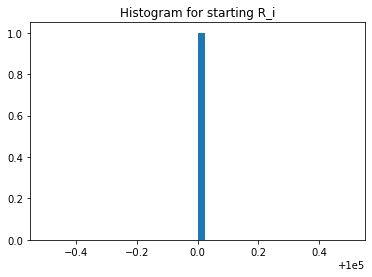

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([200000., 278041., 278478., ..., 197592., 176748., 173248.])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14782., 14905., 14806., 15072., 14616., 14924., 14783.,
       14535., 15034., 15105., 14911., 14746., 14815., 14757., 15195.,
       14925., 14968., 14908., 14763., 14638., 14823., 14887., 14993.,
       14828., 14827., 15070., 14747., 14937., 14979., 14855., 14615.,
       14795., 14796., 14849., 14930., 14948., 14938., 15103., 14988.,
       14835., 14962., 14869., 14602., 14861., 14726., 15016., 14748.,
       14954., 14870., 14695., 14838., 14818., 14798., 14832., 14977.,
       15014., 14809., 15152., 14780., 14854., 14736., 14894., 14788.,
       15040., 14700., 15217., 14952., 14750., 14865., 14737., 14871.,
       14910., 14756., 14860., 15019., 14965., 15056., 14955., 14985.,
       14919., 14878., 14836., 14890., 14935., 14698., 14758., 14759.,
       15022., 14844., 15003., 14646., 15074., 14885., 15111., 14687.,
       14671., 14921., 14760., 14917., 14784., 14857., 14841., 15110.,
       14842., 15004., 14773., 14803., 15041., 14797., 14931., 15073.,
      

In [25]:
experiments.UNI_Qj.unique()

array([200000.])

In [26]:
experiments.UNI_Rj.unique()

array([100000.])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([100000.])

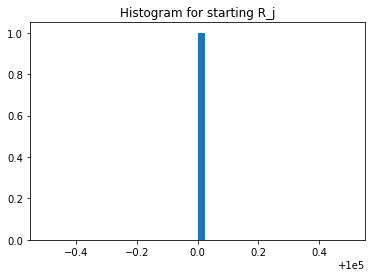

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([100000.])

In [31]:
experiments.UNI_ji.unique()

array([100000.])

In [32]:
experiments.UNI_Sij.unique()

array([1.e+10])

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


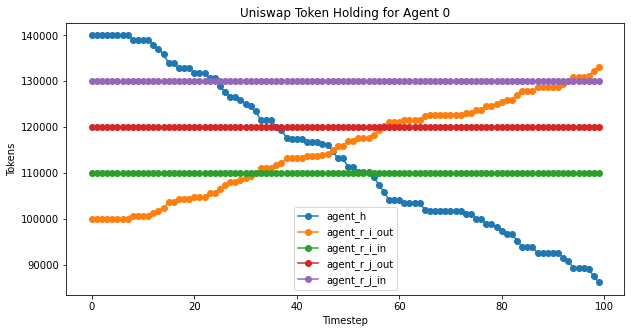

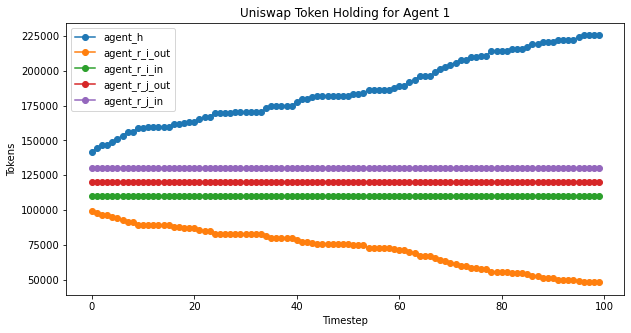

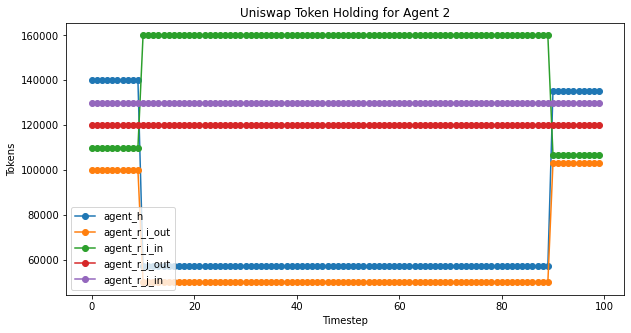

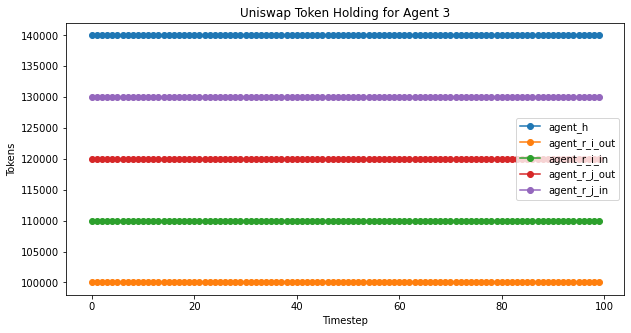

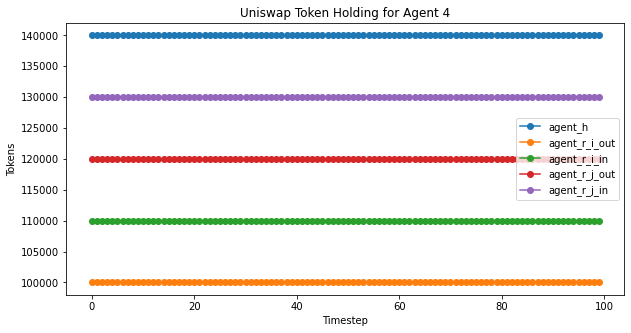

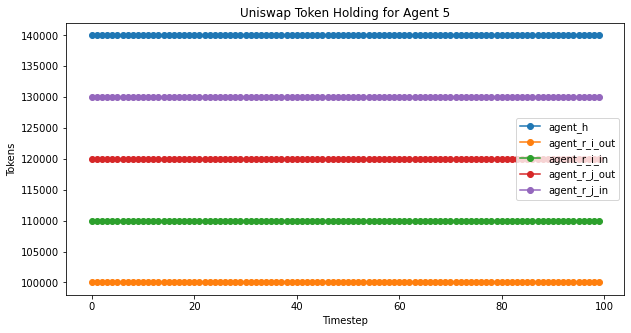

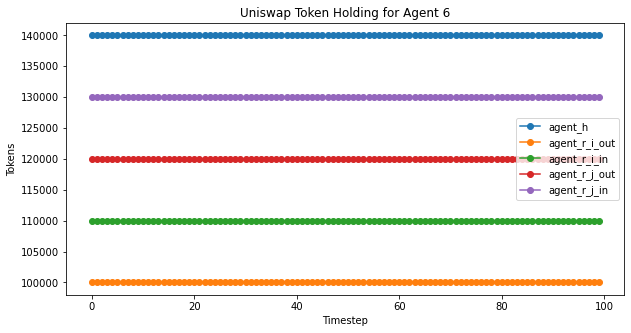

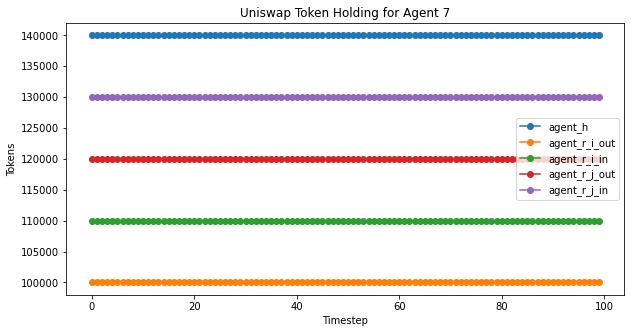

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


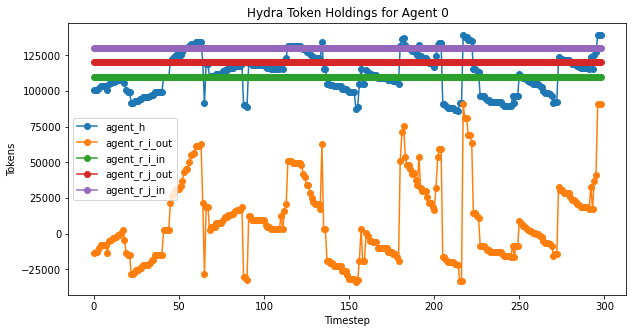

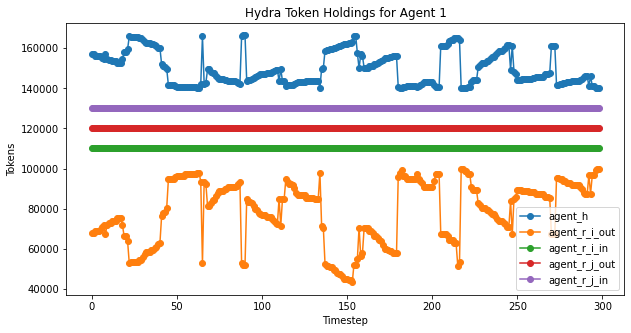

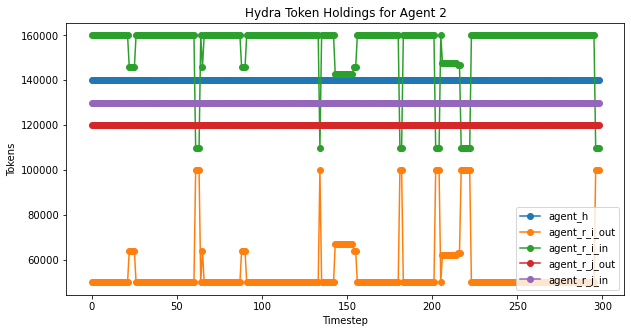

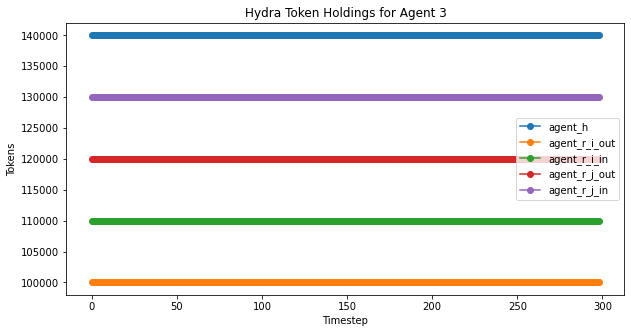

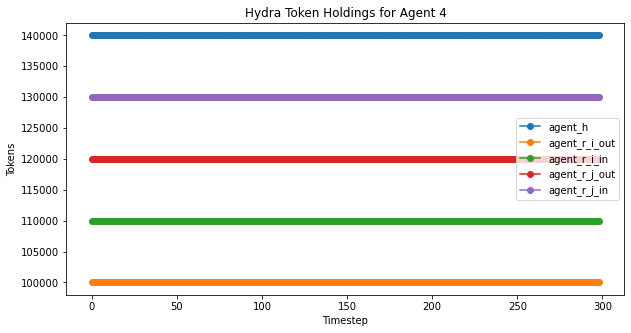

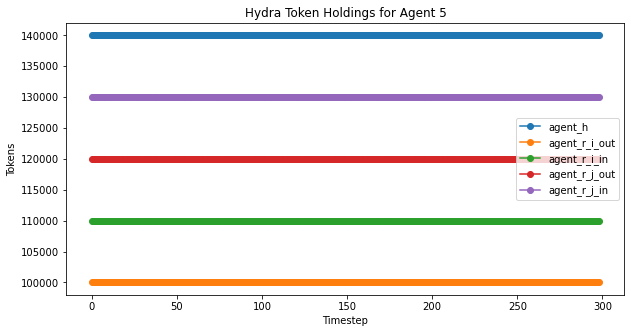

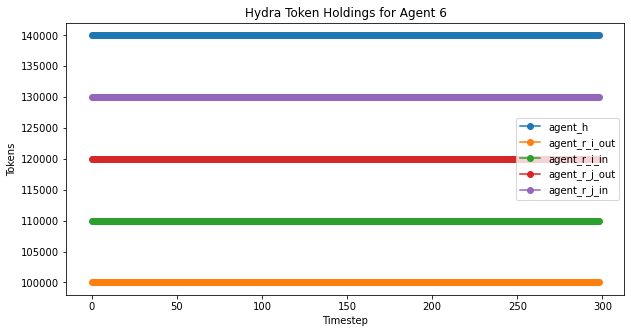

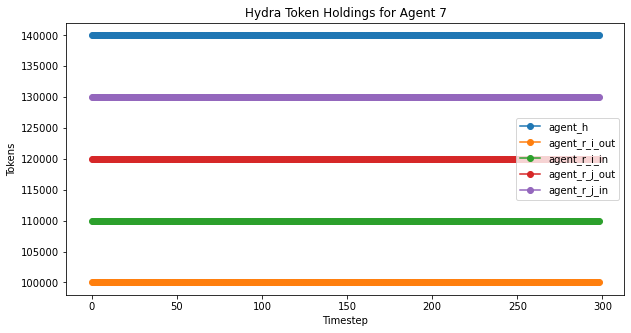

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

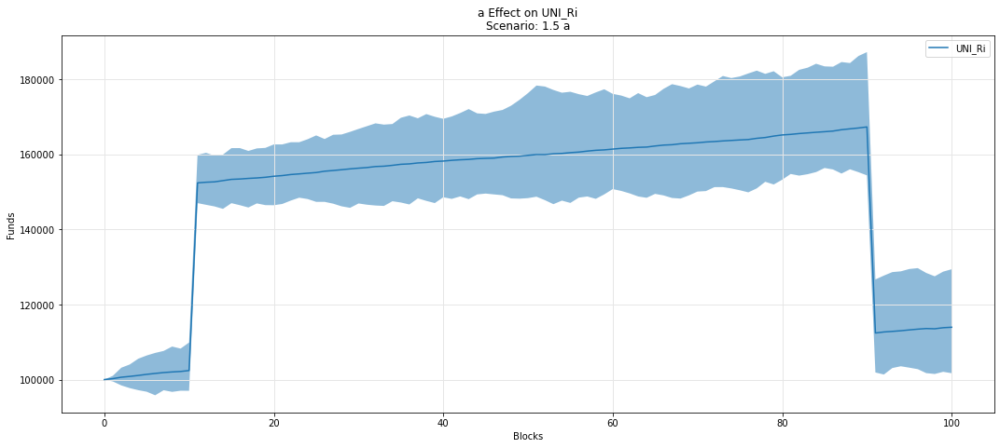

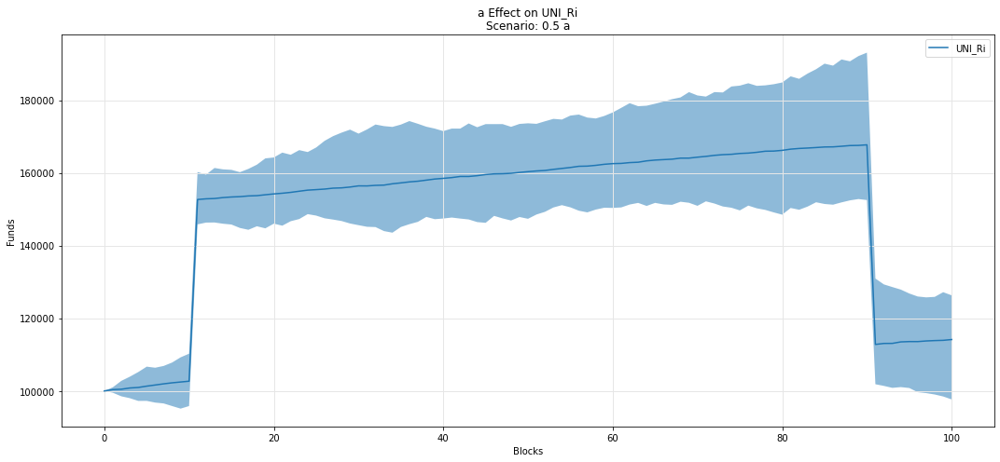

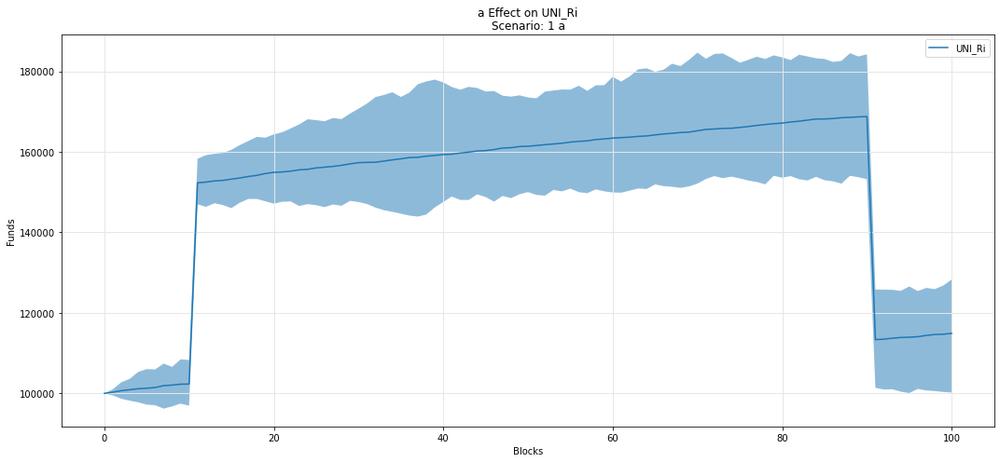

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

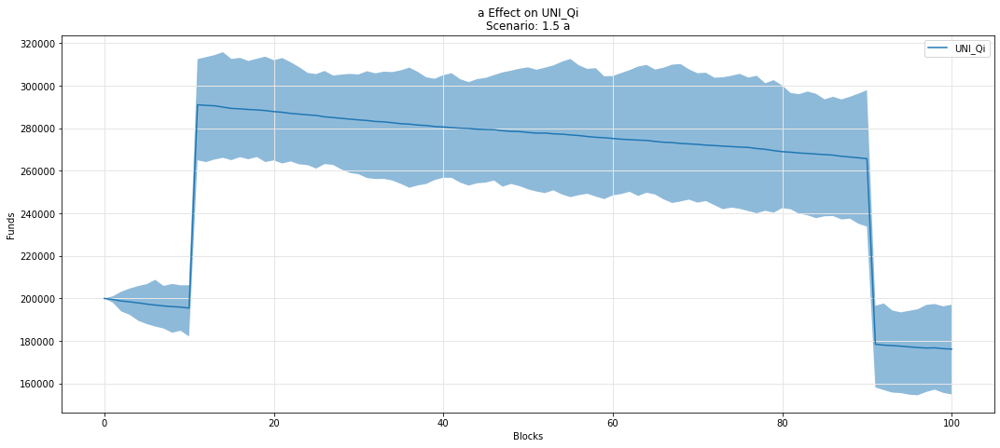

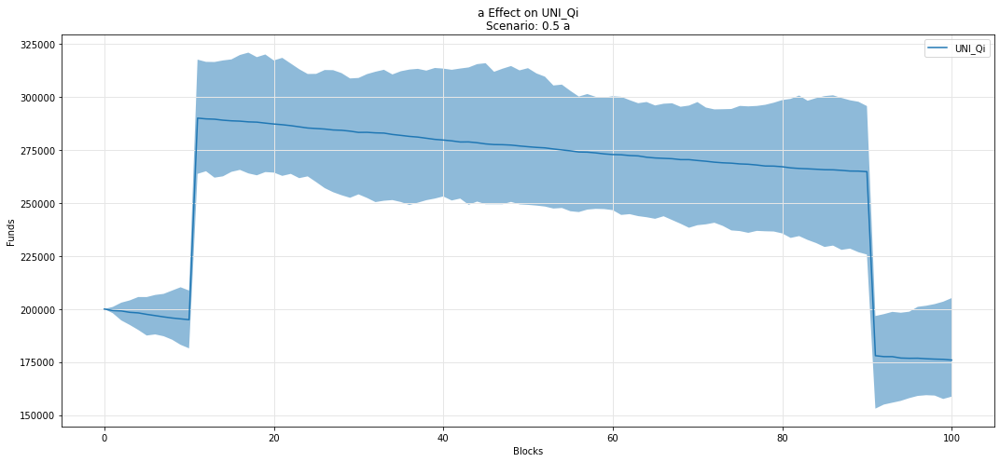

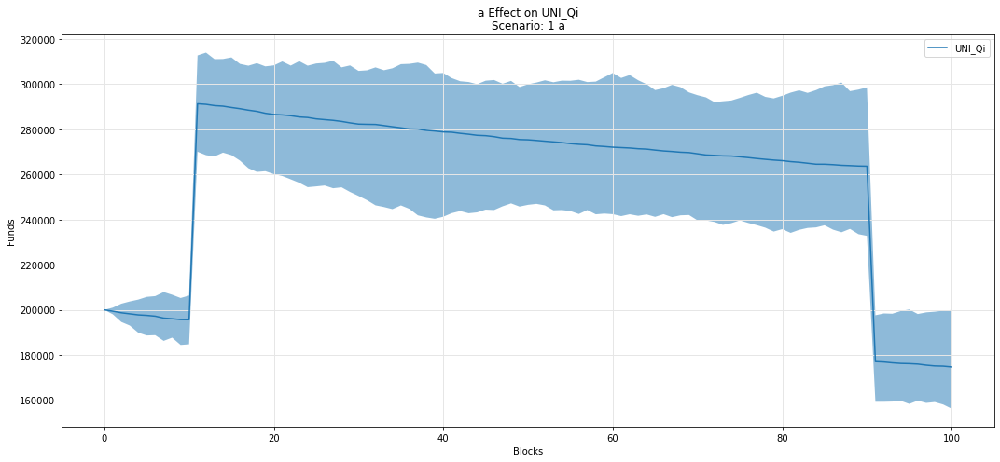

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

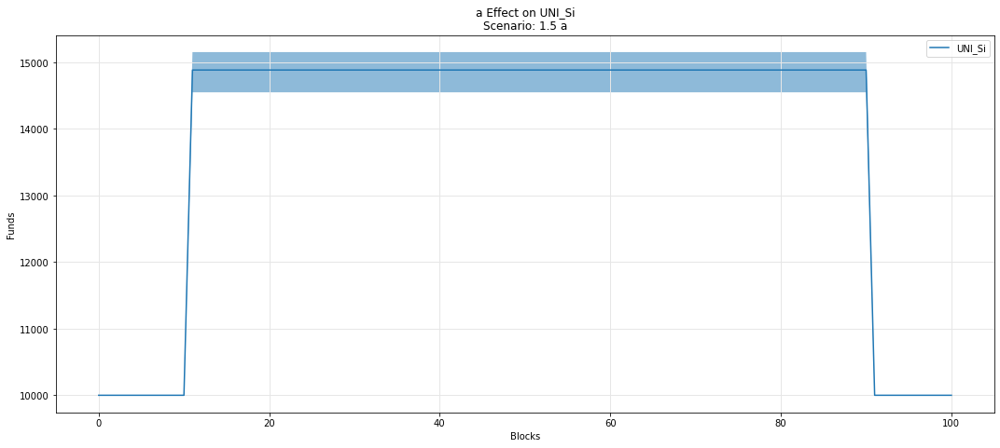

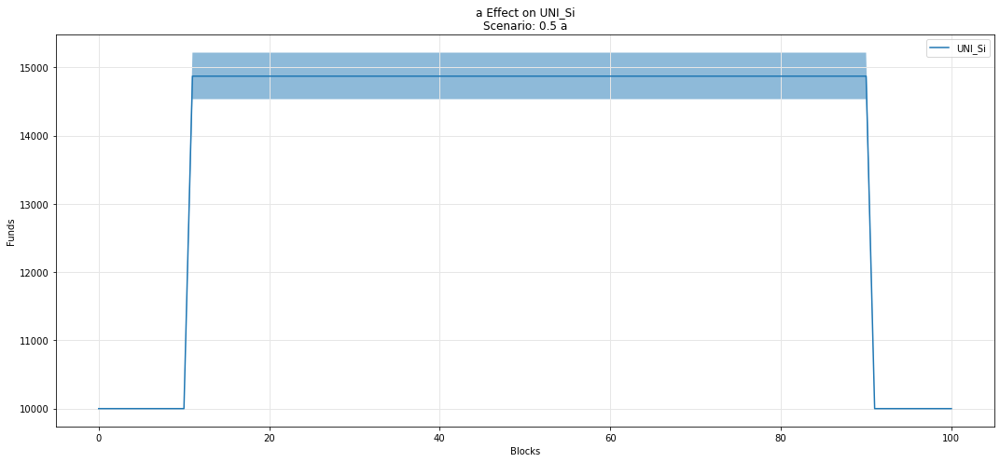

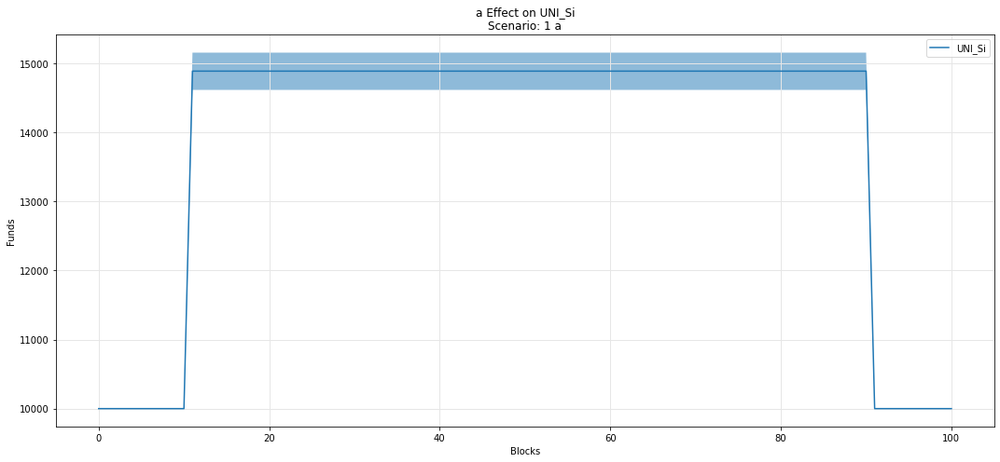

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

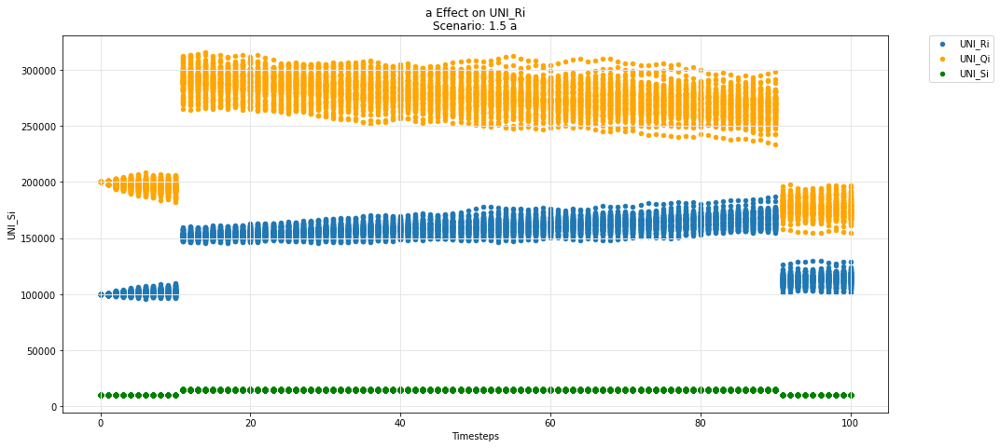

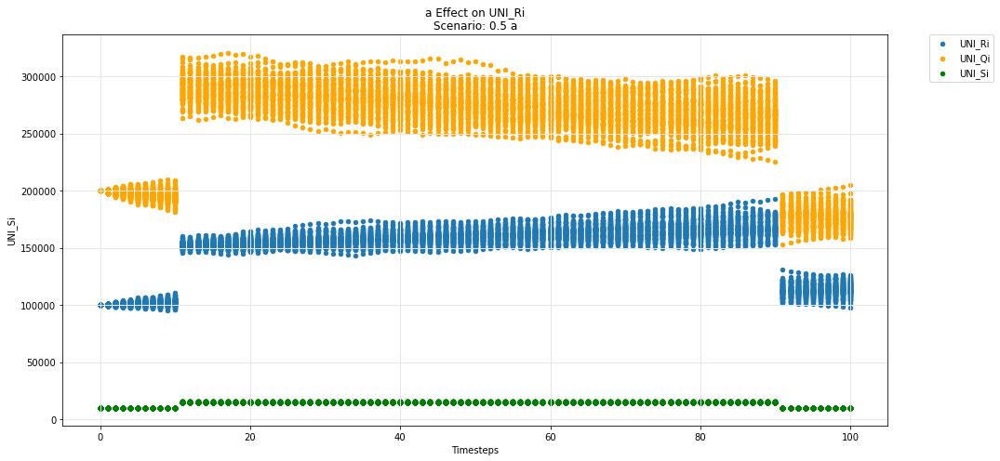

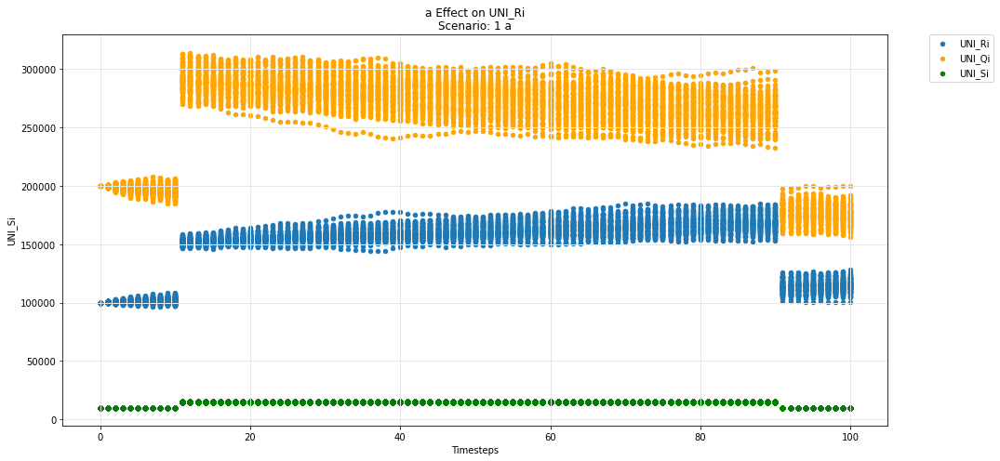

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

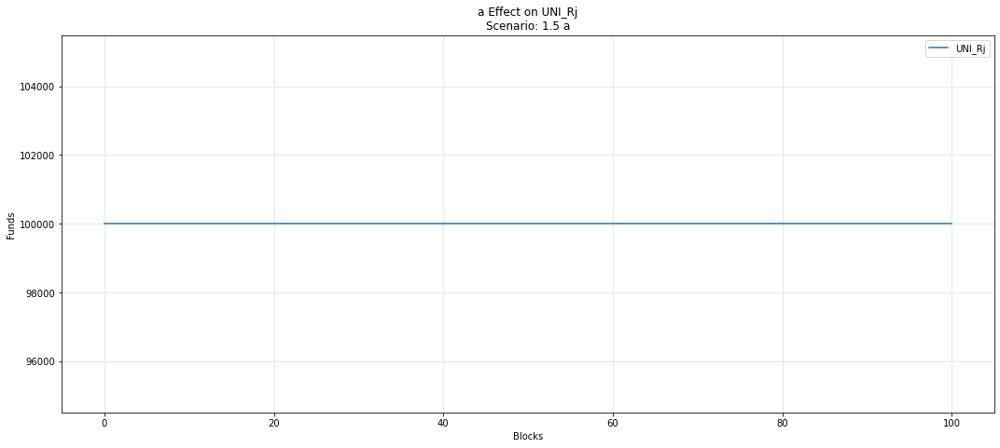

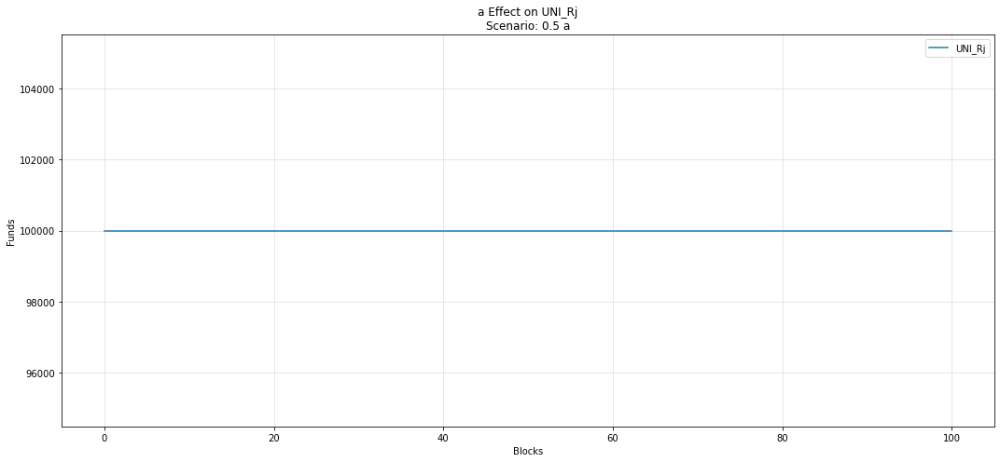

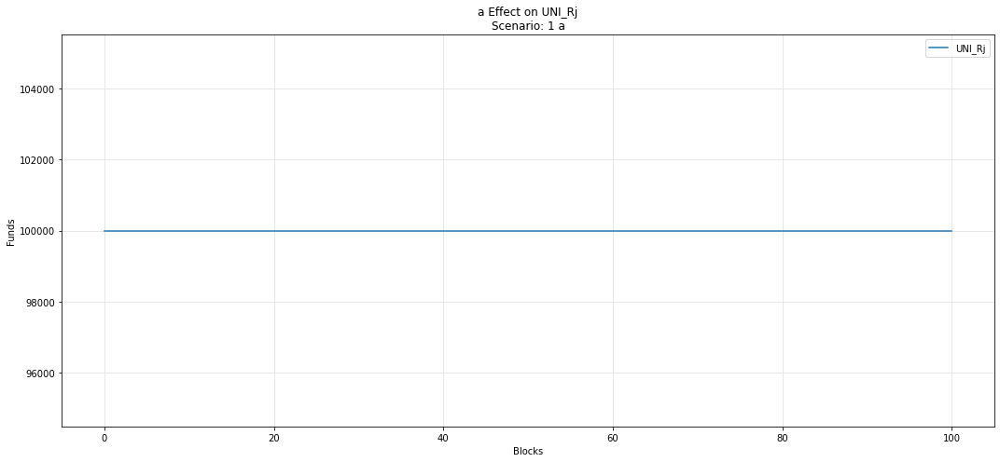

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

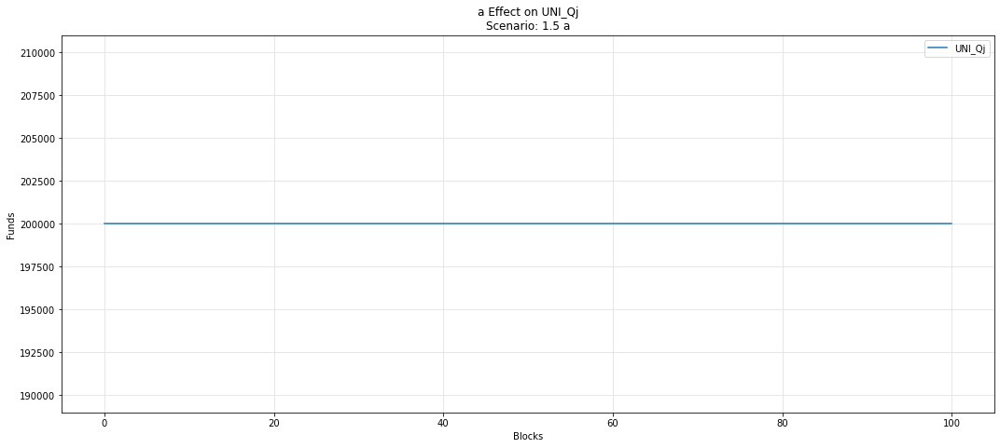

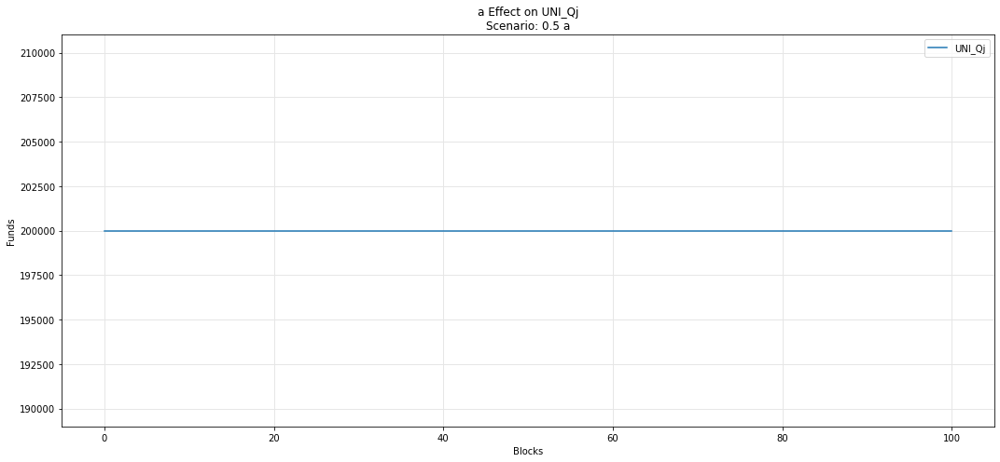

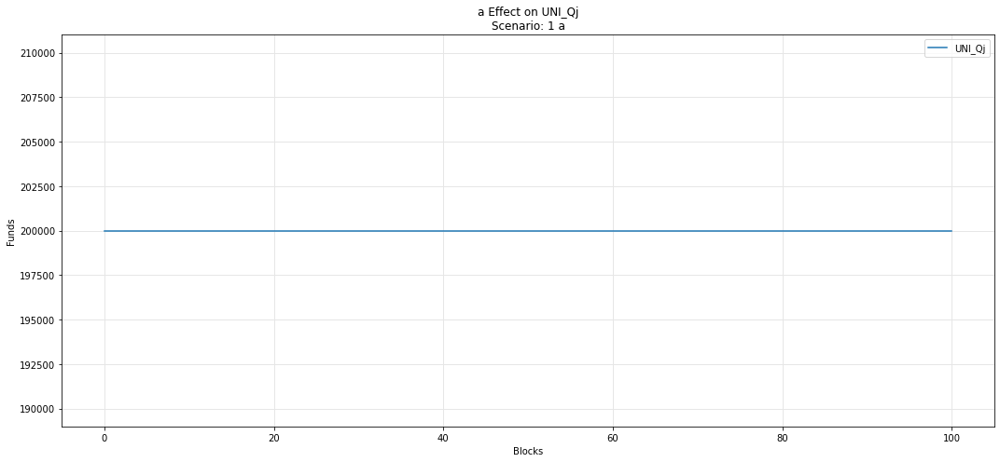

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

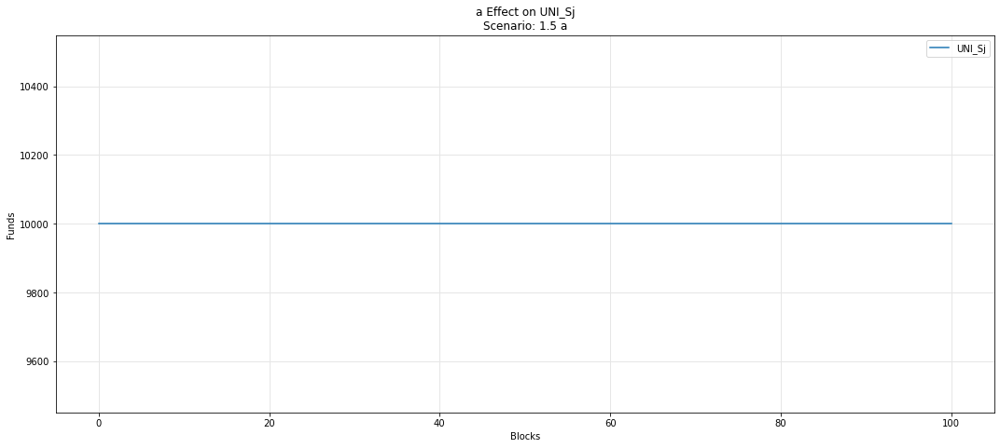

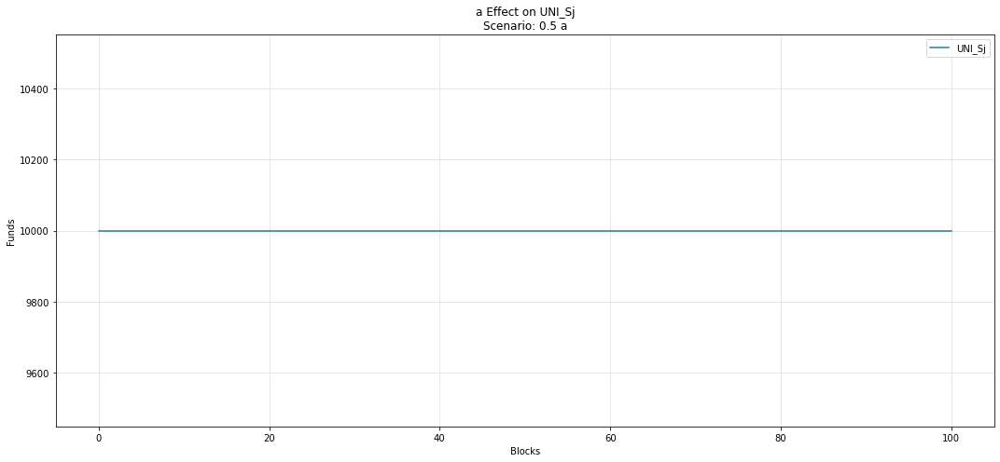

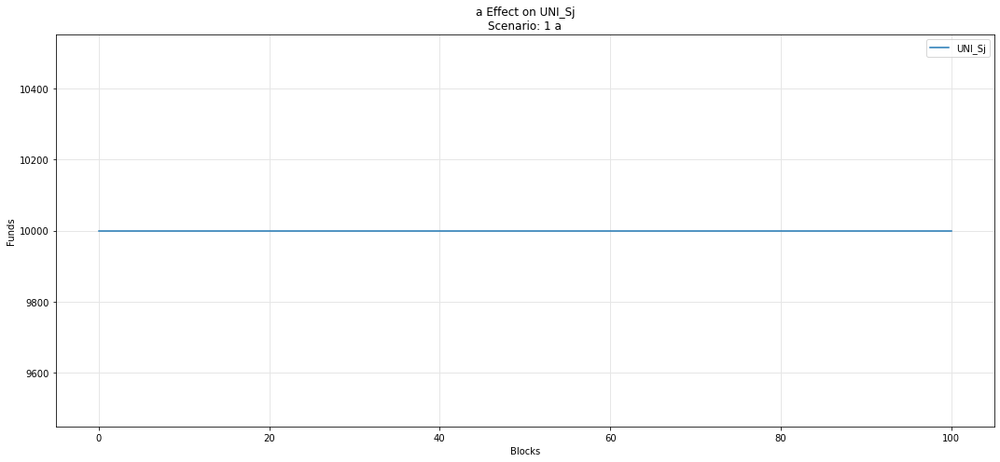

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

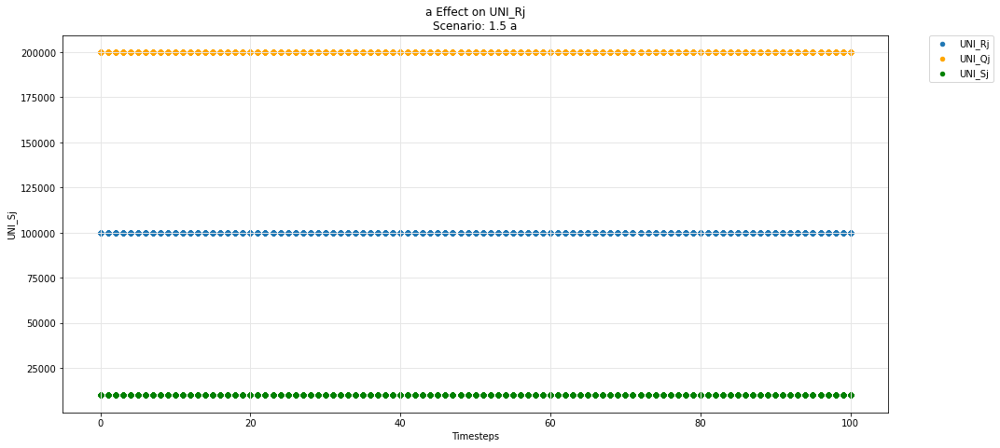

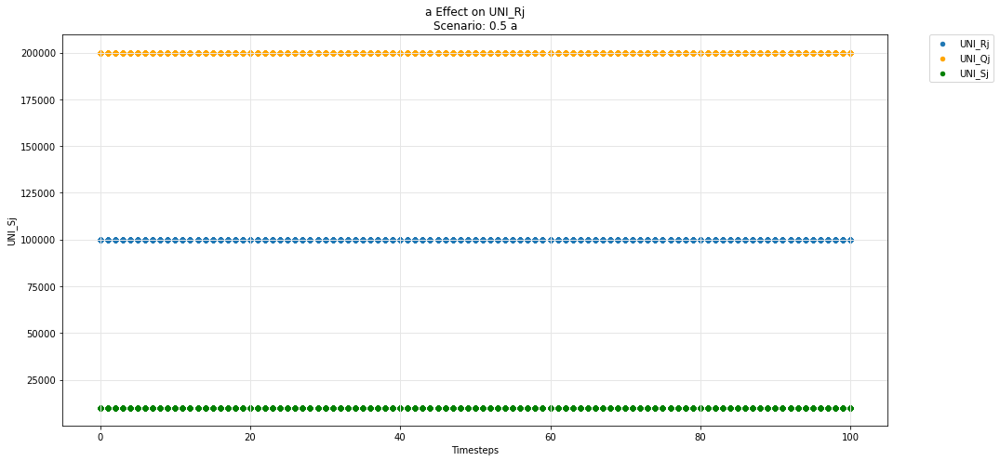

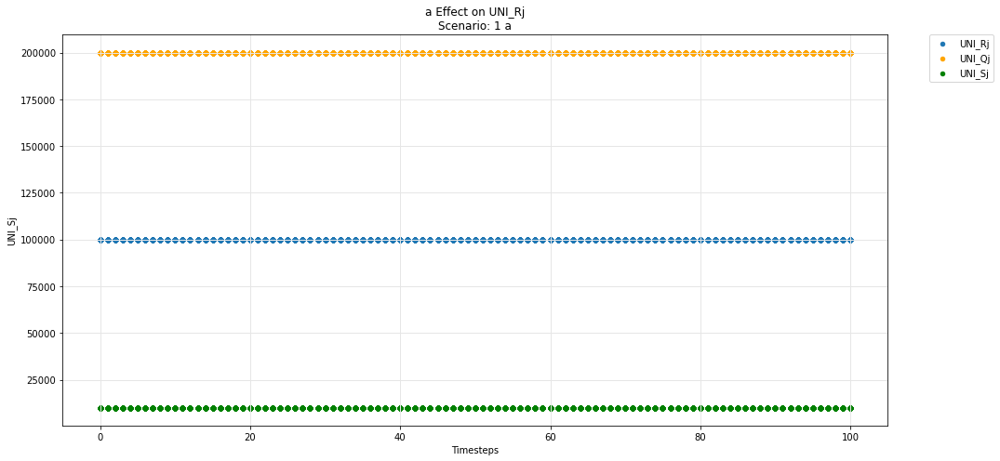

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

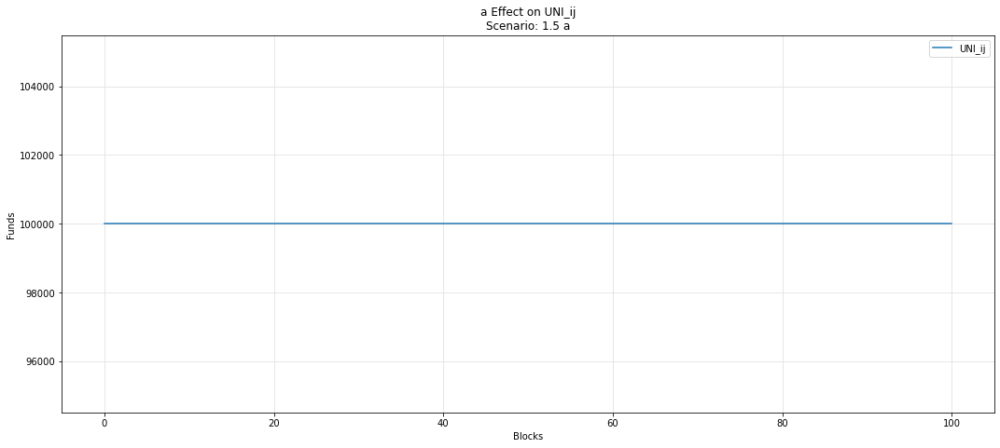

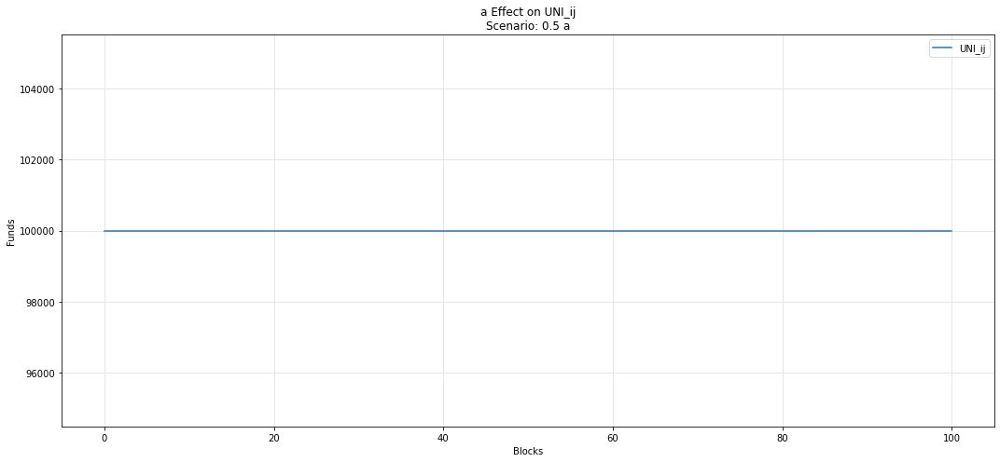

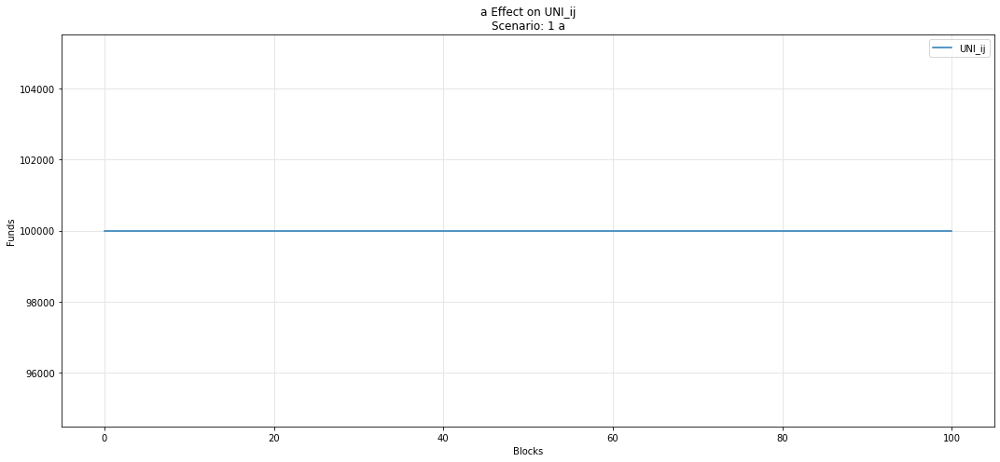

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

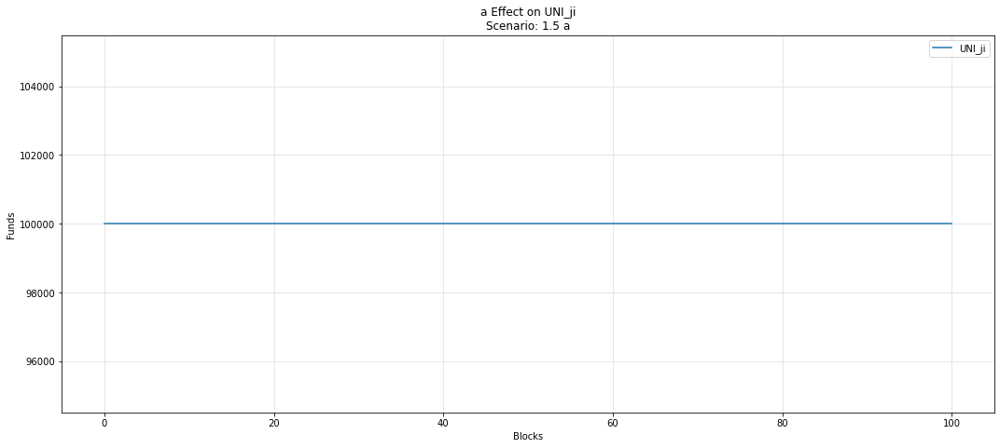

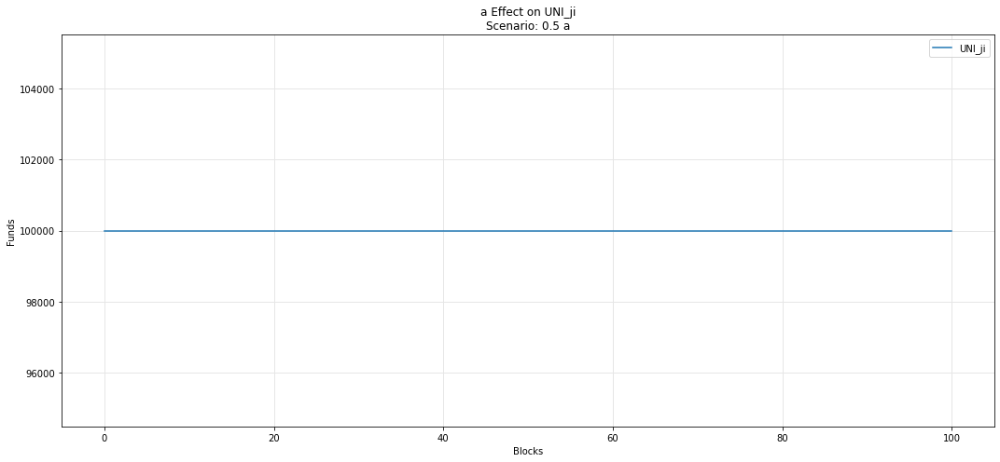

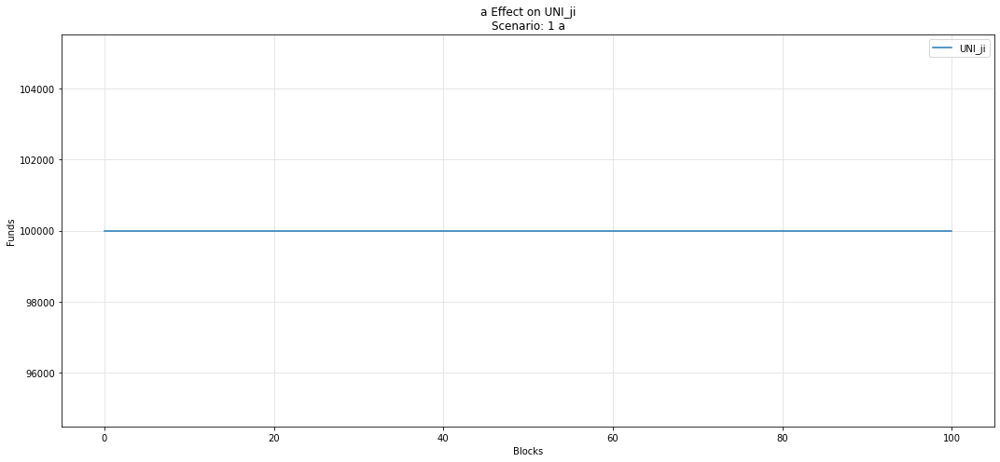

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

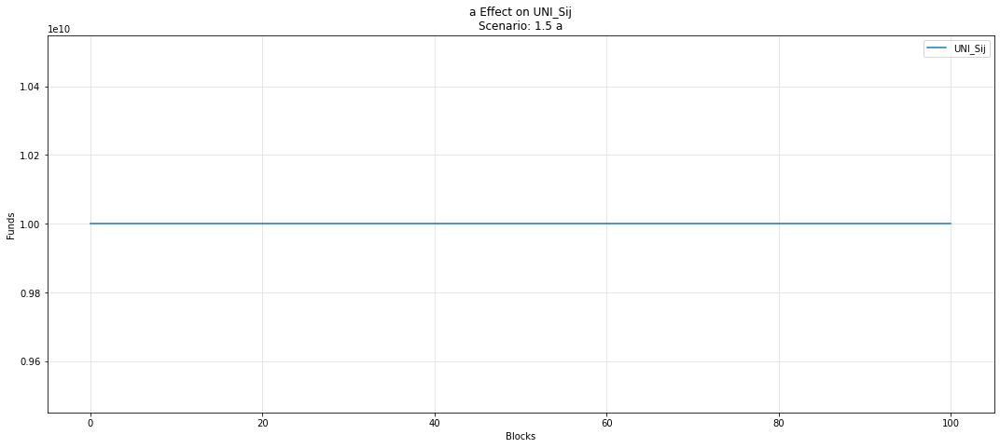

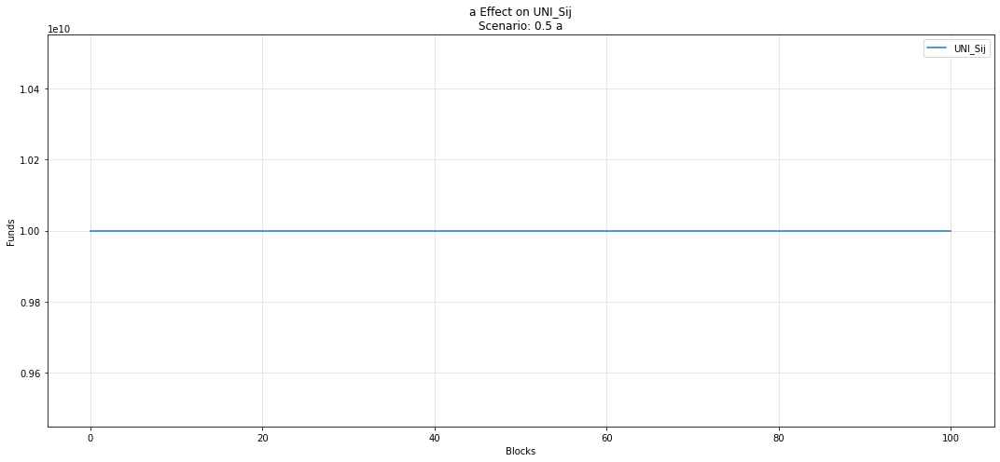

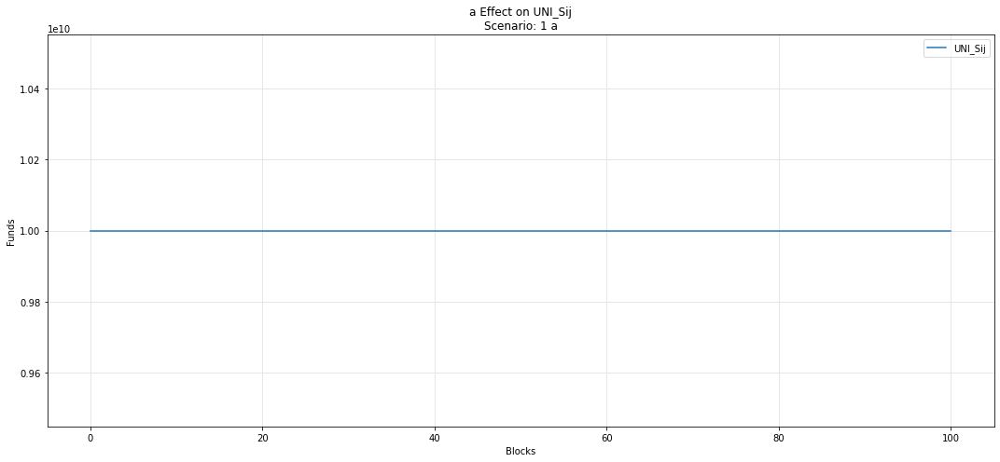

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

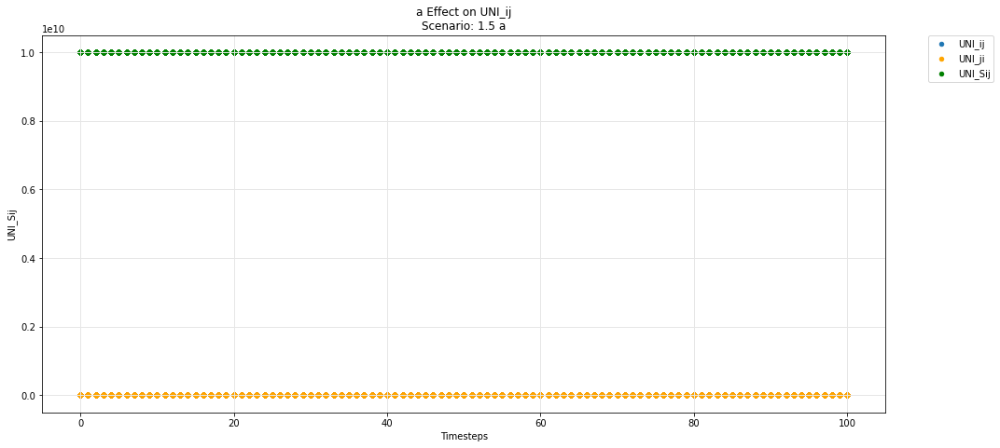

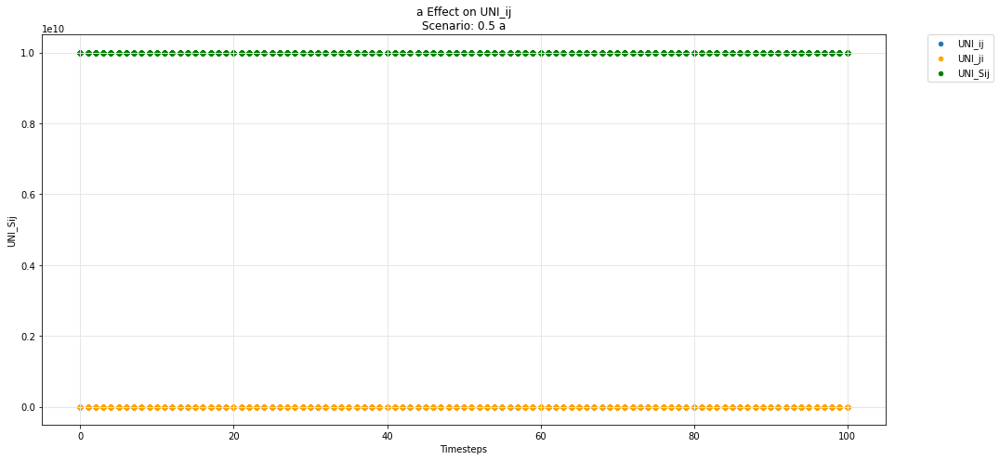

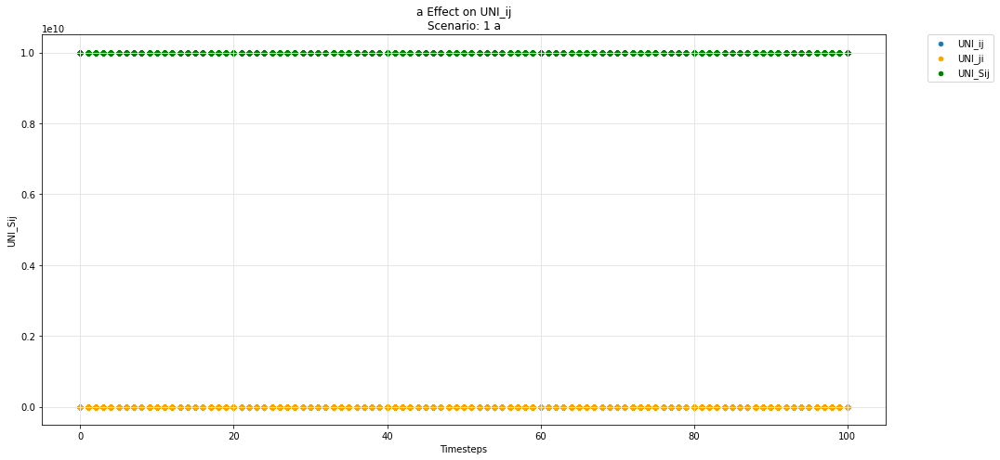

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

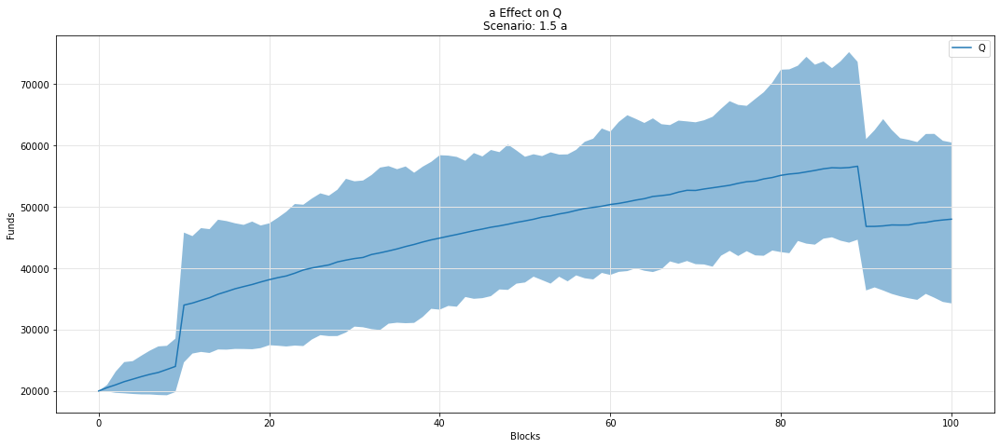

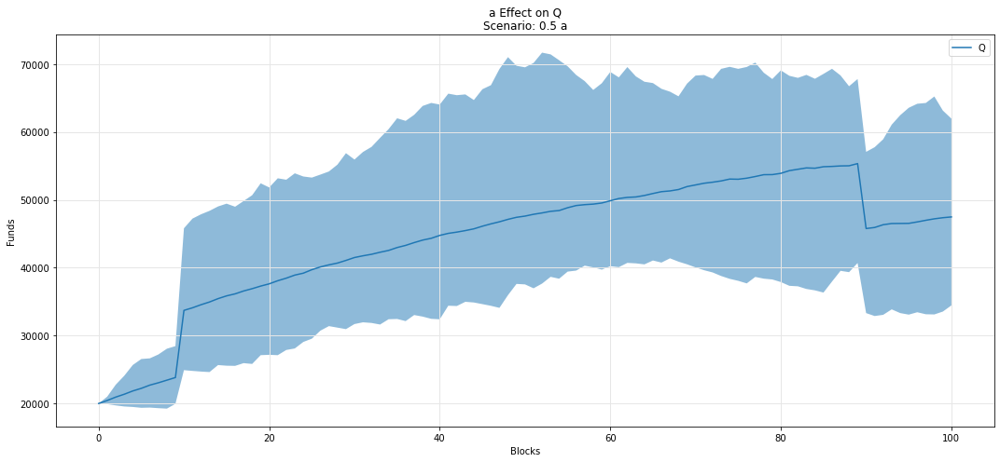

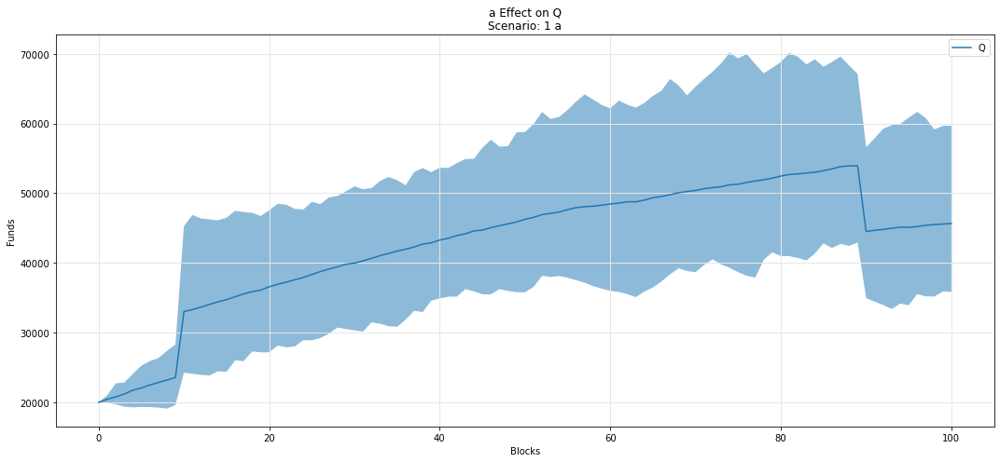

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

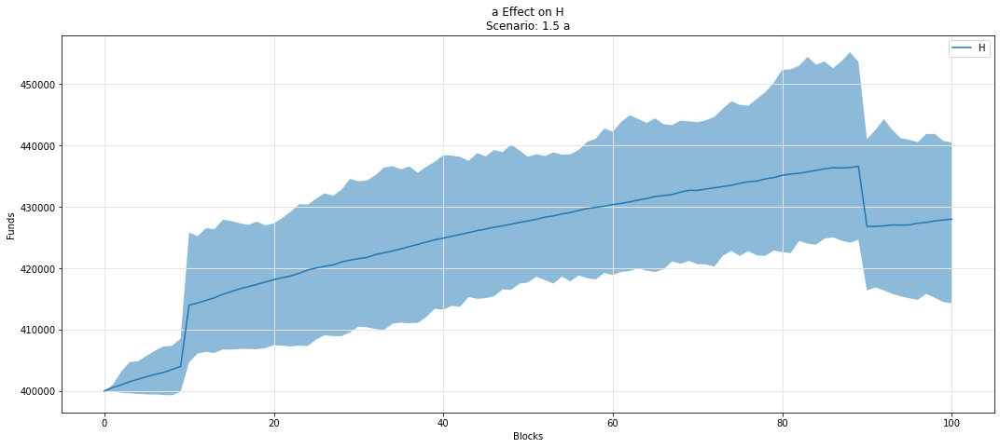

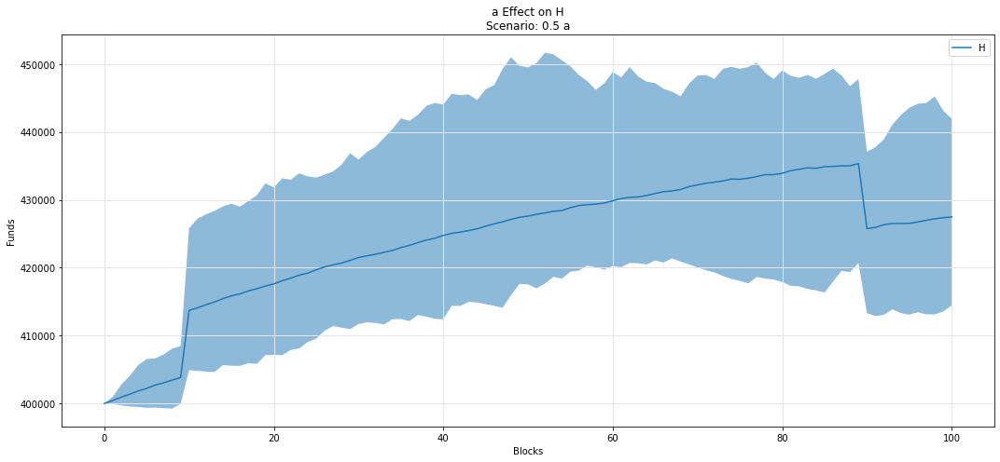

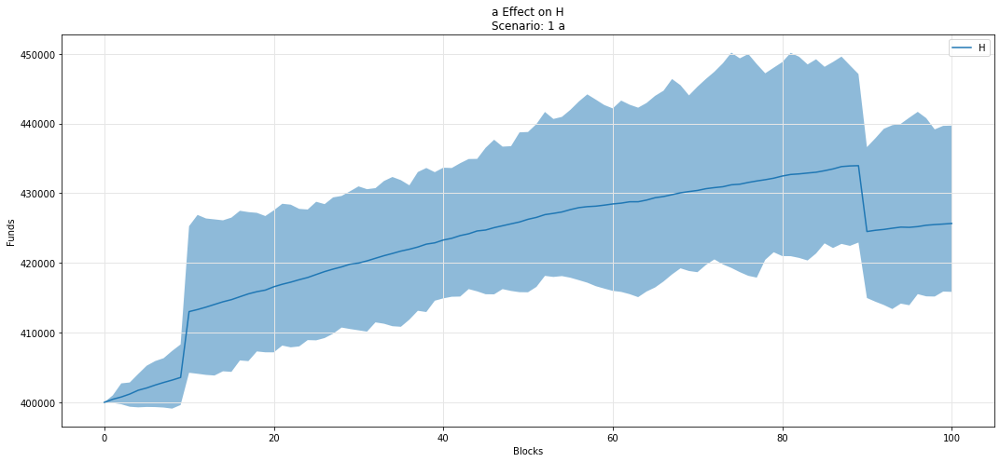

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

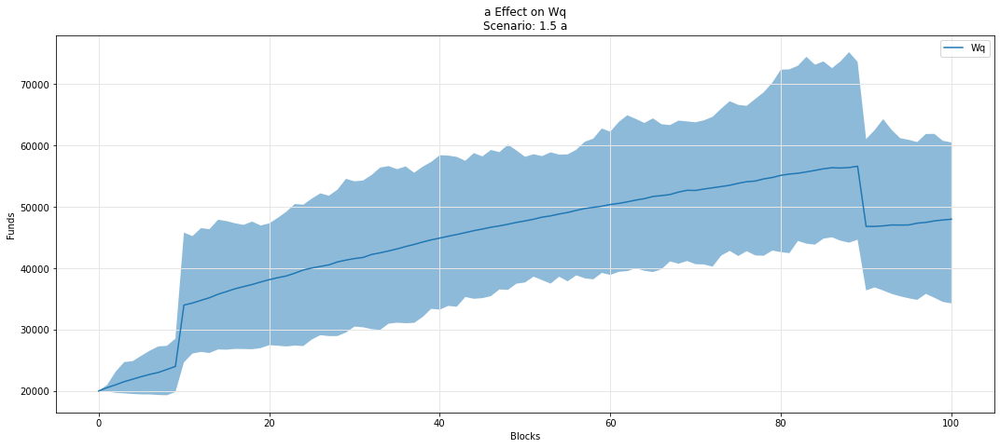

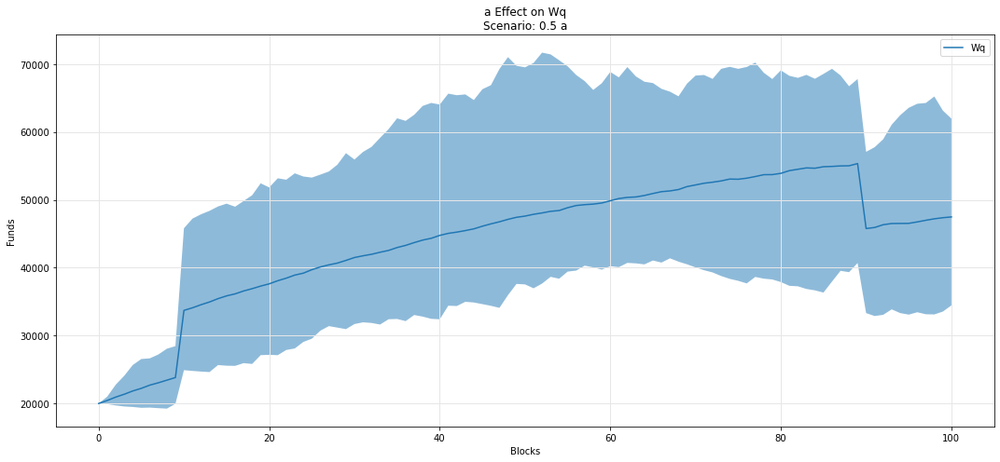

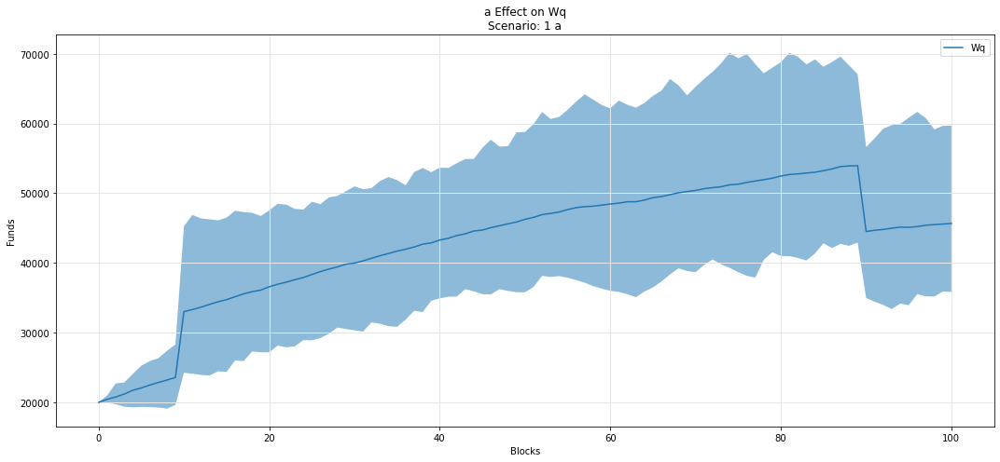

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

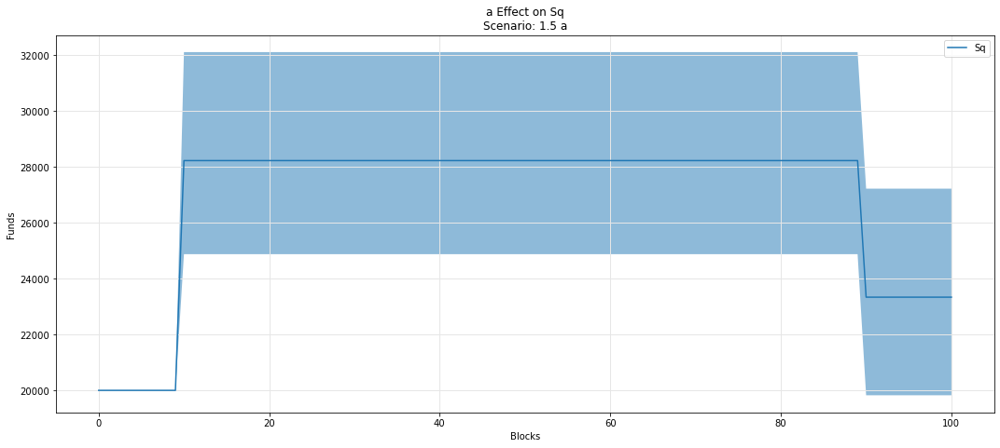

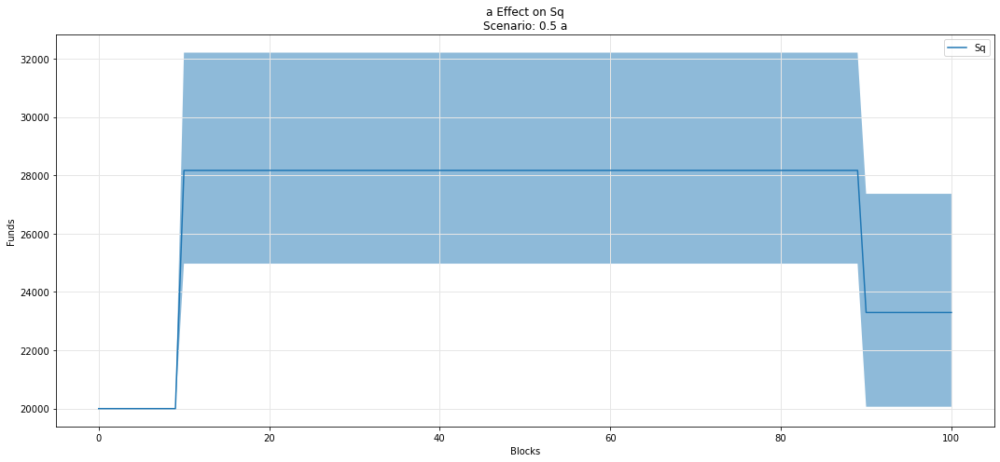

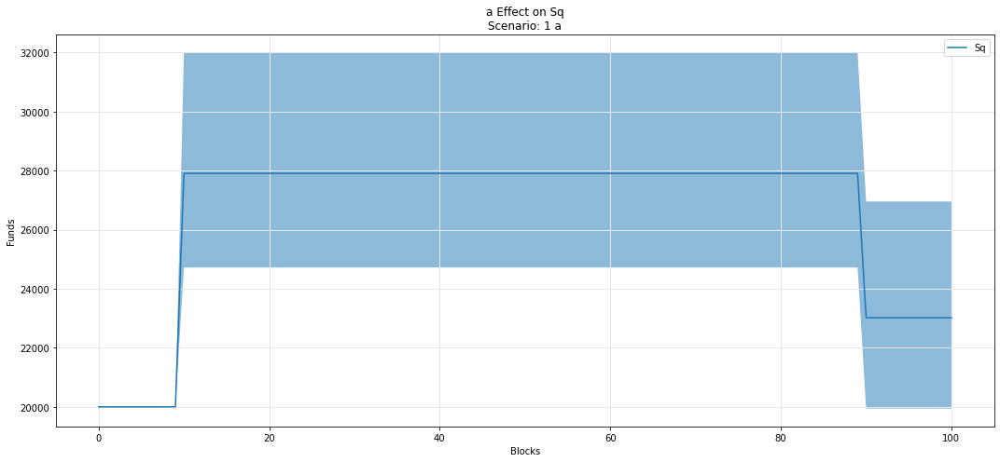

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

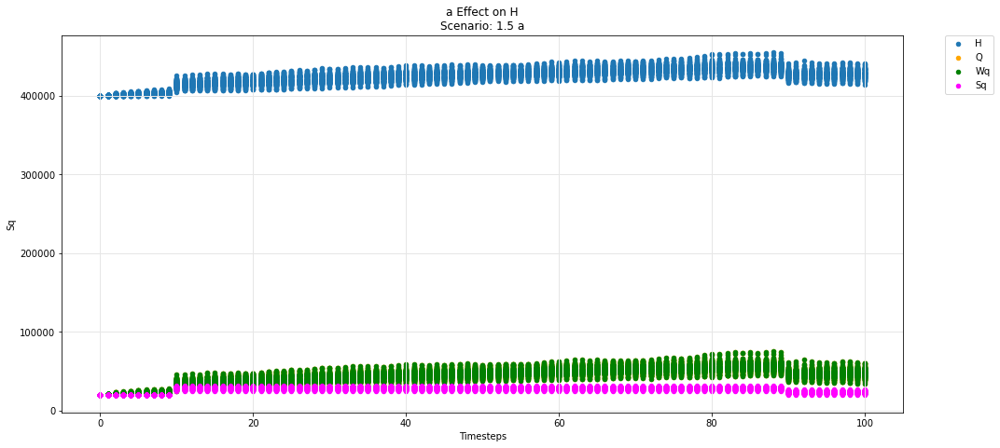

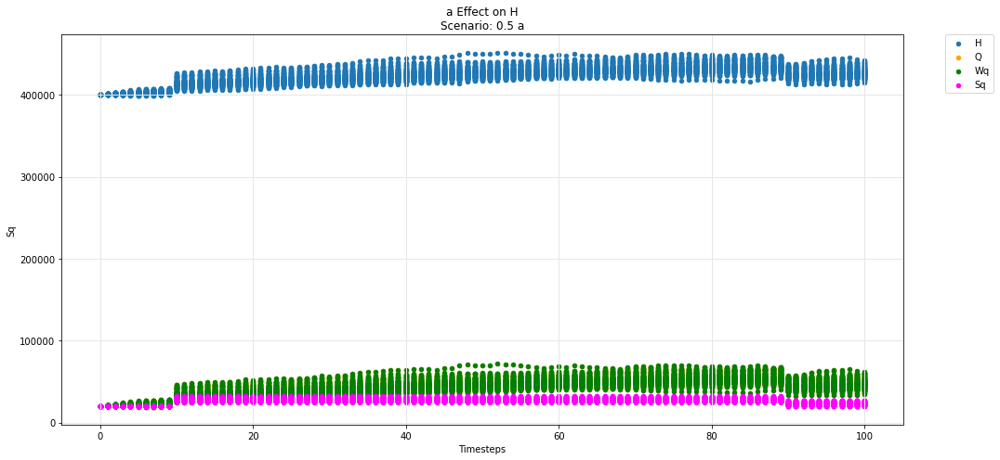

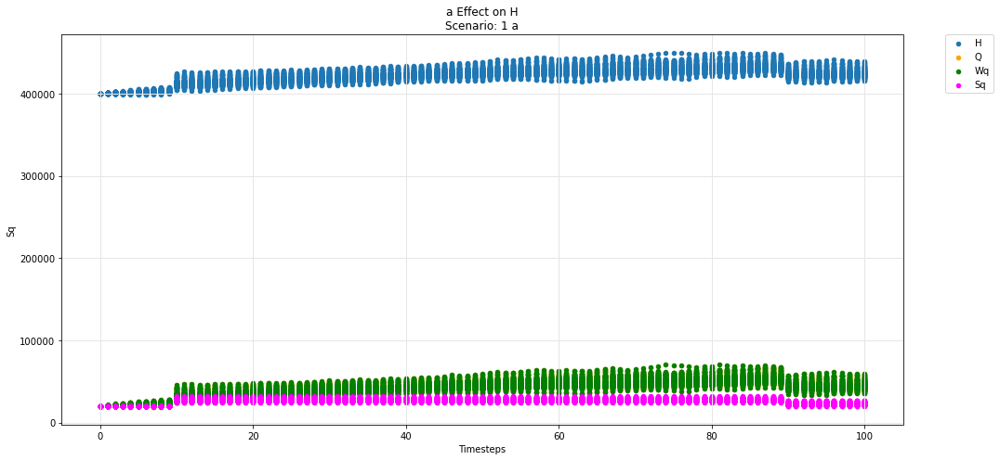

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

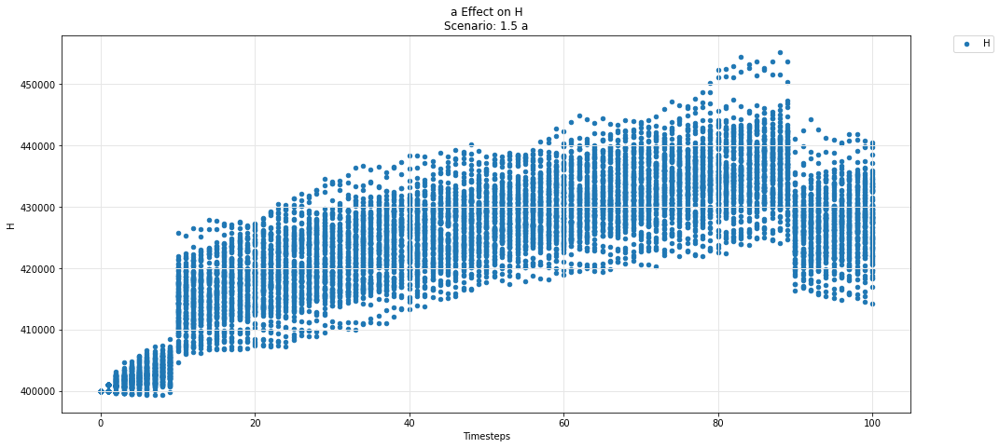

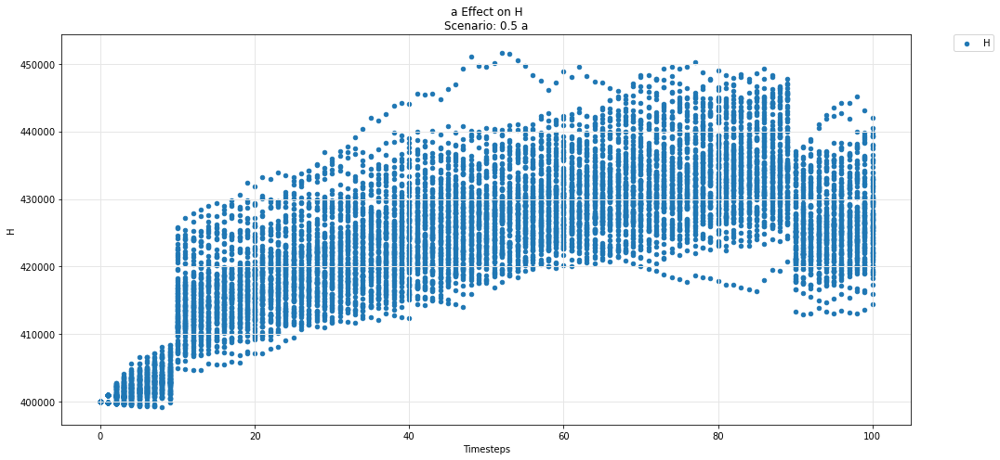

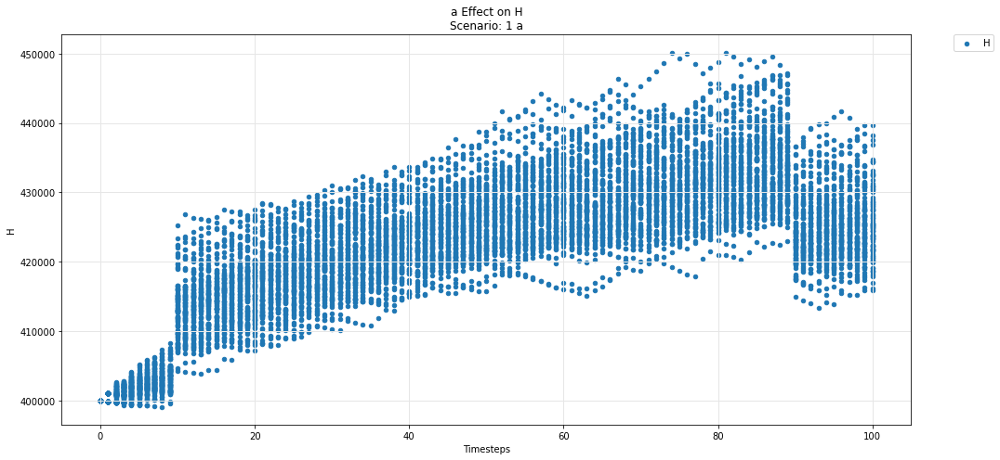

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

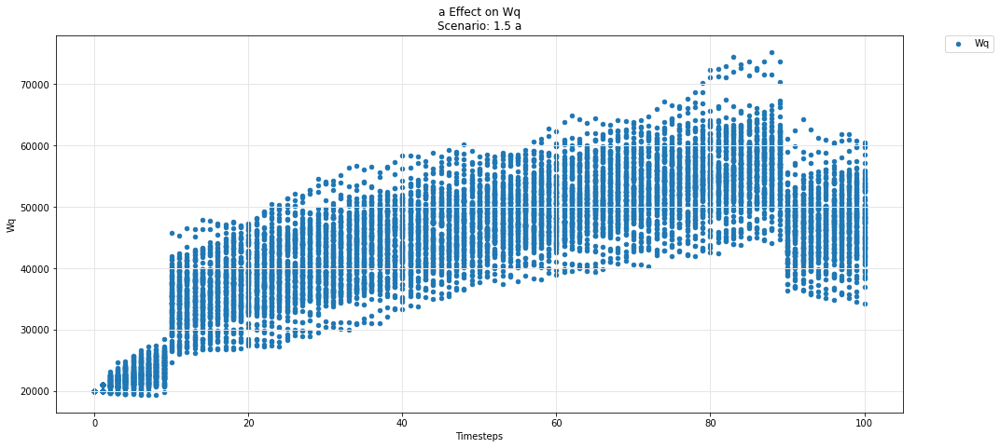

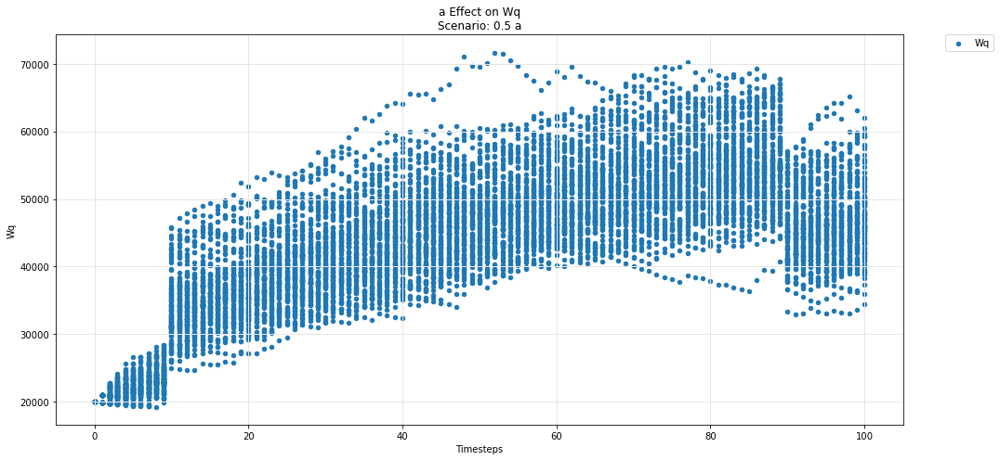

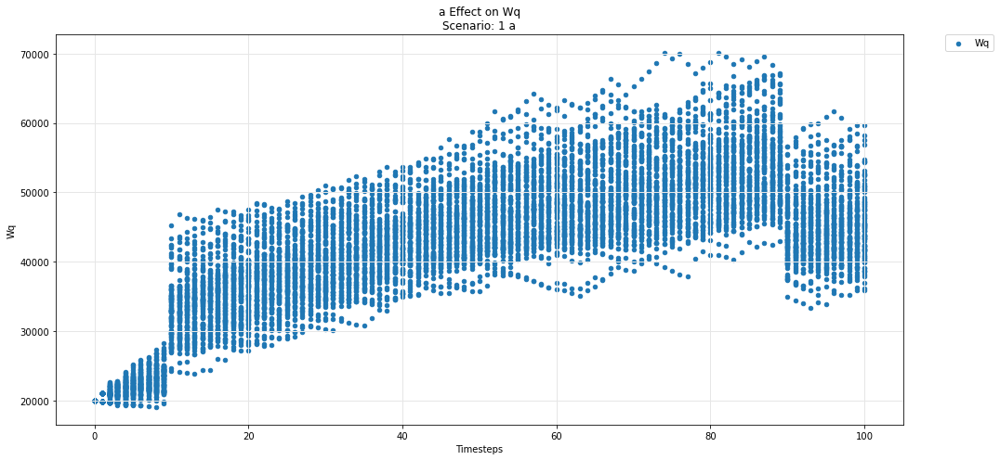

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

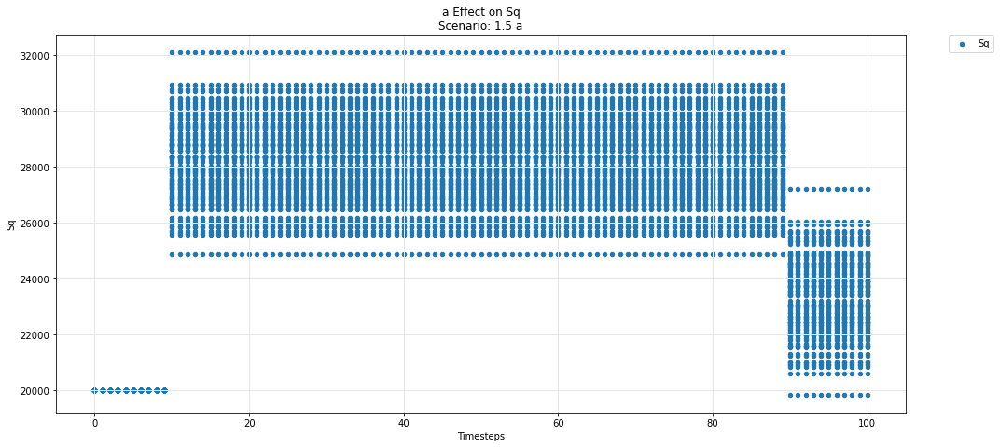

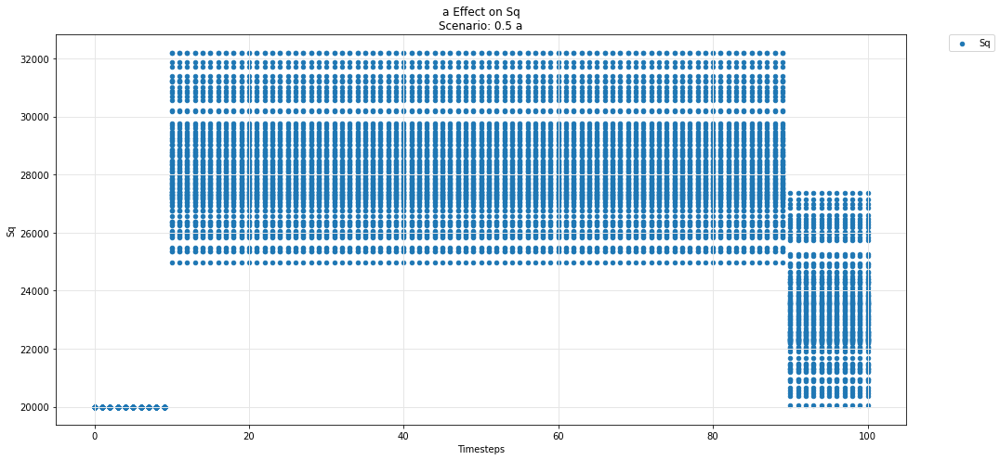

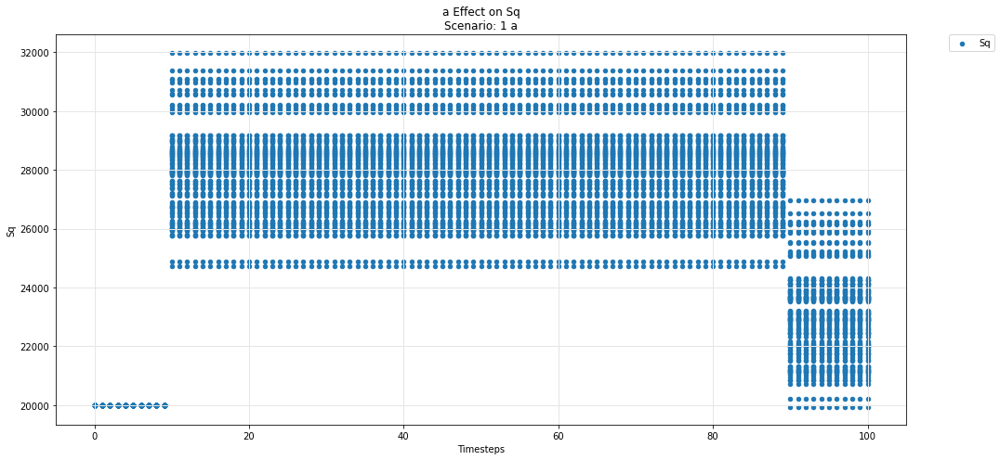

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

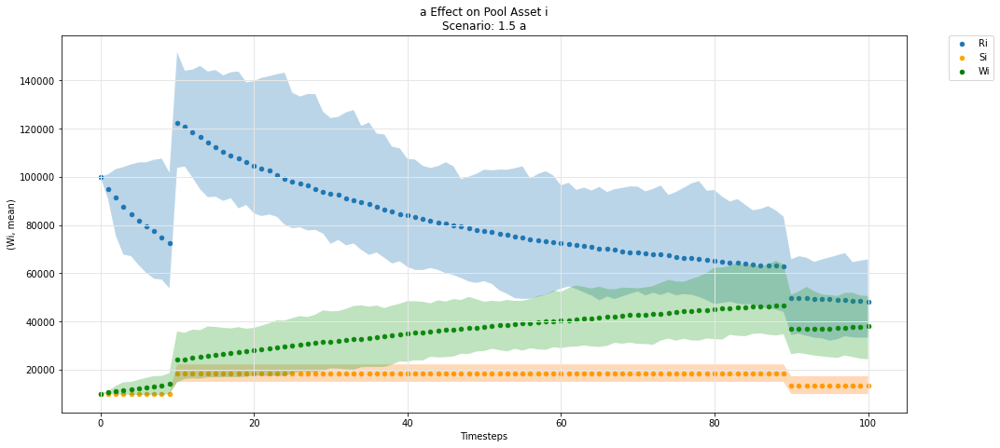

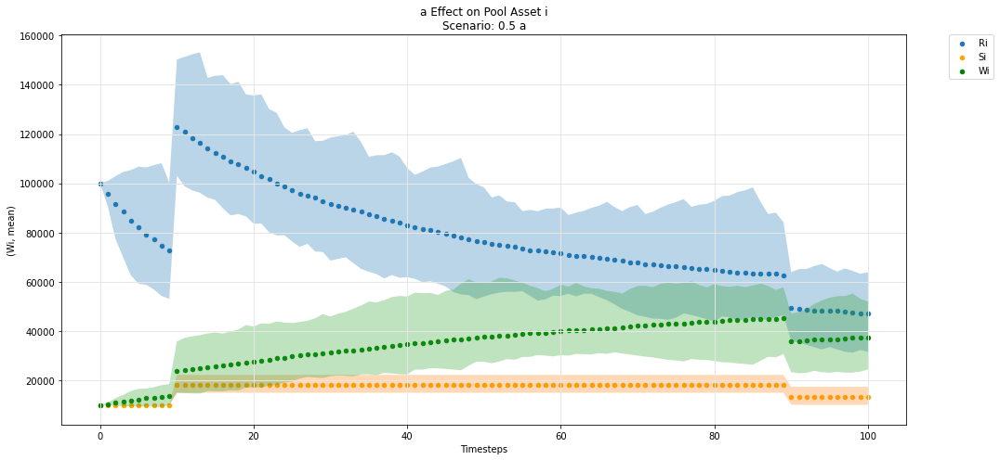

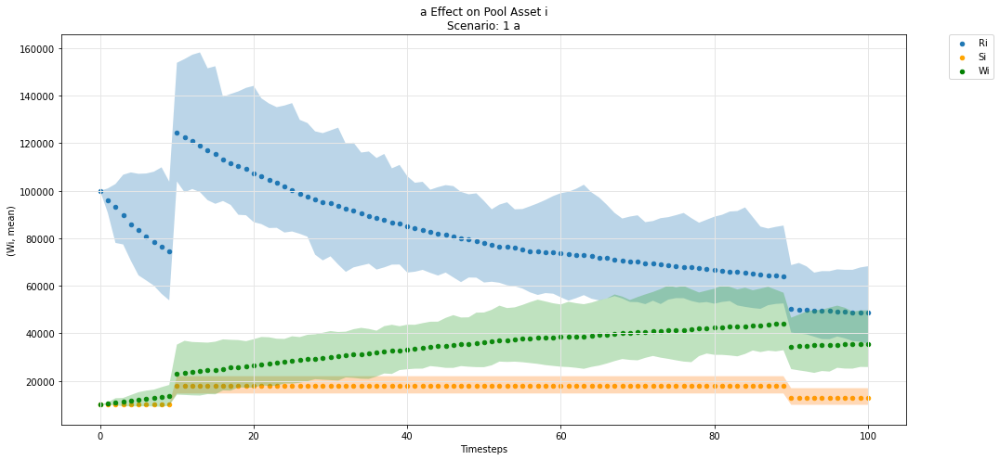

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

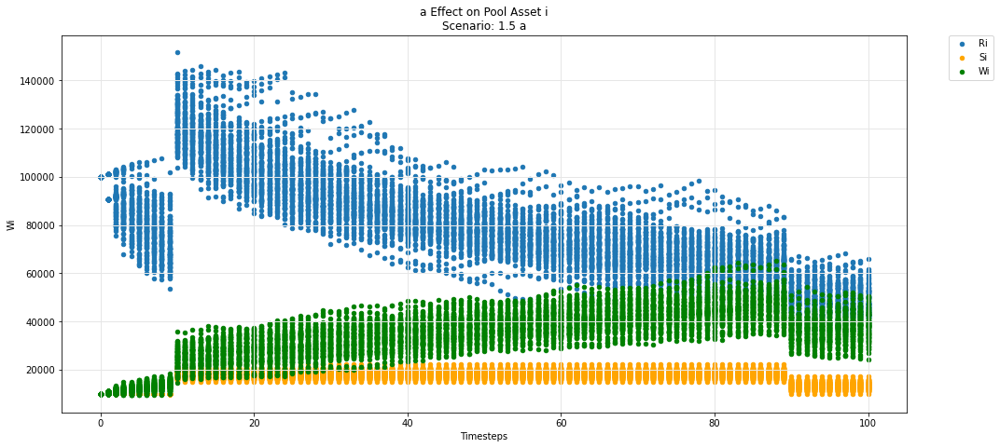

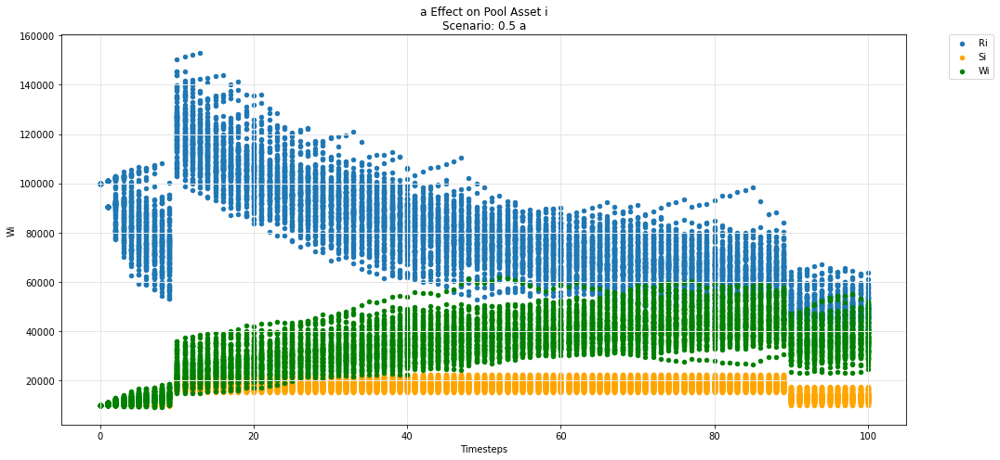

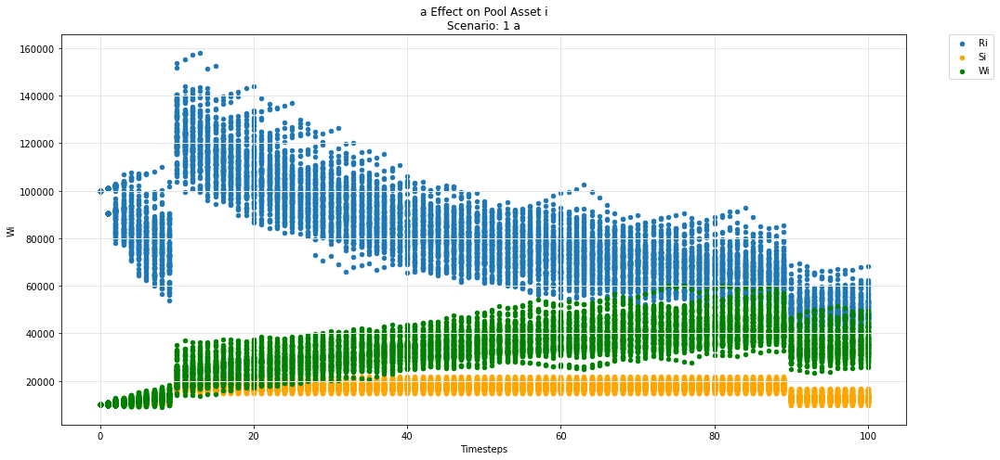

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

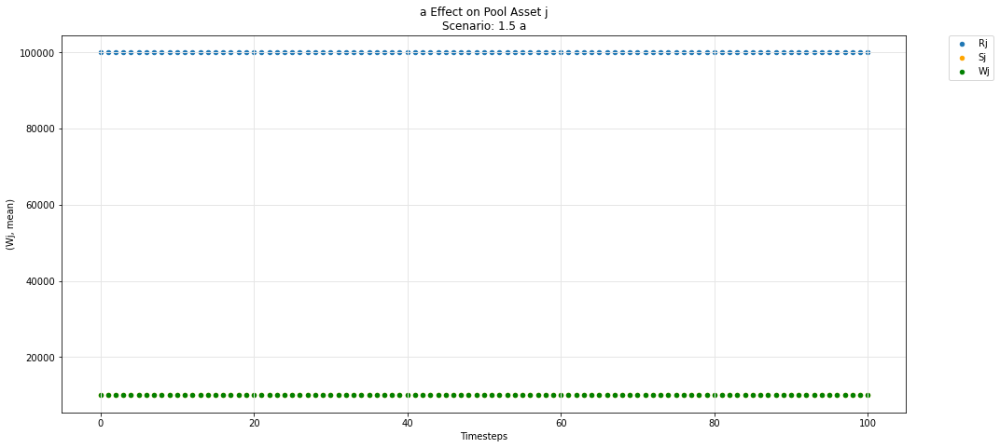

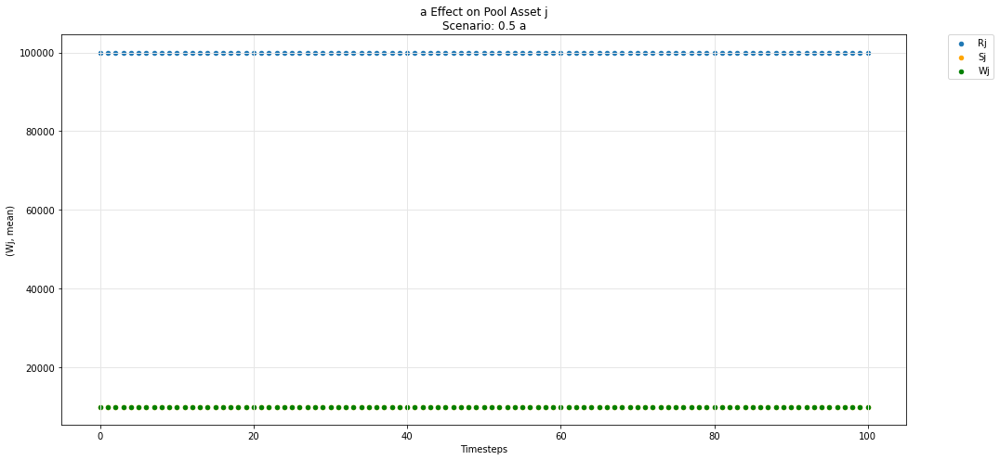

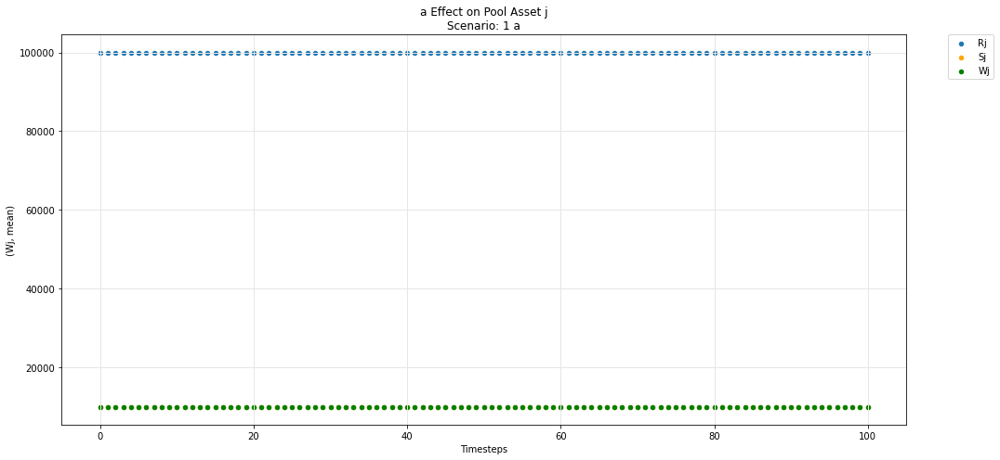

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

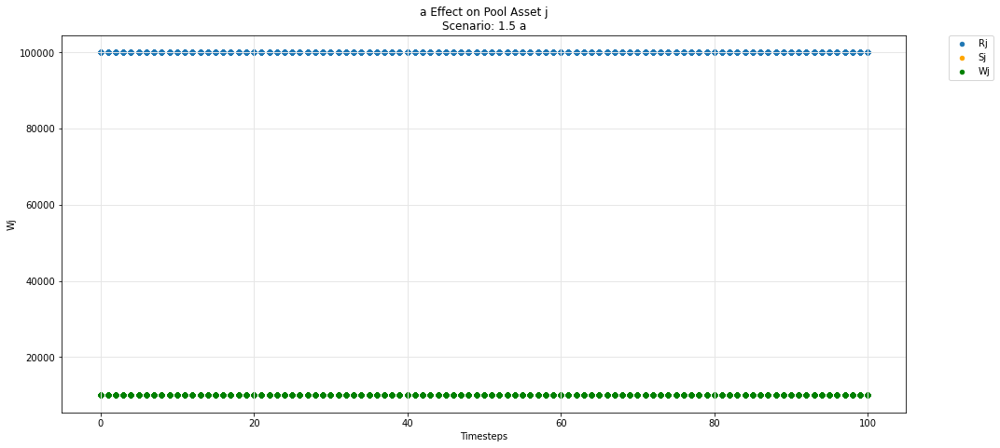

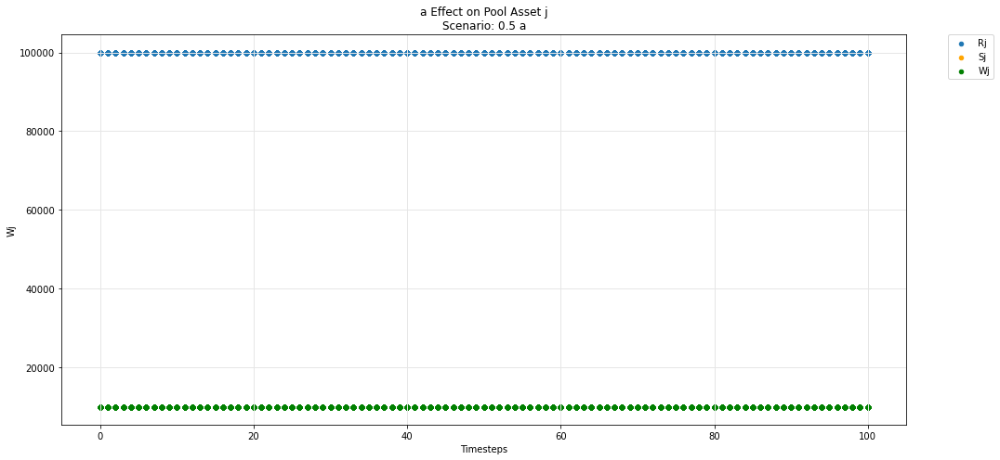

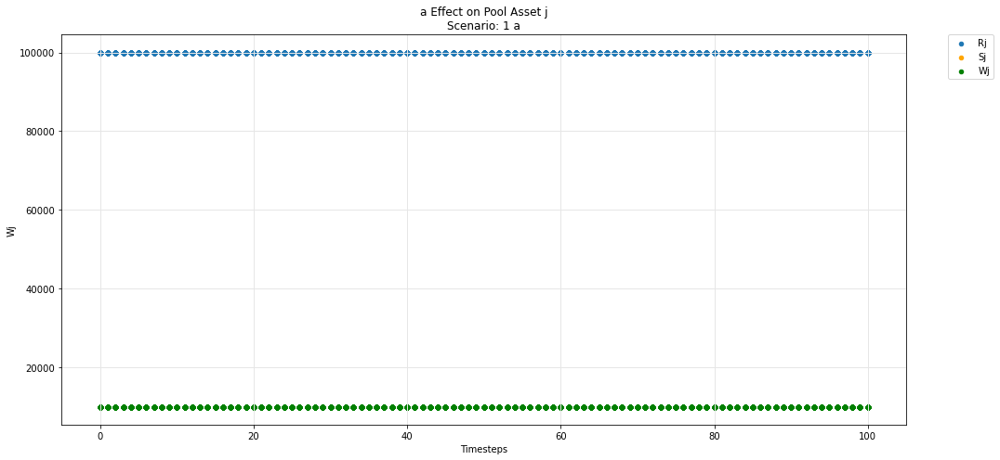

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

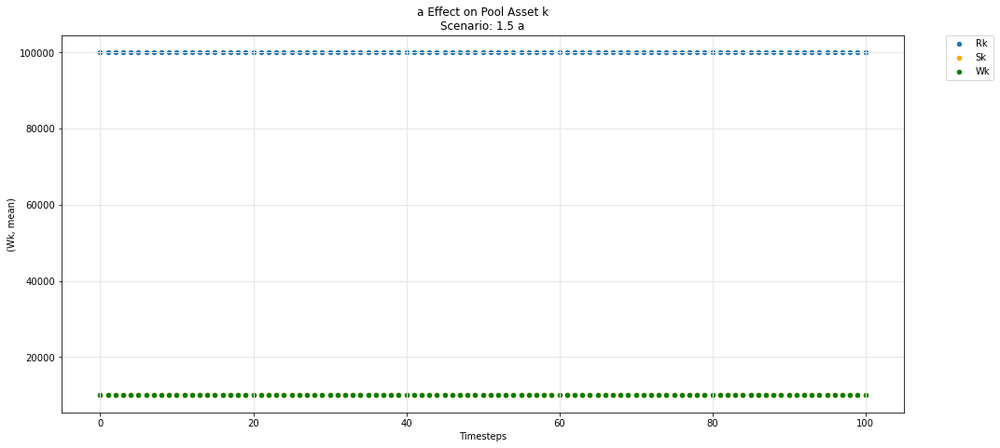

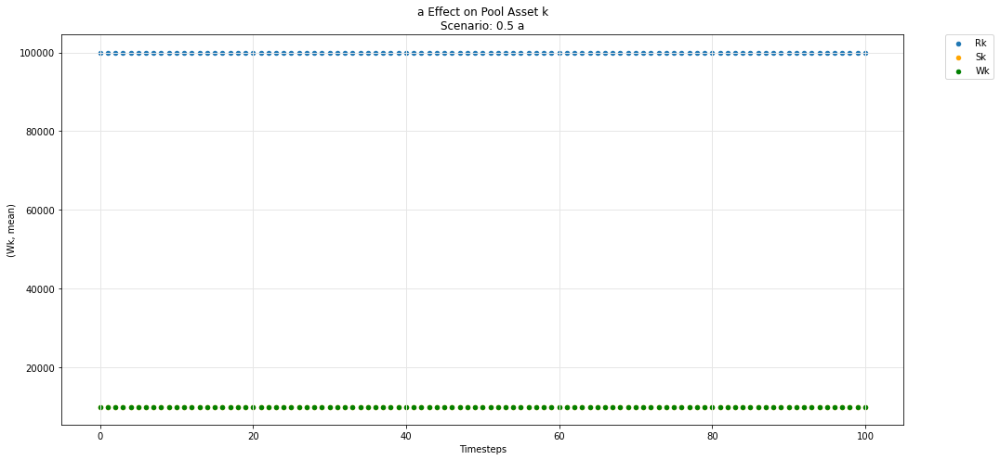

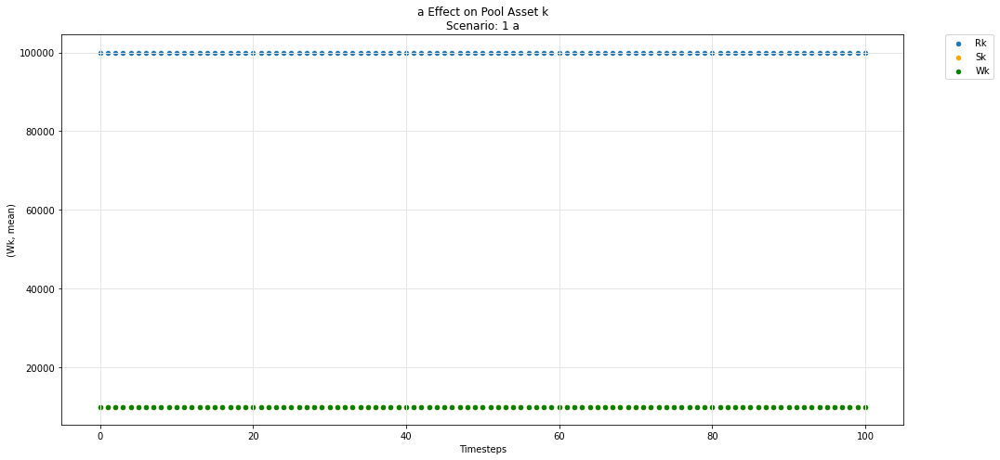

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

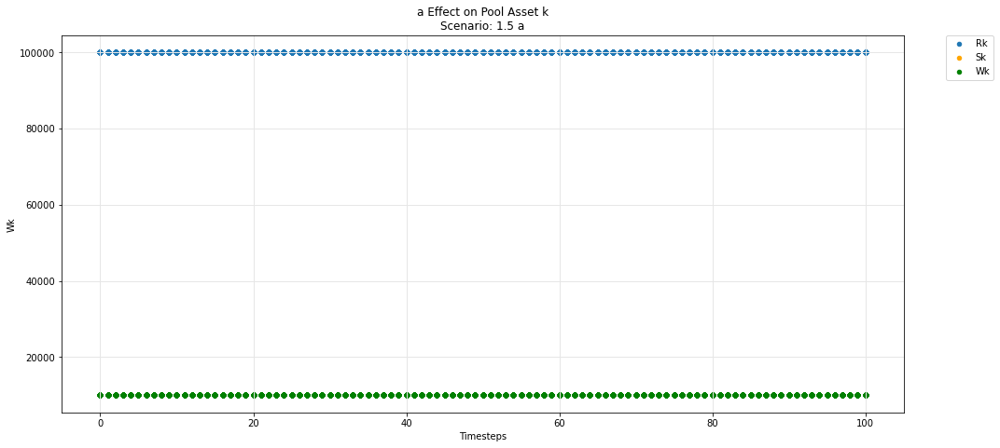

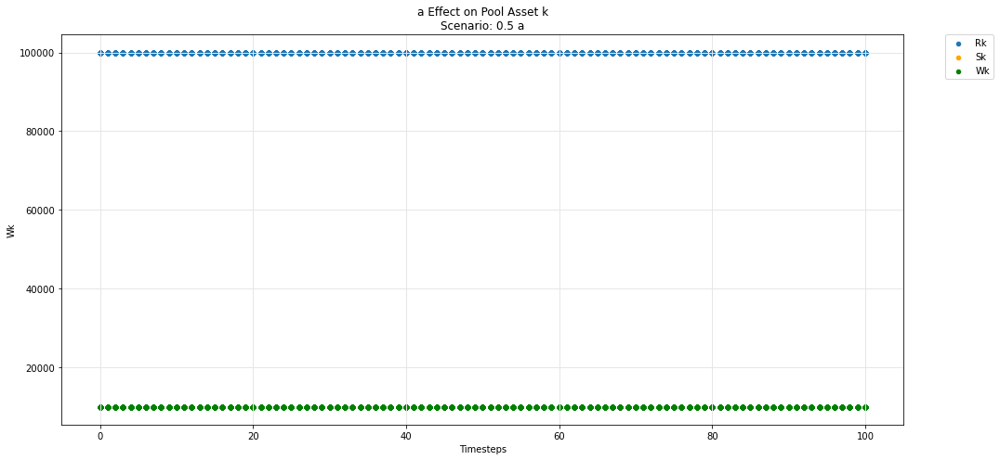

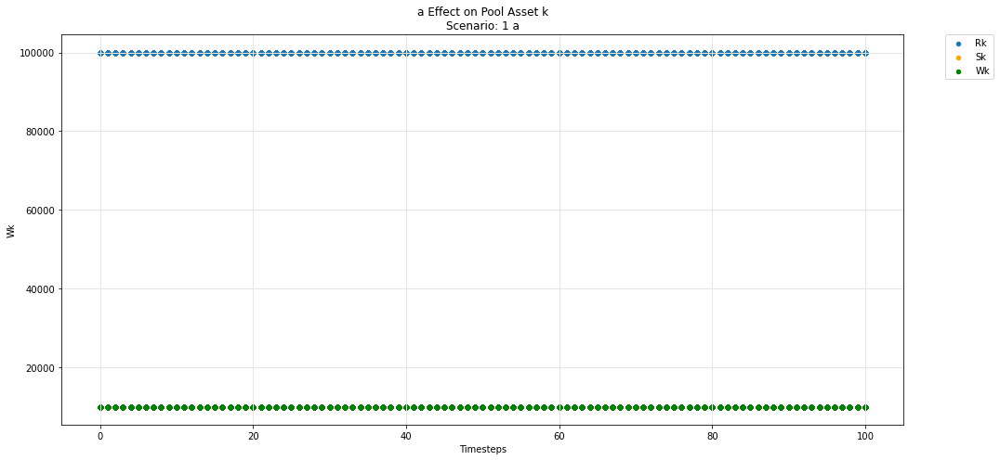

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

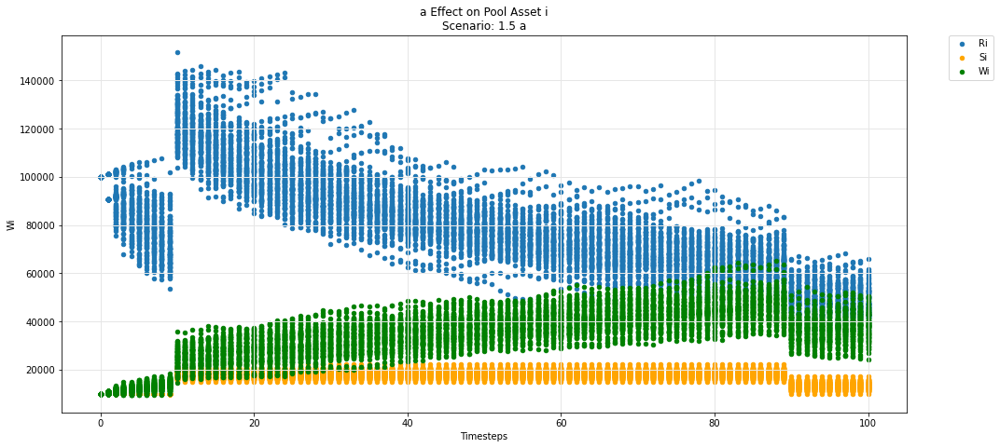

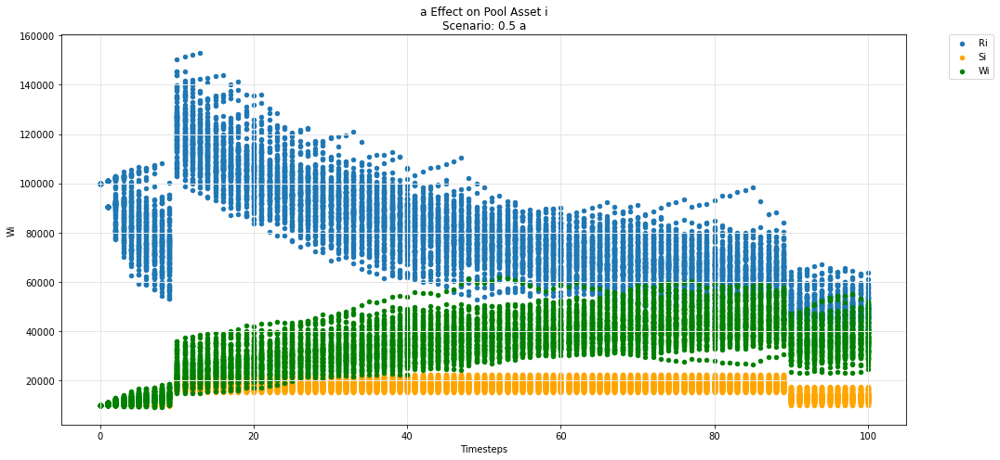

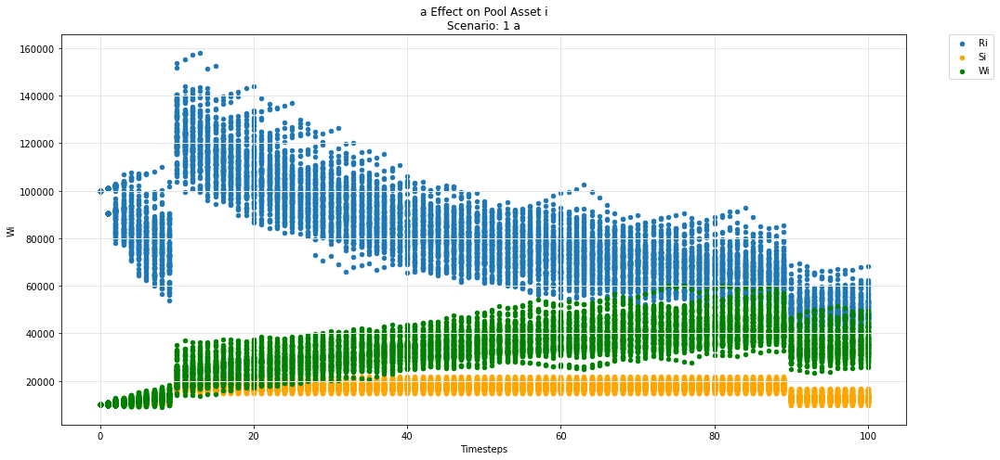

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

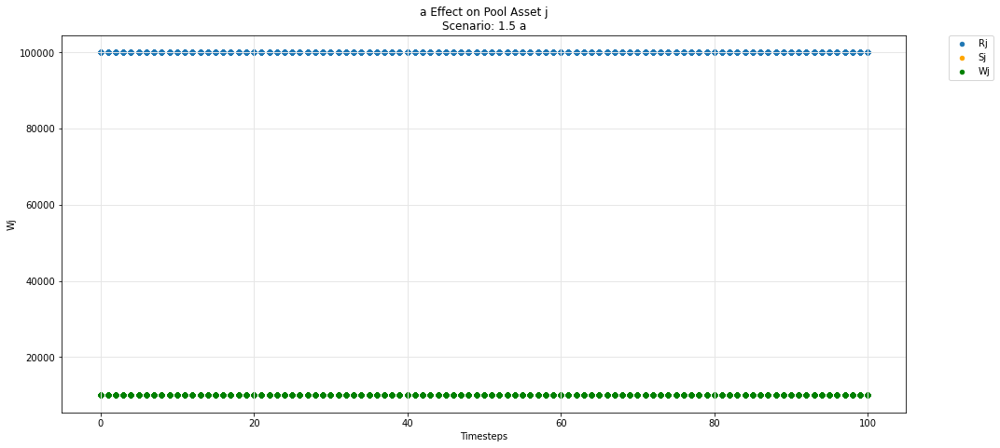

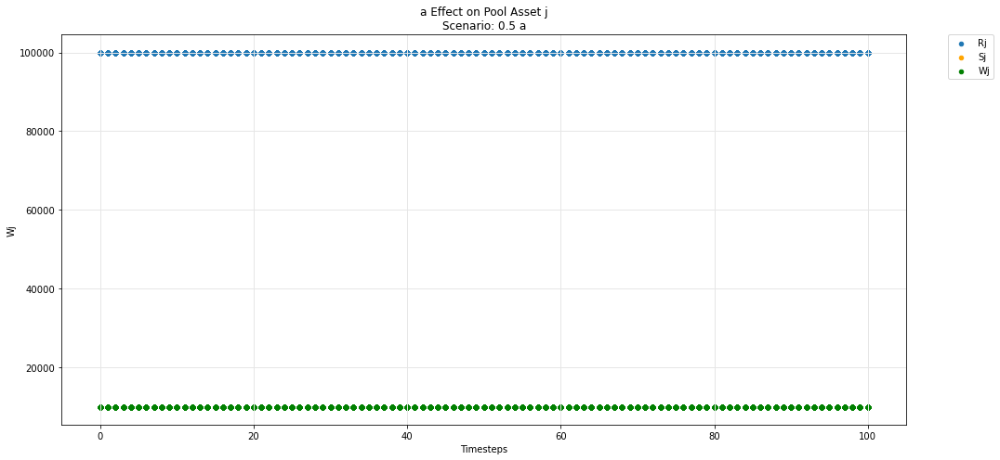

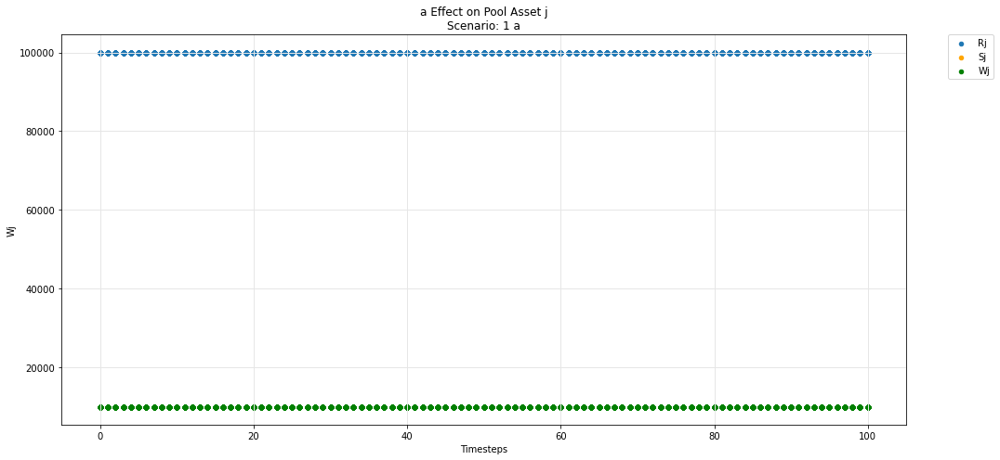

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

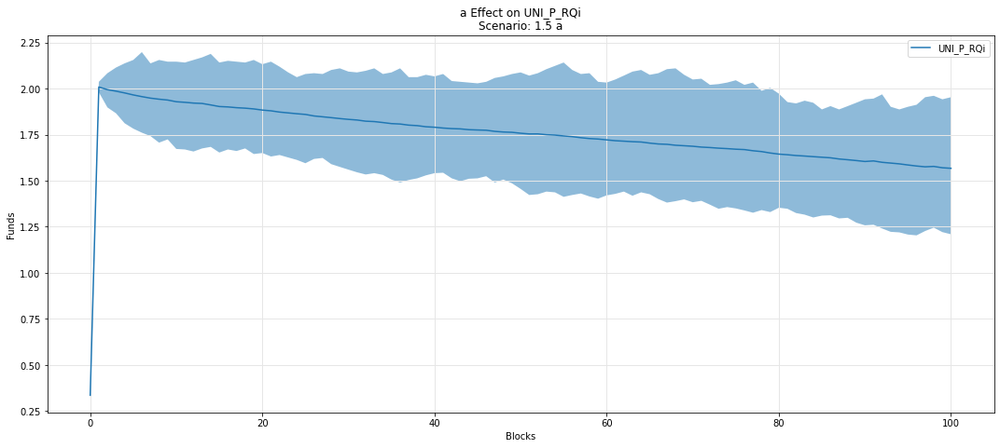

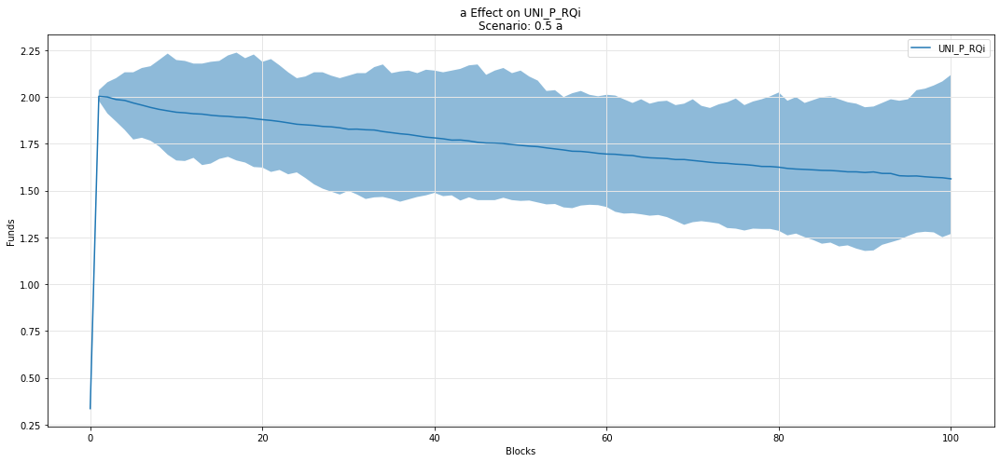

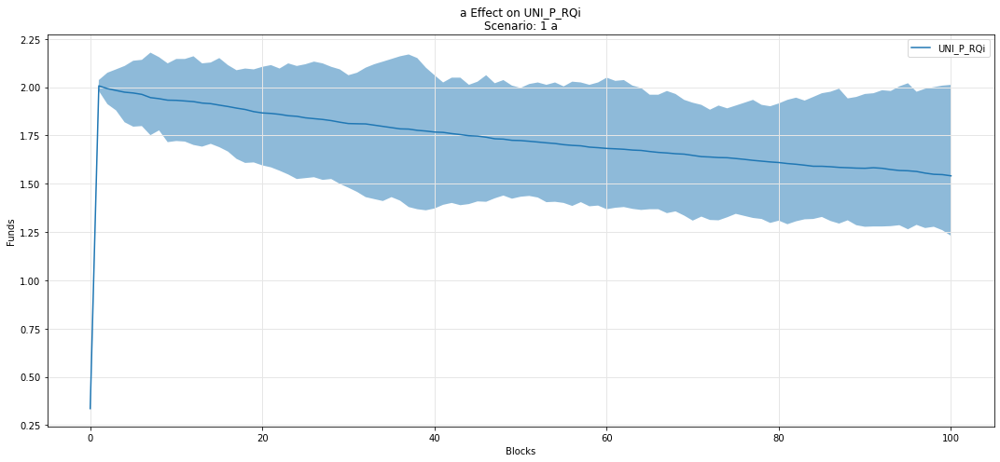

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

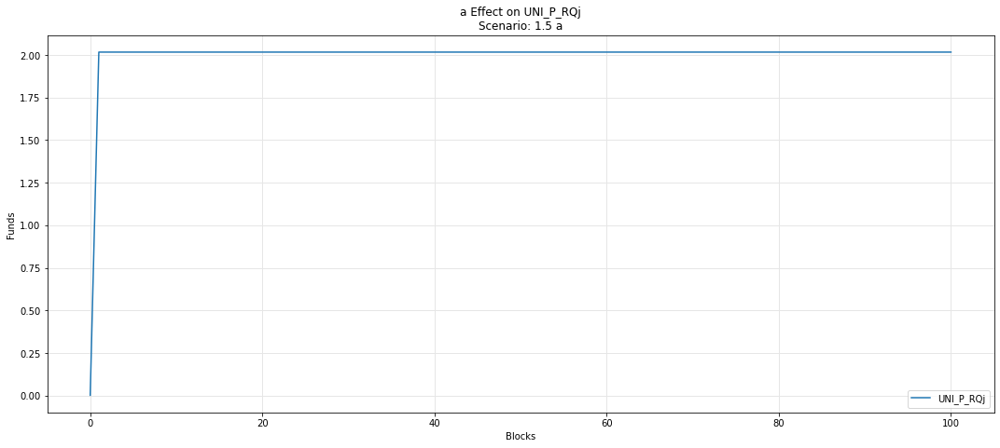

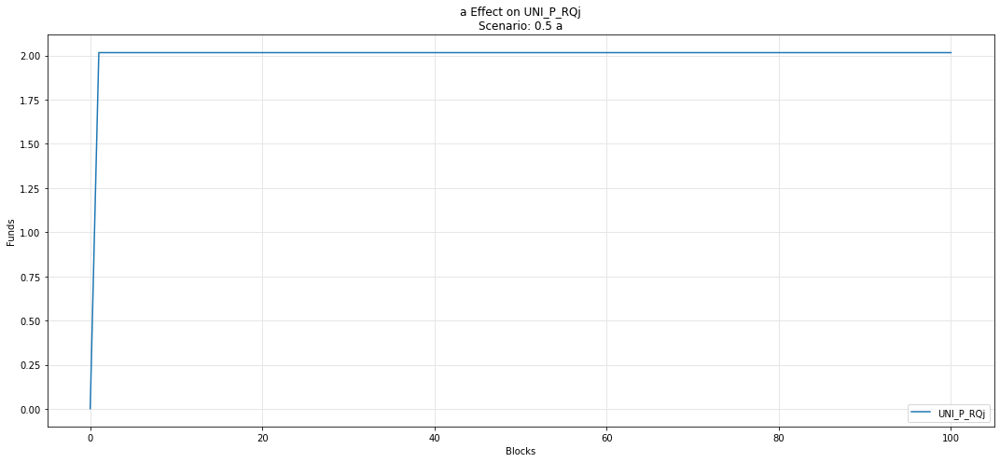

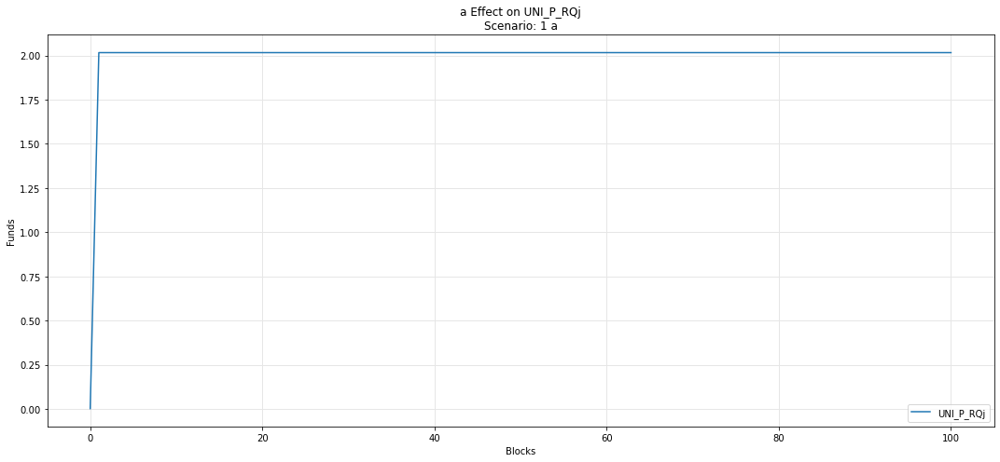

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

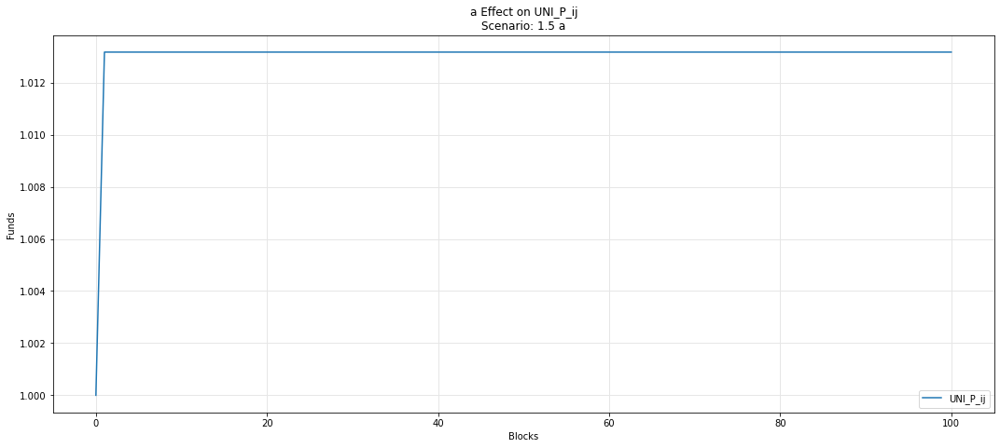

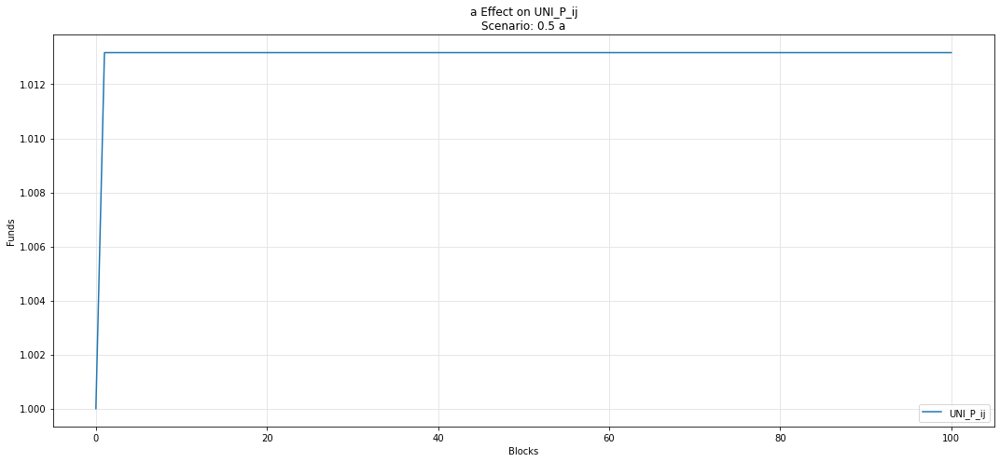

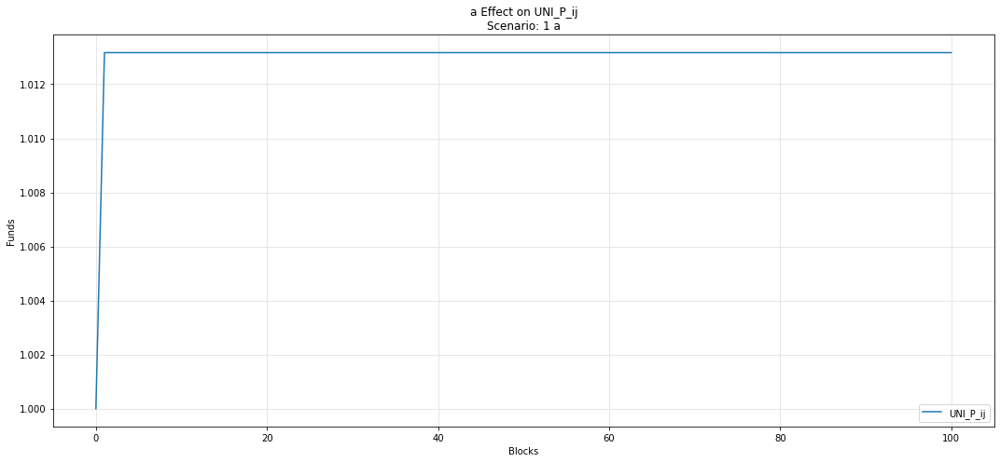

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

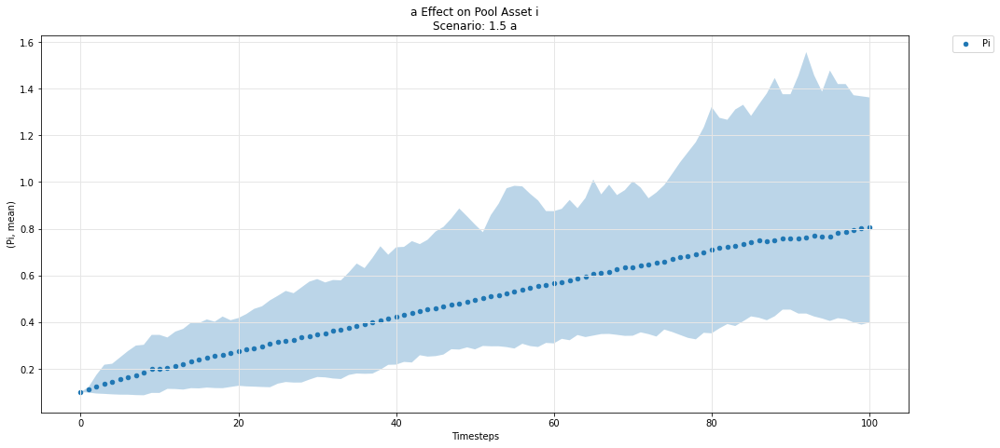

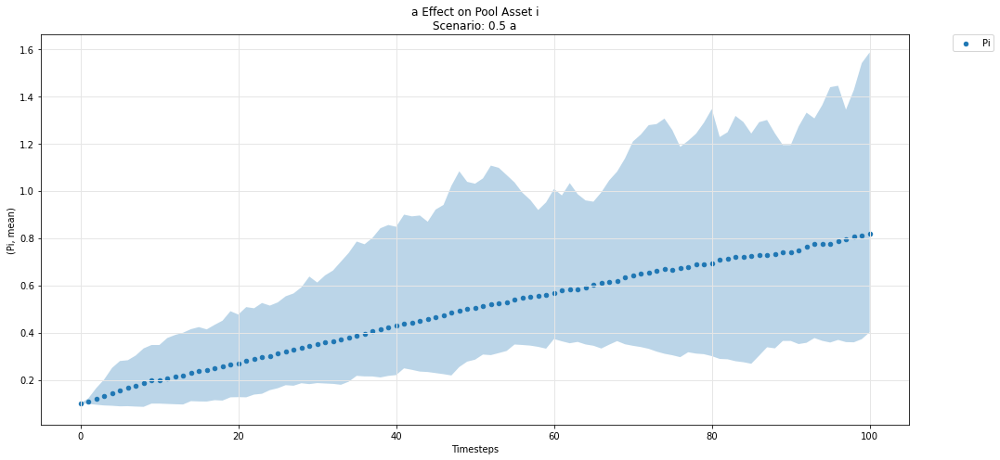

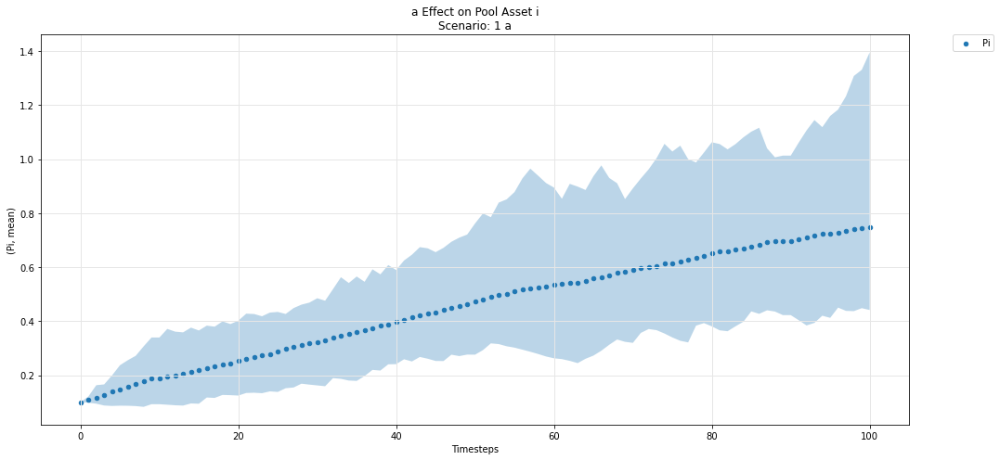

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

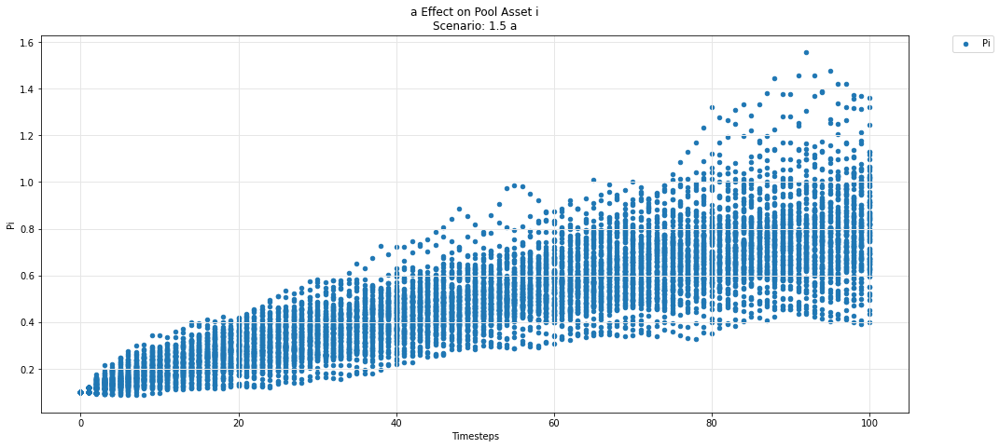

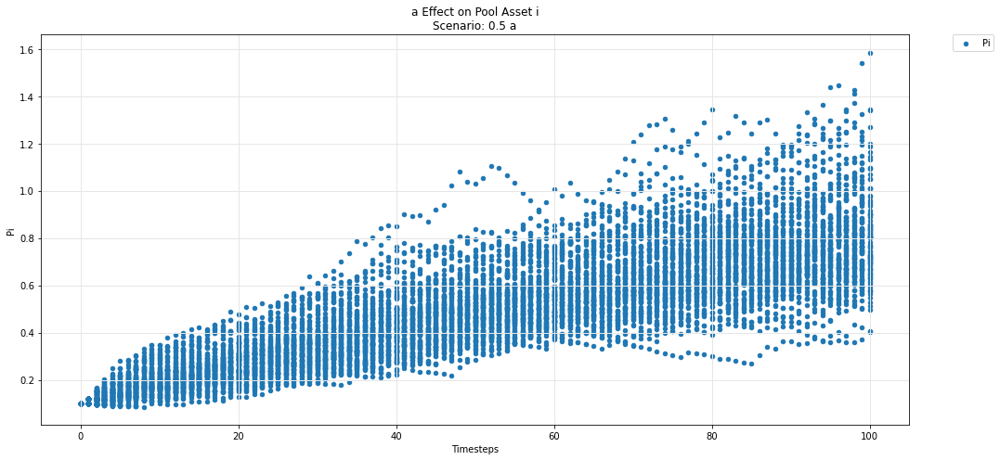

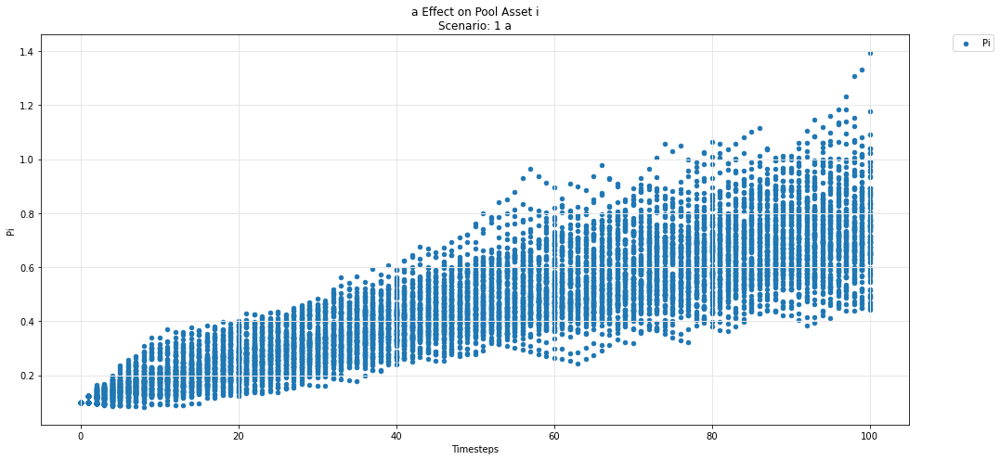

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

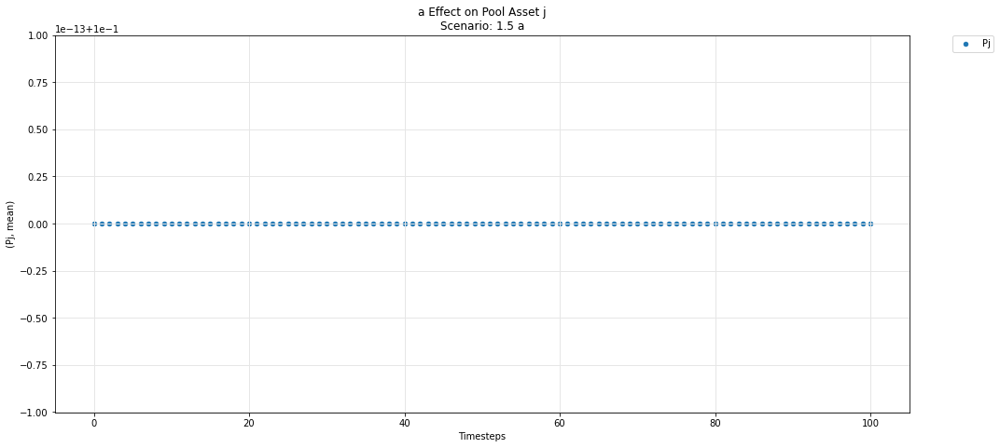

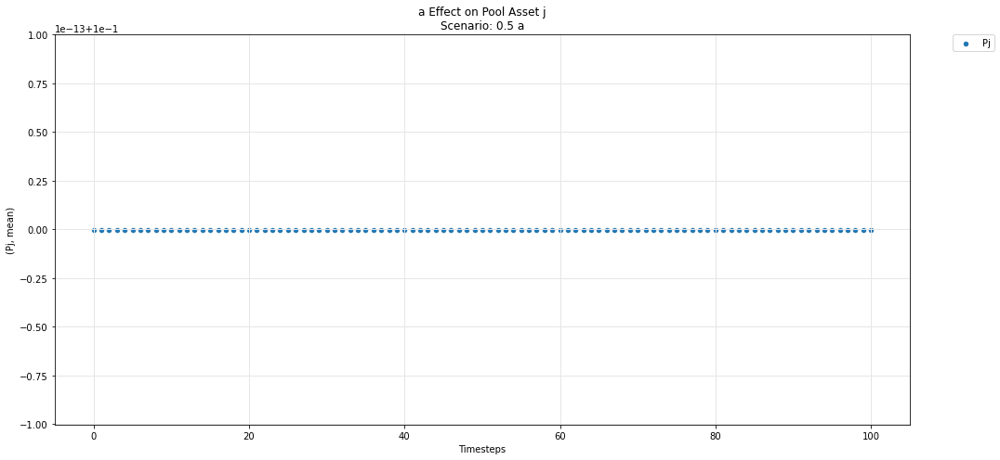

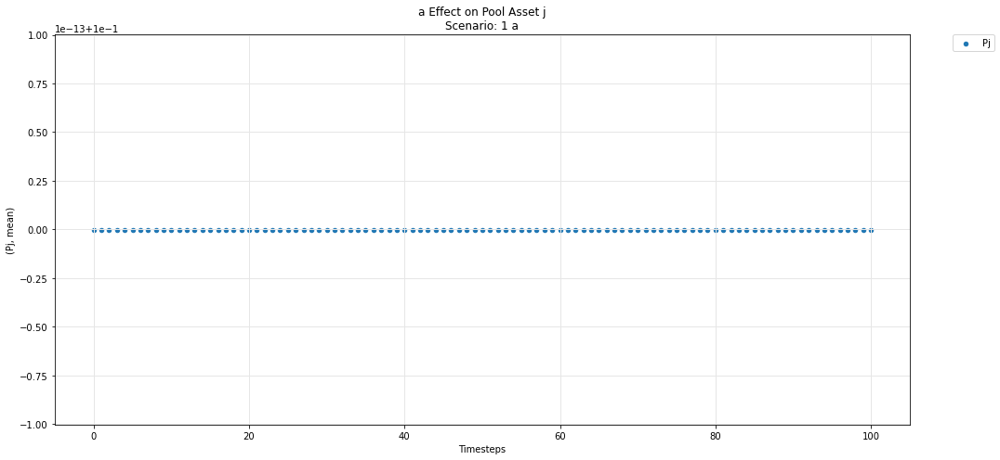

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

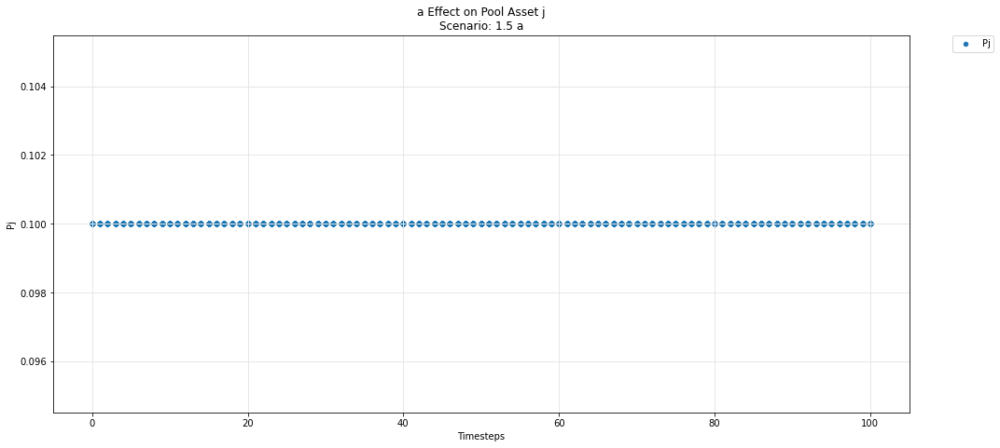

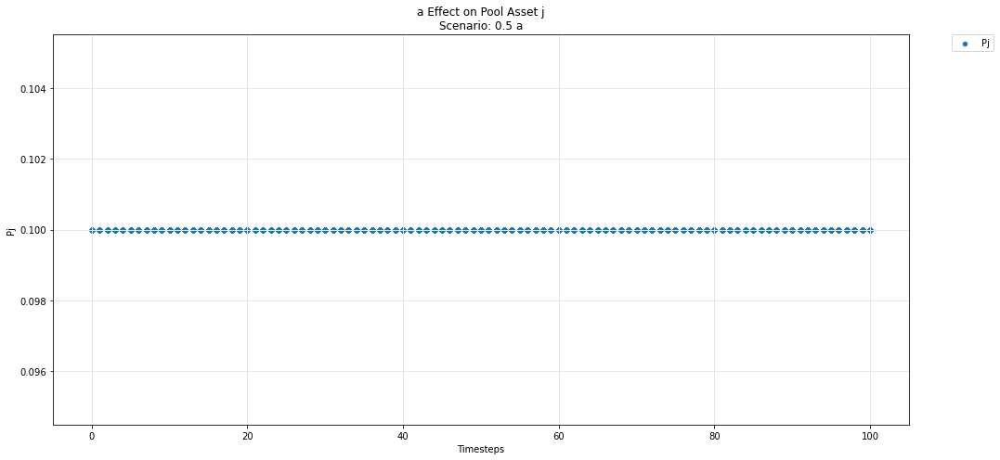

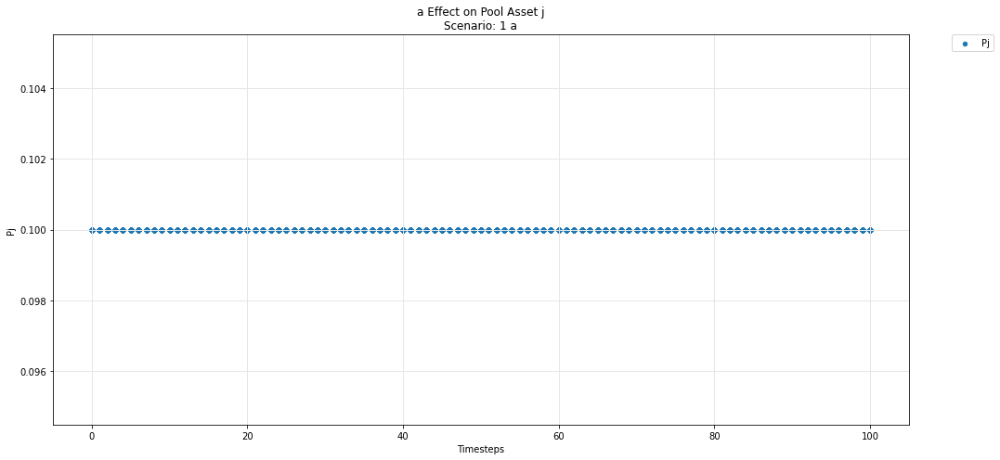

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

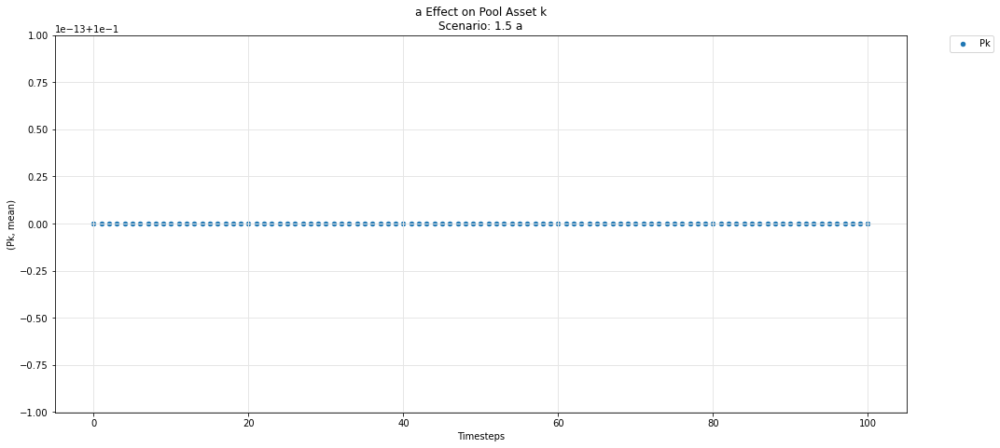

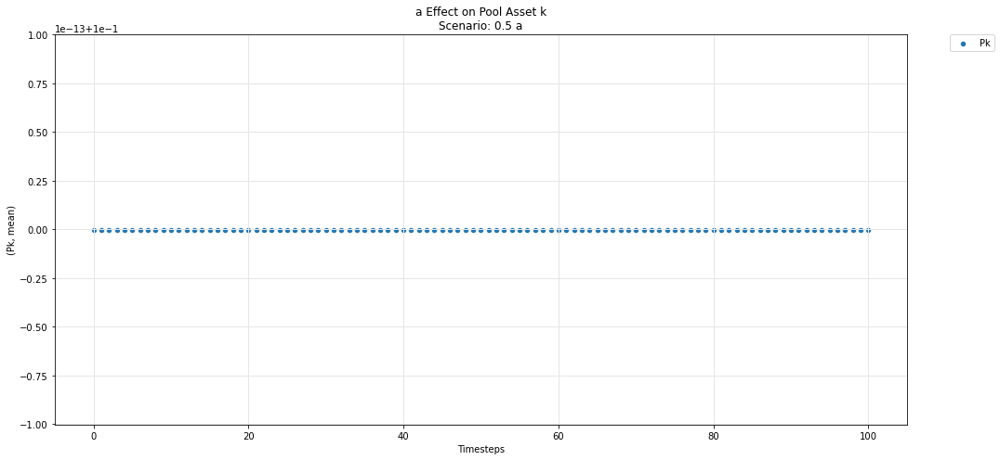

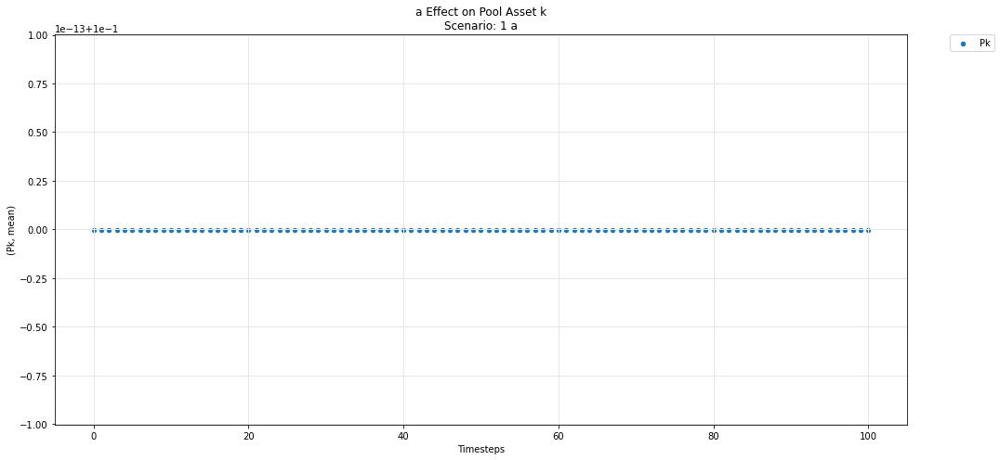

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

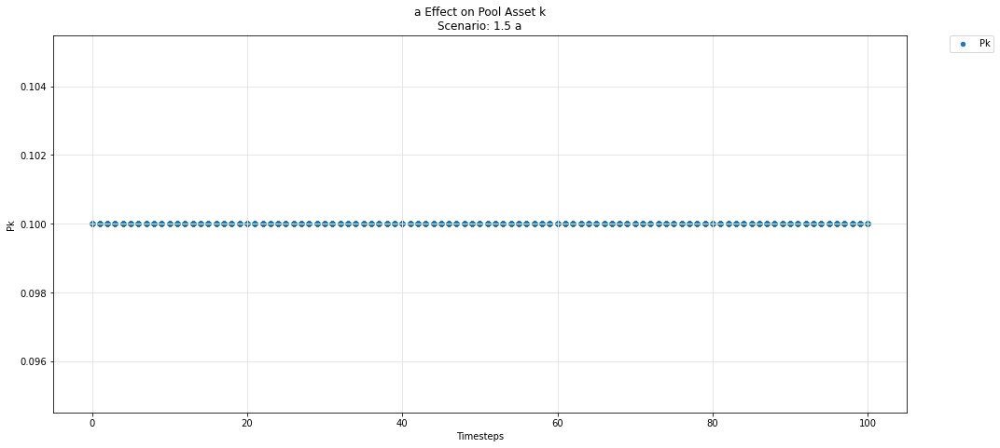

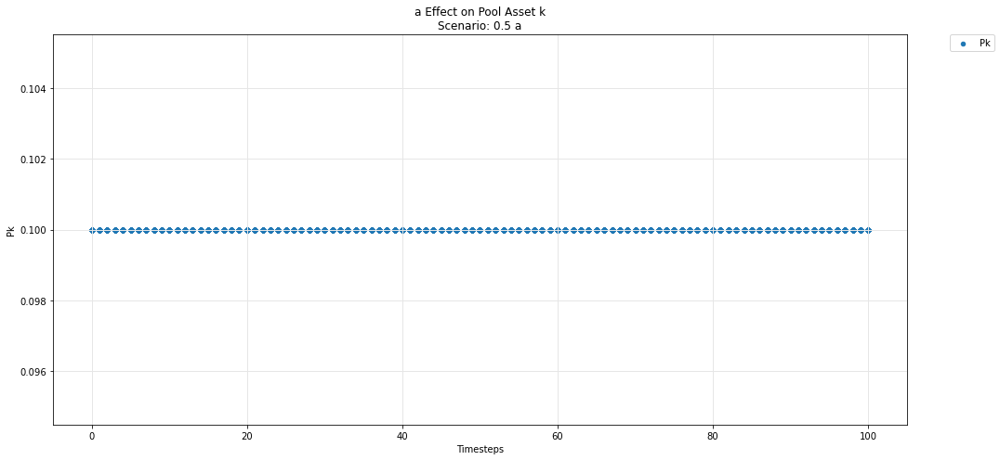

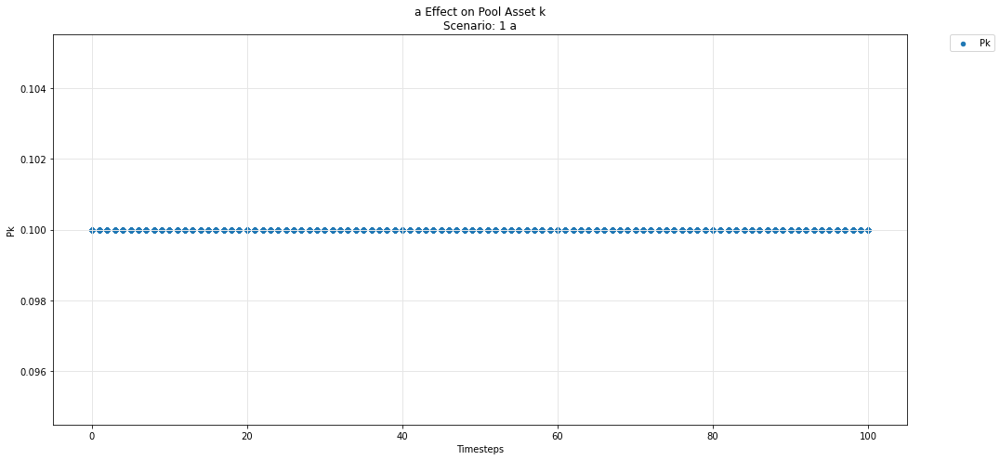

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')